<html>
    <h2>1.Installing Dependencies</h2>
</html>

In [1]:
!pip install tensorflow==2.11.0
!pip install gym
!pip install keras
!pip install keras-rl2
!pip install stable_baselines3
!pip install numpy --upgrade 

<html>
    <h2>2.Importing Required Packages</h2>
</html>

In [2]:
from gym import Env
from gym.spaces import Discrete, Box
from floris.tools import FlorisInterface
import matplotlib.pyplot as plt
import numpy as np
import math
import gym
import stable_baselines3.common.env_checker
import random
import statistics
from os import path
from gym import spaces
from floris.tools.visualization import visualize_cut_plane

<html>
    <h2>3.Creating a Custom Environment(Wind_farm) using openAI gym</h2>
</html>

In [3]:
class wind_farm(gym.Env):
    global a1,a2,p1,p2
    a1=[]
    a2=[]
    p1=[]
    p2=[]
    def __init__(self):
        # Actions we can take are Absolute Angle Representation (theta(0-360 deg))
        self.action_space = Box(low=np.array([0,0]),high=np.array([360,360]))
        # dataframe least and highest values
        self.observation_space = Box(low=np.array([0,1,1,0,-1,-0.5]), high=np.array([360,18,18,1,1.5,0.5]))
        # Set state space
        n=2
        self.state = np.array([random.randint(0,n-1),random.sample(range(1,18),2),random.sample(range(0,360),2)],dtype=object)

    
    def farm_power(self,wind_d,wind_s,s1,s2):
        
        
        fi = FlorisInterface("inputs/gch.yaml")
        
        fi.floris.solver

        # 2. Modify the inputs with a more complex wind turbine layout
        D = 126.0  # Design the layout based on turbine diameter
        x = [6 * D,0]
        y = [5 * D, 0]

        # Pass the new data to FlorisInterface
        fi.reinitialize(
            layout_x=x,
            layout_y=y,
            wind_directions=wind_d,
            wind_speeds=wind_s
        )

        yaw_angles_1 = np.zeros( (2, 1, 2) )  # Construct the yaw array with dimensions for two wind directions, one wind speed, and two turbines
        yaw_angles_1[0, :, 0] = 50        # yaw the first turbine 25 degrees
        yaw_angles_1[0, :, 1] = 50        # yaw the second turbine 25 degrees
        # 3. Calculate the velocities at each turbine for all atmospheric conditions
        a1.append(yaw_angles_1[0].reshape(2,))  
        fi.calculate_wake(yaw_angles=yaw_angles_1)

        # 4. Get the total farm power
        turbine_powers = fi.get_turbine_powers() / 1000.0  # Given in W, so convert to kW
        farm_power_baseline = np.sum(turbine_powers, 2)  # Sum over the third dimension
        
        # 5. Develop the yaw control settings
        yaw_angles_2 = np.zeros( (2, 1, 2) )  # Construct the yaw array with dimensions for two wind directions, one wind speed, and two turbines
        yaw_angles_2[0, :, 0] = s1         # yaw the first turbine s1 degrees
        yaw_angles_2[0, :, 1] = s2            # yaw the second turbine s2 degrees
        
        a2.append(yaw_angles_2[0].reshape(2,))  
        # 6. Calculate the velocities at each turbine for all atmospheric conditions with the new yaw settings
        fi.calculate_wake(yaw_angles=yaw_angles_2)

        # 7. Get the total farm power
        turbine_powers = fi.get_turbine_powers() / 1000.0
        farm_power_yaw = np.sum(turbine_powers, 2)

        # 8. Compare farm power with and without wake steering
        print('farm_power_baseline : {}, farm_power_yaw : {}'.format(farm_power_baseline[0],farm_power_yaw[0]))
        p1.append(farm_power_baseline[0])
        p2.append(farm_power_yaw[0])
        if farm_power_baseline.all()>0:
            difference = 100 * (farm_power_yaw - farm_power_baseline) / farm_power_baseline
        else:
            difference = 100 * (farm_power_yaw - farm_power_baseline)
        
#         print('Predefined_yaw_angle list:',a1)
#         print('Power generated list:',p1)
        x3 = a1
        y3 = p1
        plt.scatter(x3, y3, color ="green")
        plt.title('Scatter Plot of Power generated vs predefined_yaw_angle')
        plt.xlabel('yaw_angle')
        plt.ylabel('Power generated')
        plt.grid()
        plt.show()
        
#         print('Changed_yaw_angle list:',a2)
#         print('Power generated list:',p2)
        x4 = a2
        y4 = p2
        plt.scatter(x4, y4, color ="red")
        plt.title('Scatter Plot of Power generated vs changed_yaw_angle')
        plt.xlabel('yaw_angle')
        plt.ylabel('Power generated')
        plt.grid()
        plt.show()
        
        power_list = [np.amax(farm_power_baseline[0]),np.amax(farm_power_yaw)]
        print('Power_list:',power_list)
        return power_list

    def step(self, action):
        global max_pow 
        max_pow=-1000
        speed = env.observation_space.sample()[1:3]
        # Apply action
        #Absolute angle representation formula
#         print(action)
#         print(action[0])
#         print(action[1])
        self.state1 = math.radians(action[0] - 1*math.radians(180))
        self.state2 = math.radians(action[1] - 2*math.radians(180))
        print('Predefined Yaw Angle 1:',self.state1+50)
        print('Predefined Yaw Angle 2:',self.state2+50)
        print('Changed Yaw Angle 1:',self.state1)
        print('Changed Yaw Angle 2:',self.state2)
        if self.state1 >= 0 and self.state2 >= 0: 
            r = env.farm_power(action,speed,self.state1,self.state2)
            if r[1]>=max_pow:
                #self.reward = env.farm_power(action,speed,self.state1,self.state2)
                self.reward = r[1]
                max_pow=r[1]
                self.baseline_power = r[0]
        #any angle negative,reward is negative
            else: 
                self.reward = -1 
                self.baseline_power = -1
        else:
            self.reward = -1
            self.baseline_power = -1
        # Check if optimization is done
        if self.time_length <= 0: 
            done = True
        else:
            done = False
        # Set placeholder for info
        info = {'power':self.baseline_power}
        
        # Return step information
        return self.observation_space.sample(), self.reward, done, info

    def render(self):
        # Implement viz
        pass
    
    #Assuming that the agent is coming back to original state
    def reset(self):
        self.time_length = 60
        return self.observation_space.sample()

<html>
    <h2>4.Initialising and checking the Environment</h2>
</html>

In [4]:
env = wind_farm()
# stable_baselines3.common.env_checker.check_env(env , warn= True) 

C:\Users\manoh\AppData\Local\Programs\Python\Python310\lib\site-packages\gym\spaces\box.py:73: UserWarning: WARN: Box bound precision lowered by casting to float32
  logger.warn(


<html>
    <h2>5.Importing Packages required to run SAC Algorithm</h2>
</html>

In [5]:
from stable_baselines3.sac.policies import CnnPolicy, MlpPolicy, MultiInputPolicy
from stable_baselines3.sac.sac import SAC
from stable_baselines3 import A2C
import stable_baselines3.common.env_checker

__all__ = ["CnnPolicy", "MlpPolicy", "MultiInputPolicy", "SAC"]

<html>
    <h2>6.Building Model</h2>
</html>

Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Predefined Yaw Angle 1: 55.30922484144998
Predefined Yaw Angle 2: 53.05702428415396
Changed Yaw Angle 1: 5.309224841449984
Changed Yaw Angle 2: 3.0570242841539588
farm_power_baseline : [ 549.0632478  2240.93530118], farm_power_yaw : [1388.83646925 5124.99357321]


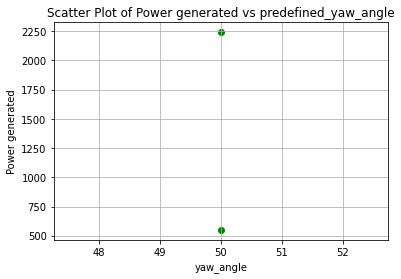

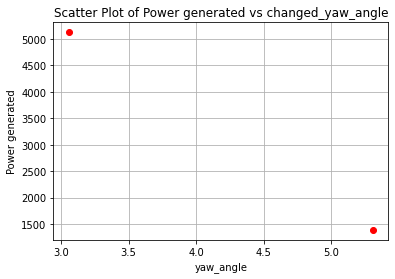

Power_list: [2240.9353011827816, 5153.10018242924]
Predefined Yaw Angle 1: 51.64209995731049
Predefined Yaw Angle 2: 54.4874549772707
Changed Yaw Angle 1: 1.642099957310494
Changed Yaw Angle 2: 4.487454977270703
farm_power_baseline : [   0.         2426.34615351], farm_power_yaw : [   0.         5543.71170276]


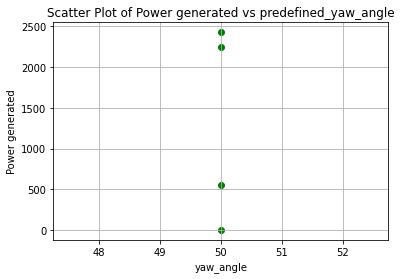

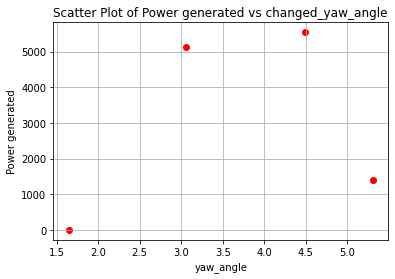

Power_list: [2426.3461535098504, 5561.255151522825]
Predefined Yaw Angle 1: 52.16517448964821
Predefined Yaw Angle 2: 51.3150100019265
Changed Yaw Angle 1: 2.165174489648211
Changed Yaw Angle 2: 1.3150100019265052
farm_power_baseline : [56.63739078  0.        ], farm_power_yaw : [282.02166332   0.        ]


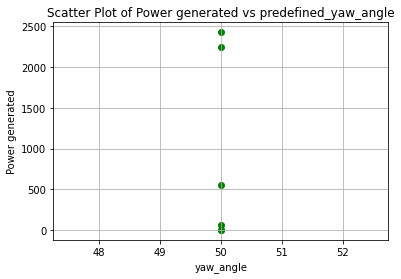

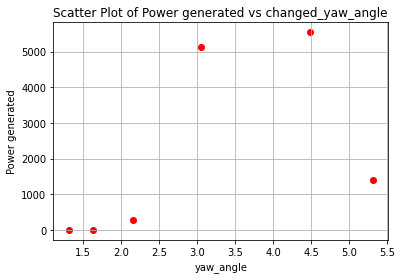

Power_list: [56.63739078067958, 282.37576132048247]
Predefined Yaw Angle 1: 51.74874477842412
Predefined Yaw Angle 2: 54.45942201100431
Changed Yaw Angle 1: 1.7487447784241175
Changed Yaw Angle 2: 4.45942201100431
farm_power_baseline : [8186.95569971   66.05270805], farm_power_yaw : [9999.99713757  306.76494045]


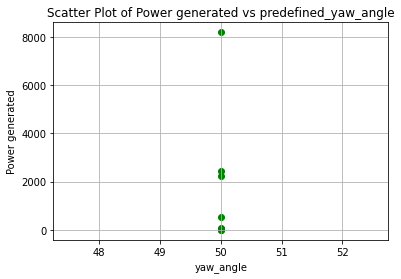

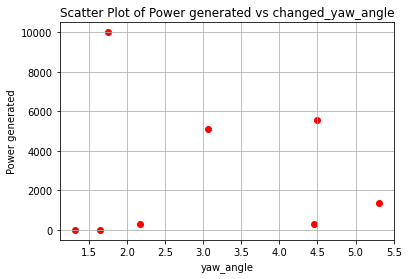

Power_list: [8186.955699713949, 9999.997444905948]
Predefined Yaw Angle 1: 51.72857559422451
Predefined Yaw Angle 2: 52.902672793695146
Changed Yaw Angle 1: 1.7285755942245113
Changed Yaw Angle 2: 2.902672793695146
farm_power_baseline : [1581.0543921   460.05626297], farm_power_yaw : [3660.22300538 1190.56602455]


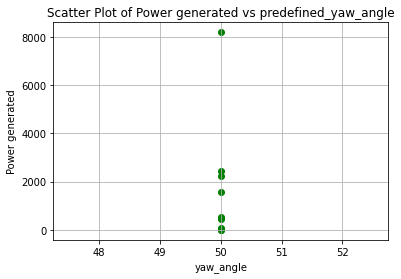

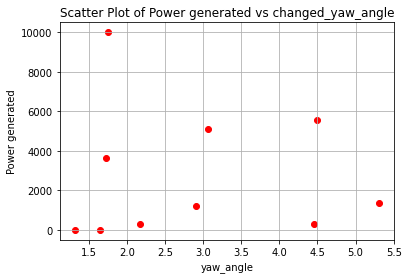

Power_list: [1581.054392095305, 3666.290277132959]
Predefined Yaw Angle 1: 54.36434061301205
Predefined Yaw Angle 2: 50.73017536575028
Changed Yaw Angle 1: 4.36434061301205
Changed Yaw Angle 2: 0.7301753657502787
farm_power_baseline : [9999.99670967 6655.4004707 ], farm_power_yaw : [ 9999.97746206 10000.0054365 ]


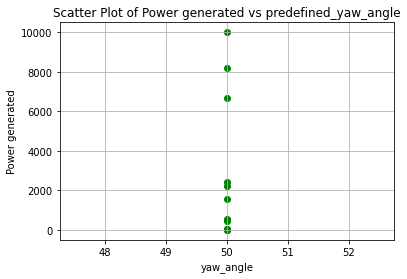

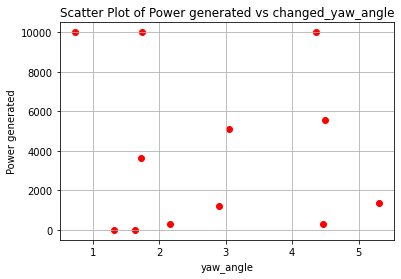

Power_list: [9999.996709671657, 10000.005436503205]
Predefined Yaw Angle 1: 54.38764087570526
Predefined Yaw Angle 2: 50.36952602961109
Changed Yaw Angle 1: 4.387640875705262
Changed Yaw Angle 2: 0.36952602961108594
farm_power_baseline : [ 313.10406421 3992.74389248], farm_power_yaw : [ 862.87912536 9053.96022321]


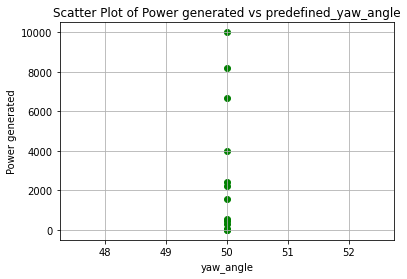

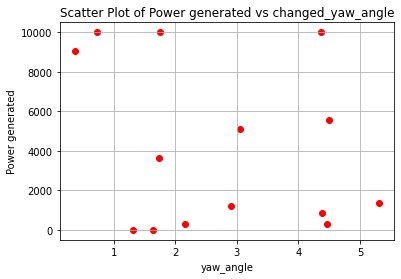

Power_list: [3992.7438924791086, 9078.481534924325]
Predefined Yaw Angle 1: 52.2593242915594
Predefined Yaw Angle 2: 50.38540269747619
Changed Yaw Angle 1: 2.2593242915594005
Changed Yaw Angle 2: 0.38540269747618866
farm_power_baseline : [5493.16429518   88.08801191], farm_power_yaw : [9999.99608352  356.59797353]


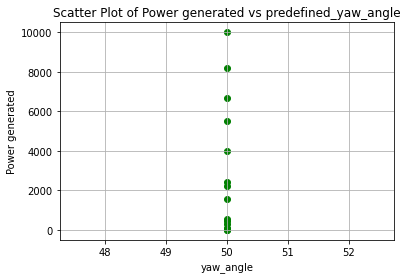

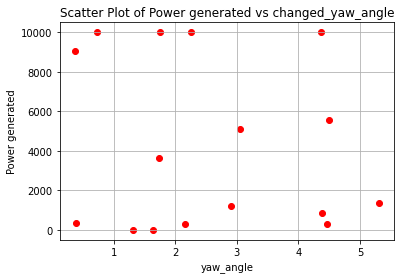

Power_list: [5493.164295178459, 9999.996083516584]
Predefined Yaw Angle 1: 53.633126858837244
Predefined Yaw Angle 2: 54.518140451982816
Changed Yaw Angle 1: 3.633126858837245
Changed Yaw Angle 2: 4.5181404519828146
farm_power_baseline : [ 7852.59308011 10000.00473259], farm_power_yaw : [9999.99599249 9999.98271983]


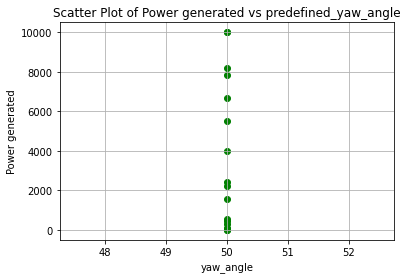

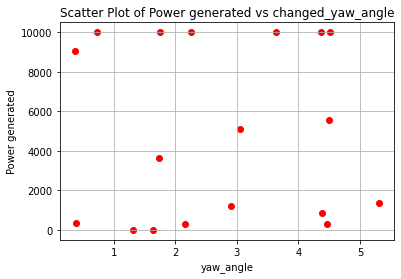

Power_list: [10000.004732589772, 9999.995992492273]
Predefined Yaw Angle 1: 50.02664193633702
Predefined Yaw Angle 2: 51.160565167671486
Changed Yaw Angle 1: 0.026641936337020996
Changed Yaw Angle 2: 1.1605651676714854
farm_power_baseline : [5130.3504694  9999.99615791], farm_power_yaw : [ 9999.9968049  10000.01466118]


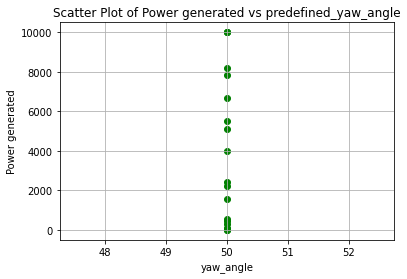

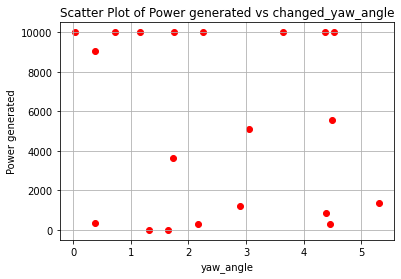

Power_list: [9999.996157910862, 10000.014661175948]
Predefined Yaw Angle 1: 53.47006230424002
Predefined Yaw Angle 2: 51.800052197052906
Changed Yaw Angle 1: 3.4700623042400203
Changed Yaw Angle 2: 1.8000521970529093
farm_power_baseline : [4214.90784492 2815.29595309], farm_power_yaw : [9541.10579433 6444.19992338]


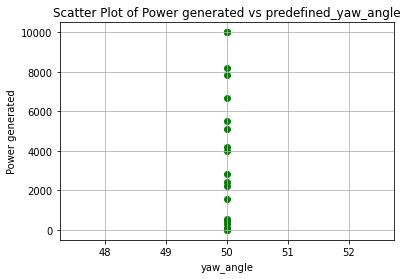

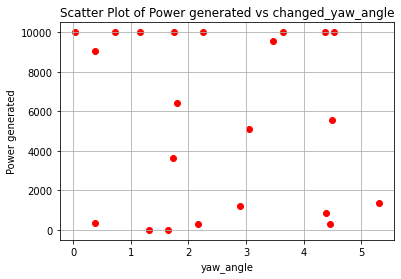

Power_list: [4214.90784492474, 9560.784639695401]
Predefined Yaw Angle 1: 52.739050151359734
Predefined Yaw Angle 2: 51.381471983248574
Changed Yaw Angle 1: 2.7390501513597343
Changed Yaw Angle 2: 1.3814719832485771
farm_power_baseline : [6974.5771265  5995.33649577], farm_power_yaw : [10000.00464575 10000.00030032]


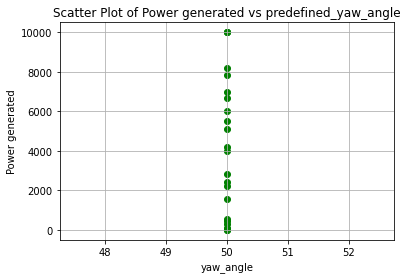

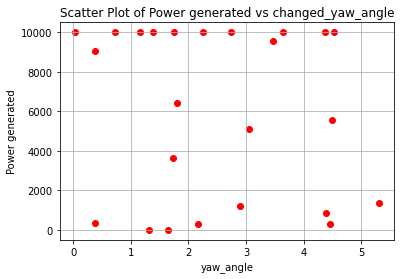

Power_list: [6974.577126502834, 10000.004645753657]
Predefined Yaw Angle 1: 53.39051155195048
Predefined Yaw Angle 2: 55.90291497663568
Changed Yaw Angle 1: 3.3905115519504814
Changed Yaw Angle 2: 5.902914976635676
farm_power_baseline : [9999.98934145 7680.35507786], farm_power_yaw : [10000.01080262  9999.99811442]


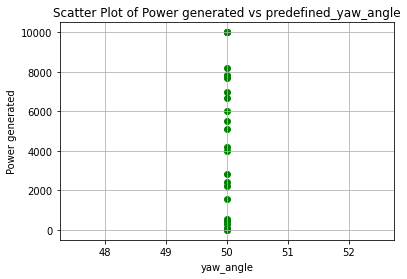

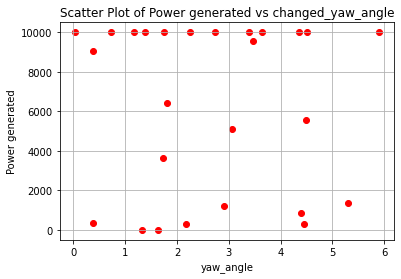

Power_list: [9999.989341450599, 10000.011983907978]
Predefined Yaw Angle 1: 51.94082939994577
Predefined Yaw Angle 2: 50.71883322898374
Changed Yaw Angle 1: 1.9408293999457722
Changed Yaw Angle 2: 0.7188332289837402
farm_power_baseline : [1190.97361966  547.38334442], farm_power_yaw : [2801.73607359 1392.20786836]


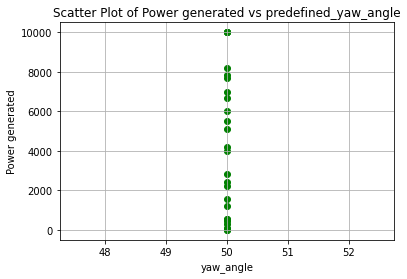

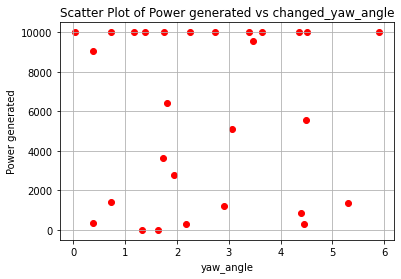

Power_list: [1190.9736196553363, 2801.7360735885204]
Predefined Yaw Angle 1: 50.863347712413336
Predefined Yaw Angle 2: 52.77468393486703
Changed Yaw Angle 1: 0.8633477124133384
Changed Yaw Angle 2: 2.774683934867028
farm_power_baseline : [9999.99292945    0.        ], farm_power_yaw : [10000.00295881     0.        ]


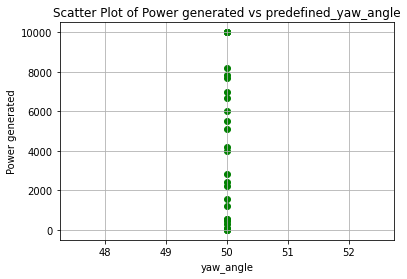

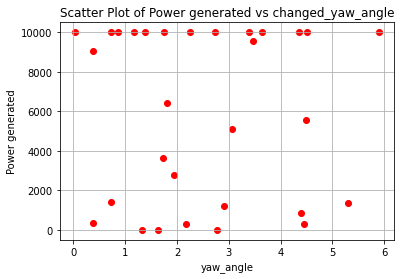

Power_list: [9999.992929454624, 10000.00295881136]
Predefined Yaw Angle 1: 56.19820132912388
Predefined Yaw Angle 2: 54.21945122307999
Changed Yaw Angle 1: 6.198201329123884
Changed Yaw Angle 2: 4.219451223079996
farm_power_baseline : [ 0.         33.70512216], farm_power_yaw : [  0.        216.8856771]


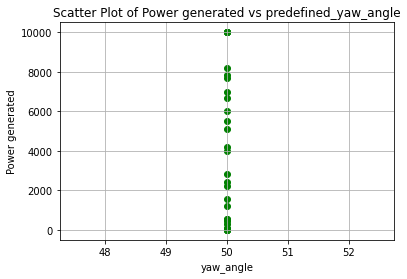

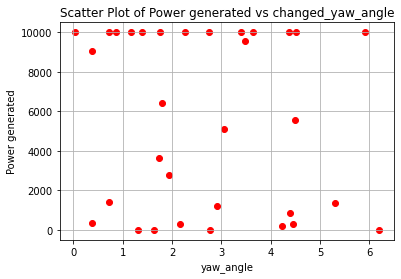

Power_list: [33.70512215500679, 219.81793731474423]
Predefined Yaw Angle 1: 52.52461854565706
Predefined Yaw Angle 2: 53.7008844903614
Changed Yaw Angle 1: 2.524618545657061
Changed Yaw Angle 2: 3.7008844903614015
farm_power_baseline : [2819.97340576   72.66171514], farm_power_yaw : [6449.62725696  324.93809849]


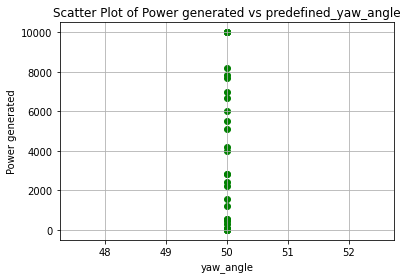

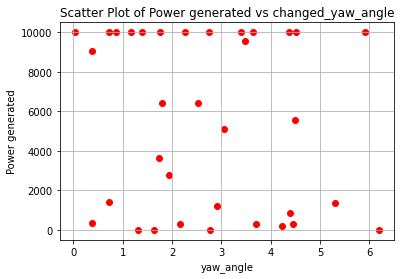

Power_list: [2819.973405756664, 6461.074502339468]
Predefined Yaw Angle 1: 53.81004437847673
Predefined Yaw Angle 2: 55.202692694382236
Changed Yaw Angle 1: 3.810044378476735
Changed Yaw Angle 2: 5.2026926943822325
farm_power_baseline : [9999.99581425    0.        ], farm_power_yaw : [10000.00654266     0.        ]


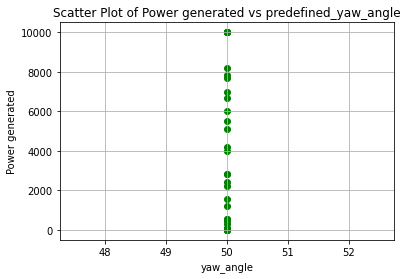

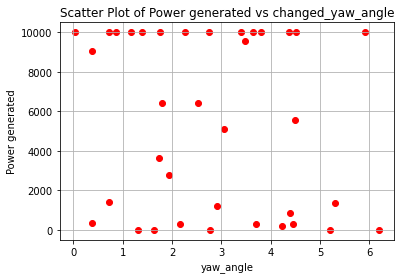

Power_list: [9999.995814246091, 10000.009620490458]
Predefined Yaw Angle 1: 50.96917893781394
Predefined Yaw Angle 2: 55.8486408188843
Changed Yaw Angle 1: 0.9691789378139427
Changed Yaw Angle 2: 5.848640818884297
farm_power_baseline : [7104.65685621 5493.49918781], farm_power_yaw : [10000.00445485  9999.99620195]


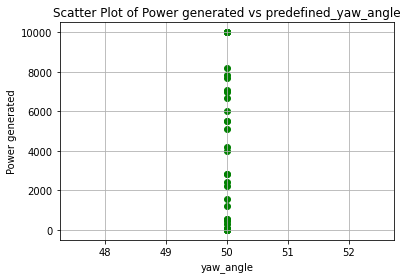

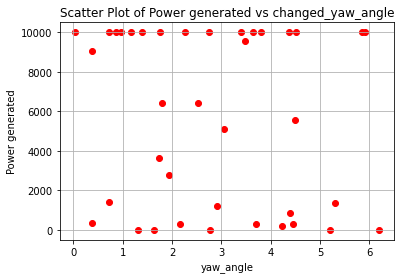

Power_list: [7104.656856213202, 10000.004454854352]
Predefined Yaw Angle 1: 56.129506686701944
Predefined Yaw Angle 2: 51.13657461362372
Changed Yaw Angle 1: 6.129506686701944
Changed Yaw Angle 2: 1.1365746136237247
farm_power_baseline : [10000.00018111   211.9508353 ], farm_power_yaw : [10000.01423689   634.49002877]


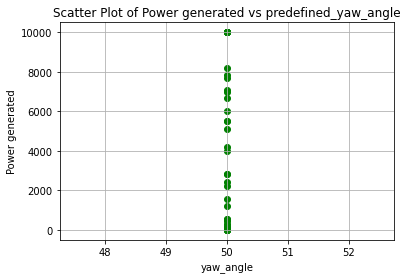

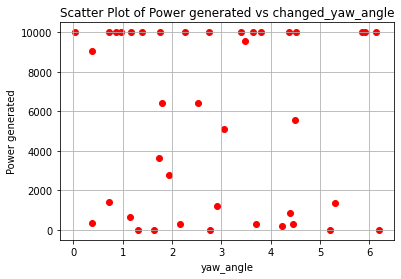

Power_list: [10000.000181106885, 10000.014236886916]
Predefined Yaw Angle 1: 53.78208464914032
Predefined Yaw Angle 2: 52.86954812974063
Changed Yaw Angle 1: 3.78208464914032
Changed Yaw Angle 2: 2.8695481297406316
farm_power_baseline : [2888.50240257 9999.99595554], farm_power_yaw : [ 6619.04486036 10000.0022919 ]


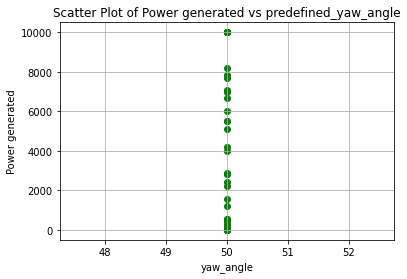

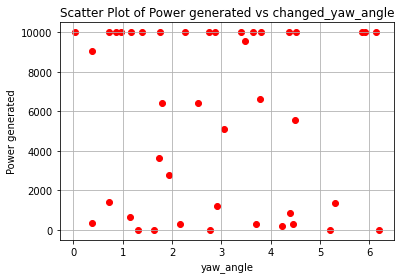

Power_list: [9999.995955535083, 10000.003759519734]
Predefined Yaw Angle 1: 54.69165110046606
Predefined Yaw Angle 2: 49.89673075110325
Changed Yaw Angle 1: 4.691651100466059
Changed Yaw Angle 2: -0.1032692488967498
Predefined Yaw Angle 1: 52.631433675922395
Predefined Yaw Angle 2: 51.34128581450566
Changed Yaw Angle 1: 2.6314336759223953
Changed Yaw Angle 2: 1.341285814505663
farm_power_baseline : [   0.         9596.36640584], farm_power_yaw : [   55.76531418 10000.00117189]


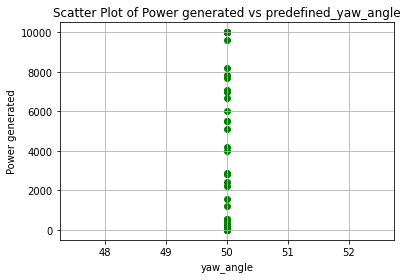

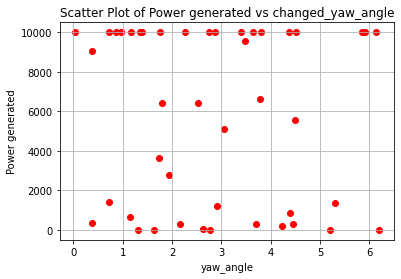

Power_list: [9596.366405843533, 10000.00117188967]
Predefined Yaw Angle 1: 54.05808960451006
Predefined Yaw Angle 2: 52.106636633323376
Changed Yaw Angle 1: 4.058089604510061
Changed Yaw Angle 2: 2.1066366333233764
farm_power_baseline : [   0.        5887.2756007], farm_power_yaw : [   0.         9999.99766802]


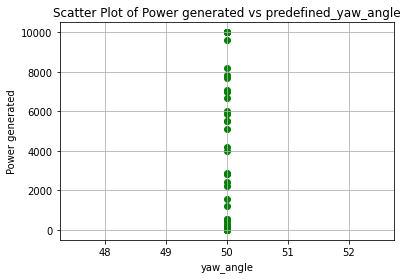

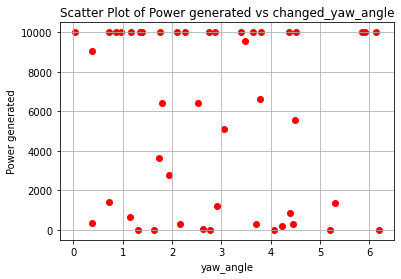

Power_list: [5887.275600698955, 9999.99901178408]
Predefined Yaw Angle 1: 53.4090018793989
Predefined Yaw Angle 2: 49.899785043172486
Changed Yaw Angle 1: 3.4090018793989016
Changed Yaw Angle 2: -0.10021495682751119
Predefined Yaw Angle 1: 53.38071085282288
Predefined Yaw Angle 2: 53.78223127849009
Changed Yaw Angle 1: 3.380710852822881
Changed Yaw Angle 2: 3.78223127849009
farm_power_baseline : [9999.99748088 2948.85121755], farm_power_yaw : [10000.01453944  6716.24424397]


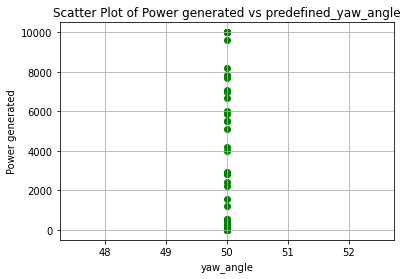

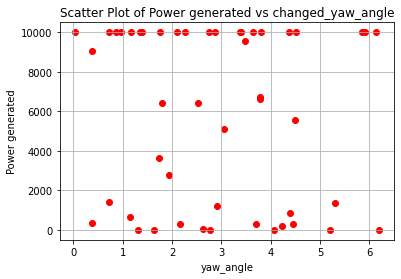

Power_list: [9999.99748088027, 10000.014547636583]
Predefined Yaw Angle 1: 55.82874578478715
Predefined Yaw Angle 2: 50.27150612200379
Changed Yaw Angle 1: 5.828745784787153
Changed Yaw Angle 2: 0.271506122003793
farm_power_baseline : [1223.69828968  211.78404455], farm_power_yaw : [2861.69005518  634.66290302]


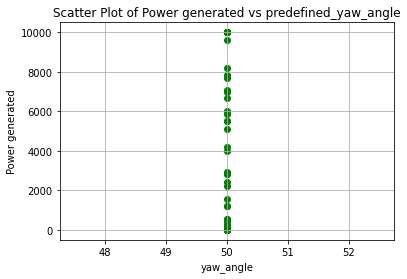

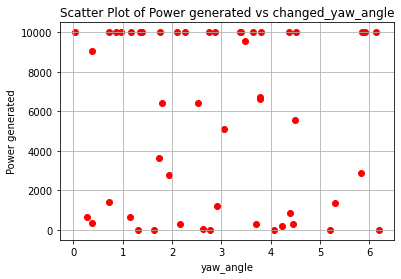

Power_list: [1223.6982896805873, 2876.397182046589]
Predefined Yaw Angle 1: 52.74354556727979
Predefined Yaw Angle 2: 54.82512729189399
Changed Yaw Angle 1: 2.743545567279788
Changed Yaw Angle 2: 4.825127291893992
farm_power_baseline : [235.16243897   0.        ], farm_power_yaw : [683.63036147   0.        ]


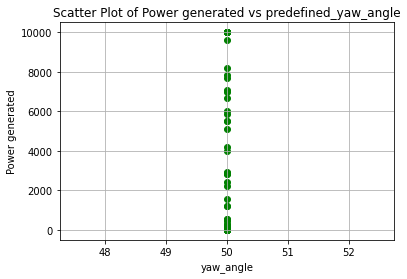

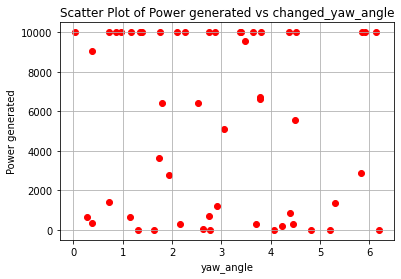

Power_list: [235.16243896653998, 687.0265015723227]
Predefined Yaw Angle 1: 54.83780964214735
Predefined Yaw Angle 2: 54.49982109947638
Changed Yaw Angle 1: 4.837809642147351
Changed Yaw Angle 2: 4.499821099476377
farm_power_baseline : [3.78619930e+03 1.88827744e+00], farm_power_yaw : [8562.28122006  144.77371177]


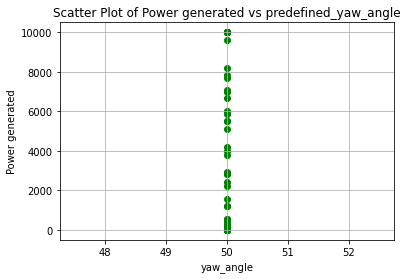

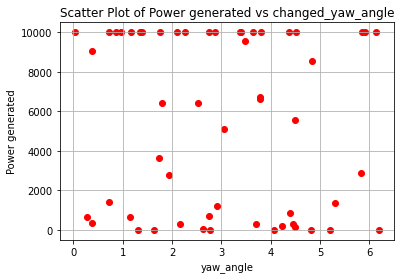

Power_list: [3786.1992968699587, 8613.292309544713]
Predefined Yaw Angle 1: 53.13994218183598
Predefined Yaw Angle 2: 55.9629378339161
Changed Yaw Angle 1: 3.1399421818359783
Changed Yaw Angle 2: 5.9629378339161
farm_power_baseline : [  774.37143219 10000.00525693], farm_power_yaw : [1893.22867948 9999.99440779]


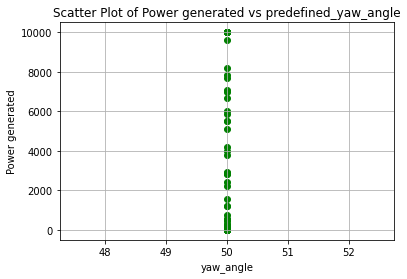

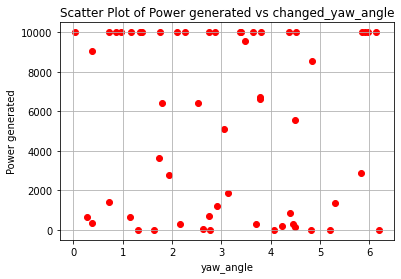

Power_list: [10000.005256928414, 9999.994407785125]
Predefined Yaw Angle 1: 51.395230916372604
Predefined Yaw Angle 2: 53.012049884929134
Changed Yaw Angle 1: 1.3952309163726013
Changed Yaw Angle 2: 3.0120498849291364
farm_power_baseline : [6073.74908238 1756.94085729], farm_power_yaw : [10000.00142062  4049.84337068]


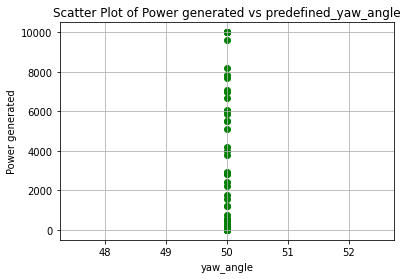

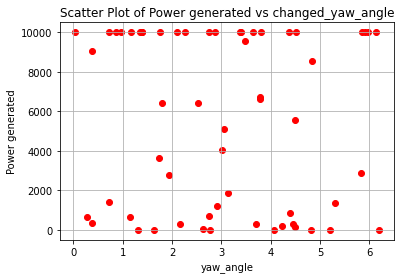

Power_list: [6073.749082379969, 10000.001560275772]
Predefined Yaw Angle 1: 56.0824267923193
Predefined Yaw Angle 2: 53.00735632982398
Changed Yaw Angle 1: 6.082426792319305
Changed Yaw Angle 2: 3.0073563298239807
farm_power_baseline : [2273.78603106 9999.9965119 ], farm_power_yaw : [ 5198.09140023 10000.01391652]


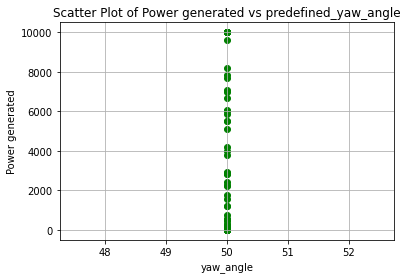

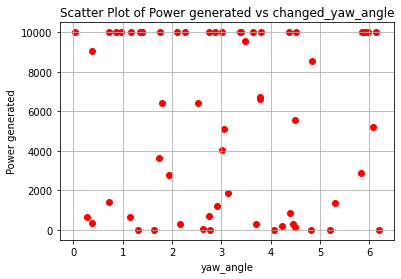

Power_list: [9999.996511904443, 10000.01461686629]
Predefined Yaw Angle 1: 54.66601284865187
Predefined Yaw Angle 2: 55.565509510753614
Changed Yaw Angle 1: 4.666012848651866
Changed Yaw Angle 2: 5.565509510753613
farm_power_baseline : [8738.74673844 5252.73786006], farm_power_yaw : [10000.00315931  9999.9966372 ]


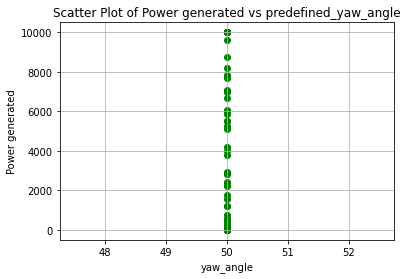

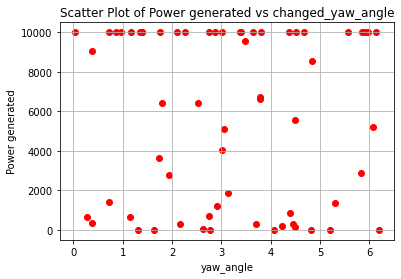

Power_list: [8738.746738441016, 10000.003882063087]
Predefined Yaw Angle 1: 50.498494010571726
Predefined Yaw Angle 2: 52.539439991561494
Changed Yaw Angle 1: 0.49849401057172393
Changed Yaw Angle 2: 2.5394399915614945
farm_power_baseline : [9324.3317848  1848.85735362], farm_power_yaw : [10000.00229386  4266.81955415]


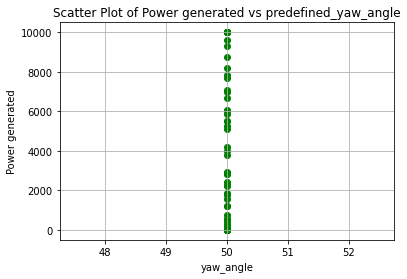

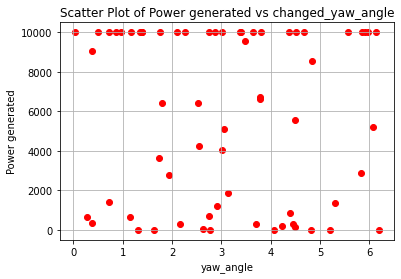

Power_list: [9324.331784795413, 10000.00229386146]
Predefined Yaw Angle 1: 50.35301264417661
Predefined Yaw Angle 2: 53.612486184298405
Changed Yaw Angle 1: 0.3530126441766111
Changed Yaw Angle 2: 3.6124861842984015
farm_power_baseline : [   0.         7180.30331433], farm_power_yaw : [   58.75054544 10000.00388759]


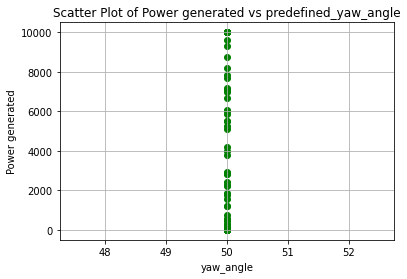

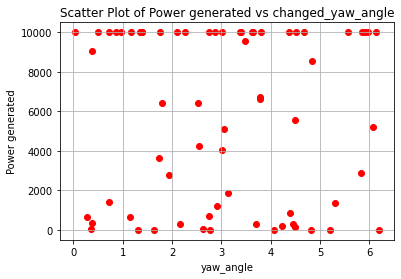

Power_list: [7180.303314333788, 10000.003887585397]
Predefined Yaw Angle 1: 51.21896467277769
Predefined Yaw Angle 2: 53.98649520146695
Changed Yaw Angle 1: 1.2189646727776902
Changed Yaw Angle 2: 3.9864952014669495
farm_power_baseline : [ 9999.9877314  10000.00512145], farm_power_yaw : [10000.0078401   9999.99102982]


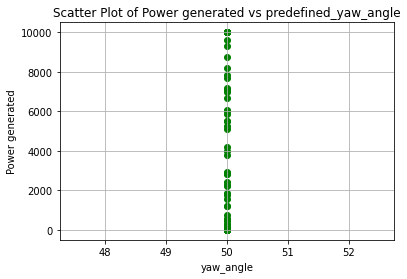

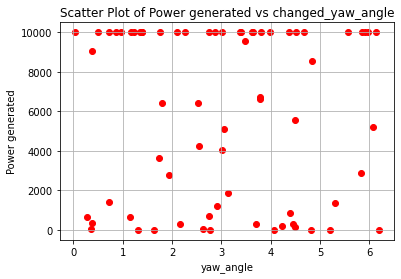

Power_list: [10000.005121454984, 10000.007840098773]
Predefined Yaw Angle 1: 55.750327941225336
Predefined Yaw Angle 2: 52.46767605598324
Changed Yaw Angle 1: 5.7503279412253345
Changed Yaw Angle 2: 2.4676760559832385
farm_power_baseline : [1929.96587696 4171.34182529], farm_power_yaw : [4422.21947844 9421.1346752 ]


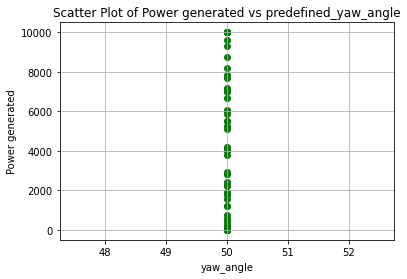

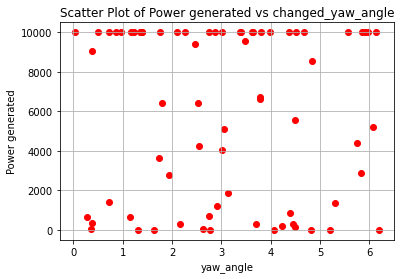

Power_list: [4171.341825290191, 9471.393445832406]
Predefined Yaw Angle 1: 53.89122258850842
Predefined Yaw Angle 2: 51.468644569419865
Changed Yaw Angle 1: 3.8912225885084215
Changed Yaw Angle 2: 1.4686445694198684
farm_power_baseline : [4961.06557224 3528.3833302 ], farm_power_yaw : [9724.08947408 7689.7904222 ]


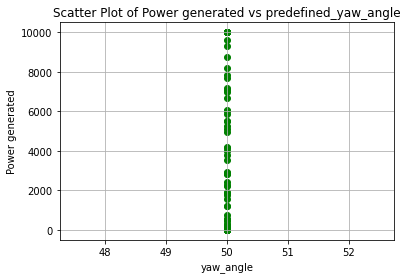

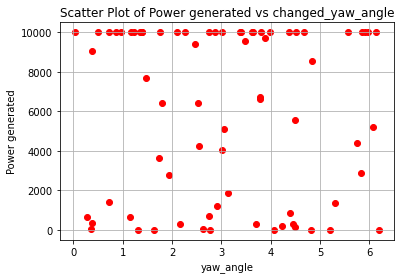

Power_list: [4961.065572241225, 9999.996260763202]
Predefined Yaw Angle 1: 50.000952248063086
Predefined Yaw Angle 2: 54.178147991417845
Changed Yaw Angle 1: 0.0009522480630868121
Changed Yaw Angle 2: 4.178147991417848
farm_power_baseline : [   0.         9999.99116221], farm_power_yaw : [   57.78482115 10000.01572405]


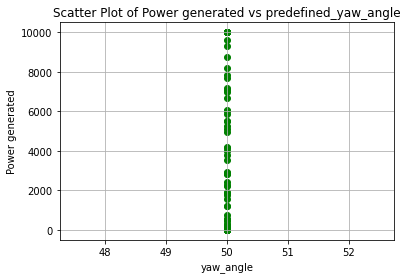

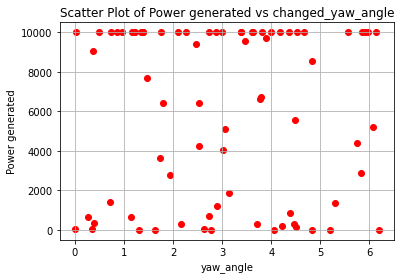

Power_list: [9999.991162208, 10000.016172532423]
Predefined Yaw Angle 1: 54.36105400591078
Predefined Yaw Angle 2: 50.72583521212178
Changed Yaw Angle 1: 4.361054005910783
Changed Yaw Angle 2: 0.7258352121217766
farm_power_baseline : [  0.         351.28910243], farm_power_yaw : [  0.        954.2172235]


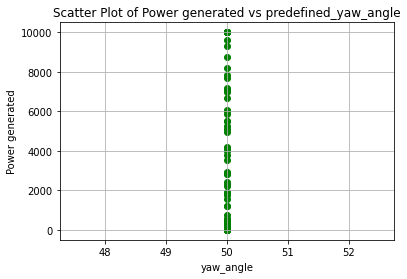

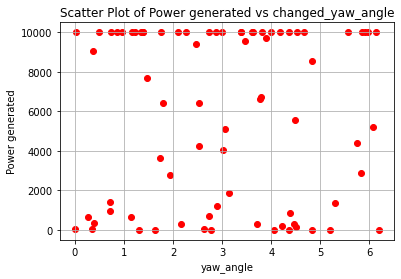

Power_list: [351.28910243482227, 954.2172234970432]
Predefined Yaw Angle 1: 53.327452957343475
Predefined Yaw Angle 2: 53.84960206353415
Changed Yaw Angle 1: 3.327452957343476
Changed Yaw Angle 2: 3.8496020635341517
farm_power_baseline : [0. 0.], farm_power_yaw : [ 0.         62.29667112]


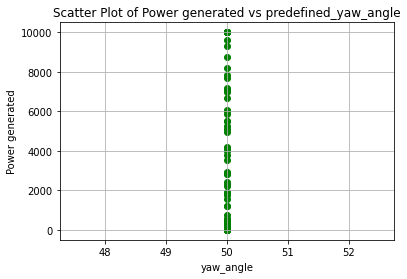

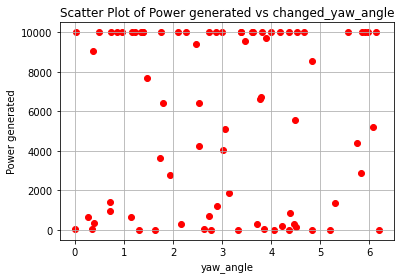

Power_list: [0.0, 62.29667112219326]
Predefined Yaw Angle 1: 55.37380809578106
Predefined Yaw Angle 2: 53.629829221949215
Changed Yaw Angle 1: 5.373808095781059
Changed Yaw Angle 2: 3.6298292219492154
farm_power_baseline : [897.3251311   23.56909557], farm_power_yaw : [2152.09224361  190.04099224]


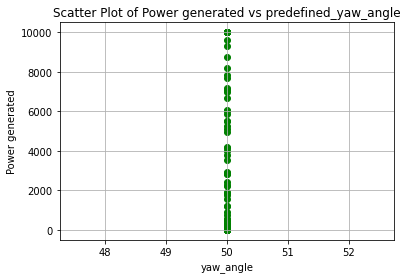

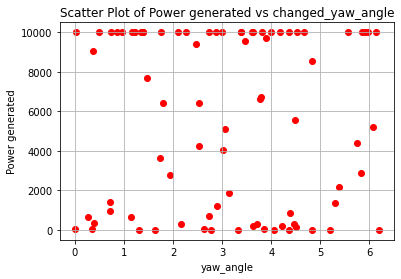

Power_list: [897.3251311023598, 2164.9068229584304]
Predefined Yaw Angle 1: 51.68300091848999
Predefined Yaw Angle 2: 53.30035837821893
Changed Yaw Angle 1: 1.6830009184899855
Changed Yaw Angle 2: 3.3003583782189345
farm_power_baseline : [9999.99698952 4928.50065817], farm_power_yaw : [9999.98944945 9999.99533082]


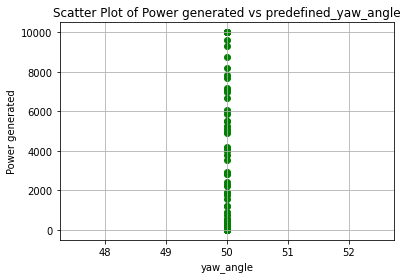

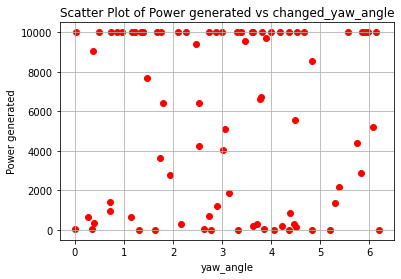

Power_list: [9999.996989521318, 9999.995486925533]
Predefined Yaw Angle 1: 54.627631903653864
Predefined Yaw Angle 2: 52.617020004644374
Changed Yaw Angle 1: 4.627631903653862
Changed Yaw Angle 2: 2.617020004644375
farm_power_baseline : [9999.99026488 1046.79729223], farm_power_yaw : [10000.01338491  2494.83986269]


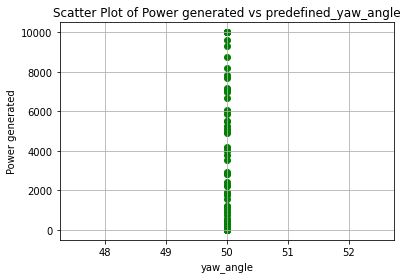

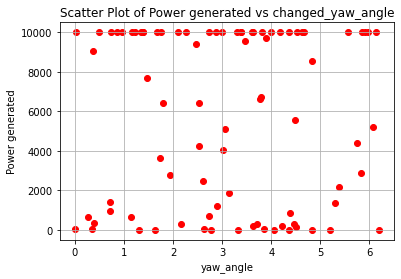

Power_list: [9999.99026487771, 10000.014108239218]
Predefined Yaw Angle 1: 53.91699453100934
Predefined Yaw Angle 2: 53.40121255501634
Changed Yaw Angle 1: 3.916994531009336
Changed Yaw Angle 2: 3.4012125550163446
farm_power_baseline : [6073.6526748    0.       ], farm_power_yaw : [9999.99858848    0.        ]


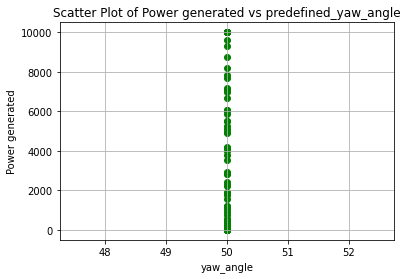

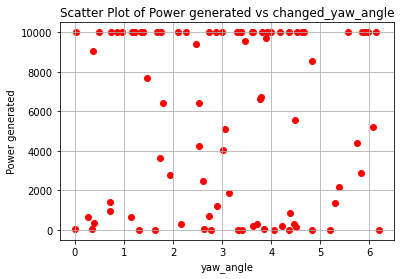

Power_list: [6073.652674795552, 10000.005600281576]
Predefined Yaw Angle 1: 50.878955700613965
Predefined Yaw Angle 2: 54.76595131984021
Changed Yaw Angle 1: 0.8789557006139658
Changed Yaw Angle 2: 4.765951319840213
farm_power_baseline : [313.04235967 208.04408642], farm_power_yaw : [671.77467253 478.4541479 ]


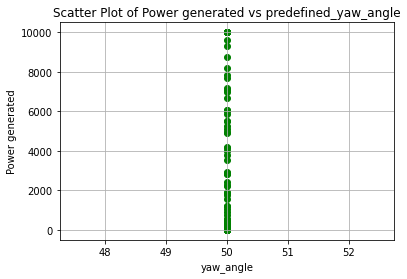

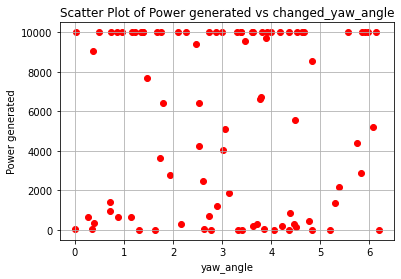

Power_list: [313.0423596729974, 875.1018513322776]
Predefined Yaw Angle 1: 53.72527436308286
Predefined Yaw Angle 2: 54.928434506371474
Changed Yaw Angle 1: 3.7252743630828586
Changed Yaw Angle 2: 4.928434506371474
farm_power_baseline : [7981.488753   2208.90874995], farm_power_yaw : [9999.9947014  5047.39985464]


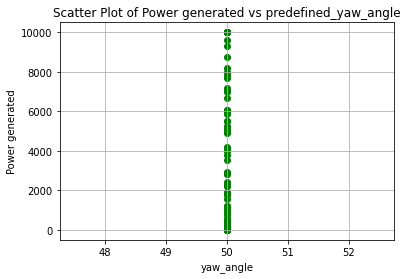

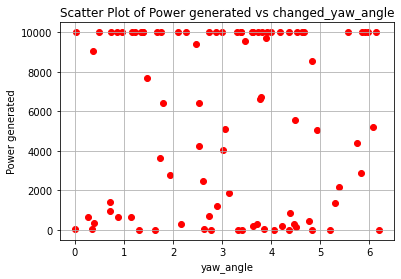

Power_list: [7981.488752995196, 9999.995047964914]
Predefined Yaw Angle 1: 54.16537771218499
Predefined Yaw Angle 2: 50.87094859623327
Changed Yaw Angle 1: 4.165377712184993
Changed Yaw Angle 2: 0.8709485962332677
farm_power_baseline : [7502.18439596    0.        ], farm_power_yaw : [9999.99996715   85.31720541]


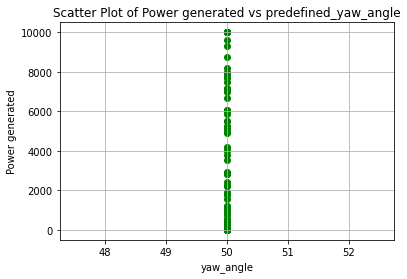

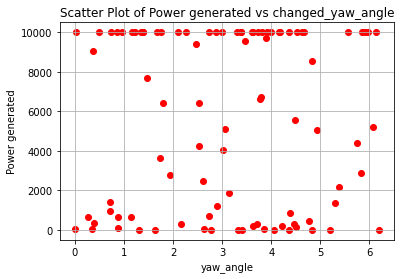

Power_list: [7502.184395958728, 10000.00200682848]
Predefined Yaw Angle 1: 53.94107802937914
Predefined Yaw Angle 2: 53.144985565482074
Changed Yaw Angle 1: 3.9410780293791405
Changed Yaw Angle 2: 3.144985565482077
farm_power_baseline : [9999.9980393   242.38989589], farm_power_yaw : [10000.01111403   531.42954143]


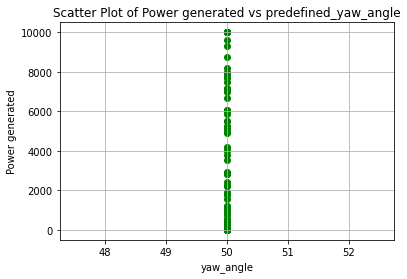

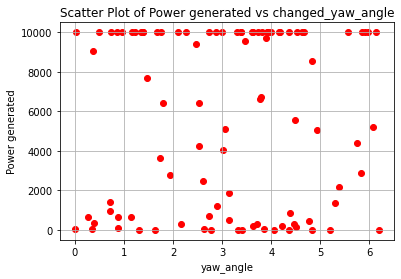

Power_list: [9999.99803929837, 10000.014201222853]
Predefined Yaw Angle 1: 55.59066131386294
Predefined Yaw Angle 2: 50.12758456905914
Changed Yaw Angle 1: 5.590661313862942
Changed Yaw Angle 2: 0.12758456905913956
farm_power_baseline : [8973.68292299 8832.01852158], farm_power_yaw : [10000.00388307 10000.00420145]


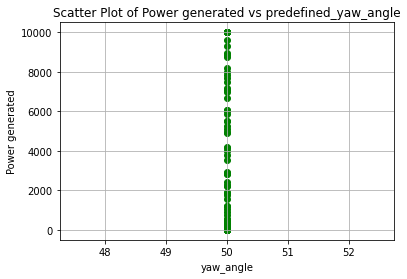

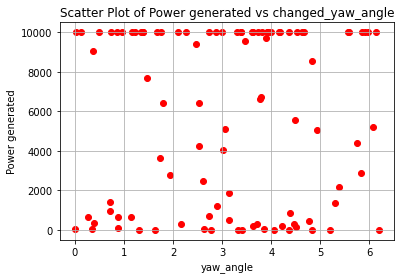

Power_list: [8973.682922992084, 10000.004309084878]
Predefined Yaw Angle 1: 55.445878561200786
Predefined Yaw Angle 2: 54.78037233714299
Changed Yaw Angle 1: 5.445878561200784
Changed Yaw Angle 2: 4.7803723371429925
farm_power_baseline : [9999.99231271    0.        ], farm_power_yaw : [10000.01746358     0.        ]


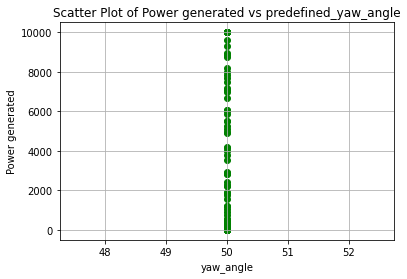

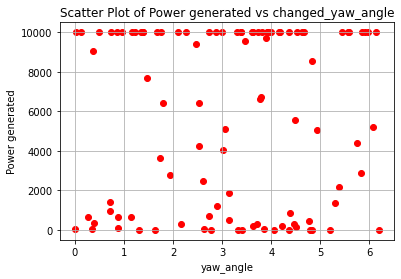

Power_list: [9999.992312714907, 10000.017463578455]
Predefined Yaw Angle 1: 54.12926578043574
Predefined Yaw Angle 2: 50.88680019709461
Changed Yaw Angle 1: 4.129265780435737
Changed Yaw Angle 2: 0.8868001970946101
farm_power_baseline : [6881.12384076    0.        ], farm_power_yaw : [10000.00491116    99.87186257]


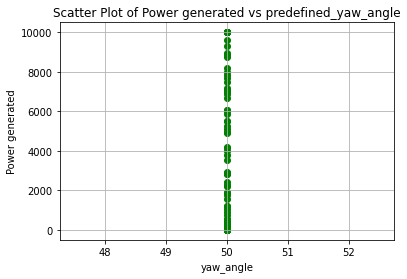

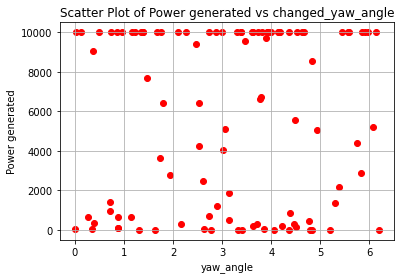

Power_list: [6881.123840762465, 10000.005117525112]
Predefined Yaw Angle 1: 54.82262269971507
Predefined Yaw Angle 2: 52.54076225104272
Changed Yaw Angle 1: 4.822622699715065
Changed Yaw Angle 2: 2.540762251042719
farm_power_baseline : [6627.93625326  363.69597253], farm_power_yaw : [10000.00553226   977.32150036]


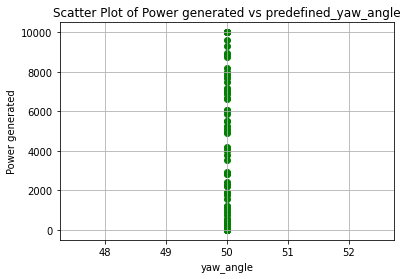

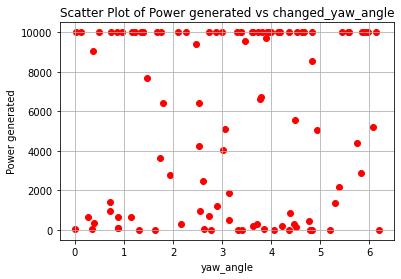

Power_list: [6627.9362532598125, 10000.005532262301]
Predefined Yaw Angle 1: 52.18466363566346
Predefined Yaw Angle 2: 52.85270683163919
Changed Yaw Angle 1: 2.184663635663465
Changed Yaw Angle 2: 2.8527068316391886
farm_power_baseline : [9999.98864656 6410.88358054], farm_power_yaw : [10000.01005721 10000.00606135]


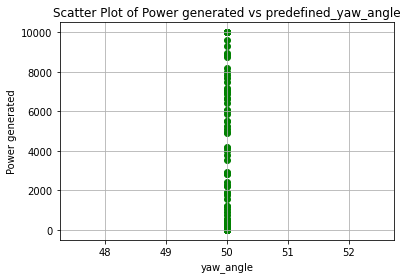

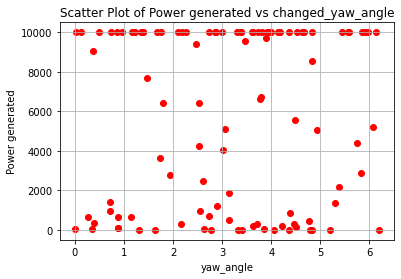

Power_list: [9999.98864655791, 10000.010385316995]
Predefined Yaw Angle 1: 52.12384928690707
Predefined Yaw Angle 2: 55.70483278318111
Changed Yaw Angle 1: 2.1238492869070695
Changed Yaw Angle 2: 5.704832783181108
farm_power_baseline : [9999.99581719 3236.19673831], farm_power_yaw : [10000.00705411  7354.00752539]


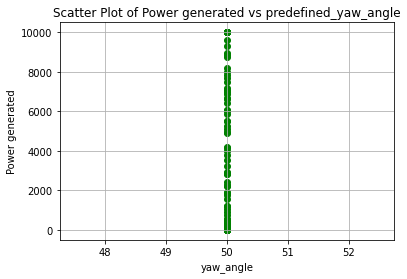

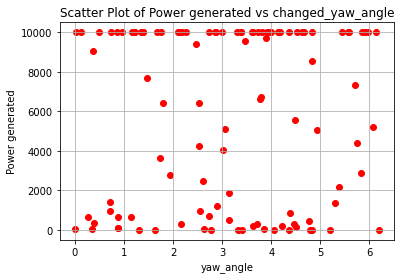

Power_list: [9999.995817185441, 10000.009388971577]
Predefined Yaw Angle 1: 55.4464319660753
Predefined Yaw Angle 2: 52.190876147028106
Changed Yaw Angle 1: 5.446431966075302
Changed Yaw Angle 2: 2.1908761470281086
farm_power_baseline : [191.49500012  47.94619638], farm_power_yaw : [592.43237025 256.80482067]


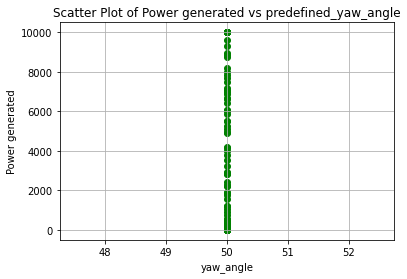

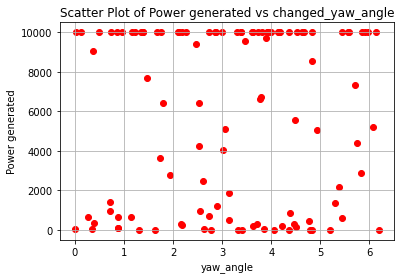

Power_list: [191.49500011752374, 596.0818619191859]
Predefined Yaw Angle 1: 54.95780688717636
Predefined Yaw Angle 2: 52.982016085735765
Changed Yaw Angle 1: 4.95780688717636
Changed Yaw Angle 2: 2.982016085735768
farm_power_baseline : [ 205.50465726 7735.9628148 ], farm_power_yaw : [ 621.66821466 9999.99731356]


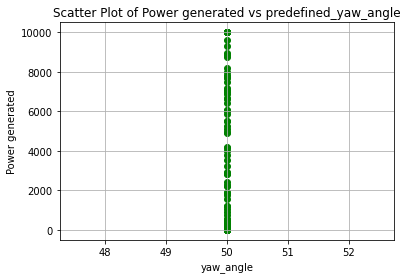

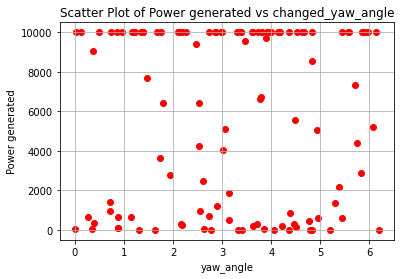

Power_list: [7735.962814798033, 9999.997313555003]
Predefined Yaw Angle 1: 52.46864768797519
Predefined Yaw Angle 2: 53.633032205792254
Changed Yaw Angle 1: 2.4686476879751926
Changed Yaw Angle 2: 3.633032205792254
farm_power_baseline : [  51.233394   7030.41886918], farm_power_yaw : [  266.58352557 10000.00453541]


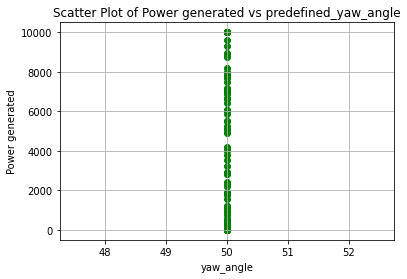

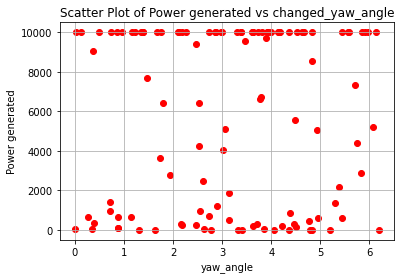

Power_list: [7030.418869180091, 10000.004535410182]
Predefined Yaw Angle 1: 52.41221397289587
Predefined Yaw Angle 2: 54.84231373567271
Changed Yaw Angle 1: 2.4122139728958687
Changed Yaw Angle 2: 4.842313735672709
farm_power_baseline : [ 409.88538433 7273.08257535], farm_power_yaw : [ 1069.37311384 10000.00293947]


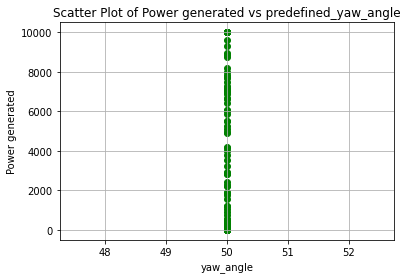

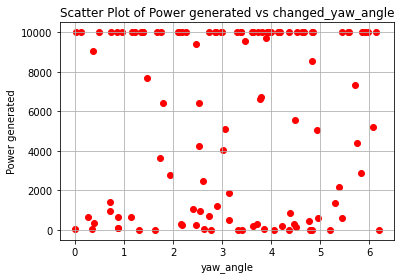

Power_list: [7273.082575349692, 10000.002939467311]
Predefined Yaw Angle 1: 55.64385848926949
Predefined Yaw Angle 2: 54.157108219857896
Changed Yaw Angle 1: 5.643858489269492
Changed Yaw Angle 2: 4.157108219857895
farm_power_baseline : [9999.99915218 4610.25188167], farm_power_yaw : [10000.01437506  9999.98958774]


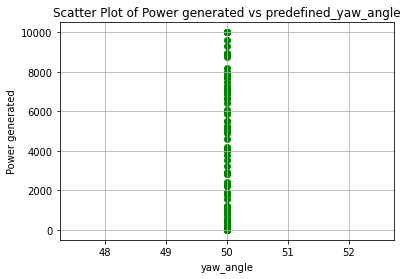

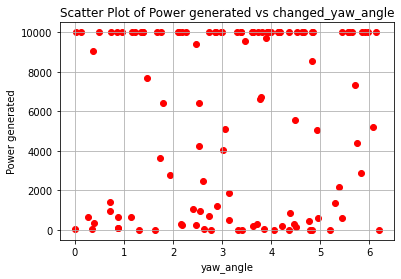

Power_list: [9999.999152183913, 10000.014375055453]
Predefined Yaw Angle 1: 52.53187805647251
Predefined Yaw Angle 2: 52.31643833347095
Changed Yaw Angle 1: 2.5318780564725083
Changed Yaw Angle 2: 2.3164383334709466
farm_power_baseline : [1061.04342003 9999.99652691], farm_power_yaw : [2534.83476446 9999.97974295]


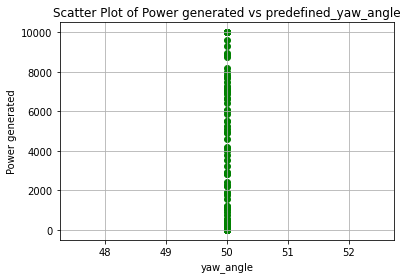

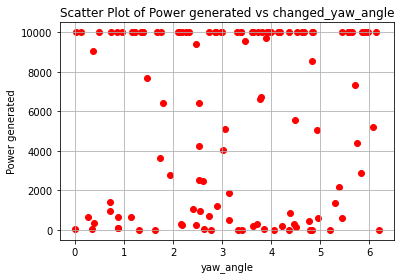

Power_list: [9999.996526907955, 9999.980468659203]
Predefined Yaw Angle 1: 54.07266242199498
Predefined Yaw Angle 2: 54.58065229961802
Changed Yaw Angle 1: 4.072662421994975
Changed Yaw Angle 2: 4.580652299618026
farm_power_baseline : [10000.00238848   326.92189843], farm_power_yaw : [10000.01405235   834.07128567]


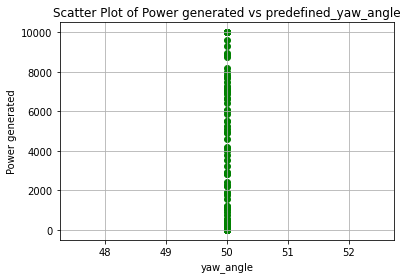

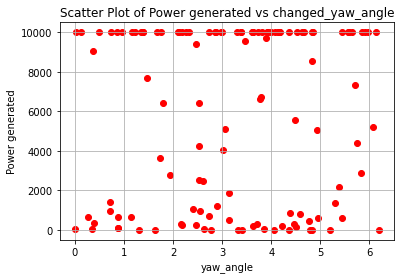

Power_list: [10000.002388477245, 10000.014052345707]
Predefined Yaw Angle 1: 51.74956503203986
Predefined Yaw Angle 2: 54.194695276534944
Changed Yaw Angle 1: 1.749565032039862
Changed Yaw Angle 2: 4.194695276534946
farm_power_baseline : [ 9010.26486882 10000.00364933], farm_power_yaw : [10000.00367511 10000.01379533]


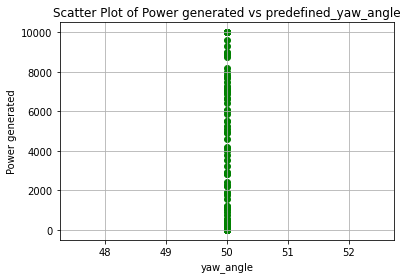

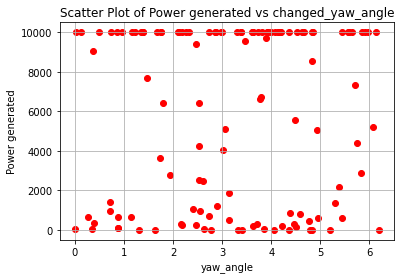

Power_list: [10000.003649327693, 10000.013795328563]
Predefined Yaw Angle 1: 52.8910173136946
Predefined Yaw Angle 2: 52.11638300396474
Changed Yaw Angle 1: 2.891017313694599
Changed Yaw Angle 2: 2.116383003964739
farm_power_baseline : [  920.10944661 10000.00597596], farm_power_yaw : [ 2208.78550042 10000.0051594 ]


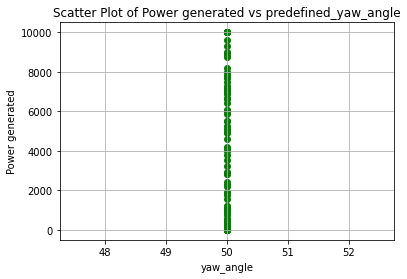

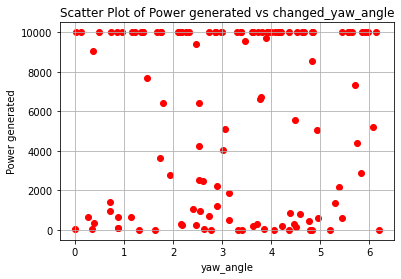

Power_list: [10000.005975958537, 10000.005159402408]
Predefined Yaw Angle 1: 54.58333128418483
Predefined Yaw Angle 2: 53.18006339178005
Changed Yaw Angle 1: 4.58333128418483
Changed Yaw Angle 2: 3.1800633917800556
farm_power_baseline : [   0.        7334.2328458], farm_power_yaw : [    0.         10000.00220555]


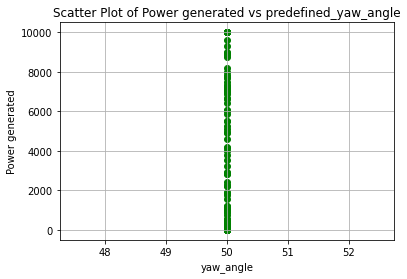

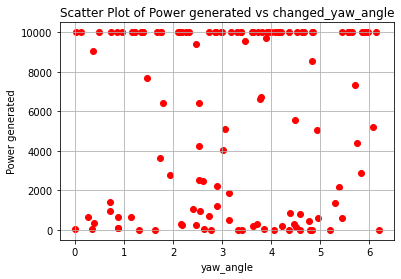

Power_list: [7334.232845804866, 10000.0022055483]
Predefined Yaw Angle 1: 52.22243098834632
Predefined Yaw Angle 2: 53.88041510366248
Changed Yaw Angle 1: 2.2224309883463147
Changed Yaw Angle 2: 3.8804151036624774
farm_power_baseline : [ 761.86166418 5313.43717296], farm_power_yaw : [1868.67537942 9999.99646613]


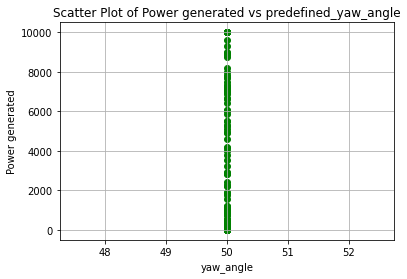

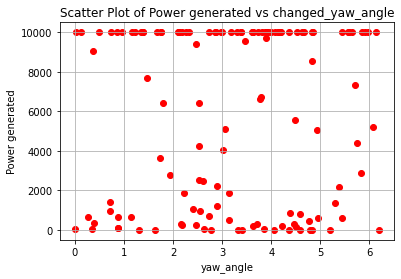

Power_list: [5313.437172960091, 9999.996466130515]
Predefined Yaw Angle 1: 51.418211333418895
Predefined Yaw Angle 2: 53.21890799312384
Changed Yaw Angle 1: 1.418211333418895
Changed Yaw Angle 2: 3.218907993123842
farm_power_baseline : [1502.69914323  976.80359494], farm_power_yaw : [3486.24659732 2333.64489502]


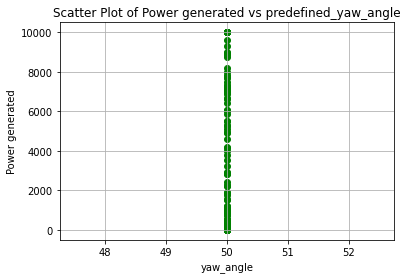

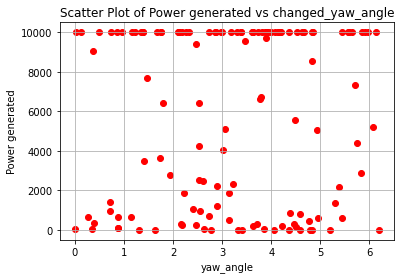

Power_list: [1502.6991432292155, 3492.72132399302]
Predefined Yaw Angle 1: 53.55007697919145
Predefined Yaw Angle 2: 52.18402196933057
Changed Yaw Angle 1: 3.5500769791914513
Changed Yaw Angle 2: 2.184021969330572
farm_power_baseline : [   0.         9391.71198319], farm_power_yaw : [    0.         10000.00207018]


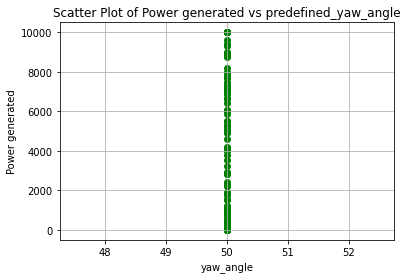

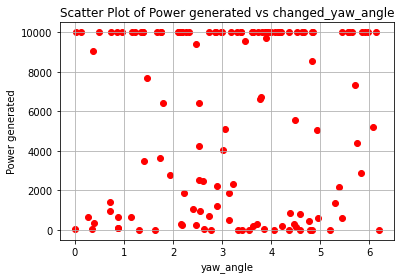

Power_list: [9391.711983191088, 10000.002070175498]
Predefined Yaw Angle 1: 50.56066067924015
Predefined Yaw Angle 2: 50.41043884185743
Changed Yaw Angle 1: 0.5606606792401478
Changed Yaw Angle 2: 0.4104388418574282
farm_power_baseline : [105.49464456   0.        ], farm_power_yaw : [395.72453198   5.76743535]


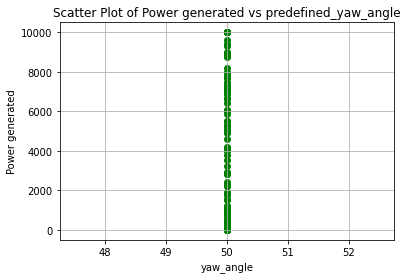

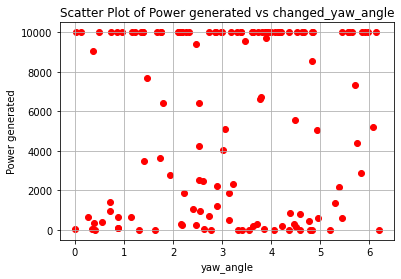

Power_list: [105.49464456434512, 395.8511464915149]
Predefined Yaw Angle 1: 50.10563577170836
Predefined Yaw Angle 2: 49.9596522386872
Changed Yaw Angle 1: 0.10563577170835389
Changed Yaw Angle 2: -0.04034776131280243
Predefined Yaw Angle 1: 51.9807366025645
Predefined Yaw Angle 2: 50.38278677420595
Changed Yaw Angle 1: 1.9807366025645006
Changed Yaw Angle 2: 0.3827867742059447
farm_power_baseline : [9091.16268901  140.88262795], farm_power_yaw : [10000.00325102   473.44843267]


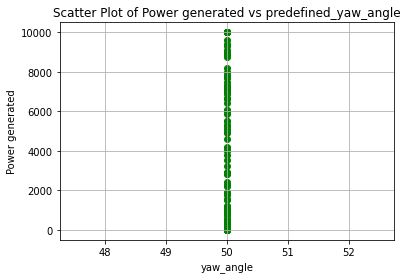

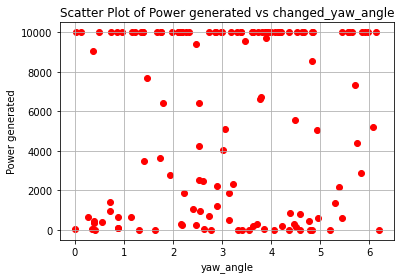

Power_list: [9091.162689006698, 10000.003251016982]
Predefined Yaw Angle 1: 53.491920198886845
Predefined Yaw Angle 2: 55.02088241518805
Changed Yaw Angle 1: 3.4919201988868456
Changed Yaw Angle 2: 5.020882415188049
farm_power_baseline : [   0.         1851.88627989], farm_power_yaw : [   0.         4254.03346072]


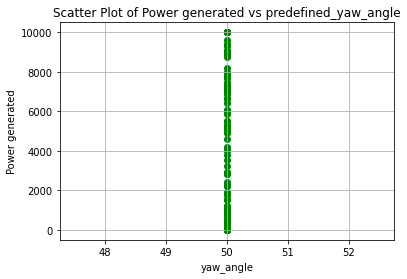

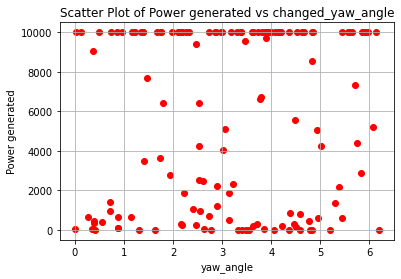

Power_list: [1851.8862798891435, 4277.620339991377]
Predefined Yaw Angle 1: 55.20201875913663
Predefined Yaw Angle 2: 52.98124669849685
Changed Yaw Angle 1: 5.202018759136626
Changed Yaw Angle 2: 2.981246698496844
farm_power_baseline : [9511.10246427 7204.94264458], farm_power_yaw : [10000.00167271 10000.00386666]


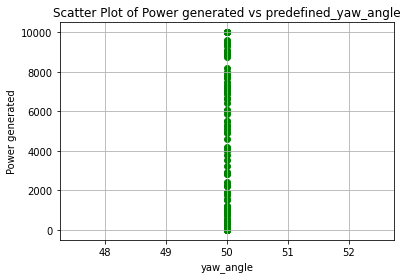

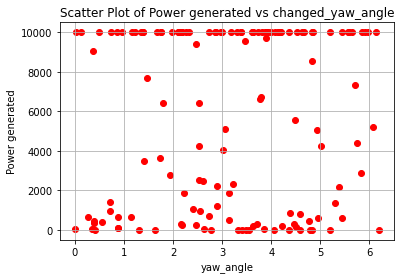

Power_list: [9511.102464272153, 10000.003866664083]
Predefined Yaw Angle 1: 51.6541018922371
Predefined Yaw Angle 2: 55.04891804461553
Changed Yaw Angle 1: 1.6541018922370996
Changed Yaw Angle 2: 5.04891804461553
farm_power_baseline : [10000.00328429    41.41916746], farm_power_yaw : [9999.96501324  239.36123288]


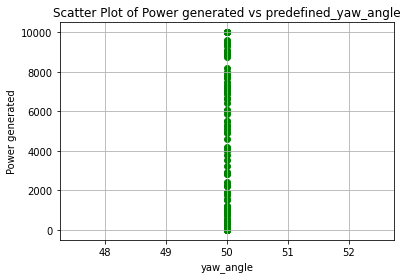

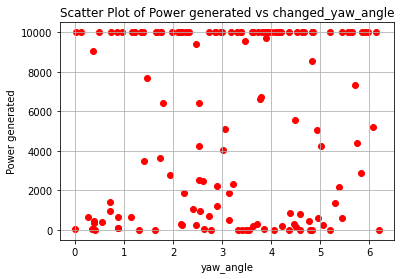

Power_list: [10000.0032842904, 9999.965013237124]
Predefined Yaw Angle 1: 51.52020760684979
Predefined Yaw Angle 2: 54.78844224787815
Changed Yaw Angle 1: 1.5202076068497852
Changed Yaw Angle 2: 4.788442247878151
farm_power_baseline : [1208.5754062  9999.99687614], farm_power_yaw : [ 2831.07507573 10000.01461089]


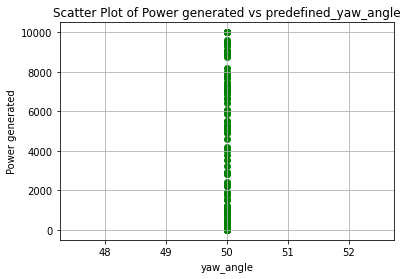

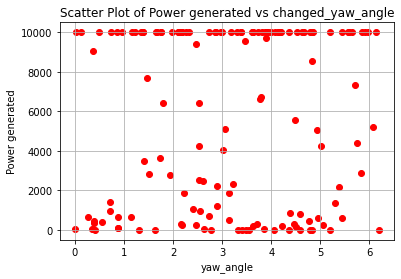

Power_list: [9999.996876138743, 10000.014610893804]
Predefined Yaw Angle 1: 54.01004458054838
Predefined Yaw Angle 2: 56.154403137326256
Changed Yaw Angle 1: 4.010044580548378
Changed Yaw Angle 2: 6.154403137326256
farm_power_baseline : [   0.         7878.79931193], farm_power_yaw : [    0.         10000.00038444]


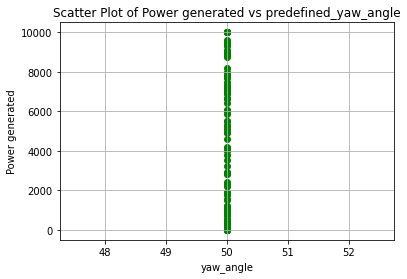

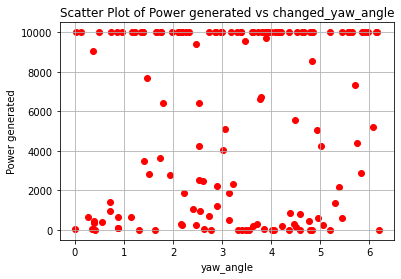

Power_list: [7878.799311927287, 10000.000384443334]
Predefined Yaw Angle 1: 50.58394469665071
Predefined Yaw Angle 2: 51.086455519805085
Changed Yaw Angle 1: 0.5839446966507107
Changed Yaw Angle 2: 1.0864555198050876
farm_power_baseline : [ 385.80431643 9999.99207996], farm_power_yaw : [ 1026.35431009 10000.01791146]


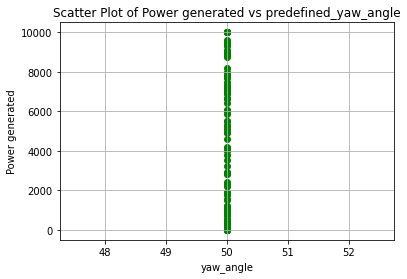

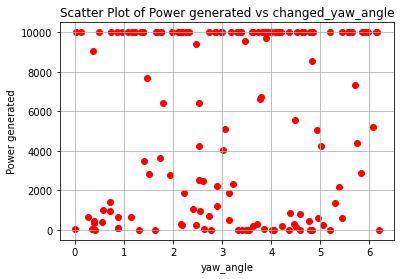

Power_list: [9999.992079958214, 10000.01791146268]
Predefined Yaw Angle 1: 55.275720677040134
Predefined Yaw Angle 2: 53.3176201894565
Changed Yaw Angle 1: 5.275720677040133
Changed Yaw Angle 2: 3.3176201894565014
farm_power_baseline : [2541.49945803 2818.89386074], farm_power_yaw : [5782.35156916 6430.69443584]


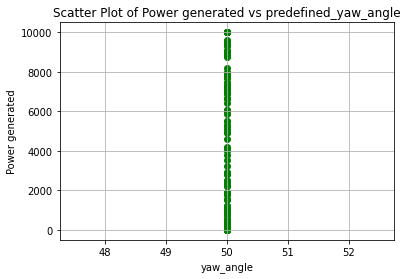

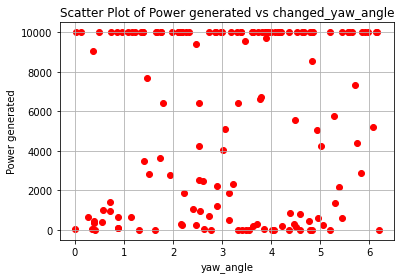

Power_list: [2818.893860736412, 6465.245072352861]
Predefined Yaw Angle 1: 53.907010606398735
Predefined Yaw Angle 2: 52.05462363249553
Changed Yaw Angle 1: 3.907010606398738
Changed Yaw Angle 2: 2.054623632495529
farm_power_baseline : [8172.67416668  550.65634311], farm_power_yaw : [10000.00328388  1239.34475639]


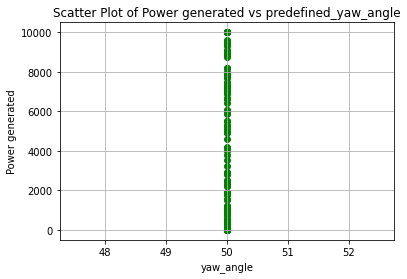

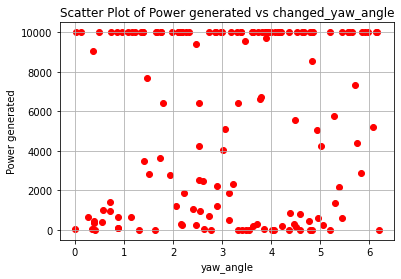

Power_list: [8172.674166676981, 10000.00328387929]
Predefined Yaw Angle 1: 50.21151826295994
Predefined Yaw Angle 2: 54.585938141749615
Changed Yaw Angle 1: 0.21151826295994228
Changed Yaw Angle 2: 4.585938141749615
farm_power_baseline : [ 700.96076061 4944.50582696], farm_power_yaw : [1726.49409723 9999.99549359]


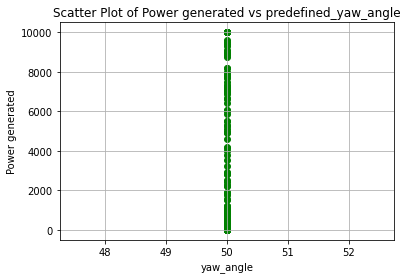

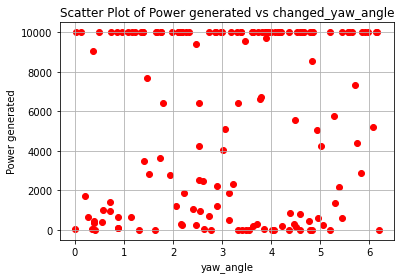

Power_list: [4944.505826962136, 9999.99573355714]
Predefined Yaw Angle 1: 51.03609718520977
Predefined Yaw Angle 2: 55.759461673989684
Changed Yaw Angle 1: 1.0360971852097725
Changed Yaw Angle 2: 5.759461673989686
farm_power_baseline : [   0.         2493.28174169], farm_power_yaw : [   0.         5674.19131014]


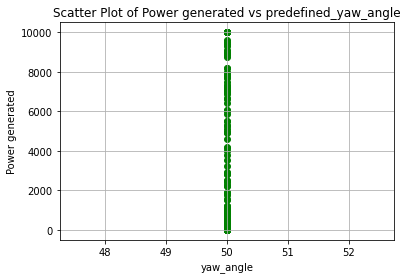

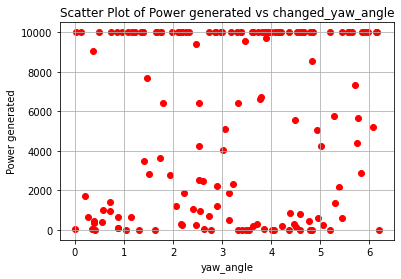

Power_list: [2493.2817416864773, 5703.88837872705]
Predefined Yaw Angle 1: 51.163830047678104
Predefined Yaw Angle 2: 53.80786473661432
Changed Yaw Angle 1: 1.1638300476781067
Changed Yaw Angle 2: 3.8078647366143206
farm_power_baseline : [ 928.45595684 6333.15220532], farm_power_yaw : [ 2225.35616699 10000.00513176]


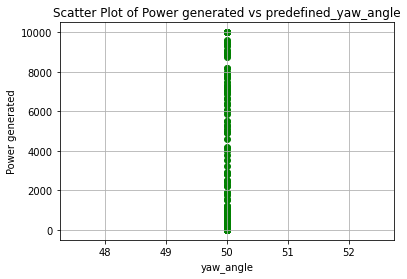

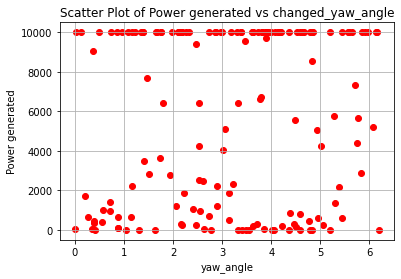

Power_list: [6333.152205316433, 10000.005131758167]
Predefined Yaw Angle 1: 49.96779470655268
Predefined Yaw Angle 2: 50.80589655897131
Changed Yaw Angle 1: -0.032205293447322626
Changed Yaw Angle 2: 0.805896558971311
Predefined Yaw Angle 1: 55.87869124050272
Predefined Yaw Angle 2: 52.204435898034355
Changed Yaw Angle 1: 5.878691240502717
Changed Yaw Angle 2: 2.2044358980343564
farm_power_baseline : [4821.79987447 7704.36810887], farm_power_yaw : [9999.99332718 9999.99774794]


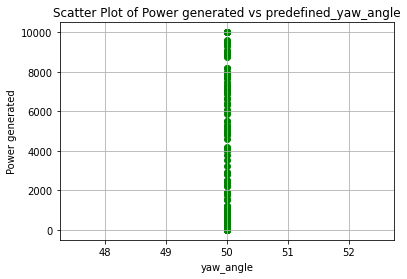

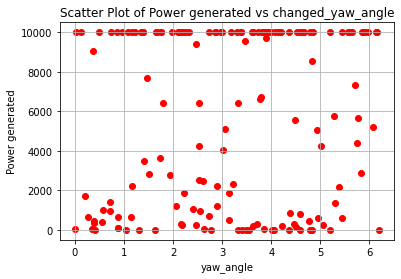

Power_list: [7704.36810886961, 9999.997747941878]
Predefined Yaw Angle 1: 55.33284388452568
Predefined Yaw Angle 2: 53.9141815894397
Changed Yaw Angle 1: 5.332843884525679
Changed Yaw Angle 2: 3.914181589439701
farm_power_baseline : [9353.35334727  642.85065311], farm_power_yaw : [10000.00237031  1591.6370371 ]


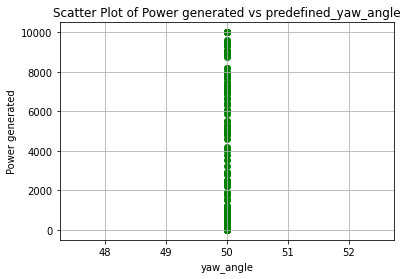

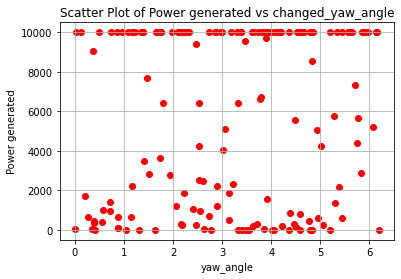

Power_list: [9353.353347270737, 10000.003553985796]
Predefined Yaw Angle 1: 54.85973704529863
Predefined Yaw Angle 2: 54.37441177848011
Changed Yaw Angle 1: 4.859737045298628
Changed Yaw Angle 2: 4.374411778480109
farm_power_baseline : [   0.         9999.98942287], farm_power_yaw : [   87.7265212  10000.01108101]


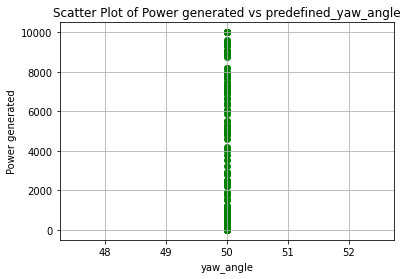

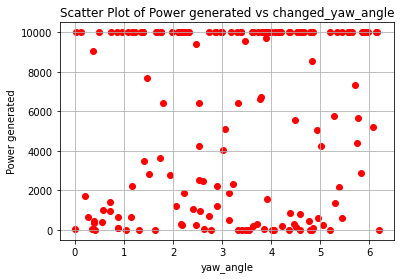

Power_list: [9999.989422866347, 10000.012171203773]
Predefined Yaw Angle 1: 50.09765482719836
Predefined Yaw Angle 2: 54.63882745573415
Changed Yaw Angle 1: 0.09765482719836124
Changed Yaw Angle 2: 4.638827455734154
farm_power_baseline : [57.35137884  0.        ], farm_power_yaw : [283.1334238  135.74475329]


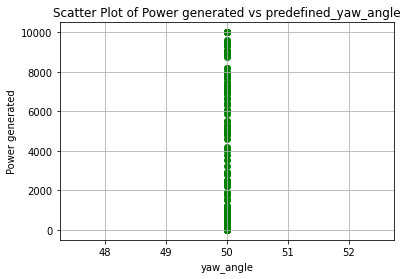

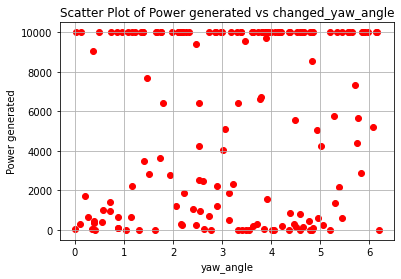

Power_list: [57.35137883783693, 284.3234020422092]
Predefined Yaw Angle 1: 50.560893639256506
Predefined Yaw Angle 2: 51.77335640396985
Changed Yaw Angle 1: 0.5608936392565026
Changed Yaw Angle 2: 1.7733564039698462
farm_power_baseline : [    0.         10000.00580476], farm_power_yaw : [   61.51249697 10000.00192542]


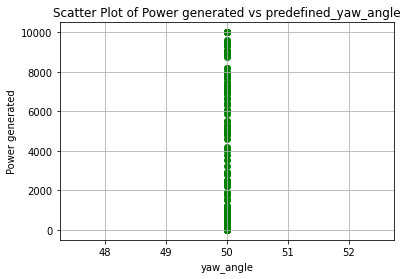

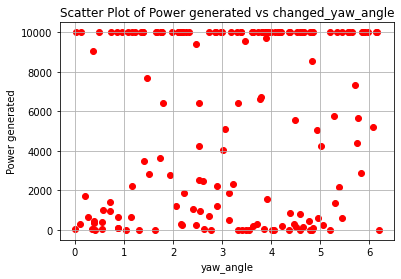

Power_list: [10000.005804760121, 10000.001925423141]
Predefined Yaw Angle 1: 56.17025251874794
Predefined Yaw Angle 2: 53.875274936442516
Changed Yaw Angle 1: 6.1702525187479385
Changed Yaw Angle 2: 3.875274936442515
farm_power_baseline : [7696.94756442    0.        ], farm_power_yaw : [9999.99800679    0.        ]


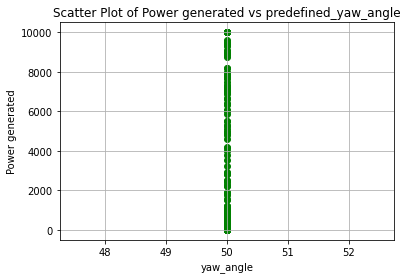

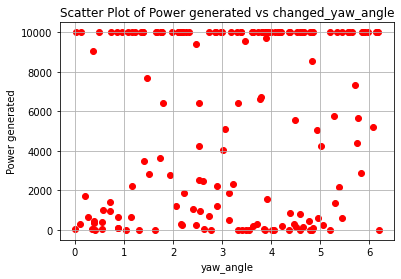

Power_list: [7696.947564418324, 9999.99800679217]
Predefined Yaw Angle 1: 55.99668152733424
Predefined Yaw Angle 2: 53.28179108541501
Changed Yaw Angle 1: 5.996681527334242
Changed Yaw Angle 2: 3.281791085415011
farm_power_baseline : [  18.48933331 2284.9158232 ], farm_power_yaw : [ 179.13183102 5224.49515247]


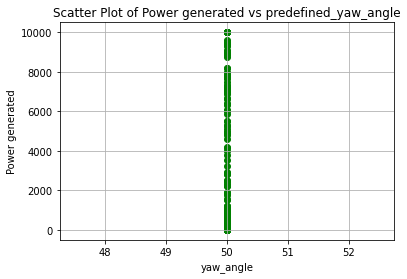

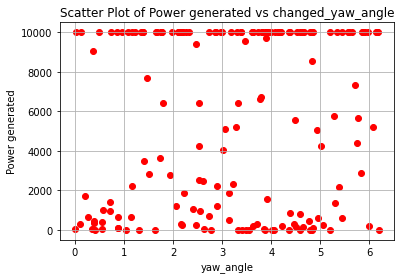

Power_list: [2284.9158231991087, 5259.727484654256]
Predefined Yaw Angle 1: 53.84743462754923
Predefined Yaw Angle 2: 50.80107437318551
Changed Yaw Angle 1: 3.8474346275492293
Changed Yaw Angle 2: 0.8010743731855045
farm_power_baseline : [ 1850.78305473 10000.00434483], farm_power_yaw : [4345.8600547  9999.97340618]


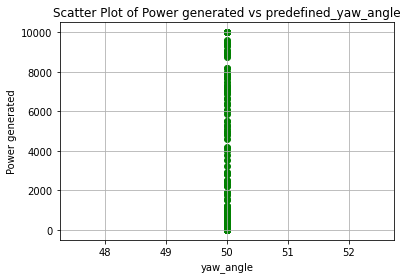

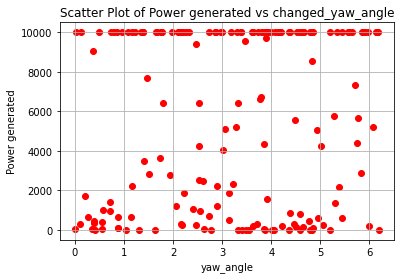

Power_list: [10000.004344832285, 9999.991939216492]
Predefined Yaw Angle 1: 52.523420655798745
Predefined Yaw Angle 2: 52.77198828321165
Changed Yaw Angle 1: 2.5234206557987435
Changed Yaw Angle 2: 2.7719882832116496
farm_power_baseline : [3405.68962467 6025.25280278], farm_power_yaw : [ 7767.3975482  10000.00067686]


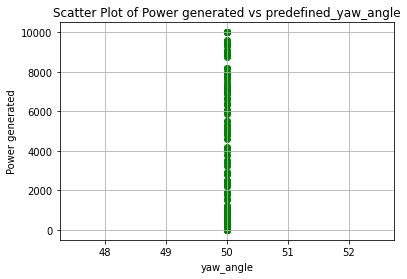

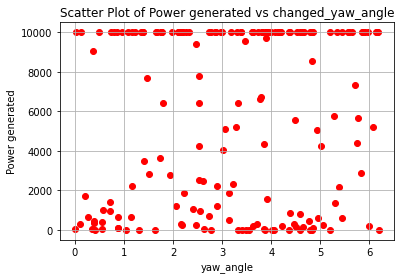

Power_list: [6025.252802784324, 10000.00085447459]
Predefined Yaw Angle 1: 50.97488156465613
Predefined Yaw Angle 2: 51.170193427118505
Changed Yaw Angle 1: 0.9748815646561294
Changed Yaw Angle 2: 1.1701934271185035
farm_power_baseline : [   0.         9333.88398503], farm_power_yaw : [    0.         10000.00228459]


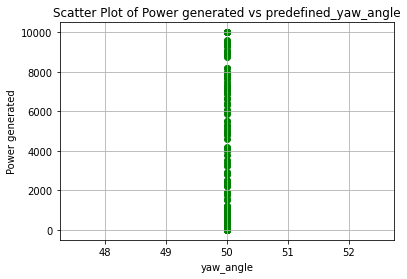

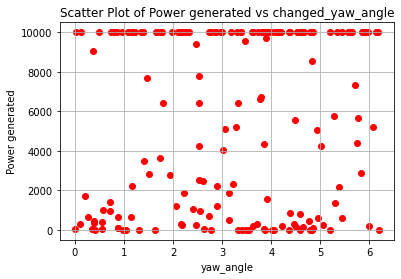

Power_list: [9333.88398503458, 10000.002284588816]
Predefined Yaw Angle 1: 56.05741864441902
Predefined Yaw Angle 2: 50.94846595845151
Changed Yaw Angle 1: 6.057418644419025
Changed Yaw Angle 2: 0.9484659584515038
farm_power_baseline : [9999.99638523  411.85483547], farm_power_yaw : [9999.98391466 1072.50018615]


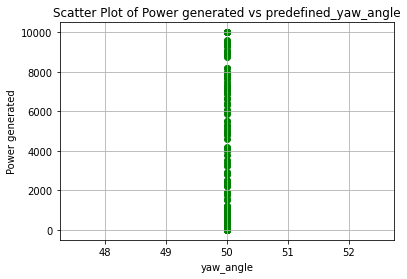

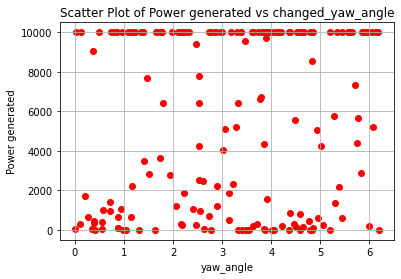

Power_list: [9999.996385231043, 9999.986195349313]
Predefined Yaw Angle 1: 54.767503254633695
Predefined Yaw Angle 2: 50.9217023879187
Changed Yaw Angle 1: 4.767503254633696
Changed Yaw Angle 2: 0.9217023879186981
farm_power_baseline : [5193.48963972 2398.0455064 ], farm_power_yaw : [9999.99671178 5482.90119369]


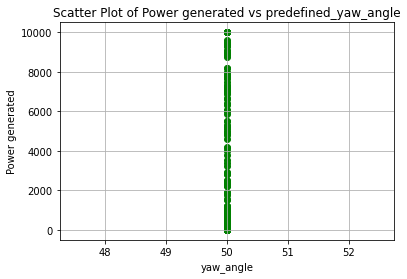

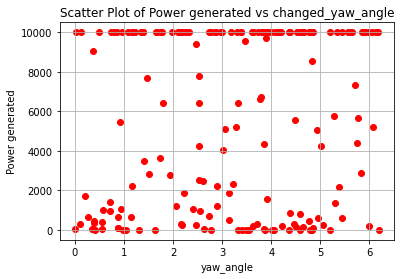

Power_list: [5193.489639723156, 9999.99673964205]
Predefined Yaw Angle 1: 52.31020025575984
Predefined Yaw Angle 2: 55.426791841158
Changed Yaw Angle 1: 2.3102002557598387
Changed Yaw Angle 2: 5.426791841158002
farm_power_baseline : [6751.06796309    0.        ], farm_power_yaw : [10000.00524234    48.89410627]


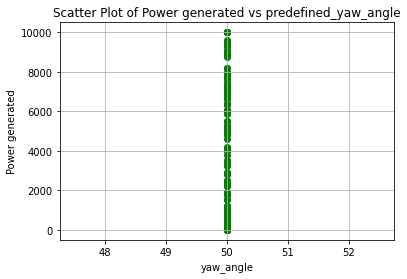

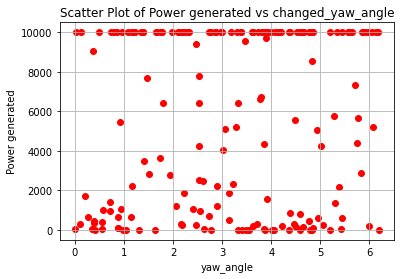

Power_list: [6751.067963085473, 10000.005242341202]
Predefined Yaw Angle 1: 53.027128014899134
Predefined Yaw Angle 2: 53.33212536264973
Changed Yaw Angle 1: 3.0271280148991315
Changed Yaw Angle 2: 3.3321253626497267
farm_power_baseline : [ 6004.22074062 10000.0037307 ], farm_power_yaw : [10000.0002925   9999.96670991]


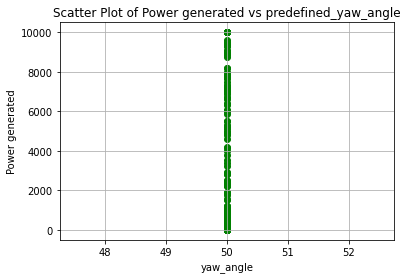

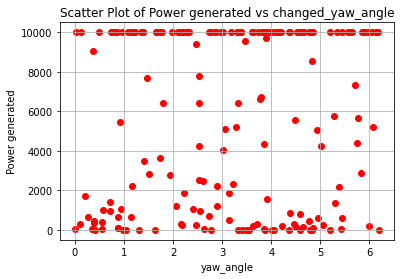

Power_list: [10000.003730703402, 10000.000548379887]
Predefined Yaw Angle 1: 51.12878524457764
Predefined Yaw Angle 2: 53.77255921004314
Changed Yaw Angle 1: 1.128785244577645
Changed Yaw Angle 2: 3.7725592100431404
farm_power_baseline : [1795.63965187 1744.7575574 ], farm_power_yaw : [4137.88544121 4020.40470113]


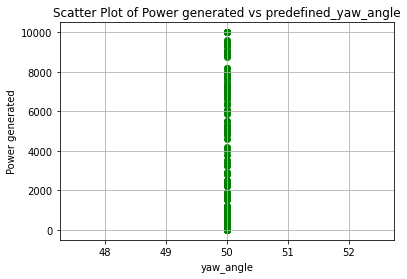

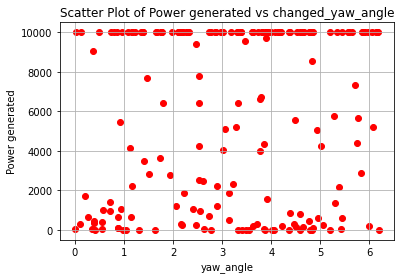

Power_list: [1795.6396518733104, 4137.885441211765]
Predefined Yaw Angle 1: 54.9641910169415
Predefined Yaw Angle 2: 52.87765026472498
Changed Yaw Angle 1: 4.964191016941498
Changed Yaw Angle 2: 2.8776502647249798
farm_power_baseline : [2449.35559771 3774.67425945], farm_power_yaw : [5584.91278262 8549.79402764]


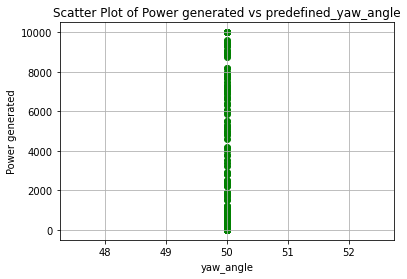

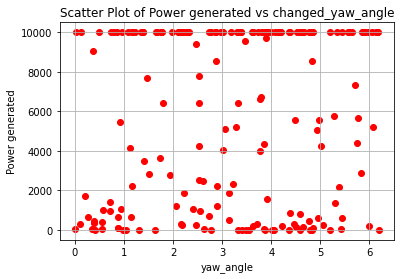

Power_list: [3774.6742594479642, 8588.2283590755]
Predefined Yaw Angle 1: 51.55708759425742
Predefined Yaw Angle 2: 53.13756679763344
Changed Yaw Angle 1: 1.5570875942574205
Changed Yaw Angle 2: 3.137566797633443
farm_power_baseline : [6713.9275239    0.       ], farm_power_yaw : [10000.00527819     0.        ]


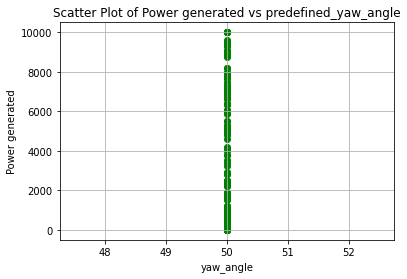

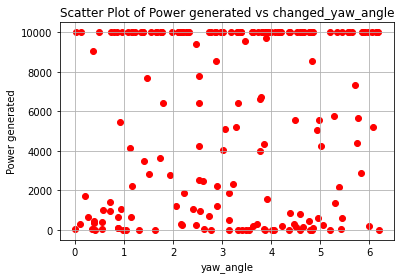

Power_list: [6713.927523902636, 10000.005278189576]
Predefined Yaw Angle 1: 49.94543832224525
Predefined Yaw Angle 2: 56.16535778415419
Changed Yaw Angle 1: -0.05456167775475117
Changed Yaw Angle 2: 6.165357784154189
Predefined Yaw Angle 1: 49.94517073697354
Predefined Yaw Angle 2: 56.17352303605637
Changed Yaw Angle 1: -0.05482926302646608
Changed Yaw Angle 2: 6.1735230360563715
Predefined Yaw Angle 1: 50.19336384334876
Predefined Yaw Angle 2: 56.17352303605637
Changed Yaw Angle 1: 0.19336384334876516
Changed Yaw Angle 2: 6.1735230360563715
farm_power_baseline : [1460.76824718    0.        ], farm_power_yaw : [3384.12219477   60.83648712]


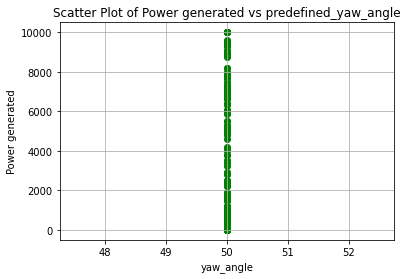

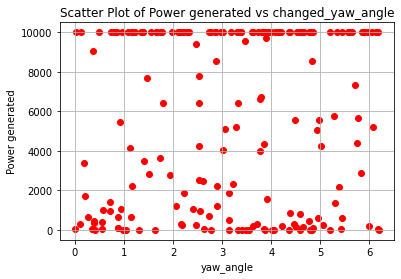

Power_list: [1460.7682471810465, 3401.5575502962347]
Predefined Yaw Angle 1: 55.658205470693964
Predefined Yaw Angle 2: 49.8903379161303
Changed Yaw Angle 1: 5.658205470693967
Changed Yaw Angle 2: -0.10966208386970094
Predefined Yaw Angle 1: 56.08676188594173
Predefined Yaw Angle 2: 49.9908226417443
Changed Yaw Angle 1: 6.086761885941736
Changed Yaw Angle 2: -0.00917735825570163
Predefined Yaw Angle 1: 53.899929261060215
Predefined Yaw Angle 2: 49.923437409051324
Changed Yaw Angle 1: 3.899929261060217
Changed Yaw Angle 2: -0.07656259094867682
Predefined Yaw Angle 1: 55.517543693502596
Predefined Yaw Angle 2: 49.89033772887679
Changed Yaw Angle 1: 5.517543693502598
Changed Yaw Angle 2: -0.1096622711232151
Predefined Yaw Angle 1: 49.96022835380657
Predefined Yaw Angle 2: 49.89033772887679
Changed Yaw Angle 1: -0.03977164619342799
Changed Yaw Angle 2: -0.1096622711232151
Predefined Yaw Angle 1: 52.24344359566315
Predefined Yaw Angle 2: 51.10426181432752
Changed Yaw Angle 1: 2.243443595663

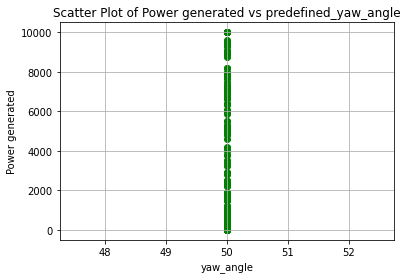

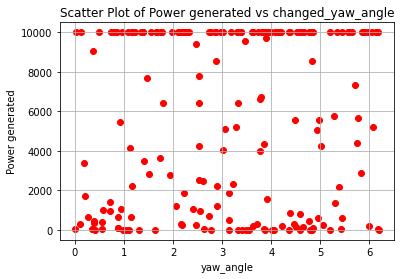

Power_list: [9401.531890209757, 10000.001969998615]
Predefined Yaw Angle 1: 51.01996282321969
Predefined Yaw Angle 2: 56.17326950312059
Changed Yaw Angle 1: 1.019962823219691
Changed Yaw Angle 2: 6.173269503120596
farm_power_baseline : [ 4881.39936624 10000.00472112], farm_power_yaw : [9999.99427122 9999.98276969]


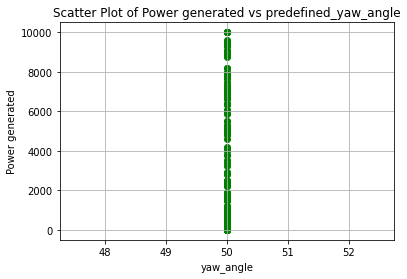

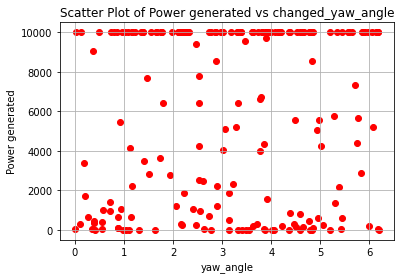

Power_list: [10000.004721124296, 9999.994761127202]
Predefined Yaw Angle 1: 55.11506228848779
Predefined Yaw Angle 2: 49.8903379161303
Changed Yaw Angle 1: 5.1150622884877945
Changed Yaw Angle 2: -0.10966208386970094
Predefined Yaw Angle 1: 56.17452529440086
Predefined Yaw Angle 2: 55.941219222594285
Changed Yaw Angle 1: 6.174525294400861
Changed Yaw Angle 2: 5.9412192225942855
farm_power_baseline : [5702.23504876 9999.99365515], farm_power_yaw : [ 9999.99577038 10000.01351466]


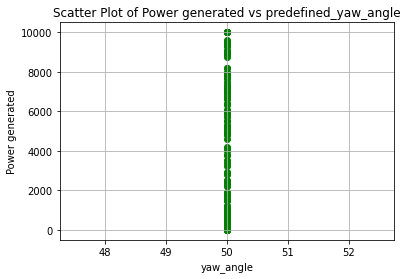

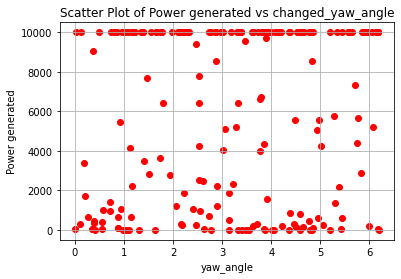

Power_list: [9999.993655145792, 10000.01351466413]
Predefined Yaw Angle 1: 56.21257760532035
Predefined Yaw Angle 2: 53.75713657785438
Changed Yaw Angle 1: 6.21257760532035
Changed Yaw Angle 2: 3.757136577854382
farm_power_baseline : [4573.77325223 7636.48862733], farm_power_yaw : [9999.98892216 9999.99873837]


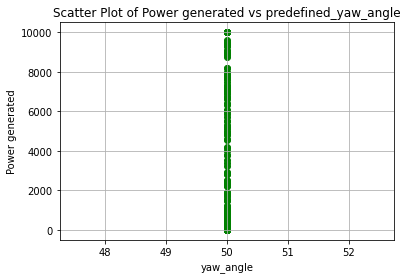

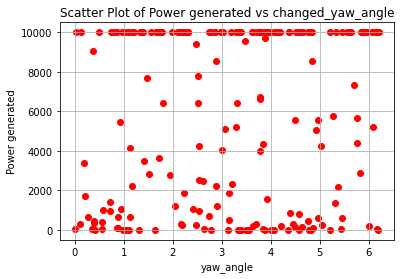

Power_list: [7636.488627334114, 9999.998738366392]
Predefined Yaw Angle 1: 55.14329445920372
Predefined Yaw Angle 2: 55.78844166033971
Changed Yaw Angle 1: 5.143294459203725
Changed Yaw Angle 2: 5.78844166033971
farm_power_baseline : [8692.9818643  3797.15166163], farm_power_yaw : [10000.0025281   8566.97428928]


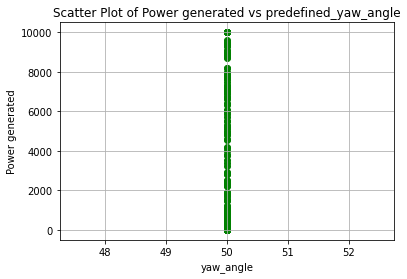

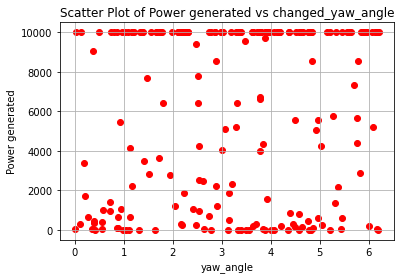

Power_list: [8692.981864295702, 10000.003348173144]
Predefined Yaw Angle 1: 50.327532683999706
Predefined Yaw Angle 2: 50.141437567390916
Changed Yaw Angle 1: 0.32753268399970986
Changed Yaw Angle 2: 0.14143756739091837
farm_power_baseline : [9.68470433e+03 2.96711863e+00], farm_power_yaw : [10000.00075773   148.61453506]


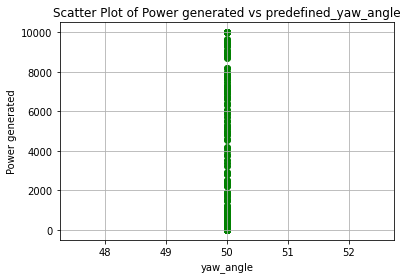

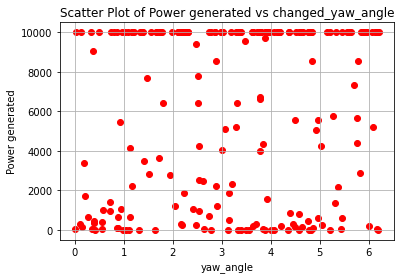

Power_list: [9684.704330556899, 10000.000757727776]
Predefined Yaw Angle 1: 50.12275428823452
Predefined Yaw Angle 2: 49.89033772887679
Changed Yaw Angle 1: 0.12275428823451742
Changed Yaw Angle 2: -0.1096622711232151
Predefined Yaw Angle 1: 55.69070509074064
Predefined Yaw Angle 2: 54.98156829854408
Changed Yaw Angle 1: 5.69070509074064
Changed Yaw Angle 2: 4.981568298544081
farm_power_baseline : [9090.09048919 3826.78649153], farm_power_yaw : [10000.00353554  8634.4743804 ]


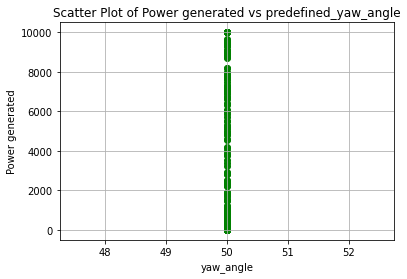

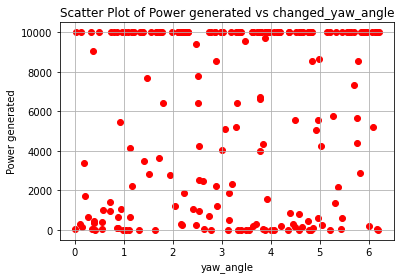

Power_list: [9090.090489185242, 10000.003535541662]
Predefined Yaw Angle 1: 52.4416347124063
Predefined Yaw Angle 2: 49.89034315922869
Changed Yaw Angle 1: 2.441634712406301
Changed Yaw Angle 2: -0.10965684077130484
Predefined Yaw Angle 1: 55.87254839313234
Predefined Yaw Angle 2: 56.17352303605637
Changed Yaw Angle 1: 5.872548393132341
Changed Yaw Angle 2: 6.1735230360563715
farm_power_baseline : [934.0765983  201.20651209], farm_power_yaw : [2219.60887705  608.54952383]


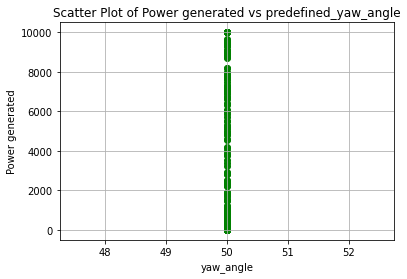

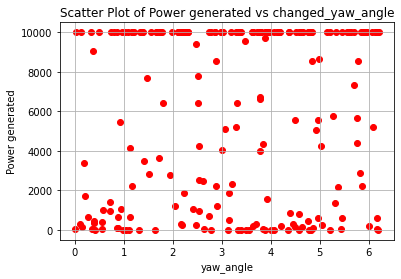

Power_list: [934.0765982967, 2242.0377389898777]
Predefined Yaw Angle 1: 56.18330733441151
Predefined Yaw Angle 2: 56.17352250342415
Changed Yaw Angle 1: 6.183307334411507
Changed Yaw Angle 2: 6.173522503424153
farm_power_baseline : [ 4331.57804097 10000.00607174], farm_power_yaw : [ 9700.97978918 10000.00923575]


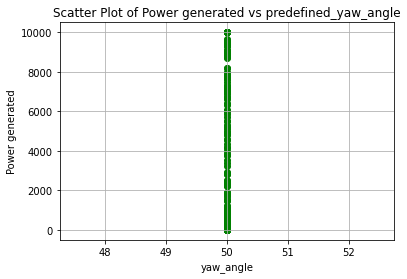

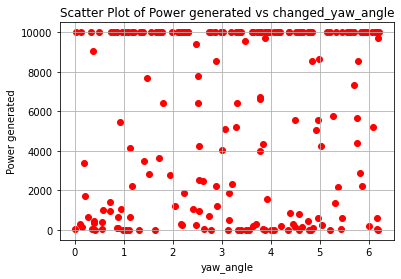

Power_list: [10000.006071737535, 10000.009235749614]
Predefined Yaw Angle 1: 56.21672095134429
Predefined Yaw Angle 2: 56.173317972652434
Changed Yaw Angle 1: 6.2167209513442945
Changed Yaw Angle 2: 6.173317972652436
farm_power_baseline : [8464.340178   5201.24811509], farm_power_yaw : [9999.99964078 9999.99677634]


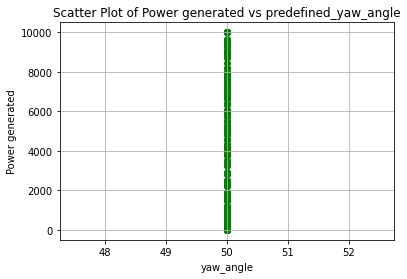

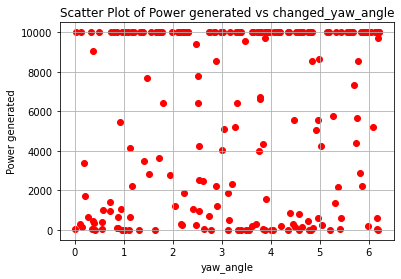

Power_list: [8464.340177996795, 10000.000680854613]
Predefined Yaw Angle 1: 52.40962298347133
Predefined Yaw Angle 2: 49.89033772887679
Changed Yaw Angle 1: 2.4096229834713307
Changed Yaw Angle 2: -0.1096622711232151
Predefined Yaw Angle 1: 51.26120746767242
Predefined Yaw Angle 2: 56.17352303605637
Changed Yaw Angle 1: 1.261207467672418
Changed Yaw Angle 2: 6.1735230360563715
farm_power_baseline : [7180.06632649 9999.99516044], farm_power_yaw : [10000.00403989 10000.0026716 ]


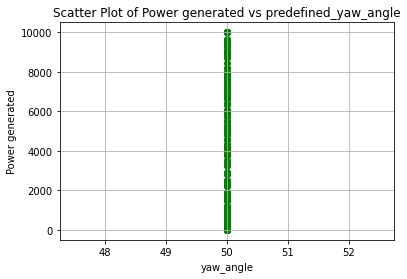

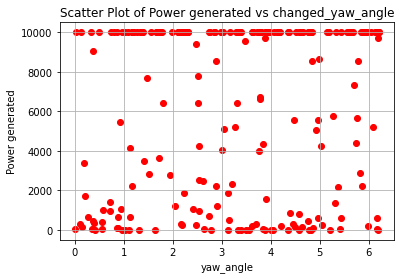

Power_list: [9999.995160436974, 10000.00403988628]
Predefined Yaw Angle 1: 51.25558580092737
Predefined Yaw Angle 2: 49.89059838576848
Changed Yaw Angle 1: 1.2555858009273697
Changed Yaw Angle 2: -0.10940161423152359
Predefined Yaw Angle 1: 54.01811102917412
Predefined Yaw Angle 2: 52.939235332300846
Changed Yaw Angle 1: 4.018111029174118
Changed Yaw Angle 2: 2.9392353323008438
farm_power_baseline : [  950.15120758 10000.00531451], farm_power_yaw : [ 1859.1499317  10000.00243938]


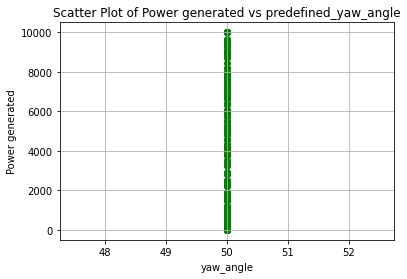

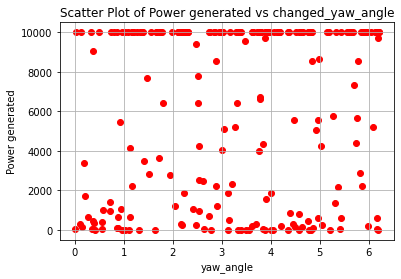

Power_list: [10000.005314507893, 10000.002439378517]
Predefined Yaw Angle 1: 54.515541583901296
Predefined Yaw Angle 2: 56.17352303605637
Changed Yaw Angle 1: 4.515541583901299
Changed Yaw Angle 2: 6.1735230360563715
farm_power_baseline : [4891.7080028   788.66319188], farm_power_yaw : [9999.99425612 1919.72233764]


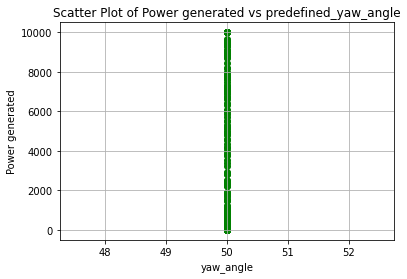

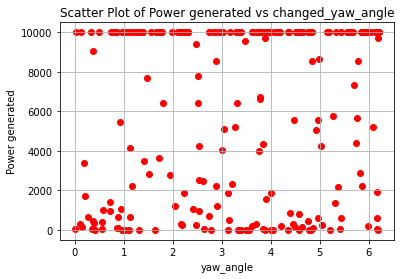

Power_list: [4891.708002796783, 9999.994919969206]
Predefined Yaw Angle 1: 55.53009304119127
Predefined Yaw Angle 2: 49.89053715386935
Changed Yaw Angle 1: 5.530093041191269
Changed Yaw Angle 2: -0.1094628461306494
Predefined Yaw Angle 1: 54.94387589151415
Predefined Yaw Angle 2: 52.53882160555638
Changed Yaw Angle 1: 4.943875891514155
Changed Yaw Angle 2: 2.5388216055563784
farm_power_baseline : [9999.99208162  453.46071588], farm_power_yaw : [10000.01749097  1171.39415644]


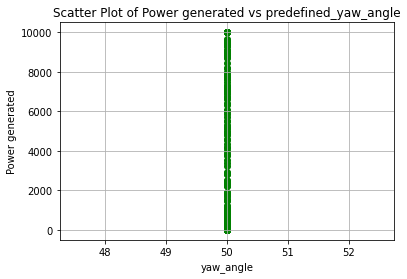

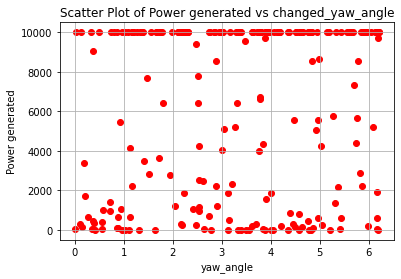

Power_list: [9999.992081616892, 10000.017803376304]
Predefined Yaw Angle 1: 50.5795542092776
Predefined Yaw Angle 2: 49.89125021525122
Changed Yaw Angle 1: 0.579554209277606
Changed Yaw Angle 2: -0.10874978474878068
Predefined Yaw Angle 1: 50.66302506811272
Predefined Yaw Angle 2: 49.8903379161303
Changed Yaw Angle 1: 0.6630250681127143
Changed Yaw Angle 2: -0.10966208386970094
Predefined Yaw Angle 1: 53.45375550256936
Predefined Yaw Angle 2: 56.173132616640565
Changed Yaw Angle 1: 3.453755502569356
Changed Yaw Angle 2: 6.173132616640566
farm_power_baseline : [1397.41522716 4609.30741181], farm_power_yaw : [3249.69855147 9999.98956151]


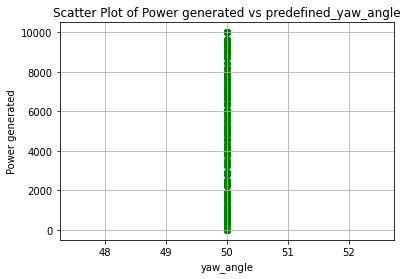

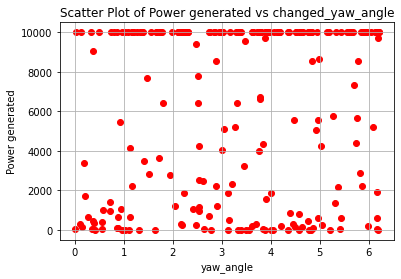

Power_list: [4609.307411807291, 9999.990117815085]
Predefined Yaw Angle 1: 51.151844358034154
Predefined Yaw Angle 2: 49.89033847789084
Changed Yaw Angle 1: 1.1518443580341506
Changed Yaw Angle 2: -0.1096615221091585
Predefined Yaw Angle 1: 56.06722120775939
Predefined Yaw Angle 2: 49.89033772887679
Changed Yaw Angle 1: 6.067221207759388
Changed Yaw Angle 2: -0.1096622711232151
Predefined Yaw Angle 1: 55.72994250834521
Predefined Yaw Angle 2: 53.72363800608282
Changed Yaw Angle 1: 5.729942508345213
Changed Yaw Angle 2: 3.7236380060828207
farm_power_baseline : [290.13509513   0.        ], farm_power_yaw : [800.7004752   0.       ]


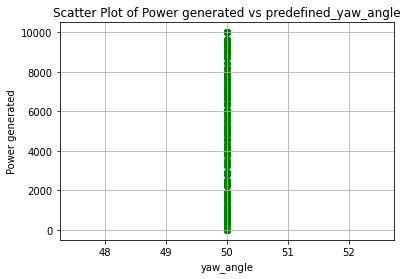

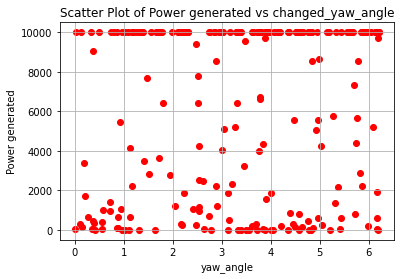

Power_list: [290.13509513049365, 801.223500030898]
Predefined Yaw Angle 1: 50.217544264137494
Predefined Yaw Angle 2: 49.89033772887679
Changed Yaw Angle 1: 0.2175442641374918
Changed Yaw Angle 2: -0.1096622711232151
Predefined Yaw Angle 1: 50.75039679215452
Predefined Yaw Angle 2: 49.909419049221796
Changed Yaw Angle 1: 0.7503967921545162
Changed Yaw Angle 2: -0.09058095077820352
Predefined Yaw Angle 1: 51.37141972622426
Predefined Yaw Angle 2: 56.17137120189559
Changed Yaw Angle 1: 1.3714197262242573
Changed Yaw Angle 2: 6.171371201895588
farm_power_baseline : [9999.99575983 2731.57216615], farm_power_yaw : [10000.00920337  6226.33477009]


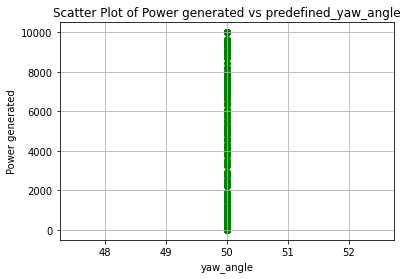

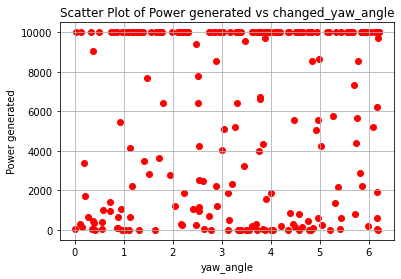

Power_list: [9999.995759829582, 10000.011726151628]
Predefined Yaw Angle 1: 50.675434333528045
Predefined Yaw Angle 2: 56.17352303605637
Changed Yaw Angle 1: 0.6754343335280476
Changed Yaw Angle 2: 6.1735230360563715
farm_power_baseline : [  0.         650.82649471], farm_power_yaw : [   0.         1653.44641126]


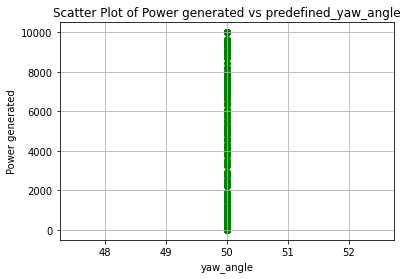

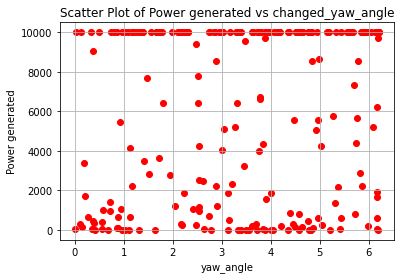

Power_list: [650.8264947114515, 1708.31261681034]
Predefined Yaw Angle 1: 52.6571108098885
Predefined Yaw Angle 2: 53.357642973266536
Changed Yaw Angle 1: 2.6571108098885032
Changed Yaw Angle 2: 3.357642973266539
farm_power_baseline : [10000.0058486     0.       ], farm_power_yaw : [10000.00324151     0.        ]


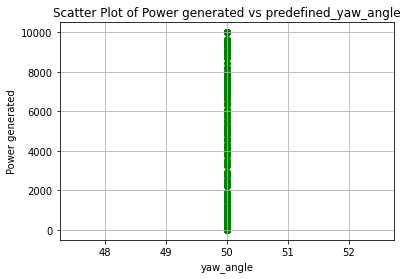

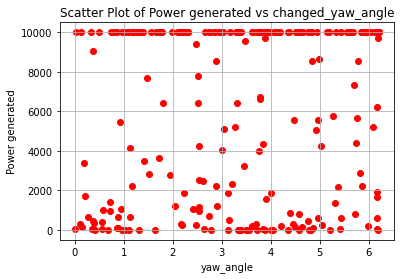

Power_list: [10000.005848596578, 10000.003241514445]
Predefined Yaw Angle 1: 51.56061921217898
Predefined Yaw Angle 2: 55.103471834281365
Changed Yaw Angle 1: 1.5606192121789746
Changed Yaw Angle 2: 5.103471834281368
farm_power_baseline : [225.96377573   0.        ], farm_power_yaw : [664.75524016   0.        ]


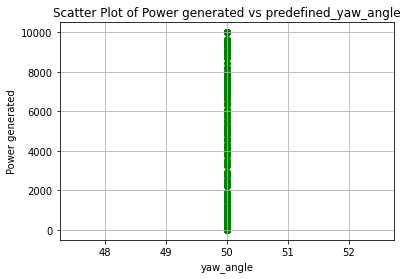

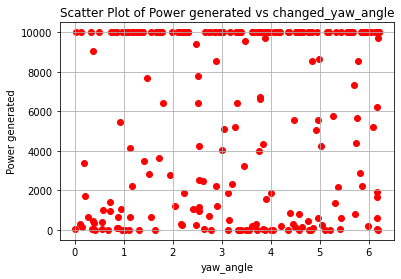

Power_list: [225.96377572697526, 667.8687690452268]
Predefined Yaw Angle 1: 55.54963531727027
Predefined Yaw Angle 2: 55.68851612781441
Changed Yaw Angle 1: 5.549635317270271
Changed Yaw Angle 2: 5.688516127814411
farm_power_baseline : [10000.00301078   488.54357699], farm_power_yaw : [10000.01393631  1247.7181208 ]


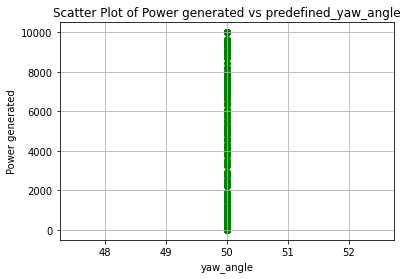

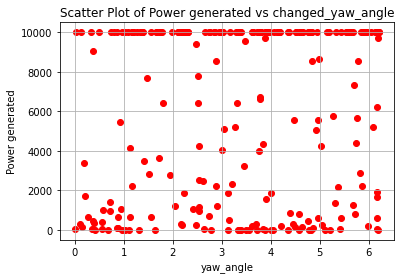

Power_list: [10000.003010779808, 10000.013936312844]
Predefined Yaw Angle 1: 51.7825175226299
Predefined Yaw Angle 2: 56.17352197079194
Changed Yaw Angle 1: 1.7825175226299028
Changed Yaw Angle 2: 6.173521970791936
farm_power_baseline : [2655.01495476   16.974907  ], farm_power_yaw : [6045.96488507  176.19481515]


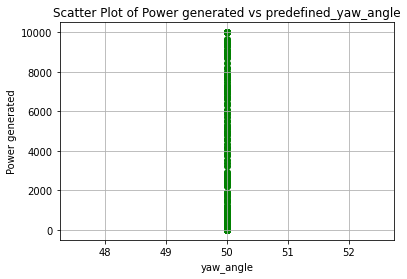

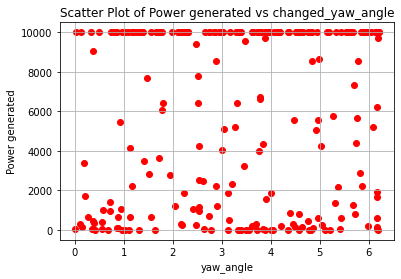

Power_list: [2655.0149547572814, 6081.9409074835]
Predefined Yaw Angle 1: 52.79564711821388
Predefined Yaw Angle 2: 55.16515171039204
Changed Yaw Angle 1: 2.7956471182138802
Changed Yaw Angle 2: 5.165151710392039
farm_power_baseline : [6486.42883717    0.        ], farm_power_yaw : [1.00000059e+04 5.50800348e+00]


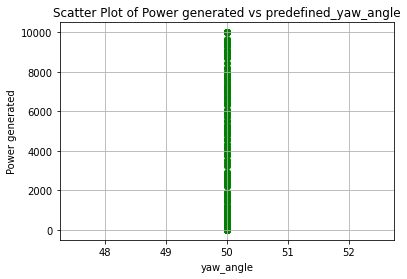

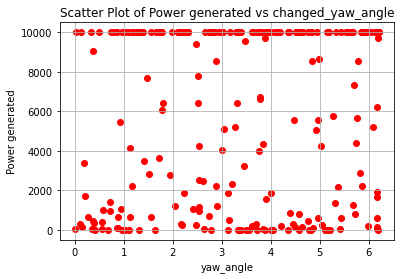

Power_list: [6486.4288371695575, 10000.00591383602]
Predefined Yaw Angle 1: 54.67235916152953
Predefined Yaw Angle 2: 49.89034072493301
Changed Yaw Angle 1: 4.672359161529525
Changed Yaw Angle 2: -0.10965927506698875
Predefined Yaw Angle 1: 50.0929579597866
Predefined Yaw Angle 2: 56.17352303605637
Changed Yaw Angle 1: 0.09295795978659982
Changed Yaw Angle 2: 6.1735230360563715
farm_power_baseline : [10000.00109151   570.36010965], farm_power_yaw : [10000.01412715  1431.71699643]


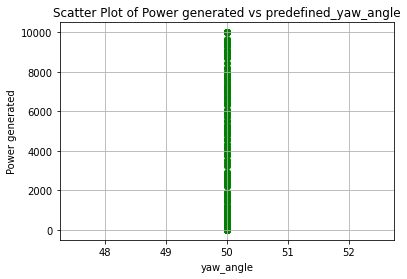

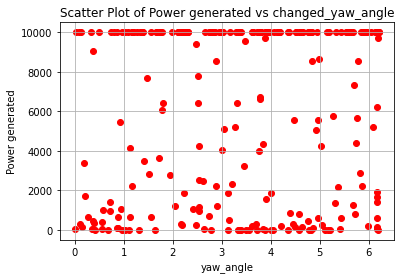

Power_list: [10000.001091512977, 10000.014127154456]
Predefined Yaw Angle 1: 53.35005520551498
Predefined Yaw Angle 2: 54.55466570633325
Changed Yaw Angle 1: 3.3500552055149786
Changed Yaw Angle 2: 4.554665706333251
farm_power_baseline : [57.62202852 59.73207995], farm_power_yaw : [283.29355667 289.04064448]


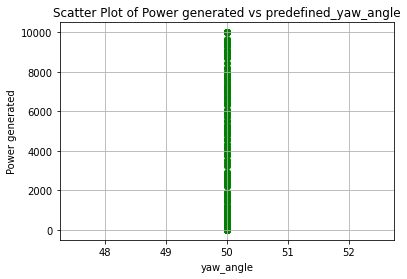

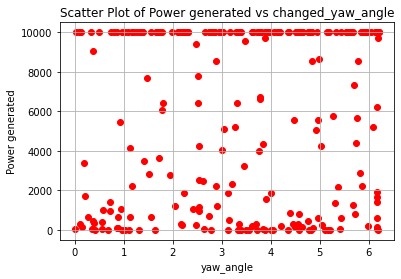

Power_list: [59.73207995437153, 290.8175589042769]
Predefined Yaw Angle 1: 51.708930253811324
Predefined Yaw Angle 2: 51.696525538101604
Changed Yaw Angle 1: 1.7089302538113238
Changed Yaw Angle 2: 1.6965255381016051
farm_power_baseline : [   0.         7862.91717529], farm_power_yaw : [  96.26508814 9999.99551746]


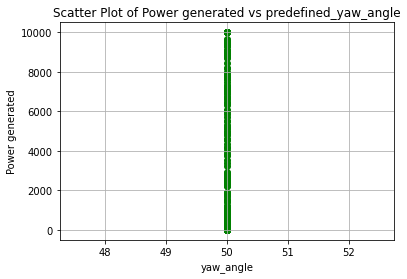

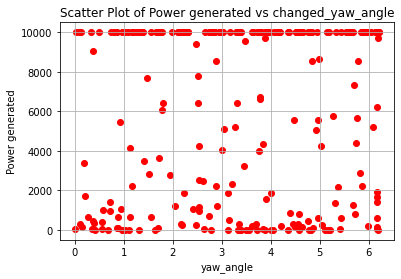

Power_list: [7862.917175292708, 9999.995517456195]
Predefined Yaw Angle 1: 50.57002015915415
Predefined Yaw Angle 2: 53.39975101221011
Changed Yaw Angle 1: 0.5700201591541496
Changed Yaw Angle 2: 3.399751012210109
farm_power_baseline : [2620.12513691 9999.9968779 ], farm_power_yaw : [5990.30076365 9999.98439068]


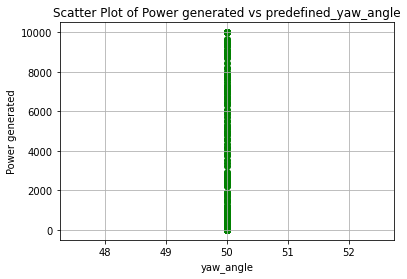

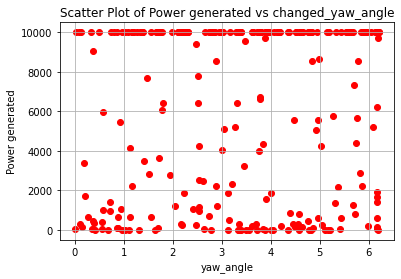

Power_list: [9999.996877895916, 9999.984390680776]
Predefined Yaw Angle 1: 52.94384244549686
Predefined Yaw Angle 2: 54.16106168249612
Changed Yaw Angle 1: 2.9438424454968657
Changed Yaw Angle 2: 4.1610616824961175
farm_power_baseline : [327.18332694  66.20443911], farm_power_yaw : [897.66871761 307.00708111]


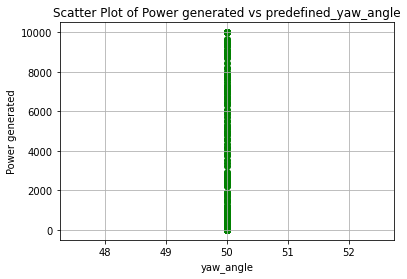

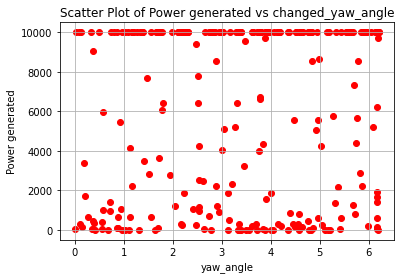

Power_list: [327.1833269433157, 901.3269928421466]
Predefined Yaw Angle 1: 50.35365190270677
Predefined Yaw Angle 2: 52.61031629554843
Changed Yaw Angle 1: 0.353651902706771
Changed Yaw Angle 2: 2.6103162955484276
farm_power_baseline : [  11.63351847 1625.22819722], farm_power_yaw : [ 166.39355496 3760.42106917]


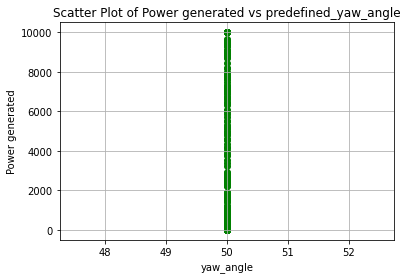

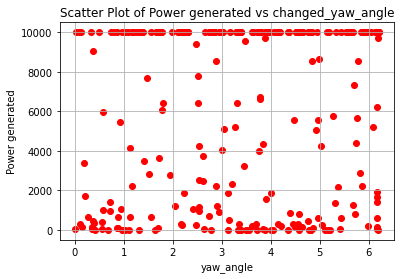

Power_list: [1625.228197215306, 3764.1420639863145]
Predefined Yaw Angle 1: 52.54864159027012
Predefined Yaw Angle 2: 49.95527275349835
Changed Yaw Angle 1: 2.5486415902701207
Changed Yaw Angle 2: -0.044727246501653675
Predefined Yaw Angle 1: 50.91889799038005
Predefined Yaw Angle 2: 53.871250367403185
Changed Yaw Angle 1: 0.9188979903800559
Changed Yaw Angle 2: 3.8712503674031877
farm_power_baseline : [1151.43394224    0.        ], farm_power_yaw : [2471.8211973    0.       ]


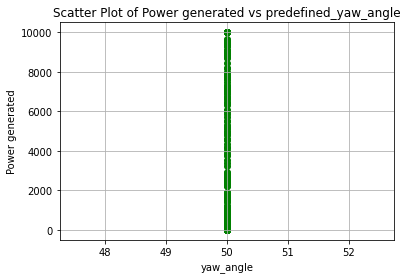

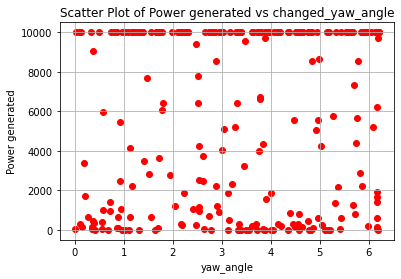

Power_list: [1151.4339422360447, 2471.821197297373]
Predefined Yaw Angle 1: 55.434916990154015
Predefined Yaw Angle 2: 53.65479129716264
Changed Yaw Angle 1: 5.434916990154018
Changed Yaw Angle 2: 3.654791297162637
farm_power_baseline : [2058.77148724 2021.00854256], farm_power_yaw : [4699.0570918  4617.19417946]


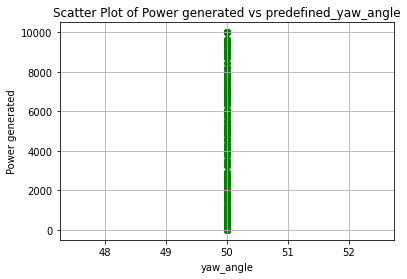

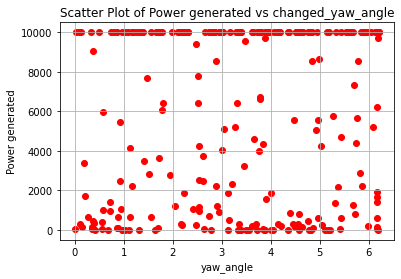

Power_list: [2058.771487236868, 4726.791796641957]
Predefined Yaw Angle 1: 53.19024050639598
Predefined Yaw Angle 2: 51.39096961464413
Changed Yaw Angle 1: 3.190240506395978
Changed Yaw Angle 2: 1.3909696146441268
farm_power_baseline : [9999.99660799 1012.08616743], farm_power_yaw : [9999.97642011 2417.91258308]


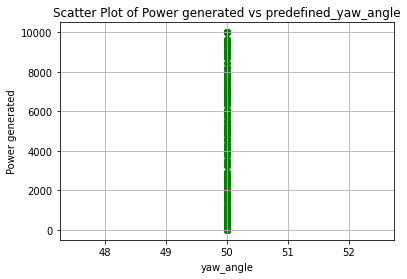

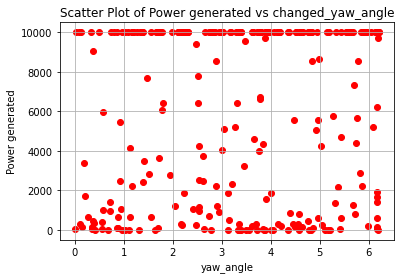

Power_list: [9999.996607990935, 9999.977164628204]
Predefined Yaw Angle 1: 53.20772362632013
Predefined Yaw Angle 2: 51.36816123780425
Changed Yaw Angle 1: 3.20772362632013
Changed Yaw Angle 2: 1.368161237804252
farm_power_baseline : [   0.         3181.88526016], farm_power_yaw : [   0.         7256.50395155]


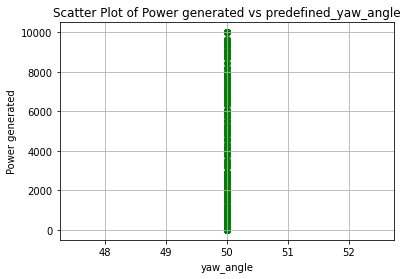

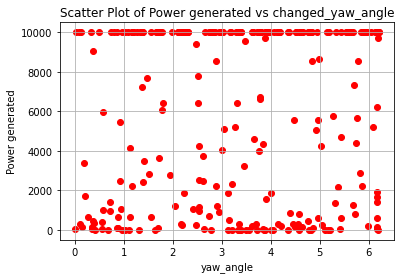

Power_list: [3181.885260161836, 7268.7883972231675]
Predefined Yaw Angle 1: 53.09802402627813
Predefined Yaw Angle 2: 50.77389754663054
Changed Yaw Angle 1: 3.098024026278131
Changed Yaw Angle 2: 0.7738975466305456
farm_power_baseline : [1345.87219086 5899.67107748], farm_power_yaw : [3150.26296184 9999.99889879]


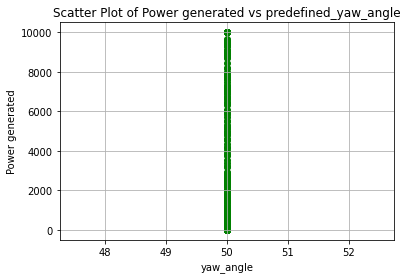

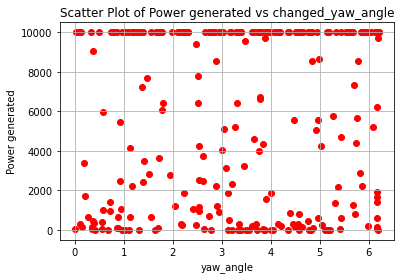

Power_list: [5899.671077480742, 9999.99889879354]
Predefined Yaw Angle 1: 54.051465790246816
Predefined Yaw Angle 2: 51.72723631284407
Changed Yaw Angle 1: 4.051465790246816
Changed Yaw Angle 2: 1.7272363128440718
farm_power_baseline : [9999.99641858  582.52276214], farm_power_yaw : [9999.98686112 1290.08803193]


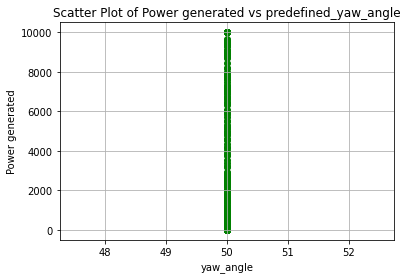

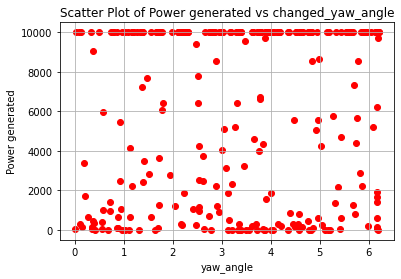

Power_list: [9999.996418579529, 9999.986861116362]
Predefined Yaw Angle 1: 54.710284705981124
Predefined Yaw Angle 2: 55.54757471870858
Changed Yaw Angle 1: 4.710284705981125
Changed Yaw Angle 2: 5.547574718708583
farm_power_baseline : [10000.00310262  1751.33796415], farm_power_yaw : [10000.01390983  4014.38524448]


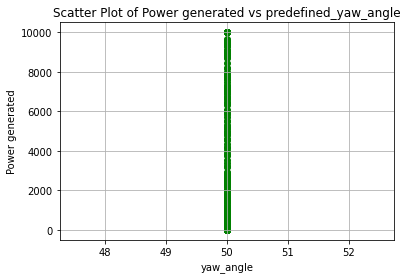

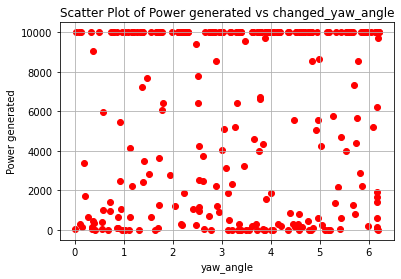

Power_list: [10000.00310261692, 10000.013909833518]
Predefined Yaw Angle 1: 54.65214044253364
Predefined Yaw Angle 2: 56.16921404141262
Changed Yaw Angle 1: 4.652140442533644
Changed Yaw Angle 2: 6.169214041412624
farm_power_baseline : [3316.12452434 7844.51616507], farm_power_yaw : [7511.30435912 9999.9964196 ]


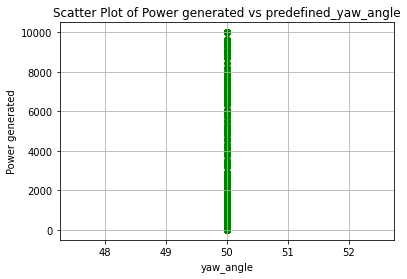

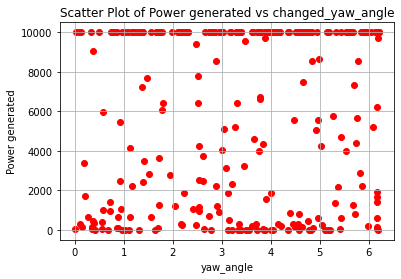

Power_list: [7844.516165065148, 9999.99641959772]
Predefined Yaw Angle 1: 56.225018828668766
Predefined Yaw Angle 2: 56.17350705708983
Changed Yaw Angle 1: 6.225018828668764
Changed Yaw Angle 2: 6.173507057089831
farm_power_baseline : [10000.00448131     0.        ], farm_power_yaw : [9999.97900063   33.4927329 ]


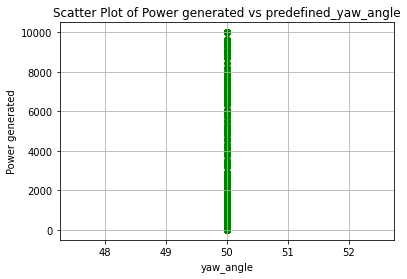

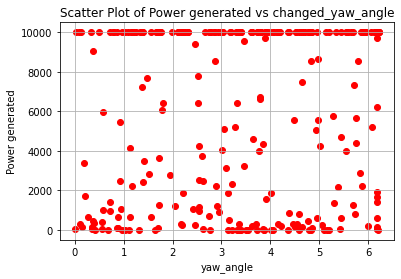

Power_list: [10000.00448131215, 9999.97900062973]
Predefined Yaw Angle 1: 49.94663262515847
Predefined Yaw Angle 2: 53.594453387925256
Changed Yaw Angle 1: -0.053367374841526725
Changed Yaw Angle 2: 3.594453387925257
Predefined Yaw Angle 1: 54.62010101672334
Predefined Yaw Angle 2: 54.83946362067411
Changed Yaw Angle 1: 4.620101016723336
Changed Yaw Angle 2: 4.839463620674107
farm_power_baseline : [ 658.50769124 9999.99586286], farm_power_yaw : [1626.21778705 9999.99896651]


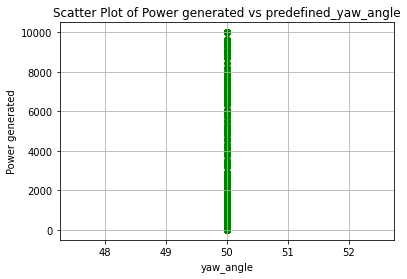

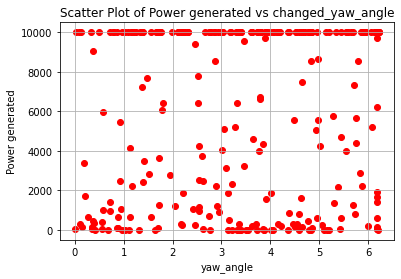

Power_list: [9999.995862862026, 9999.998966505624]
Predefined Yaw Angle 1: 51.71073281439514
Predefined Yaw Angle 2: 52.53042146284605
Changed Yaw Angle 1: 1.710732814395144
Changed Yaw Angle 2: 2.5304214628460504
farm_power_baseline : [ 5468.97654241 10000.00398408], farm_power_yaw : [9999.99613824 9999.96728207]


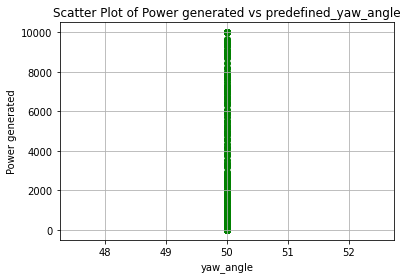

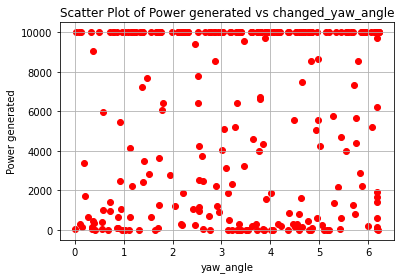

Power_list: [10000.003984081974, 9999.996138242863]
Predefined Yaw Angle 1: 52.6861520489436
Predefined Yaw Angle 2: 51.51817310726678
Changed Yaw Angle 1: 2.6861520489435993
Changed Yaw Angle 2: 1.5181731072667806
farm_power_baseline : [  84.6328507  8678.24100933], farm_power_yaw : [  348.63866869 10000.00304609]


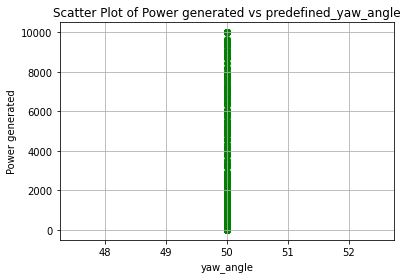

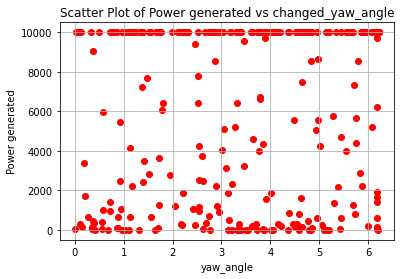

Power_list: [8678.2410093269, 10000.003176207323]
Predefined Yaw Angle 1: 53.51644684726204
Predefined Yaw Angle 2: 50.10159639452247
Changed Yaw Angle 1: 3.5164468472620394
Changed Yaw Angle 2: 0.10159639452246715
farm_power_baseline : [6133.28044356    0.        ], farm_power_yaw : [10000.00226931    91.29893092]


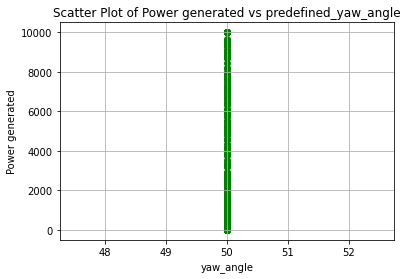

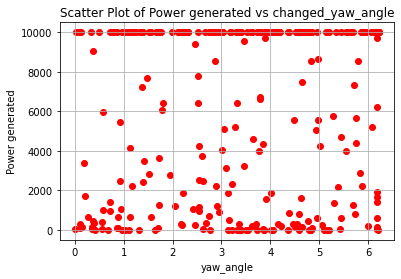

Power_list: [6133.280443560251, 10000.00242667842]
Predefined Yaw Angle 1: 51.69235394023834
Predefined Yaw Angle 2: 53.97077669208108
Changed Yaw Angle 1: 1.6923539402383436
Changed Yaw Angle 2: 3.970776692081084
farm_power_baseline : [ 744.51176313 9581.40543814], farm_power_yaw : [ 1824.69015311 10000.00128738]


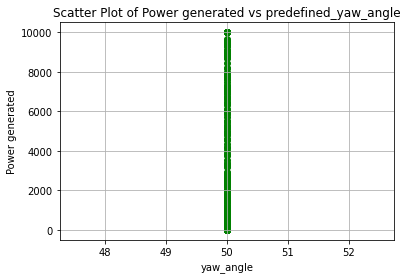

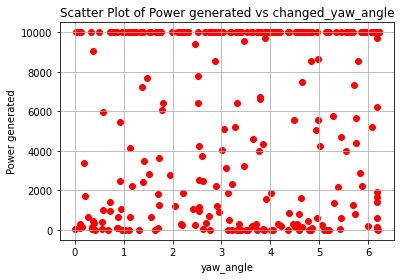

Power_list: [9581.405438142476, 10000.001287377807]
Predefined Yaw Angle 1: 50.344771225867255
Predefined Yaw Angle 2: 51.495972330629606
Changed Yaw Angle 1: 0.3447712258672519
Changed Yaw Angle 2: 1.4959723306296073
farm_power_baseline : [  173.14641262 10000.00186786], farm_power_yaw : [  547.1595925  10000.01398029]


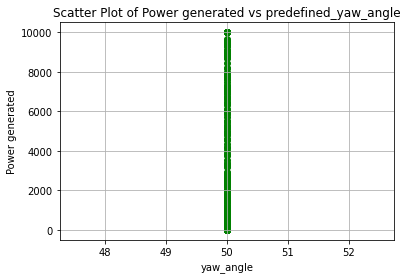

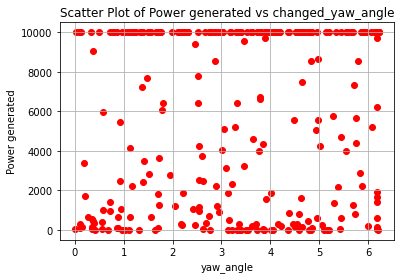

Power_list: [10000.00186786144, 10000.013980288666]
Predefined Yaw Angle 1: 51.87157362948215
Predefined Yaw Angle 2: 55.00278357241987
Changed Yaw Angle 1: 1.8715736294821526
Changed Yaw Angle 2: 5.00278357241987
farm_power_baseline : [3304.27112002 8786.1784059 ], farm_power_yaw : [ 7516.46614756 10000.00404371]


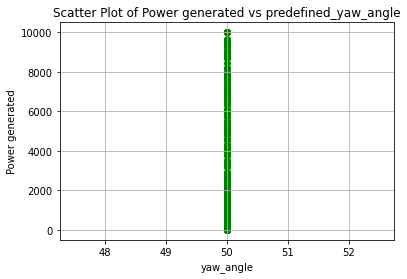

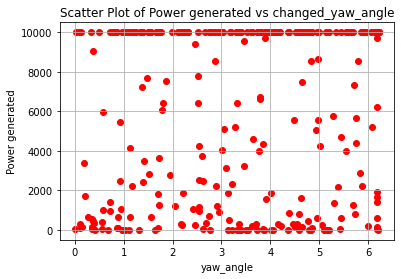

Power_list: [8786.178405904264, 10000.004435397732]
Predefined Yaw Angle 1: 55.596772735932454
Predefined Yaw Angle 2: 49.89175392720427
Changed Yaw Angle 1: 5.596772735932455
Changed Yaw Angle 2: -0.1082460727957274
Predefined Yaw Angle 1: 55.74811006066952
Predefined Yaw Angle 2: 50.27946587773836
Changed Yaw Angle 1: 5.748110060669516
Changed Yaw Angle 2: 0.2794658777383627
farm_power_baseline : [  68.61572989 3972.71800001], farm_power_yaw : [ 313.171392   8990.37725477]


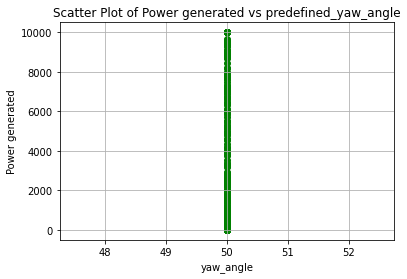

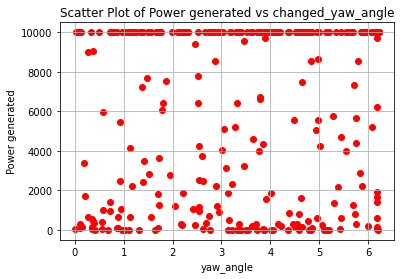

Power_list: [3972.718000006386, 9032.193673819558]
Predefined Yaw Angle 1: 53.912243185308526
Predefined Yaw Angle 2: 51.45581479086841
Changed Yaw Angle 1: 3.9122431853085256
Changed Yaw Angle 2: 1.4558147908684116
farm_power_baseline : [2430.25461204  347.17631917], farm_power_yaw : [4983.71343221  806.4263439 ]


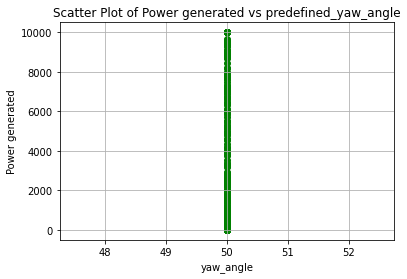

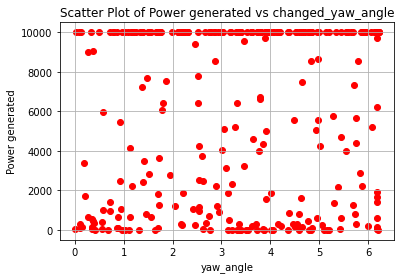

Power_list: [2430.2546120409497, 6375.914536252712]
Predefined Yaw Angle 1: 55.3363448760947
Predefined Yaw Angle 2: 50.09391412352873
Changed Yaw Angle 1: 5.336344876094697
Changed Yaw Angle 2: 0.09391412352872688
farm_power_baseline : [4760.33532252  257.16623243], farm_power_yaw : [9999.992395   729.6506232]


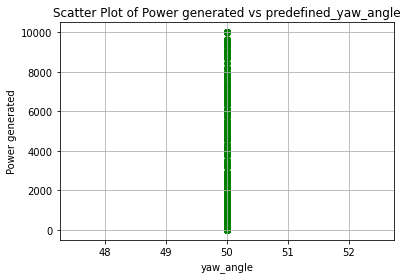

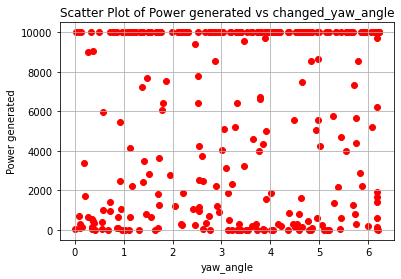

Power_list: [4760.335322516375, 9999.992715236132]
Predefined Yaw Angle 1: 52.57103211713496
Predefined Yaw Angle 2: 54.77819600190018
Changed Yaw Angle 1: 2.571032117134962
Changed Yaw Angle 2: 4.77819600190018
farm_power_baseline : [  939.93066876 10000.00481109], farm_power_yaw : [2245.20782393 9999.98444992]


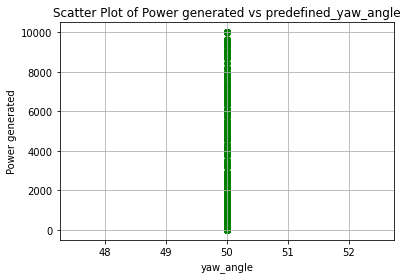

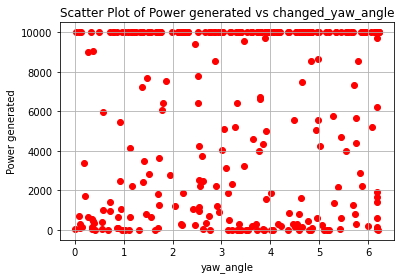

Power_list: [10000.004811088747, 9999.98444992301]
Predefined Yaw Angle 1: 56.02684715300157
Predefined Yaw Angle 2: 51.57523958942111
Changed Yaw Angle 1: 6.02684715300157
Changed Yaw Angle 2: 1.5752395894211073
farm_power_baseline : [   72.57849327 10000.00036535], farm_power_yaw : [  323.63851267 10000.01421482]


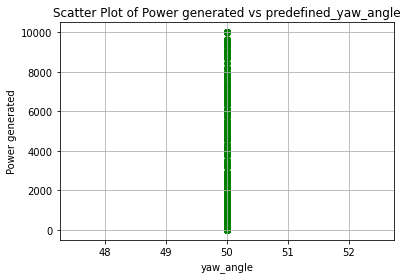

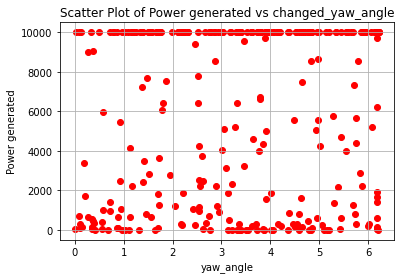

Power_list: [10000.000365350033, 10000.0142148183]
Predefined Yaw Angle 1: 55.59392368619829
Predefined Yaw Angle 2: 54.18899744338272
Changed Yaw Angle 1: 5.593923686198289
Changed Yaw Angle 2: 4.188997443382721
farm_power_baseline : [9059.32144719 5777.59989768], farm_power_yaw : [10000.00361935  9999.99664122]


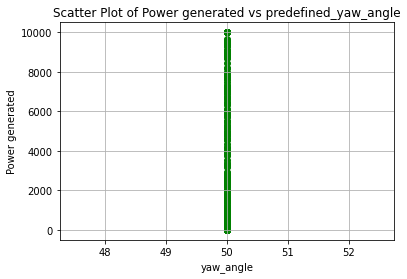

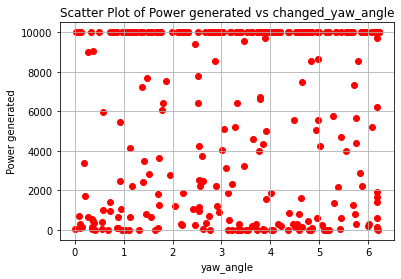

Power_list: [9059.321447193408, 10000.003619346455]
Predefined Yaw Angle 1: 54.36783707720721
Predefined Yaw Angle 2: 54.56476228265796
Changed Yaw Angle 1: 4.3678370772072155
Changed Yaw Angle 2: 4.564762282657959
farm_power_baseline : [2393.01226203  263.12987738], farm_power_yaw : [5459.69185317  740.76240028]


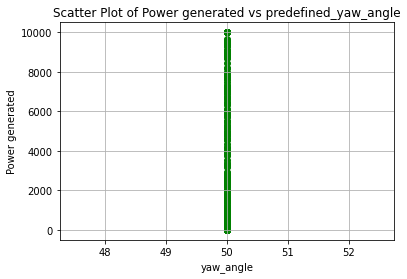

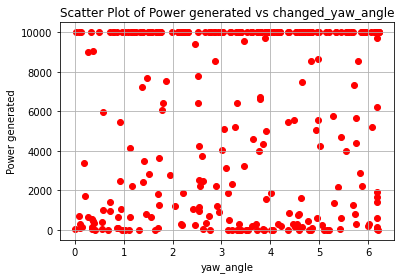

Power_list: [2393.012262032976, 5490.223950740671]
Predefined Yaw Angle 1: 54.245821156071926
Predefined Yaw Angle 2: 53.2395458936753
Changed Yaw Angle 1: 4.245821156071927
Changed Yaw Angle 2: 3.2395458936753023
farm_power_baseline : [2533.27760183 9999.99588942], farm_power_yaw : [ 5771.93691373 10000.00465246]


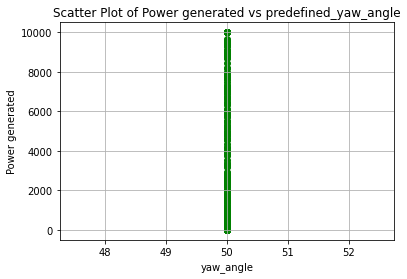

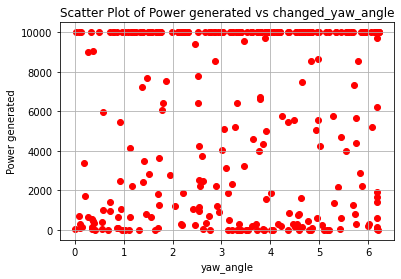

Power_list: [9999.99588941994, 10000.006445505274]
Predefined Yaw Angle 1: 55.64211571665214
Predefined Yaw Angle 2: 52.13977700992832
Changed Yaw Angle 1: 5.642115716652144
Changed Yaw Angle 2: 2.139777009928322
farm_power_baseline : [ 638.6619535  2706.44944619], farm_power_yaw : [1584.08787692 6170.64188561]


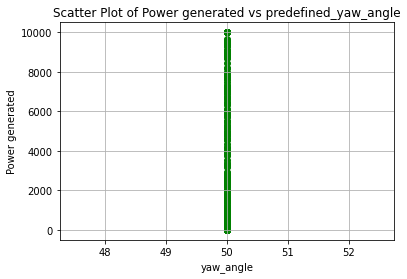

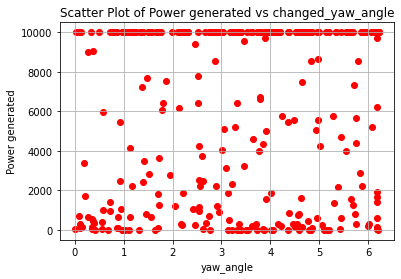

Power_list: [2706.4494461873815, 6202.576958980014]
Predefined Yaw Angle 1: 50.899570631401026
Predefined Yaw Angle 2: 51.73441712724931
Changed Yaw Angle 1: 0.8995706314010239
Changed Yaw Angle 2: 1.734417127249307
farm_power_baseline : [3611.27134971  676.76810663], farm_power_yaw : [7198.75117676 1430.35388445]


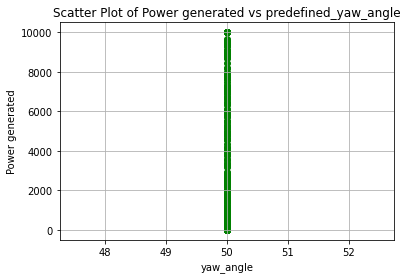

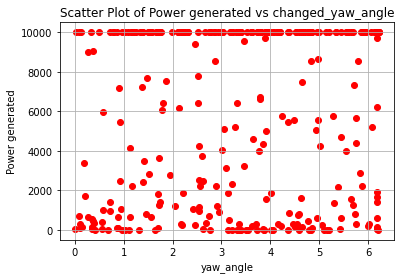

Power_list: [3611.2713497112645, 8264.491174622199]
Predefined Yaw Angle 1: 55.94589291481756
Predefined Yaw Angle 2: 54.41819308153658
Changed Yaw Angle 1: 5.945892914817559
Changed Yaw Angle 2: 4.418193081536576
farm_power_baseline : [306.57022252  33.1937509 ], farm_power_yaw : [841.20720767 215.56474582]


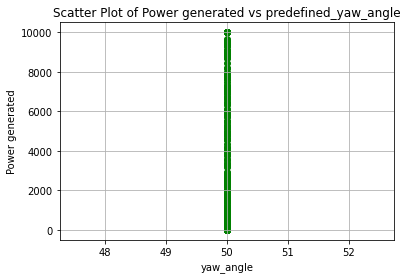

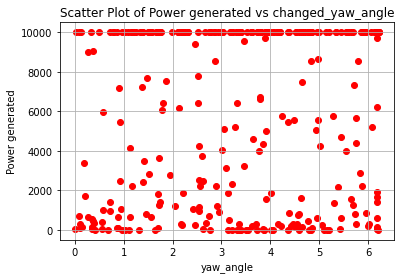

Power_list: [306.5702225231013, 849.0644364166319]
Predefined Yaw Angle 1: 50.36966808692348
Predefined Yaw Angle 2: 53.466768928409735
Changed Yaw Angle 1: 0.36966808692348024
Changed Yaw Angle 2: 3.466768928409735
farm_power_baseline : [2586.85971263 5108.73695731], farm_power_yaw : [5911.59013593 9999.99686441]


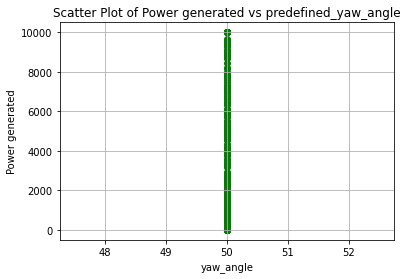

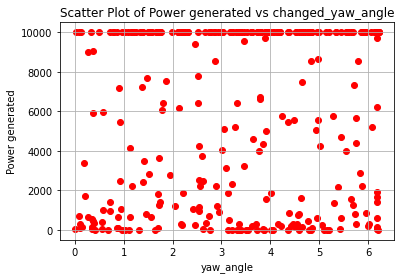

Power_list: [5108.736957308133, 9999.996864411161]
Predefined Yaw Angle 1: 55.31441214662124
Predefined Yaw Angle 2: 51.698723977581466
Changed Yaw Angle 1: 5.31441214662124
Changed Yaw Angle 2: 1.6987239775814655
farm_power_baseline : [9319.63919231 1482.93690118], farm_power_yaw : [10000.0024433   3432.71924254]


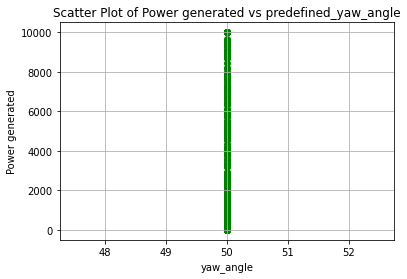

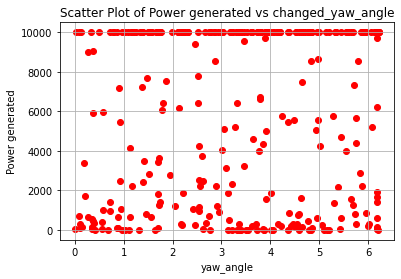

Power_list: [9319.639192307772, 10000.002443300415]
Predefined Yaw Angle 1: 52.963267009855684
Predefined Yaw Angle 2: 53.81502943889496
Changed Yaw Angle 1: 2.9632670098556853
Changed Yaw Angle 2: 3.815029438894961
farm_power_baseline : [   0.         9999.98857027], farm_power_yaw : [    0.         10000.00961696]


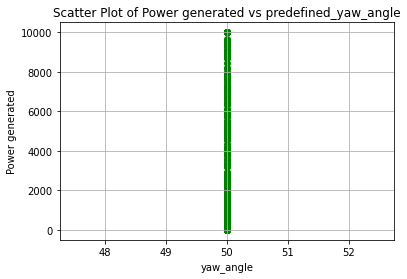

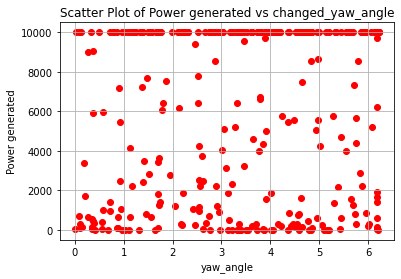

Power_list: [9999.988570269352, 10000.009616961983]
Predefined Yaw Angle 1: 55.80363909992654
Predefined Yaw Angle 2: 54.18682137445602
Changed Yaw Angle 1: 5.80363909992654
Changed Yaw Angle 2: 4.186821374456018
farm_power_baseline : [3515.30453273  728.51846786], farm_power_yaw : [7965.76148762 1780.31747192]


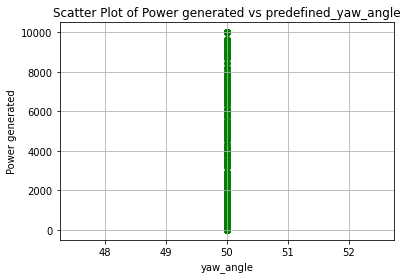

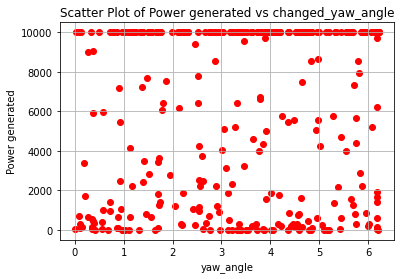

Power_list: [3515.3045327299264, 8024.122128142422]
Predefined Yaw Angle 1: 50.507998066843406
Predefined Yaw Angle 2: 55.65249474354222
Changed Yaw Angle 1: 0.5079980668434033
Changed Yaw Angle 2: 5.652494743542217
farm_power_baseline : [ 694.67666006 8148.14900058], farm_power_yaw : [1709.75781444 9999.99656144]


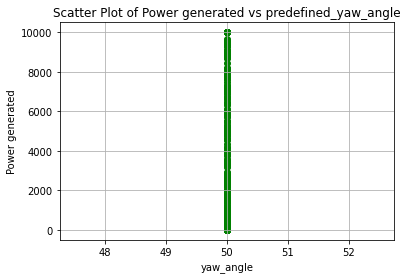

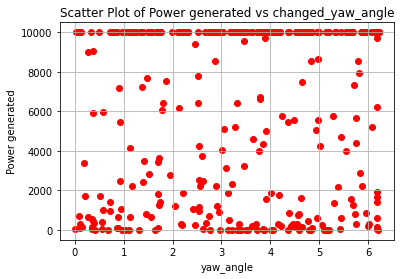

Power_list: [8148.149000576754, 9999.996992189604]
Predefined Yaw Angle 1: 50.048332251572255
Predefined Yaw Angle 2: 51.20270662928674
Changed Yaw Angle 1: 0.048332251572253106
Changed Yaw Angle 2: 1.2027066292867359
farm_power_baseline : [ 43.8504897  669.19482802], farm_power_yaw : [ 247.41768747 1660.54791151]


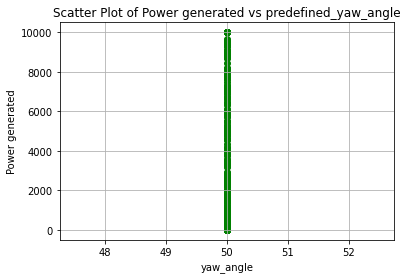

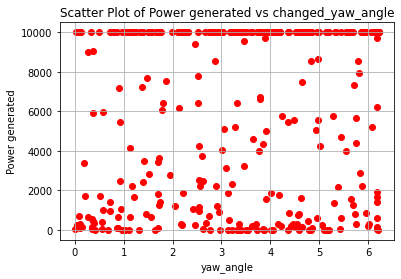

Power_list: [669.194828022205, 1660.9011159600905]
Predefined Yaw Angle 1: 50.109059881145654
Predefined Yaw Angle 2: 54.552847832573164
Changed Yaw Angle 1: 0.10905988114565283
Changed Yaw Angle 2: 4.552847832573163
farm_power_baseline : [1058.1389475   546.65933752], farm_power_yaw : [2524.62778509 1387.57526017]


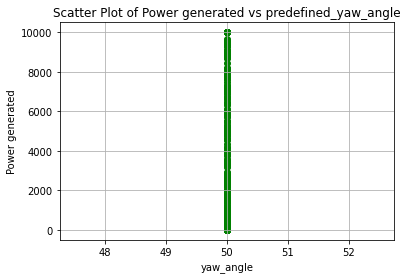

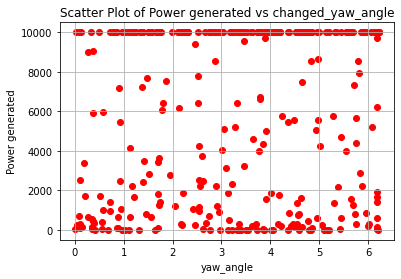

Power_list: [1058.1389474998628, 2532.2107166660994]
Predefined Yaw Angle 1: 51.269363931143005
Predefined Yaw Angle 2: 53.91167049484787
Changed Yaw Angle 1: 1.2693639311430038
Changed Yaw Angle 2: 3.9116704948478653
farm_power_baseline : [ 155.93205841 4027.18760382], farm_power_yaw : [ 505.67767167 9136.64044681]


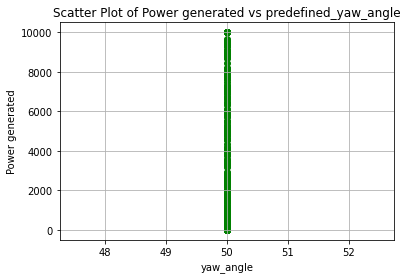

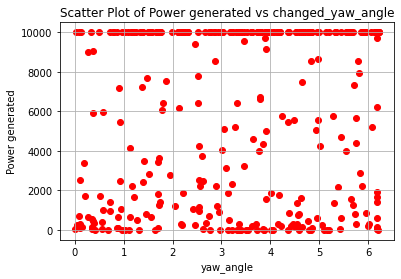

Power_list: [4027.187603824935, 9136.640446812577]
Predefined Yaw Angle 1: 54.07779806184109
Predefined Yaw Angle 2: 51.58224064045276
Changed Yaw Angle 1: 4.077798061841084
Changed Yaw Angle 2: 1.5822406404527622
farm_power_baseline : [10000.00327736  9999.99252254], farm_power_yaw : [ 9999.96664276 10000.0151805 ]


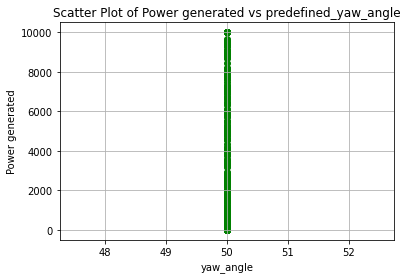

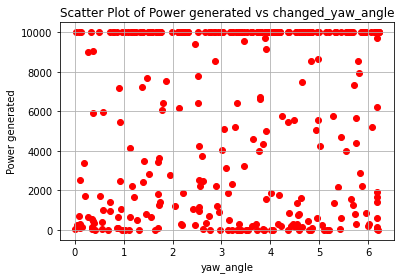

Power_list: [10000.003277357398, 10000.01518049607]
Predefined Yaw Angle 1: 51.67693410436873
Predefined Yaw Angle 2: 52.894136829769224
Changed Yaw Angle 1: 1.6769341043687305
Changed Yaw Angle 2: 2.894136829769224
farm_power_baseline : [9999.99678089  927.76579141], farm_power_yaw : [9999.98005369 2225.34786536]


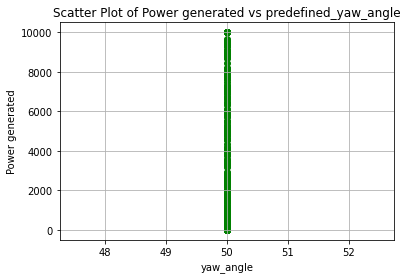

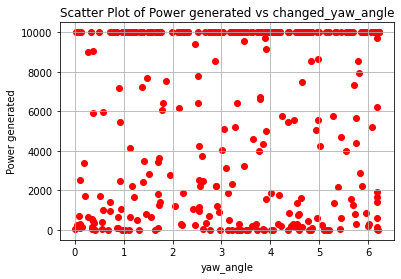

Power_list: [9999.99678088864, 9999.980053685566]
Predefined Yaw Angle 1: 51.803182853740594
Predefined Yaw Angle 2: 51.77663675264255
Changed Yaw Angle 1: 1.8031828537405907
Changed Yaw Angle 2: 1.7766367526425513
farm_power_baseline : [9999.99698459 1473.52088744], farm_power_yaw : [10000.01456991  3424.75350775]


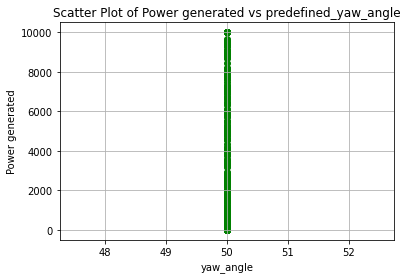

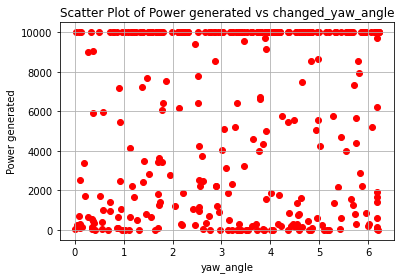

Power_list: [9999.996984594567, 10000.014569909074]
Predefined Yaw Angle 1: 54.8944806448798
Predefined Yaw Angle 2: 55.06144928280879
Changed Yaw Angle 1: 4.894480644879802
Changed Yaw Angle 2: 5.061449282808789
farm_power_baseline : [779.01015401  89.80757706], farm_power_yaw : [1902.14568407  357.07115254]


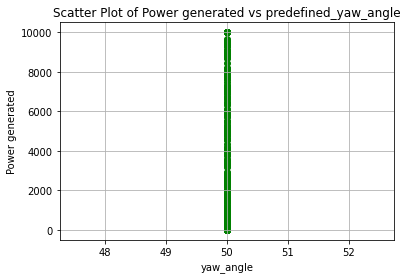

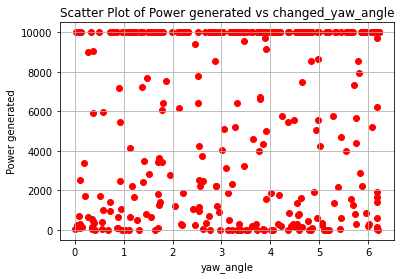

Power_list: [779.0101540065649, 1916.6908534113663]
Predefined Yaw Angle 1: 53.015151779477044
Predefined Yaw Angle 2: 56.080080170256544
Changed Yaw Angle 1: 3.015151779477045
Changed Yaw Angle 2: 6.080080170256544
farm_power_baseline : [2091.39951395 9999.99640244], farm_power_yaw : [4767.7148135  9999.98269083]


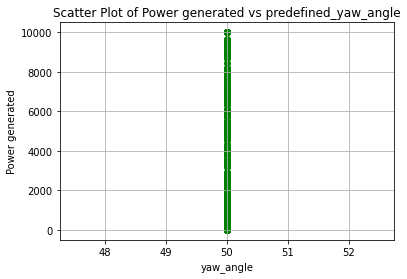

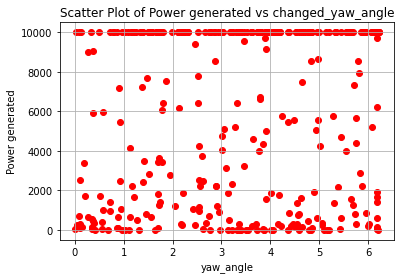

Power_list: [9999.996402440798, 9999.9855405415]
Predefined Yaw Angle 1: 55.85667542040325
Predefined Yaw Angle 2: 55.75488636323693
Changed Yaw Angle 1: 5.85667542040325
Changed Yaw Angle 2: 5.754886363236929
farm_power_baseline : [9247.09387746 9999.99681392], farm_power_yaw : [10000.00293749  9999.98524473]


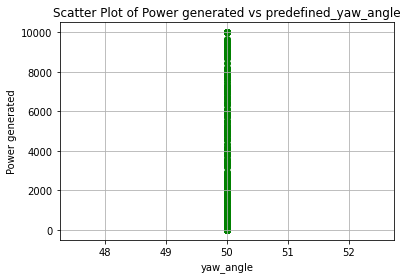

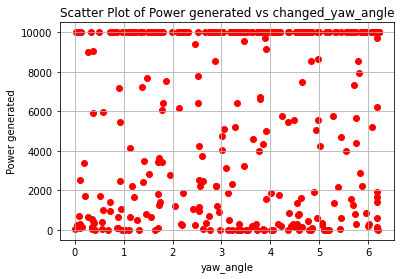

Power_list: [9999.996813923348, 10000.002937487432]
Predefined Yaw Angle 1: 54.73177588334585
Predefined Yaw Angle 2: 51.63963269405035
Changed Yaw Angle 1: 4.731775883345847
Changed Yaw Angle 2: 1.6396326940503514
farm_power_baseline : [   0.         1196.36736477], farm_power_yaw : [   0.         2804.71269512]


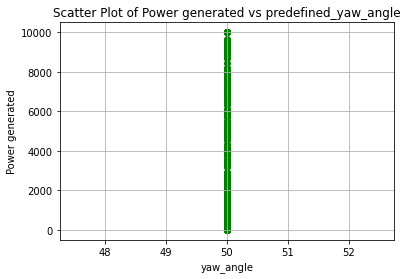

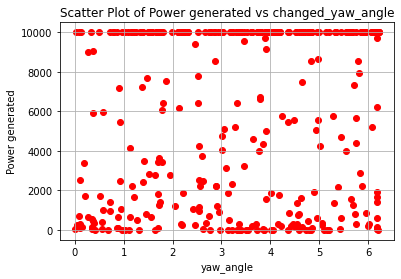

Power_list: [1196.3673647747994, 2814.219096058602]
Predefined Yaw Angle 1: 53.37743409941765
Predefined Yaw Angle 2: 55.81617741782845
Changed Yaw Angle 1: 3.3774340994176475
Changed Yaw Angle 2: 5.81617741782845
farm_power_baseline : [3786.3836504  5769.33308546], farm_power_yaw : [8560.83136542 9999.99656611]


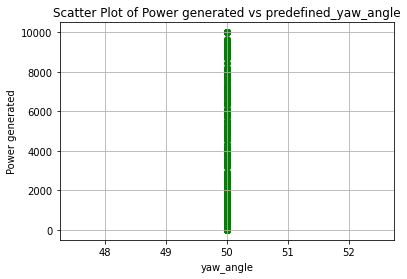

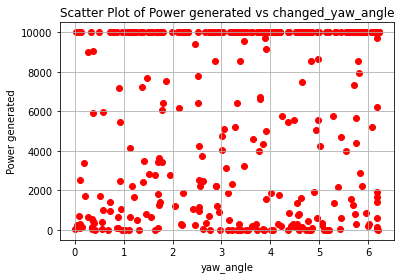

Power_list: [5769.33308545875, 9999.997129891168]
Predefined Yaw Angle 1: 50.77019792749147
Predefined Yaw Angle 2: 52.43403260824837
Changed Yaw Angle 1: 0.7701979274914733
Changed Yaw Angle 2: 2.4340326082483763
farm_power_baseline : [    0.         10000.00483509], farm_power_yaw : [   0.       9999.991583]


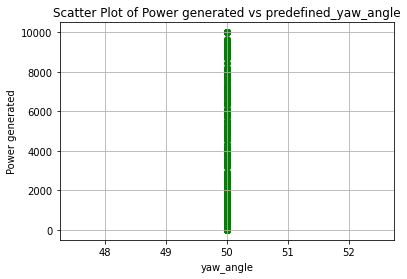

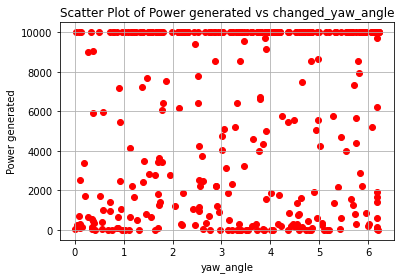

Power_list: [10000.004835085078, 9999.991582999883]
Predefined Yaw Angle 1: 51.852330559551625
Predefined Yaw Angle 2: 51.5347785824537
Changed Yaw Angle 1: 1.8523305595516215
Changed Yaw Angle 2: 1.534778582453697
farm_power_baseline : [0. 0.], farm_power_yaw : [ 0.         30.02010932]


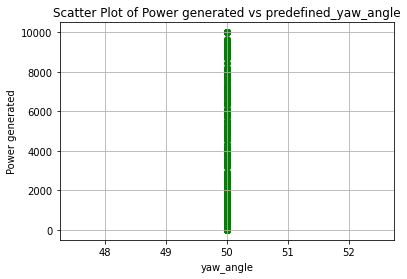

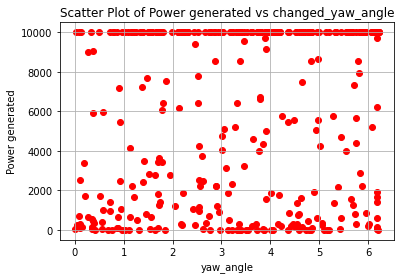

Power_list: [0.0, 30.12984277530262]
Predefined Yaw Angle 1: 53.605412672953335
Predefined Yaw Angle 2: 56.01611636719502
Changed Yaw Angle 1: 3.6054126729533356
Changed Yaw Angle 2: 6.01611636719502
farm_power_baseline : [ 104.06235017 6914.02228801], farm_power_yaw : [  388.55781781 10000.00488601]


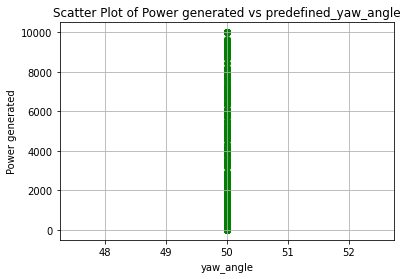

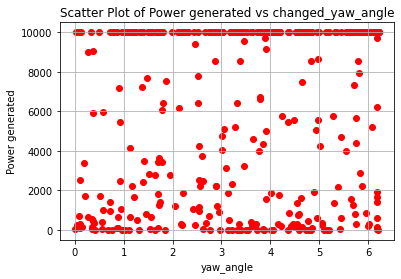

Power_list: [6914.0222880138135, 10000.00488600997]
Predefined Yaw Angle 1: 55.80226863722959
Predefined Yaw Angle 2: 52.9362360802812
Changed Yaw Angle 1: 5.802268637229585
Changed Yaw Angle 2: 2.936236080281197
farm_power_baseline : [6293.91605813 2557.06397443], farm_power_yaw : [10000.00422207  5815.8224606 ]


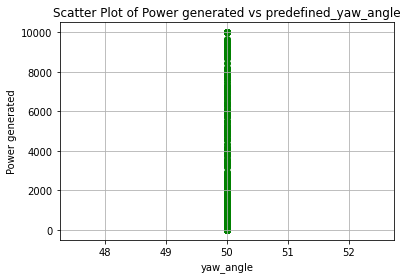

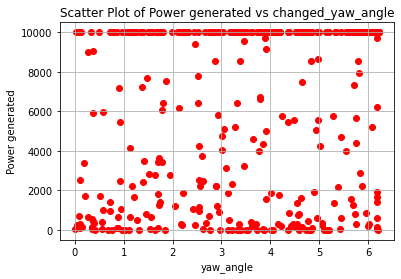

Power_list: [6293.916058127771, 10000.004764523872]
Predefined Yaw Angle 1: 51.948017538044006
Predefined Yaw Angle 2: 54.09453858162703
Changed Yaw Angle 1: 1.948017538044005
Changed Yaw Angle 2: 4.094538581627028
farm_power_baseline : [9999.99027909   18.10738595], farm_power_yaw : [10000.01361474   179.34039425]


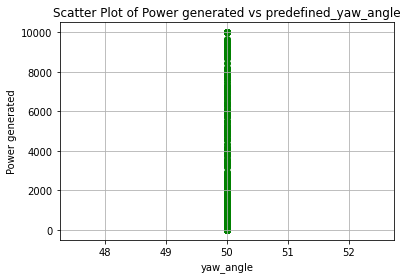

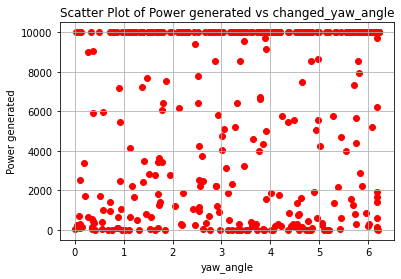

Power_list: [9999.9902790927, 10000.014122127728]
Predefined Yaw Angle 1: 54.76763002110158
Predefined Yaw Angle 2: 56.13506698991563
Changed Yaw Angle 1: 4.767630021101583
Changed Yaw Angle 2: 6.135066989915628
farm_power_baseline : [1763.11192291 9999.99689746], farm_power_yaw : [4036.3196795  9999.98846371]


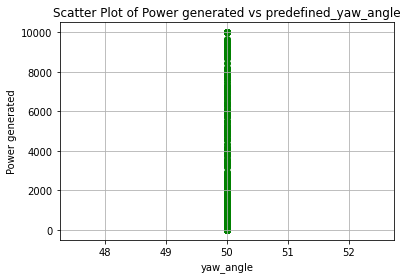

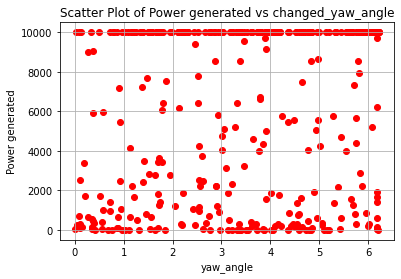

Power_list: [9999.996897464867, 9999.988463709788]
Predefined Yaw Angle 1: 53.589645427719525
Predefined Yaw Angle 2: 51.06776572159102
Changed Yaw Angle 1: 3.5896454277195216
Changed Yaw Angle 2: 1.0677657215910203
farm_power_baseline : [23.96095898  0.        ], farm_power_yaw : [192.52560361   0.        ]


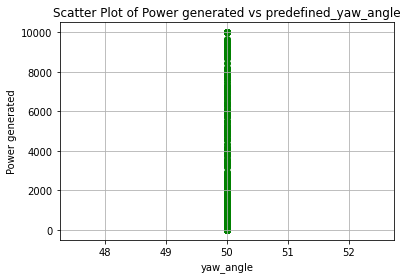

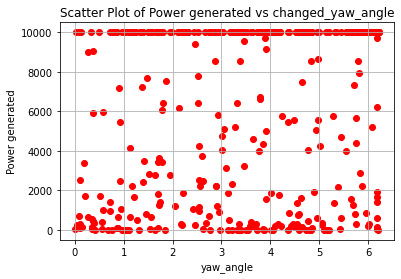

Power_list: [23.960958978749048, 193.23477733476682]
Predefined Yaw Angle 1: 56.17610295103062
Predefined Yaw Angle 2: 53.85144736785347
Changed Yaw Angle 1: 6.176102951030624
Changed Yaw Angle 2: 3.8514473678534675
farm_power_baseline : [   0.         9999.99259552], farm_power_yaw : [    0.         10000.01713072]


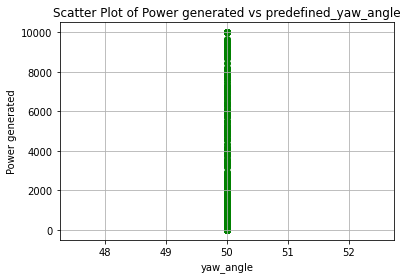

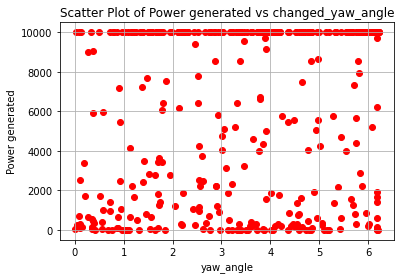

Power_list: [9999.992595516891, 10000.017130724293]
Predefined Yaw Angle 1: 51.98630820188106
Predefined Yaw Angle 2: 54.44429259285157
Changed Yaw Angle 1: 1.9863082018810554
Changed Yaw Angle 2: 4.44429259285157
farm_power_baseline : [3130.58700807 2289.68078545], farm_power_yaw : [7128.929249   5252.15746697]


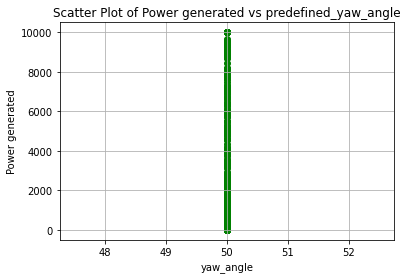

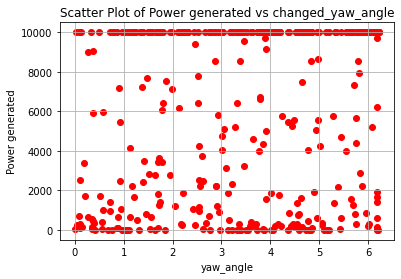

Power_list: [3130.587008071522, 7152.735598777955]
Predefined Yaw Angle 1: 54.57443366298288
Predefined Yaw Angle 2: 56.1583275715086
Changed Yaw Angle 1: 4.574433662982875
Changed Yaw Angle 2: 6.158327571508598
farm_power_baseline : [   0.         9999.99142156], farm_power_yaw : [    0.         10000.01525552]


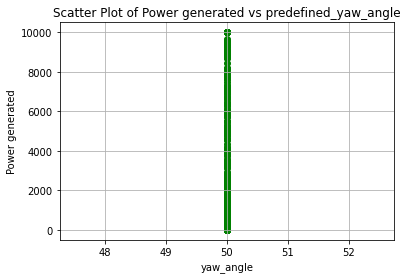

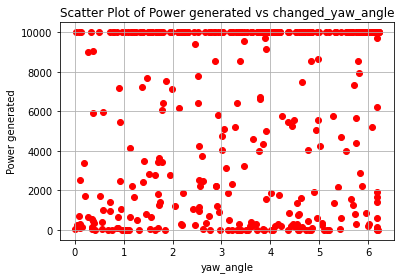

Power_list: [9999.991421563169, 10000.016769178052]
Predefined Yaw Angle 1: 54.96554177224638
Predefined Yaw Angle 2: 53.399475375037284
Changed Yaw Angle 1: 4.965541772246386
Changed Yaw Angle 2: 3.399475375037286
farm_power_baseline : [9999.99599464 1448.8015886 ], farm_power_yaw : [9999.99988878 3361.70249904]


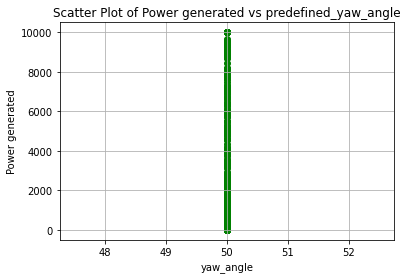

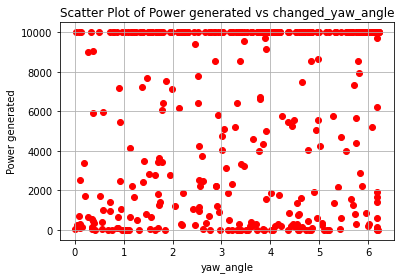

Power_list: [9999.995994638557, 10000.002157977182]
Predefined Yaw Angle 1: 52.49226886157976
Predefined Yaw Angle 2: 53.2726878681769
Changed Yaw Angle 1: 2.4922688615797597
Changed Yaw Angle 2: 3.2726878681769023
farm_power_baseline : [   0.         4031.44440528], farm_power_yaw : [   0.         9146.46002552]


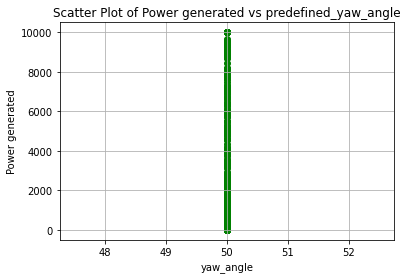

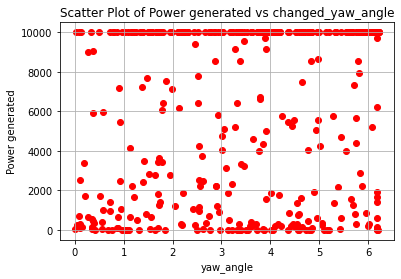

Power_list: [4031.4444052755307, 9167.933926312451]
Predefined Yaw Angle 1: 54.13896607839024
Predefined Yaw Angle 2: 52.91037092714213
Changed Yaw Angle 1: 4.138966078390242
Changed Yaw Angle 2: 2.910370927142129
farm_power_baseline : [ 1041.08722808 10000.00284154], farm_power_yaw : [2471.0847485 9999.9627212]


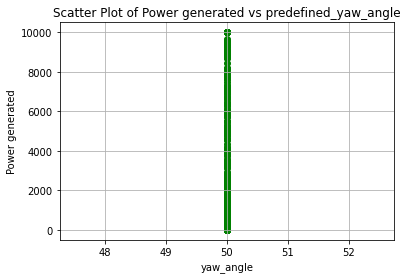

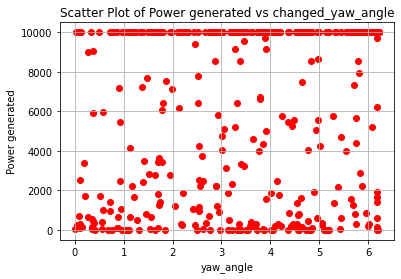

Power_list: [10000.002841538859, 9999.962721203381]
Predefined Yaw Angle 1: 55.98280645805493
Predefined Yaw Angle 2: 53.833488607358625
Changed Yaw Angle 1: 5.982806458054929
Changed Yaw Angle 2: 3.833488607358627
farm_power_baseline : [4969.15344169 5779.57025411], farm_power_yaw : [9999.99553757 9999.99664925]


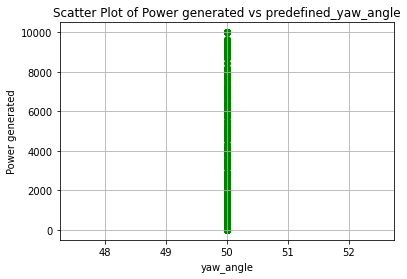

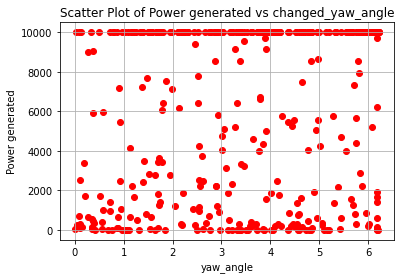

Power_list: [5779.570254110313, 9999.996649249802]
Predefined Yaw Angle 1: 55.67621323335287
Predefined Yaw Angle 2: 55.08347149449487
Changed Yaw Angle 1: 5.676213233352865
Changed Yaw Angle 2: 5.083471494494873
farm_power_baseline : [9999.99686342    0.        ], farm_power_yaw : [9999.98680837    0.        ]


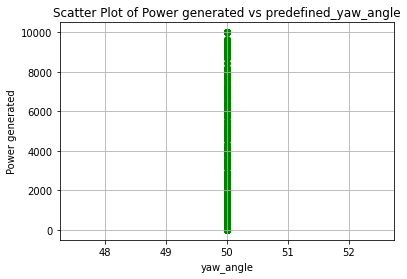

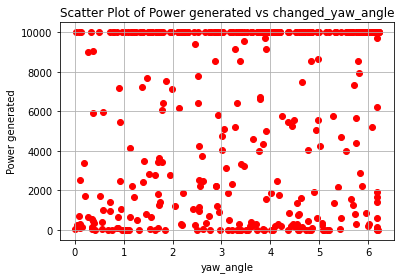

Power_list: [9999.99686341826, 9999.98680836731]
Predefined Yaw Angle 1: 54.688259831133955
Predefined Yaw Angle 2: 52.826867511162696
Changed Yaw Angle 1: 4.688259831133952
Changed Yaw Angle 2: 2.826867511162695
farm_power_baseline : [2384.51031476 6903.07937417], farm_power_yaw : [ 5449.20759297 10000.0048664 ]


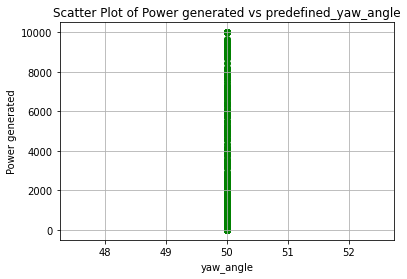

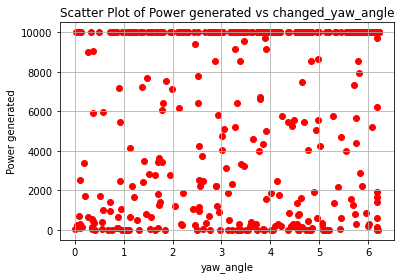

Power_list: [6903.079374168051, 10000.004866399155]
Predefined Yaw Angle 1: 55.927409511587975
Predefined Yaw Angle 2: 56.02421184427664
Changed Yaw Angle 1: 5.927409511587973
Changed Yaw Angle 2: 6.0242118442766435
farm_power_baseline : [1226.2454332    0.       ], farm_power_yaw : [2851.32919243    0.        ]


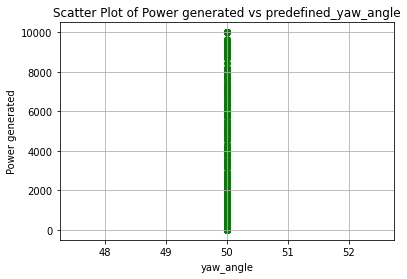

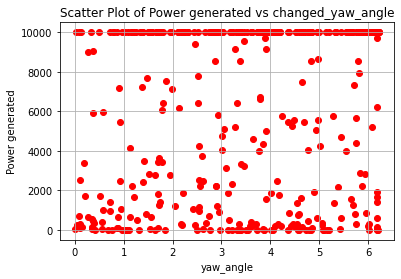

Power_list: [1226.245433195619, 2882.2015192623608]
Predefined Yaw Angle 1: 54.65499535122221
Predefined Yaw Angle 2: 52.008978116676005
Changed Yaw Angle 1: 4.654995351222208
Changed Yaw Angle 2: 2.008978116676007
farm_power_baseline : [  559.8882742  10000.00033565], farm_power_yaw : [ 1411.8491696  10000.01419861]


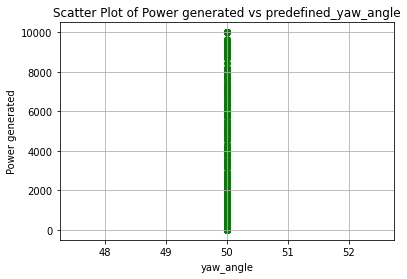

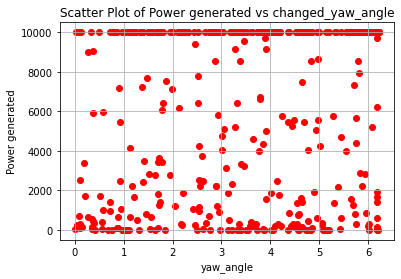

Power_list: [10000.000335645955, 10000.0141986071]
Predefined Yaw Angle 1: 55.13222529644892
Predefined Yaw Angle 2: 50.50681877486545
Changed Yaw Angle 1: 5.13222529644892
Changed Yaw Angle 2: 0.5068187748654503
farm_power_baseline : [2480.13127309 9999.99695811], farm_power_yaw : [5655.28539392 9999.99147594]


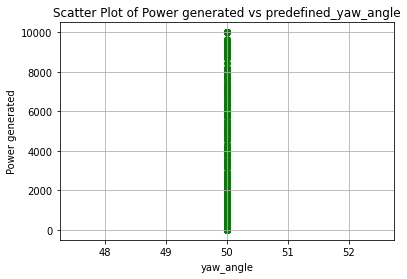

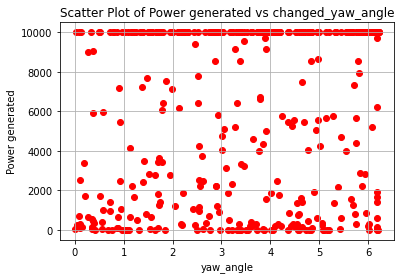

Power_list: [9999.996958107618, 9999.99147593994]
Predefined Yaw Angle 1: 54.483235309349766
Predefined Yaw Angle 2: 55.95000978472042
Changed Yaw Angle 1: 4.483235309349766
Changed Yaw Angle 2: 5.950009784720419
farm_power_baseline : [1058.48055092 9999.99968776], farm_power_yaw : [ 2512.73116697 10000.01432077]


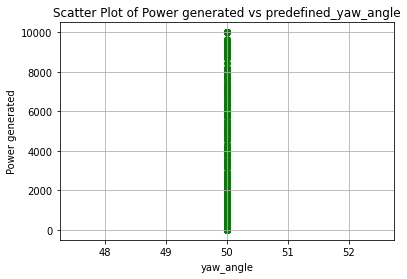

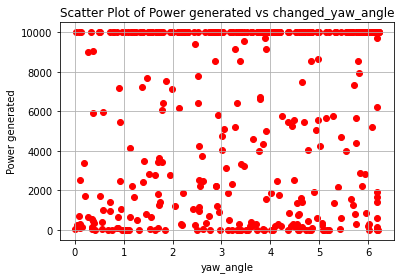

Power_list: [9999.999687755657, 10000.014320771914]
Predefined Yaw Angle 1: 54.41548555648259
Predefined Yaw Angle 2: 51.35599605110283
Changed Yaw Angle 1: 4.415485556482586
Changed Yaw Angle 2: 1.3559960511028246
farm_power_baseline : [9999.99408612 6341.82340199], farm_power_yaw : [10000.00765004 10000.00518737]


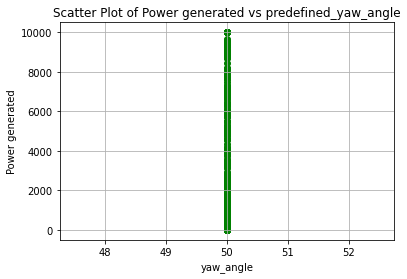

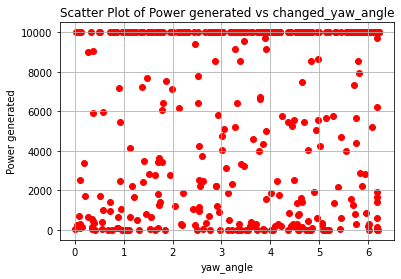

Power_list: [9999.99408611781, 10000.00765003845]
Predefined Yaw Angle 1: 54.380185089917475
Predefined Yaw Angle 2: 53.850428176104295
Changed Yaw Angle 1: 4.380185089917477
Changed Yaw Angle 2: 3.850428176104294
farm_power_baseline : [9999.99586832 4106.26619501], farm_power_yaw : [10000.00516555  9294.4296548 ]


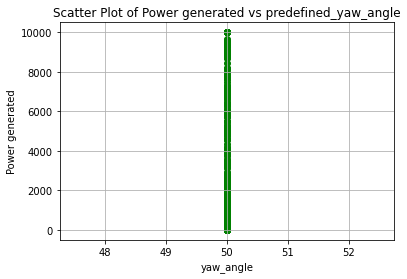

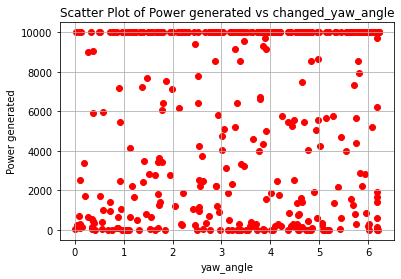

Power_list: [9999.99586832375, 10000.005165551629]
Predefined Yaw Angle 1: 55.827214999792574
Predefined Yaw Angle 2: 55.203999241213026
Changed Yaw Angle 1: 5.8272149997925755
Changed Yaw Angle 2: 5.203999241213025
farm_power_baseline : [653.63023469   0.        ], farm_power_yaw : [1611.4291224     6.13394033]


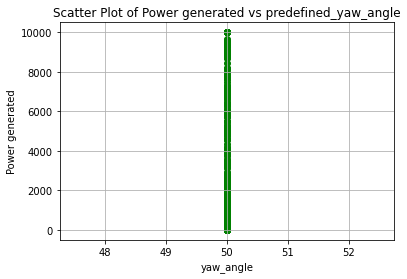

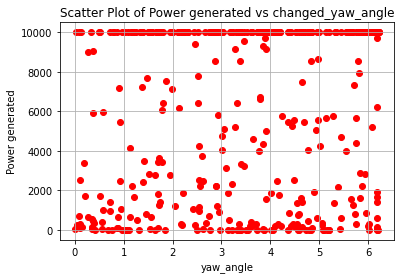

Power_list: [653.6302346929798, 1626.2095296446096]
Predefined Yaw Angle 1: 52.94629548317694
Predefined Yaw Angle 2: 53.60366552845195
Changed Yaw Angle 1: 2.9462954831769377
Changed Yaw Angle 2: 3.60366552845195
farm_power_baseline : [   0.        7757.2091754], farm_power_yaw : [   0.         9999.99692132]


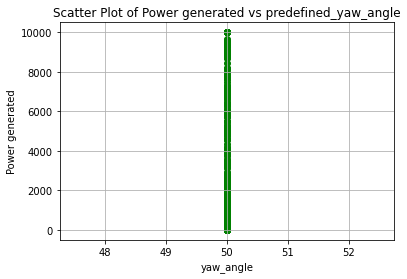

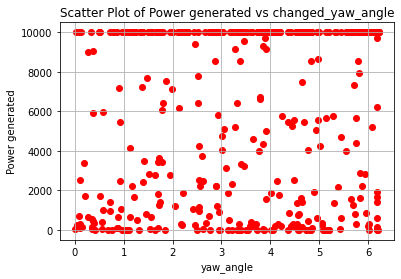

Power_list: [7757.209175403434, 9999.996921321013]
Predefined Yaw Angle 1: 55.51881029291704
Predefined Yaw Angle 2: 55.303085877994945
Changed Yaw Angle 1: 5.518810292917039
Changed Yaw Angle 2: 5.303085877994949
farm_power_baseline : [2336.71548101 9999.99590721], farm_power_yaw : [ 5325.78582727 10000.00203958]


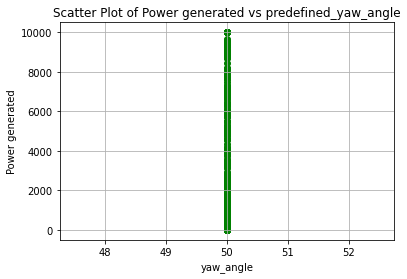

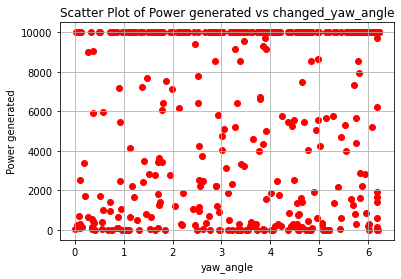

Power_list: [9999.995907214347, 10000.005720405243]
Predefined Yaw Angle 1: 55.52359119970595
Predefined Yaw Angle 2: 53.60602109443612
Changed Yaw Angle 1: 5.52359119970595
Changed Yaw Angle 2: 3.6060210944361253
farm_power_baseline : [3142.75823045 5477.36131771], farm_power_yaw : [7136.4985014  9999.99617382]


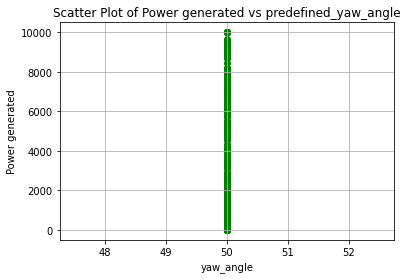

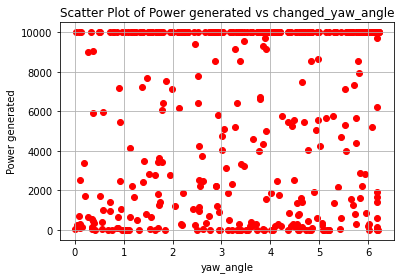

Power_list: [5477.361317708486, 9999.996173824473]
Predefined Yaw Angle 1: 56.03604304824562
Predefined Yaw Angle 2: 52.62827692025603
Changed Yaw Angle 1: 6.036043048245613
Changed Yaw Angle 2: 2.628276920256031
farm_power_baseline : [9999.99186907    0.        ], farm_power_yaw : [10000.01668177     0.        ]


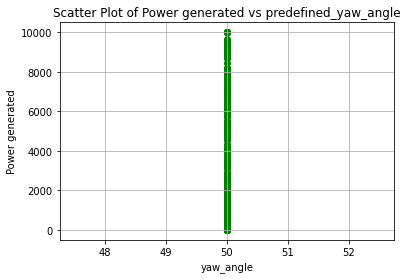

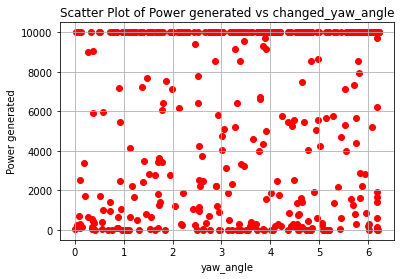

Power_list: [9999.991869068936, 10000.01779865885]
Predefined Yaw Angle 1: 55.44686393080411
Predefined Yaw Angle 2: 55.78698917228118
Changed Yaw Angle 1: 5.446863930804113
Changed Yaw Angle 2: 5.786989172281181
farm_power_baseline : [  35.13606197 6694.72410241], farm_power_yaw : [  220.41522594 10000.00544439]


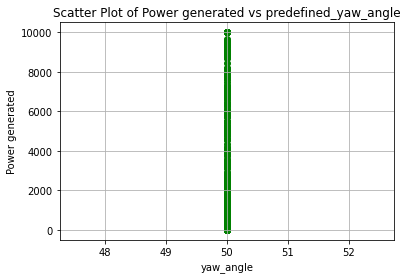

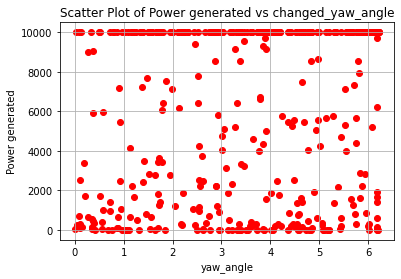

Power_list: [6694.724102406902, 10000.005444392216]
Predefined Yaw Angle 1: 53.20032190270247
Predefined Yaw Angle 2: 51.22290936931608
Changed Yaw Angle 1: 3.2003219027024725
Changed Yaw Angle 2: 1.2229093693160769
farm_power_baseline : [1586.76823361  931.4861057 ], farm_power_yaw : [3672.70063475 2232.97972862]


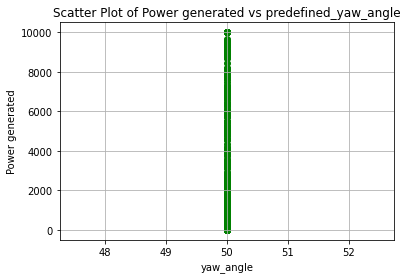

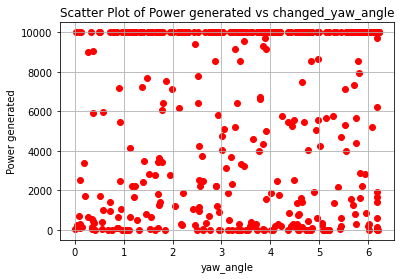

Power_list: [1586.7682336125863, 3678.9473167685856]
Predefined Yaw Angle 1: 54.93563394057258
Predefined Yaw Angle 2: 52.11980916070713
Changed Yaw Angle 1: 4.935633940572578
Changed Yaw Angle 2: 2.1198091607071263
farm_power_baseline : [1877.2482803  9647.15499931], farm_power_yaw : [ 4314.44134464 10000.00106875]


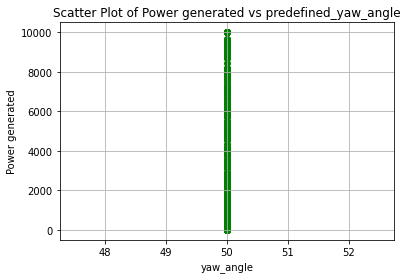

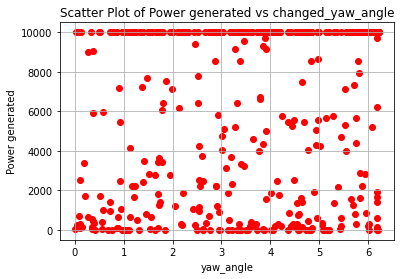

Power_list: [9647.15499930948, 10000.001068747468]
Predefined Yaw Angle 1: 55.26310261979534
Predefined Yaw Angle 2: 53.57381575368991
Changed Yaw Angle 1: 5.263102619795338
Changed Yaw Angle 2: 3.573815753689906
farm_power_baseline : [6141.04652471  425.24041048], farm_power_yaw : [10000.00202484  1103.26944955]


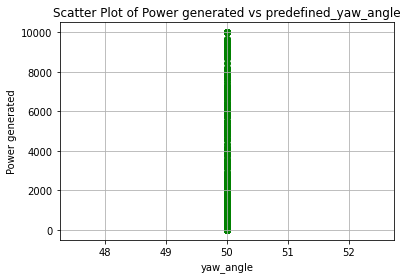

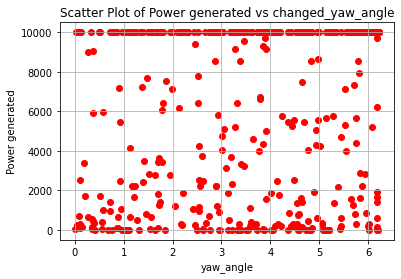

Power_list: [6141.046524709888, 10000.002539703768]
Predefined Yaw Angle 1: 50.4723944326777
Predefined Yaw Angle 2: 53.96764188516195
Changed Yaw Angle 1: 0.4723944326777021
Changed Yaw Angle 2: 3.9676418851619517
farm_power_baseline : [2686.9308239  9477.73024483], farm_power_yaw : [ 6142.83045688 10000.00170462]


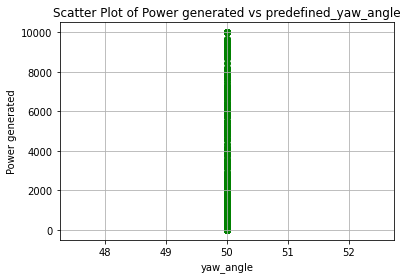

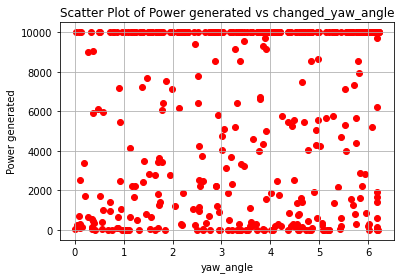

Power_list: [9477.730244829172, 10000.001704618637]
Predefined Yaw Angle 1: 52.545414637977274
Predefined Yaw Angle 2: 55.53054753196305
Changed Yaw Angle 1: 2.545414637977272
Changed Yaw Angle 2: 5.530547531963053
farm_power_baseline : [1424.91673836 2970.55957245], farm_power_yaw : [3314.7981246 6754.1056605]


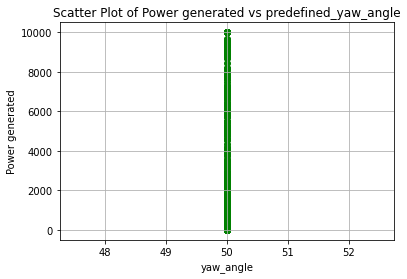

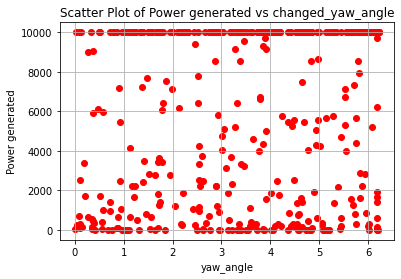

Power_list: [2970.5595724495374, 6790.703151761125]
Predefined Yaw Angle 1: 55.691493919055524
Predefined Yaw Angle 2: 54.8166808101807
Changed Yaw Angle 1: 5.691493919055522
Changed Yaw Angle 2: 4.816680810180697
farm_power_baseline : [10000.00078082  8255.70647822], farm_power_yaw : [10000.01419061  9999.99750013]


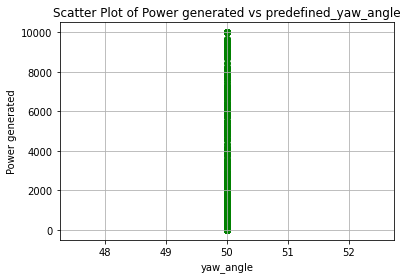

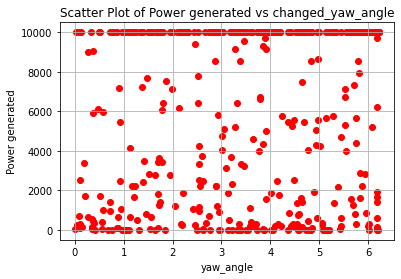

Power_list: [10000.000780817885, 10000.014190611464]
Predefined Yaw Angle 1: 56.02376267982704
Predefined Yaw Angle 2: 56.049239699568986
Changed Yaw Angle 1: 6.02376267982704
Changed Yaw Angle 2: 6.049239699568989
farm_power_baseline : [9437.79767456 4254.94121589], farm_power_yaw : [10000.00217479  9548.78374362]


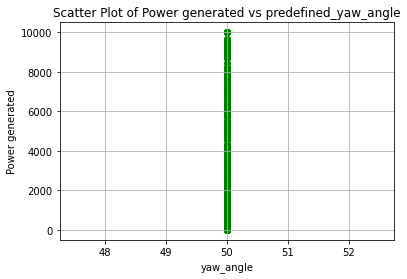

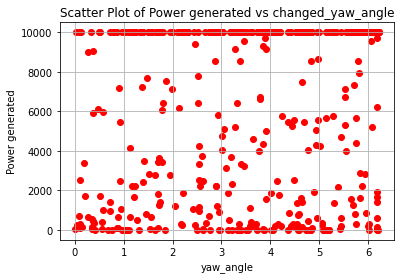

Power_list: [9437.797674555524, 10000.002174786478]
Predefined Yaw Angle 1: 55.9757219169231
Predefined Yaw Angle 2: 56.086248583973386
Changed Yaw Angle 1: 5.9757219169231
Changed Yaw Angle 2: 6.086248583973385
farm_power_baseline : [1827.9611174    0.       ], farm_power_yaw : [4179.94843848   72.99986181]


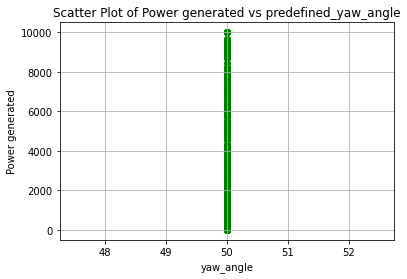

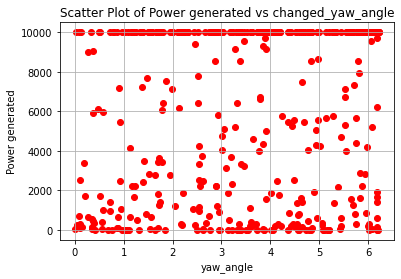

Power_list: [1827.961117397628, 4225.648717872307]
Predefined Yaw Angle 1: 55.78517167566349
Predefined Yaw Angle 2: 56.07456103521346
Changed Yaw Angle 1: 5.785171675663495
Changed Yaw Angle 2: 6.074561035213463
farm_power_baseline : [10000.0040447   9999.99594195], farm_power_yaw : [10000.01382414  9999.999888  ]


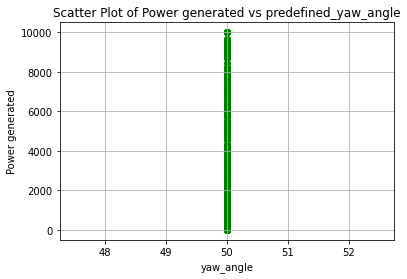

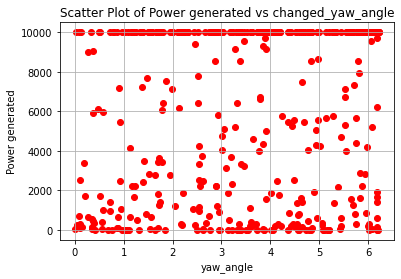

Power_list: [10000.004044703368, 10000.013824136578]
Predefined Yaw Angle 1: 55.68348526102544
Predefined Yaw Angle 2: 55.54088112962478
Changed Yaw Angle 1: 5.683485261025435
Changed Yaw Angle 2: 5.540881129624778
farm_power_baseline : [  0.        217.9214846], farm_power_yaw : [ 17.97173214 644.28207105]


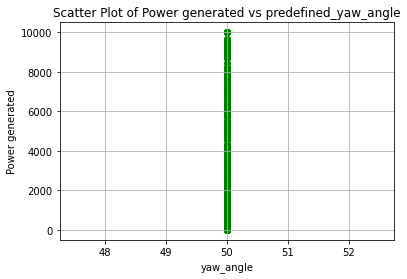

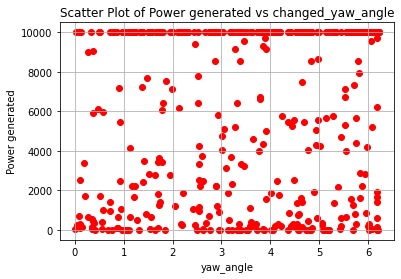

Power_list: [217.9214845967413, 651.1193720550888]
Predefined Yaw Angle 1: 55.87827152631492
Predefined Yaw Angle 2: 55.52643454597553
Changed Yaw Angle 1: 5.878271526314921
Changed Yaw Angle 2: 5.526434545975534
farm_power_baseline : [ 9999.99367796 10000.0016511 ], farm_power_yaw : [10000.01284242 10000.01410127]


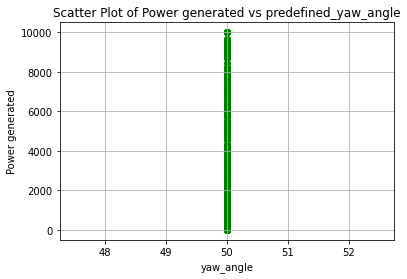

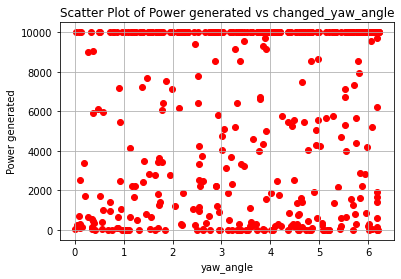

Power_list: [10000.001651099512, 10000.01410127103]
Predefined Yaw Angle 1: 56.03050953213265
Predefined Yaw Angle 2: 56.149219027948305
Changed Yaw Angle 1: 6.030509532132647
Changed Yaw Angle 2: 6.149219027948308
farm_power_baseline : [10000.00547987   184.3271346 ], farm_power_yaw : [10000.01144508   570.13491033]


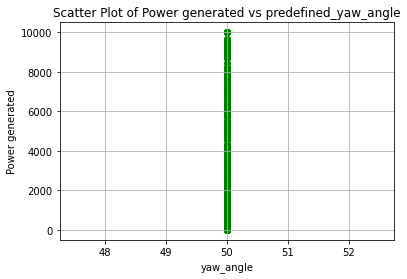

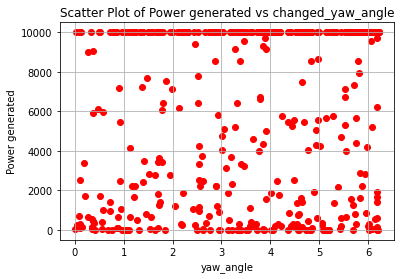

Power_list: [10000.005479871554, 10000.011445075867]
Predefined Yaw Angle 1: 54.72156958478423
Predefined Yaw Angle 2: 50.573874840847694
Changed Yaw Angle 1: 4.721569584784227
Changed Yaw Angle 2: 0.5738748408476917
farm_power_baseline : [2476.79918137  311.8767732 ], farm_power_yaw : [5651.26805237  859.29754755]


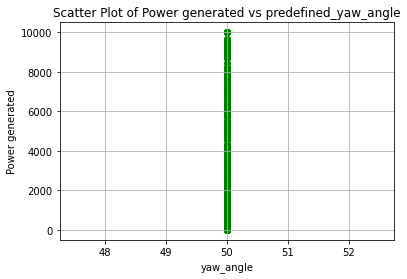

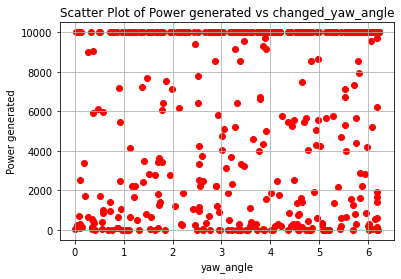

Power_list: [2476.7991813678345, 5655.64150767946]
Predefined Yaw Angle 1: 55.76526507914737
Predefined Yaw Angle 2: 54.84871064861108
Changed Yaw Angle 1: 5.765265079147371
Changed Yaw Angle 2: 4.84871064861108
farm_power_baseline : [9059.79740769    0.        ], farm_power_yaw : [10000.00365901    23.95938764]


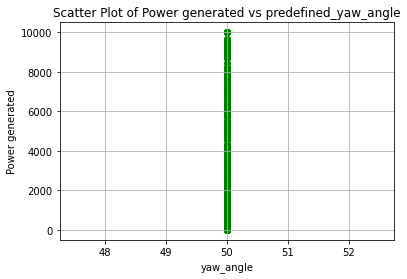

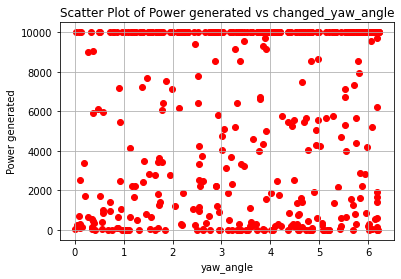

Power_list: [9059.797407691076, 10000.003659010337]
Predefined Yaw Angle 1: 56.002585755470946
Predefined Yaw Angle 2: 53.63249797567758
Changed Yaw Angle 1: 6.002585755470948
Changed Yaw Angle 2: 3.632497975677584
farm_power_baseline : [10000.00506263   881.95972493], farm_power_yaw : [9999.99131038 2117.73992566]


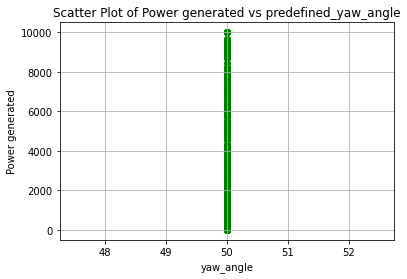

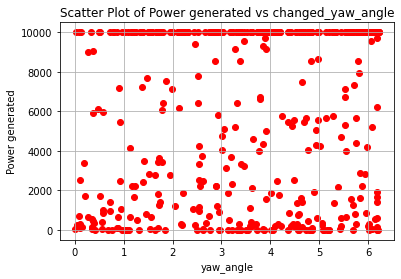

Power_list: [10000.005062625247, 9999.991310380721]
Predefined Yaw Angle 1: 55.966701257678785
Predefined Yaw Angle 2: 54.59928270933978
Changed Yaw Angle 1: 5.966701257678784
Changed Yaw Angle 2: 4.599282709339785
farm_power_baseline : [ 7998.85863962 10000.00428882], farm_power_yaw : [9999.99475418 9999.9729273 ]


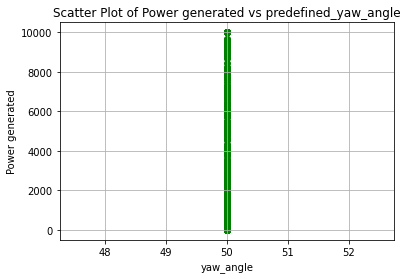

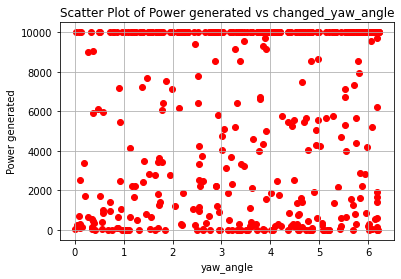

Power_list: [10000.004288815728, 9999.995250578295]
Predefined Yaw Angle 1: 55.77922536958157
Predefined Yaw Angle 2: 55.83333936052514
Changed Yaw Angle 1: 5.779225369581566
Changed Yaw Angle 2: 5.833339360525138
farm_power_baseline : [10000.00542023  4106.81962121], farm_power_yaw : [9999.99800662 9252.88082376]


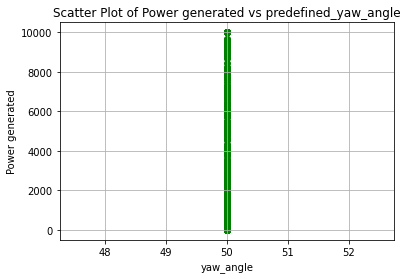

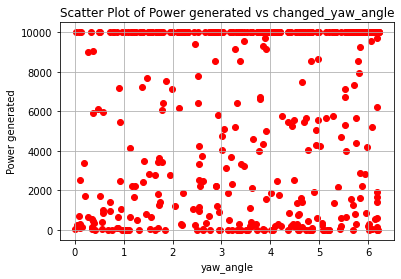

Power_list: [10000.005420231093, 9999.998006621889]
Predefined Yaw Angle 1: 55.92645503465329
Predefined Yaw Angle 2: 54.63444069678658
Changed Yaw Angle 1: 5.926455034653288
Changed Yaw Angle 2: 4.634440696786575
farm_power_baseline : [1428.54095475 8697.99517766], farm_power_yaw : [ 3312.98698168 10000.00263236]


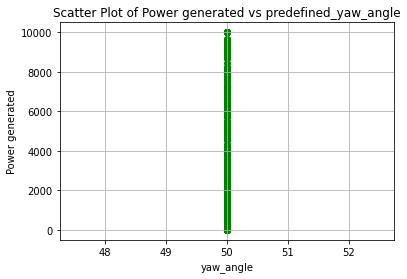

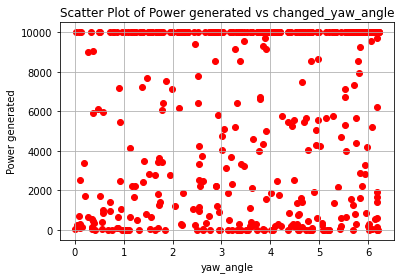

Power_list: [8697.995177660287, 10000.003406658123]
Predefined Yaw Angle 1: 55.848631076014556
Predefined Yaw Angle 2: 55.86670237739722
Changed Yaw Angle 1: 5.848631076014557
Changed Yaw Angle 2: 5.866702377397215
farm_power_baseline : [9999.99014488 1605.85077086], farm_power_yaw : [10000.01207674  3684.55503803]


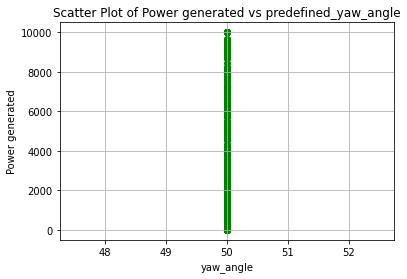

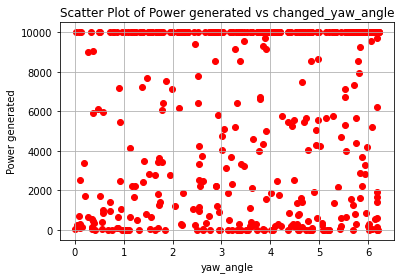

Power_list: [9999.990144878417, 10000.013832182512]
Predefined Yaw Angle 1: 55.89372638275287
Predefined Yaw Angle 2: 56.000127813274624
Changed Yaw Angle 1: 5.8937263827528685
Changed Yaw Angle 2: 6.000127813274621
farm_power_baseline : [8058.24239535 4725.40098415], farm_power_yaw : [9999.99500084 9999.9913212 ]


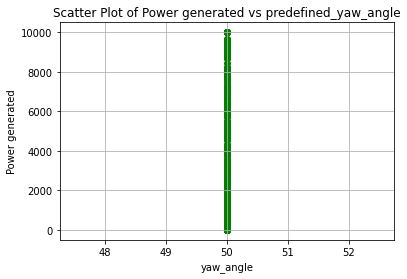

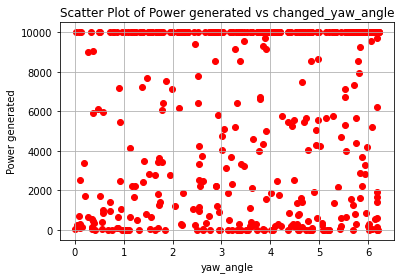

Power_list: [8058.242395349334, 9999.995943345197]
Predefined Yaw Angle 1: 56.128986305024945
Predefined Yaw Angle 2: 55.67900278376843
Changed Yaw Angle 1: 6.1289863050249425
Changed Yaw Angle 2: 5.67900278376843
farm_power_baseline : [2046.39066676   70.67886483], farm_power_yaw : [4654.69722107  316.6981966 ]


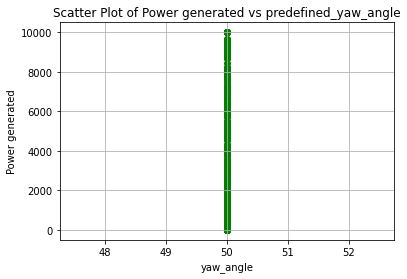

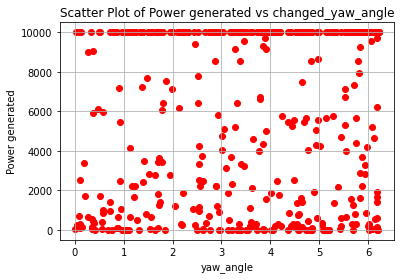

Power_list: [2046.3906667555855, 4700.13402190716]
Predefined Yaw Angle 1: 55.68195607392751
Predefined Yaw Angle 2: 55.202744892339595
Changed Yaw Angle 1: 5.681956073927512
Changed Yaw Angle 2: 5.202744892339598
farm_power_baseline : [2562.95122948 2885.79024292], farm_power_yaw : [5814.90954799 6550.70506982]


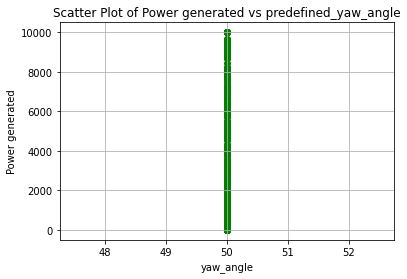

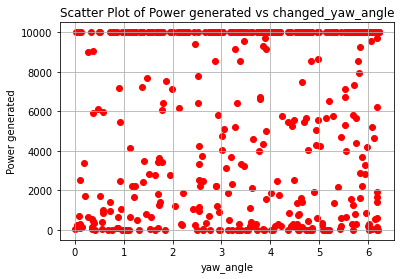

Power_list: [2885.7902429153346, 6603.897592055928]
Predefined Yaw Angle 1: 56.16338475892884
Predefined Yaw Angle 2: 55.57012104049719
Changed Yaw Angle 1: 6.163384758928842
Changed Yaw Angle 2: 5.570121040497194
farm_power_baseline : [1268.93695831  792.44697692], farm_power_yaw : [2949.33514592 1924.5406193 ]


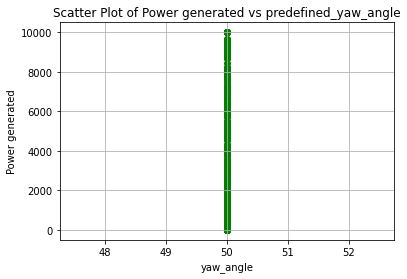

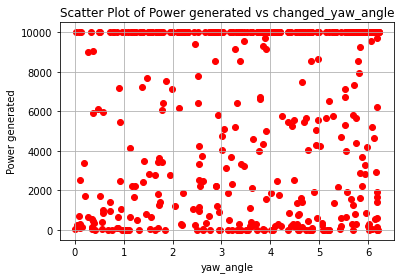

Power_list: [1268.9369583116297, 2979.485400820902]
Predefined Yaw Angle 1: 55.53244301453716
Predefined Yaw Angle 2: 53.864177810496265
Changed Yaw Angle 1: 5.532443014537155
Changed Yaw Angle 2: 3.864177810496264
farm_power_baseline : [8875.9546585  2607.53531887], farm_power_yaw : [10000.00436416  5931.14483802]


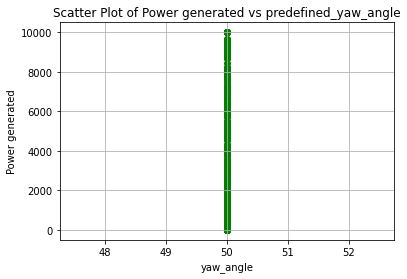

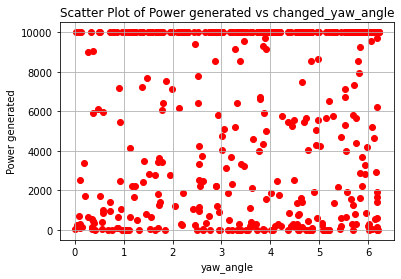

Power_list: [8875.954658496214, 10000.00436416487]
Predefined Yaw Angle 1: 55.400780591301384
Predefined Yaw Angle 2: 54.12534736069761
Changed Yaw Angle 1: 5.400780591301382
Changed Yaw Angle 2: 4.12534736069761
farm_power_baseline : [4557.39581347 5007.77814766], farm_power_yaw : [9999.98871349 9999.99618052]


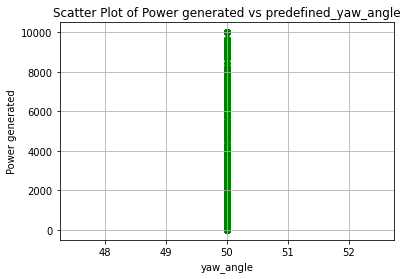

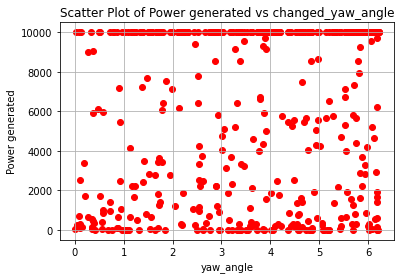

Power_list: [5007.778147662437, 9999.996697059625]
Predefined Yaw Angle 1: 52.610137175633355
Predefined Yaw Angle 2: 55.11413619655048
Changed Yaw Angle 1: 2.6101371756333585
Changed Yaw Angle 2: 5.114136196550481
farm_power_baseline : [4659.91221734 9161.13403697], farm_power_yaw : [ 9999.99062024 10000.00311232]


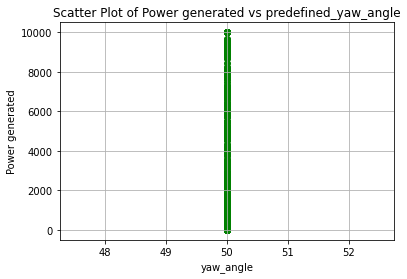

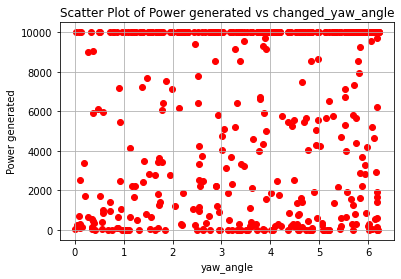

Power_list: [9161.134036970709, 10000.003112321381]
Predefined Yaw Angle 1: 55.63380878457997
Predefined Yaw Angle 2: 54.36504863671961
Changed Yaw Angle 1: 5.633808784579969
Changed Yaw Angle 2: 4.365048636719608
farm_power_baseline : [2150.81497552 9835.20750742], farm_power_yaw : [ 4897.10339618 10000.00218309]


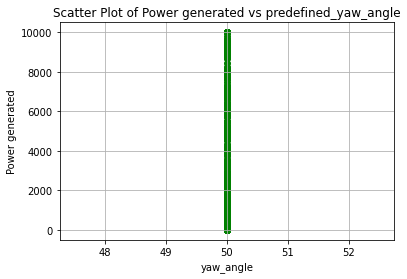

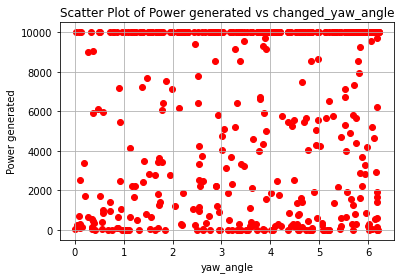

Power_list: [9835.207507418734, 10000.003457227962]
Predefined Yaw Angle 1: 55.71773084948276
Predefined Yaw Angle 2: 54.84060079045957
Changed Yaw Angle 1: 5.7177308494827646
Changed Yaw Angle 2: 4.840600790459571
farm_power_baseline : [4805.85103724 3398.07149137], farm_power_yaw : [9999.99286498 7701.13707965]


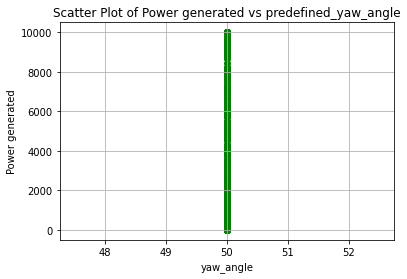

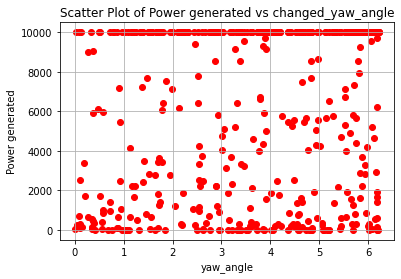

Power_list: [4805.851037240935, 9999.993498028365]
Predefined Yaw Angle 1: 56.07321332021207
Predefined Yaw Angle 2: 55.865672266687575
Changed Yaw Angle 1: 6.073213320212067
Changed Yaw Angle 2: 5.8656722666875725
farm_power_baseline : [2704.14231992 2668.85313321], farm_power_yaw : [6134.65817523 6052.17144777]


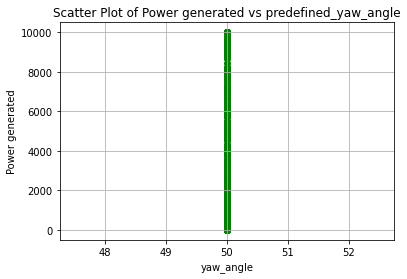

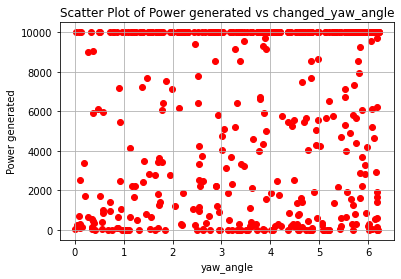

Power_list: [2704.1423199210494, 6197.165753476943]
Predefined Yaw Angle 1: 53.91158698241593
Predefined Yaw Angle 2: 55.92104737523359
Changed Yaw Angle 1: 3.91158698241593
Changed Yaw Angle 2: 5.92104737523359
farm_power_baseline : [1994.61456215 2044.32720796], farm_power_yaw : [3994.46645102 4089.68165153]


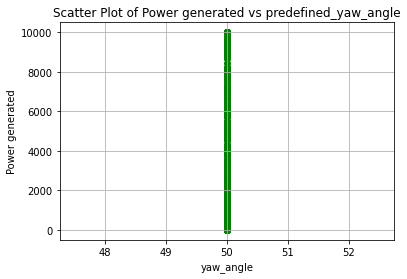

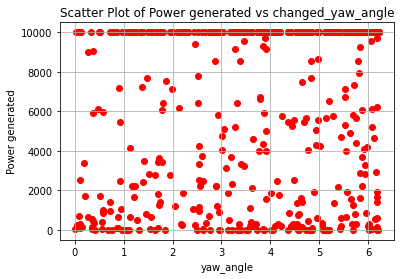

Power_list: [2044.327207960159, 5391.391427125654]
Predefined Yaw Angle 1: 56.190163376321806
Predefined Yaw Angle 2: 55.66156440495059
Changed Yaw Angle 1: 6.190163376321807
Changed Yaw Angle 2: 5.6615644049505915
farm_power_baseline : [6731.32539424 9999.99559319], farm_power_yaw : [10000.00537382 10000.00219399]


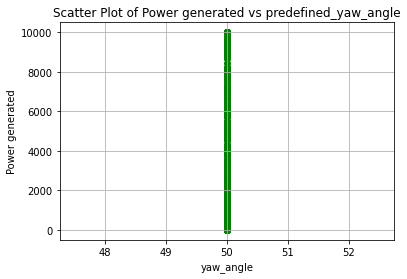

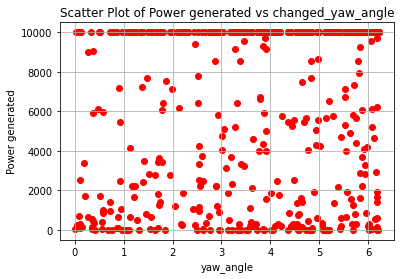

Power_list: [9999.995593194868, 10000.005373815624]
Predefined Yaw Angle 1: 56.06660388701871
Predefined Yaw Angle 2: 55.89299363631069
Changed Yaw Angle 1: 6.066603887018708
Changed Yaw Angle 2: 5.8929936363106945
farm_power_baseline : [2332.21418074    0.        ], farm_power_yaw : [5306.39291098    0.        ]


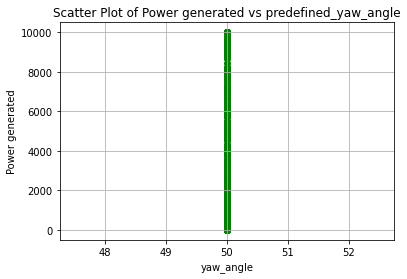

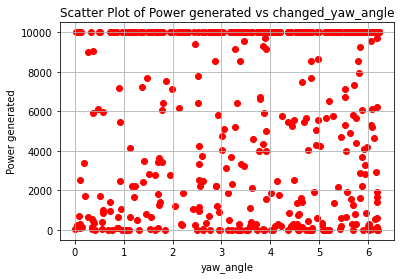

Power_list: [2332.2141807379667, 5360.669298454374]
Predefined Yaw Angle 1: 55.99373979959414
Predefined Yaw Angle 2: 55.72903505853553
Changed Yaw Angle 1: 5.993739799594141
Changed Yaw Angle 2: 5.729035058535531
farm_power_baseline : [9999.99086824   31.66278607], farm_power_yaw : [10000.01373225   210.67897607]


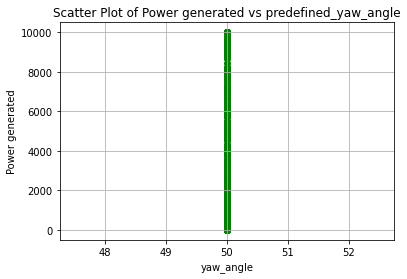

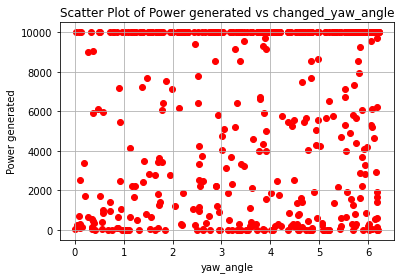

Power_list: [9999.990868244297, 10000.015496275671]
Predefined Yaw Angle 1: 55.5954821680682
Predefined Yaw Angle 2: 54.64050471458869
Changed Yaw Angle 1: 5.5954821680682025
Changed Yaw Angle 2: 4.640504714588685
farm_power_baseline : [5007.540203   8859.12421418], farm_power_yaw : [ 9999.99610075 10000.004405  ]


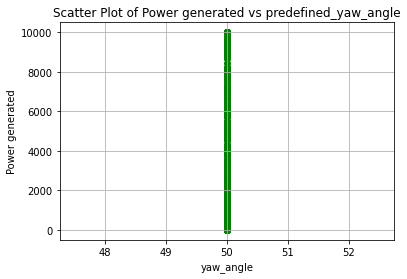

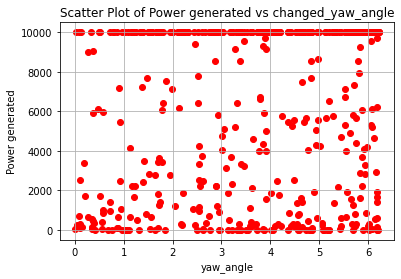

Power_list: [8859.124214183375, 10000.004404999097]
Predefined Yaw Angle 1: 55.91949459682826
Predefined Yaw Angle 2: 55.69721134877352
Changed Yaw Angle 1: 5.919494596828257
Changed Yaw Angle 2: 5.69721134877352
farm_power_baseline : [ 170.01495883 2752.73392503], farm_power_yaw : [ 532.57581096 6251.58394279]


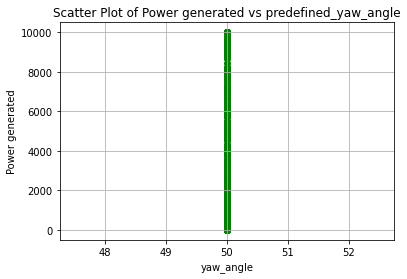

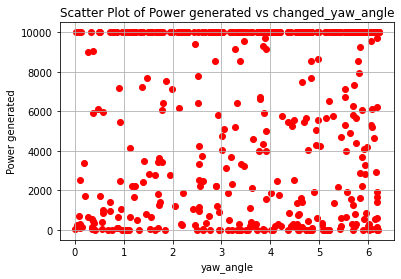

Power_list: [2752.733925032232, 6311.134011225875]
Predefined Yaw Angle 1: 56.13177143889295
Predefined Yaw Angle 2: 50.75448982676562
Changed Yaw Angle 1: 6.131771438892947
Changed Yaw Angle 2: 0.7544898267656204
farm_power_baseline : [ 2546.68839336 10000.00268121], farm_power_yaw : [5795.07519091 9999.96267384]


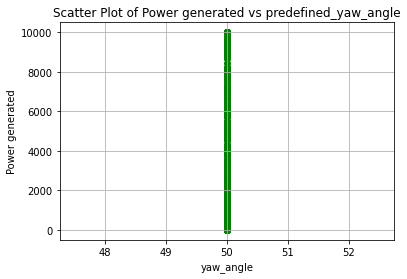

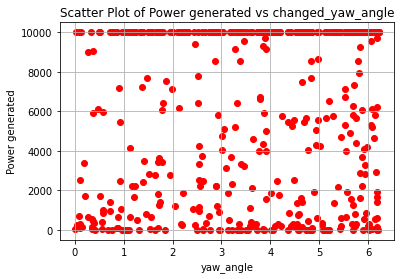

Power_list: [10000.002681210966, 9999.987177041265]
Predefined Yaw Angle 1: 55.6147197785185
Predefined Yaw Angle 2: 52.08673123522974
Changed Yaw Angle 1: 5.6147197785184995
Changed Yaw Angle 2: 2.0867312352297427
farm_power_baseline : [ 989.57408033 4093.62645862], farm_power_yaw : [2355.70029874 9265.88158841]


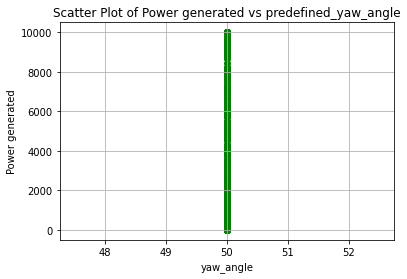

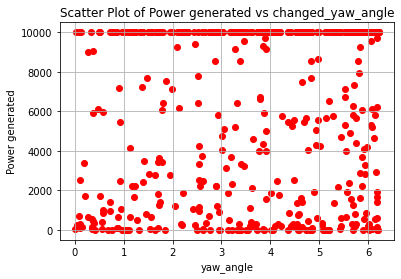

Power_list: [4093.626458623905, 9311.661566091365]
Predefined Yaw Angle 1: 54.409072930893785
Predefined Yaw Angle 2: 54.811141435113335
Changed Yaw Angle 1: 4.409072930893784
Changed Yaw Angle 2: 4.811141435113332
farm_power_baseline : [5232.94530269 9782.8724719 ], farm_power_yaw : [ 9999.99666145 10000.00138188]


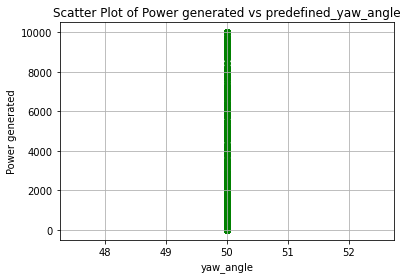

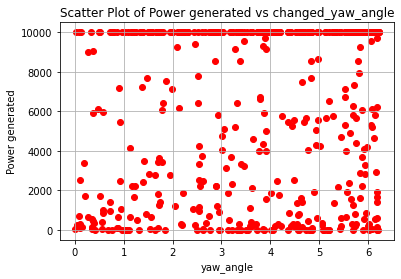

Power_list: [9782.8724719026, 10000.002448090278]
Predefined Yaw Angle 1: 56.112558862156895
Predefined Yaw Angle 2: 50.86635191361276
Changed Yaw Angle 1: 6.112558862156898
Changed Yaw Angle 2: 0.8663519136127636
farm_power_baseline : [ 25.18066256 115.71752884], farm_power_yaw : [194.61982313 415.14191268]


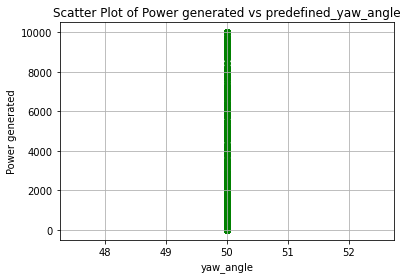

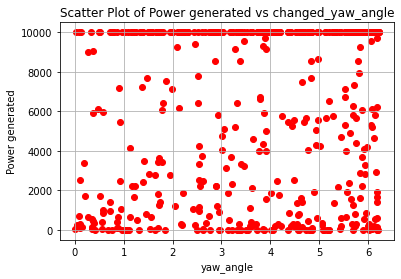

Power_list: [115.71752883937575, 415.1419126814929]
Predefined Yaw Angle 1: 55.88350410522471
Predefined Yaw Angle 2: 54.540049745638676
Changed Yaw Angle 1: 5.883504105224708
Changed Yaw Angle 2: 4.540049745638679
farm_power_baseline : [4299.60083221 3595.44732678], farm_power_yaw : [9662.98049836 8135.01142121]


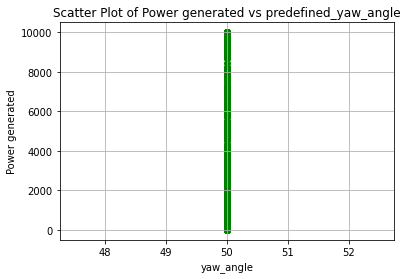

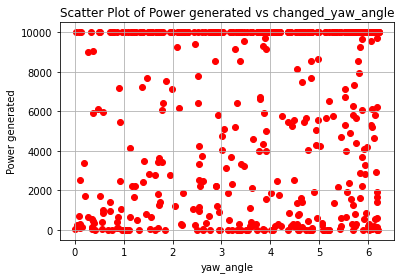

Power_list: [4299.600832205889, 9734.562444241066]
Predefined Yaw Angle 1: 52.88470961665275
Predefined Yaw Angle 2: 54.077940163817004
Changed Yaw Angle 1: 2.884709616652746
Changed Yaw Angle 2: 4.077940163817001
farm_power_baseline : [   0.         9497.66560112], farm_power_yaw : [    0.         10000.00166973]


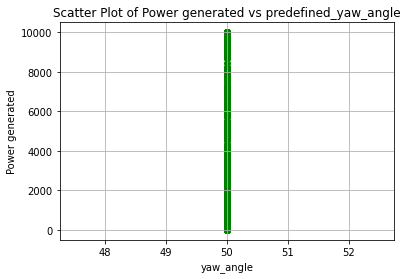

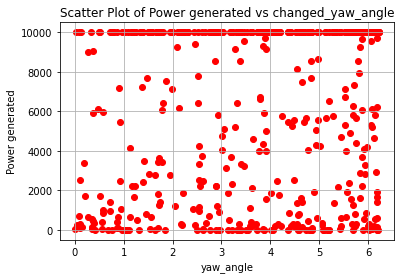

Power_list: [9497.665601124992, 10000.0016697279]
Predefined Yaw Angle 1: 56.2032426930674
Predefined Yaw Angle 2: 56.12172188969324
Changed Yaw Angle 1: 6.203242693067404
Changed Yaw Angle 2: 6.121721889693241
farm_power_baseline : [9999.99194994    0.        ], farm_power_yaw : [10000.01602664     0.        ]


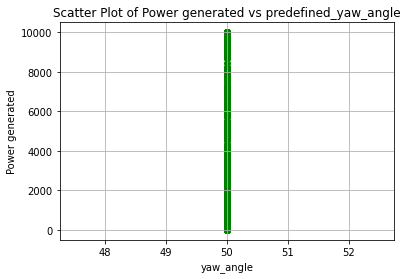

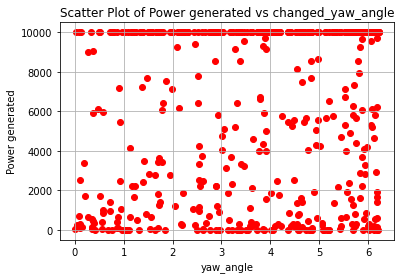

Power_list: [9999.9919499374, 10000.017984695625]
Predefined Yaw Angle 1: 55.9801299811594
Predefined Yaw Angle 2: 53.537959485405295
Changed Yaw Angle 1: 5.9801299811594
Changed Yaw Angle 2: 3.537959485405297
farm_power_baseline : [10000.00516248   915.40122368], farm_power_yaw : [9999.99294206 2188.02990142]


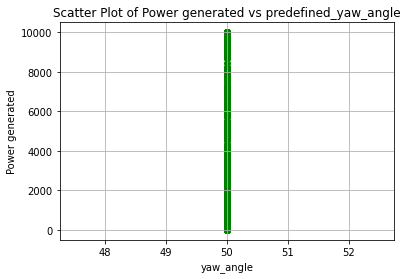

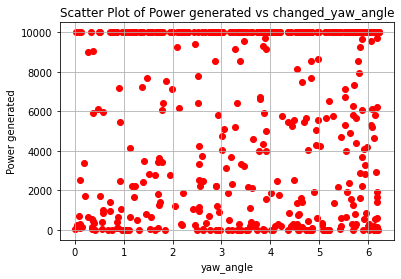

Power_list: [10000.00516247616, 9999.992942058756]
Predefined Yaw Angle 1: 55.558998459030775
Predefined Yaw Angle 2: 55.45569619373307
Changed Yaw Angle 1: 5.5589984590307715
Changed Yaw Angle 2: 5.4556961937330675
farm_power_baseline : [2238.09181102 9999.99681901], farm_power_yaw : [5100.79510715 9999.98502149]


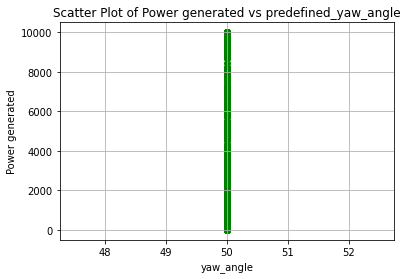

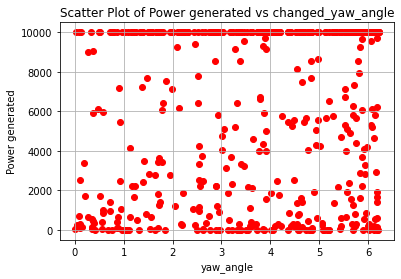

Power_list: [9999.996819014692, 9999.985021494176]
Predefined Yaw Angle 1: 56.04064552324149
Predefined Yaw Angle 2: 55.87775556118548
Changed Yaw Angle 1: 6.040645523241488
Changed Yaw Angle 2: 5.87775556118548
farm_power_baseline : [54.62831698  0.        ], farm_power_yaw : [272.99375106   0.        ]


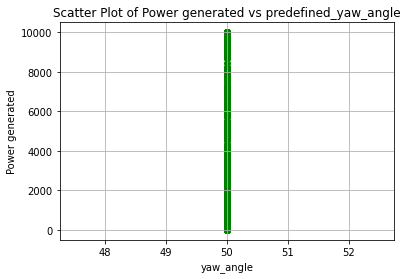

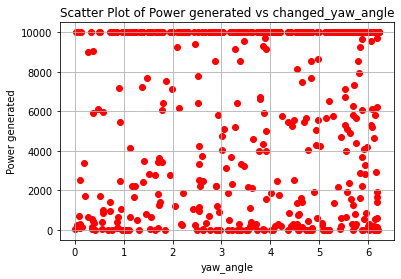

Power_list: [54.628316981420184, 276.89534199810555]
Predefined Yaw Angle 1: 56.15877589234635
Predefined Yaw Angle 2: 55.00089485857479
Changed Yaw Angle 1: 6.158775892346351
Changed Yaw Angle 2: 5.000894858574786
farm_power_baseline : [3102.91438284    9.40153179], farm_power_yaw : [7027.08692525  159.65524273]


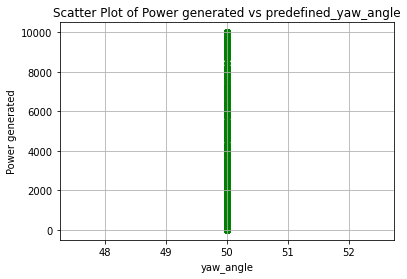

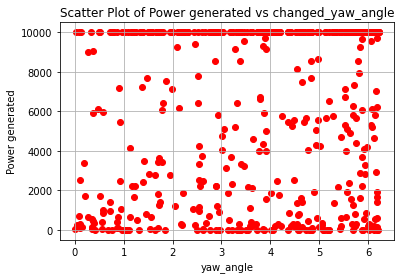

Power_list: [3102.914382840407, 7090.131407260035]
Predefined Yaw Angle 1: 55.48698019156841
Predefined Yaw Angle 2: 55.07752572104516
Changed Yaw Angle 1: 5.486980191568413
Changed Yaw Angle 2: 5.077525721045162
farm_power_baseline : [4164.95036025 6868.01109747], farm_power_yaw : [ 9386.57823216 10000.00501218]


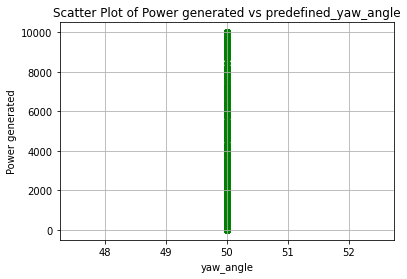

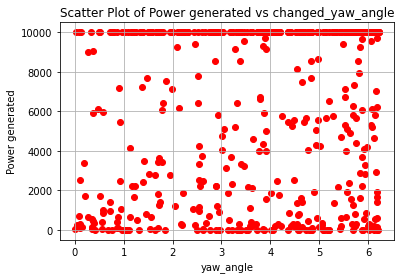

Power_list: [6868.011097474413, 10000.005012184363]
Predefined Yaw Angle 1: 55.67356871439041
Predefined Yaw Angle 2: 54.172565739456935
Changed Yaw Angle 1: 5.6735687143904165
Changed Yaw Angle 2: 4.172565739456933
farm_power_baseline : [353.80867255   0.        ], farm_power_yaw : [954.75238479   9.63812252]


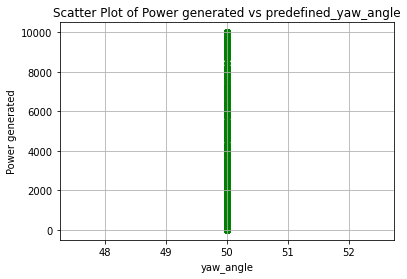

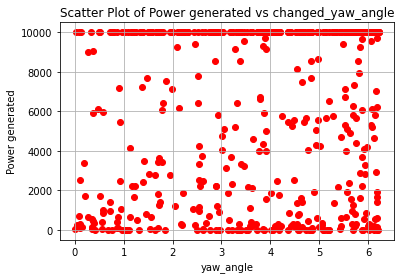

Power_list: [353.8086725487372, 962.0657804423827]
Predefined Yaw Angle 1: 56.18992528972036
Predefined Yaw Angle 2: 56.15296929139536
Changed Yaw Angle 1: 6.189925289720354
Changed Yaw Angle 2: 6.152969291395358
farm_power_baseline : [10000.00525583  2270.53805291], farm_power_yaw : [9999.995607  5167.5635138]


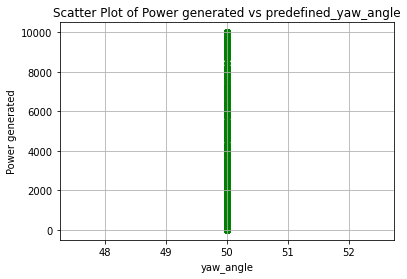

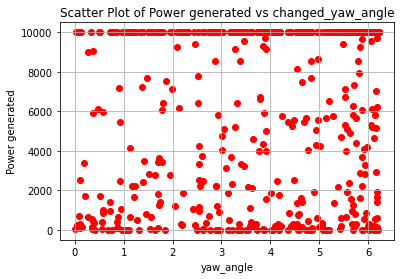

Power_list: [10000.00525583358, 9999.995606998415]
Predefined Yaw Angle 1: 56.21049235018682
Predefined Yaw Angle 2: 55.90696830781478
Changed Yaw Angle 1: 6.210492350186818
Changed Yaw Angle 2: 5.906968307814776
farm_power_baseline : [714.0393665  684.04975635], farm_power_yaw : [1742.59271669 1675.98389226]


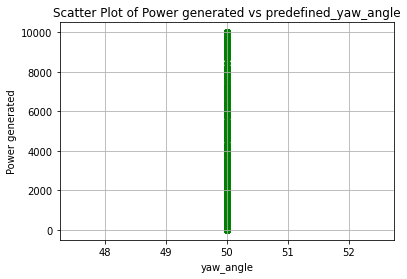

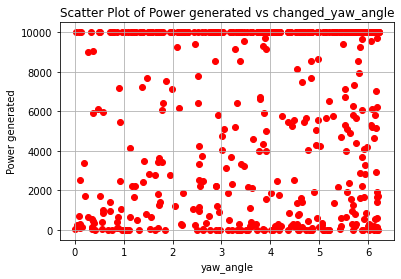

Power_list: [714.0393665048239, 1760.8541404144955]
Predefined Yaw Angle 1: 53.209841372018964
Predefined Yaw Angle 2: 55.307339478888025
Changed Yaw Angle 1: 3.209841372018961
Changed Yaw Angle 2: 5.307339478888024
farm_power_baseline : [ 360.35815469 9999.99625134], farm_power_yaw : [ 969.39328035 9999.98930629]


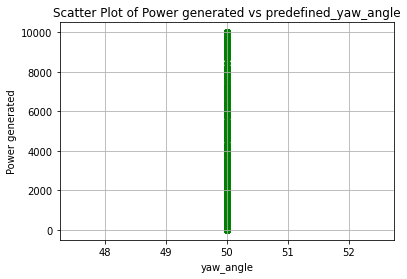

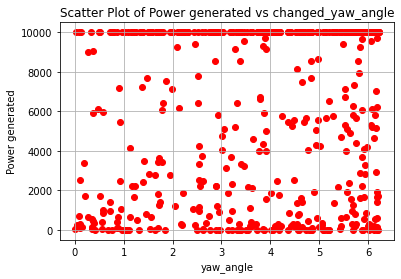

Power_list: [9999.996251338247, 9999.99169778309]
Predefined Yaw Angle 1: 54.56174849407861
Predefined Yaw Angle 2: 55.90655178942029
Changed Yaw Angle 1: 4.56174849407861
Changed Yaw Angle 2: 5.906551789420289
farm_power_baseline : [ 277.92741289 4726.1223161 ], farm_power_yaw : [ 769.7150493  9999.99150225]


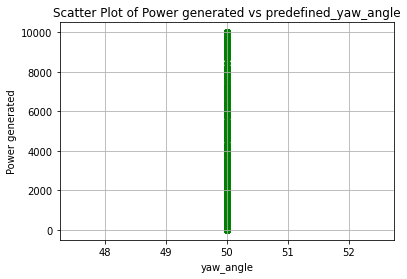

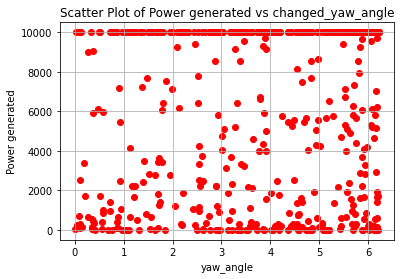

Power_list: [4726.1223160983245, 9999.992126831099]
Predefined Yaw Angle 1: 56.19672913367329
Predefined Yaw Angle 2: 56.079250861893094
Changed Yaw Angle 1: 6.196729133673288
Changed Yaw Angle 2: 6.079250861893093
farm_power_baseline : [9999.99595331 4735.30742356], farm_power_yaw : [9999.99911379 9999.99143916]


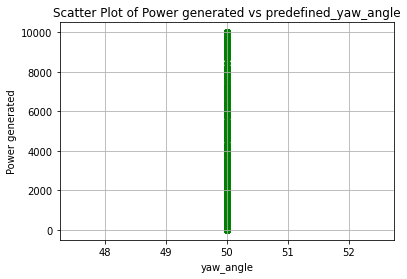

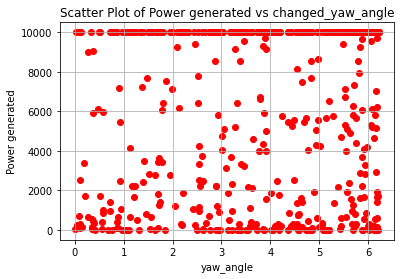

Power_list: [9999.99595330816, 10000.003842139598]
Predefined Yaw Angle 1: 55.78424809139746
Predefined Yaw Angle 2: 55.648510121919244
Changed Yaw Angle 1: 5.784248091397456
Changed Yaw Angle 2: 5.648510121919241
farm_power_baseline : [7282.56949511 7659.52532726], farm_power_yaw : [10000.00327446  9999.99861483]


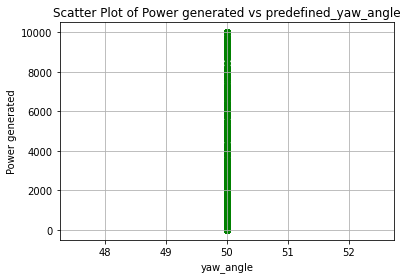

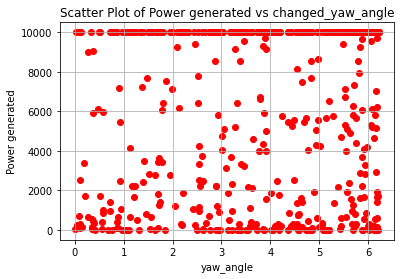

Power_list: [7659.525327258764, 10000.003274458511]
Predefined Yaw Angle 1: 54.49293081361431
Predefined Yaw Angle 2: 55.156497502113716
Changed Yaw Angle 1: 4.492930813614308
Changed Yaw Angle 2: 5.156497502113718
farm_power_baseline : [8216.67021105 1012.23419558], farm_power_yaw : [9999.99716421 2405.77328819]


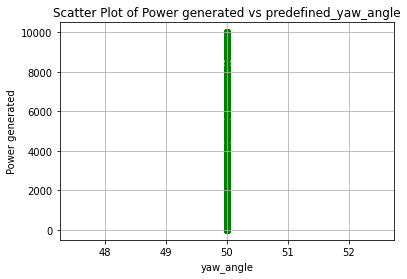

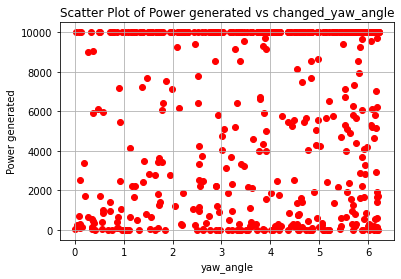

Power_list: [8216.670211046114, 9999.997791553438]
Predefined Yaw Angle 1: 56.11287844148771
Predefined Yaw Angle 2: 55.96076362920216
Changed Yaw Angle 1: 6.112878441487707
Changed Yaw Angle 2: 5.96076362920216
farm_power_baseline : [9999.99585088  877.68356705], farm_power_yaw : [10000.00342732  2101.6092998 ]


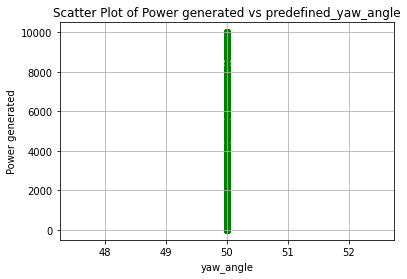

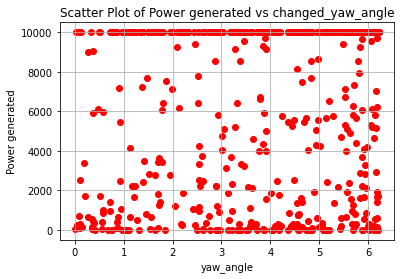

Power_list: [9999.995850881633, 10000.008015893569]
Predefined Yaw Angle 1: 56.05217168443935
Predefined Yaw Angle 2: 55.823245979993736
Changed Yaw Angle 1: 6.052171684439351
Changed Yaw Angle 2: 5.823245979993738
farm_power_baseline : [5708.48325361 9999.99704939], farm_power_yaw : [ 9999.99575342 10000.01465767]


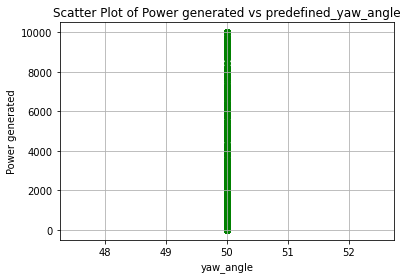

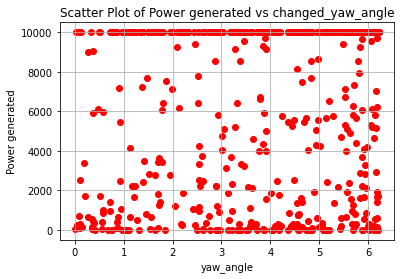

Power_list: [9999.99704939258, 10000.014657672153]
Predefined Yaw Angle 1: 56.21859208832618
Predefined Yaw Angle 2: 55.84820299520109
Changed Yaw Angle 1: 6.218592088326185
Changed Yaw Angle 2: 5.848202995201088
farm_power_baseline : [1782.93372673 8024.04322382], farm_power_yaw : [4073.18711851 9999.99462437]


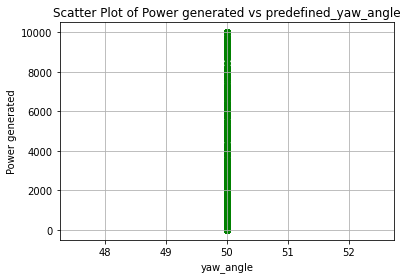

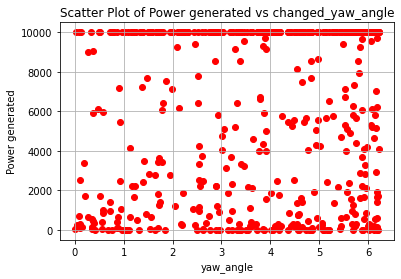

Power_list: [8024.04322381938, 9999.99554437996]
Predefined Yaw Angle 1: 55.55094665779102
Predefined Yaw Angle 2: 55.8931534259761
Changed Yaw Angle 1: 5.550946657791026
Changed Yaw Angle 2: 5.8931534259761
farm_power_baseline : [51.11571908 66.84817151], farm_power_yaw : [263.74378144 306.52504723]


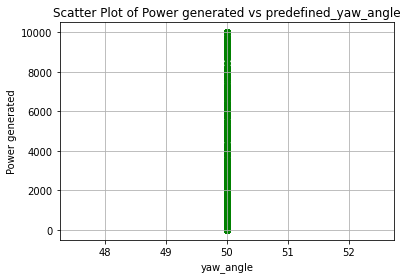

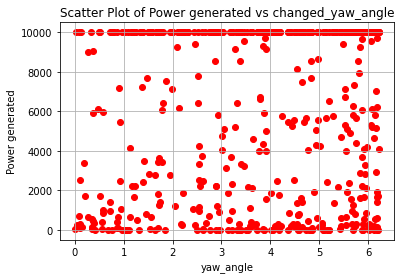

Power_list: [66.84817150869738, 310.22907363733833]
Predefined Yaw Angle 1: 55.33984373713484
Predefined Yaw Angle 2: 56.170912072923656
Changed Yaw Angle 1: 5.339843737134843
Changed Yaw Angle 2: 6.170912072923658
farm_power_baseline : [   0.         7289.64950705], farm_power_yaw : [    0.         10000.00320238]


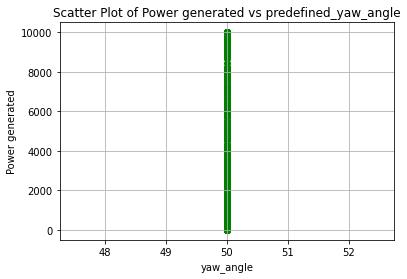

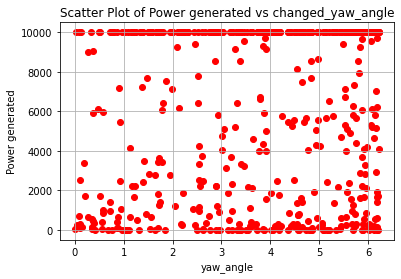

Power_list: [7289.649507045008, 10000.003202378117]
Predefined Yaw Angle 1: 56.1555044652633
Predefined Yaw Angle 2: 56.10588726648385
Changed Yaw Angle 1: 6.155504465263298
Changed Yaw Angle 2: 6.1058872664838475
farm_power_baseline : [2333.29867509 9999.99089005], farm_power_yaw : [ 5305.93250219 10000.01361734]


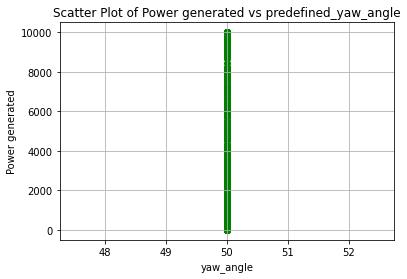

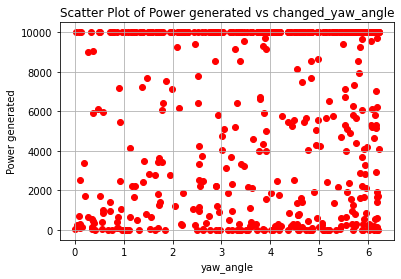

Power_list: [9999.990890049256, 10000.015546437678]
Predefined Yaw Angle 1: 56.145371669947764
Predefined Yaw Angle 2: 51.81515591570113
Changed Yaw Angle 1: 6.145371669947764
Changed Yaw Angle 2: 1.8151559157011303
farm_power_baseline : [751.32036554   0.        ], farm_power_yaw : [1835.60008677    0.        ]


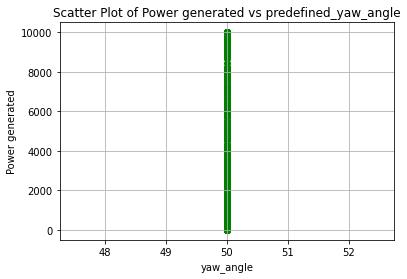

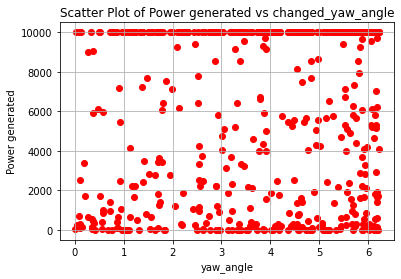

Power_list: [751.3203655406784, 1847.5120903580819]
Predefined Yaw Angle 1: 51.453364660333776
Predefined Yaw Angle 2: 55.2121612973219
Changed Yaw Angle 1: 1.4533646603337773
Changed Yaw Angle 2: 5.2121612973219
farm_power_baseline : [ 880.23315159 9999.99072223], farm_power_yaw : [ 2120.1808419  10000.01440958]


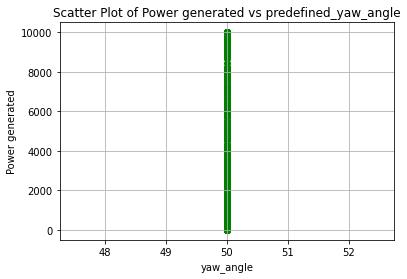

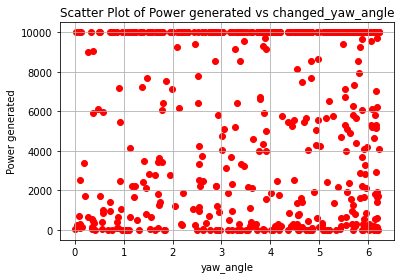

Power_list: [9999.990722234594, 10000.01516038238]
Predefined Yaw Angle 1: 56.036126671503844
Predefined Yaw Angle 2: 55.91844227105528
Changed Yaw Angle 1: 6.036126671503841
Changed Yaw Angle 2: 5.918442271055274
farm_power_baseline : [1806.81098576  856.9642653 ], farm_power_yaw : [4130.72673937 2058.72147826]


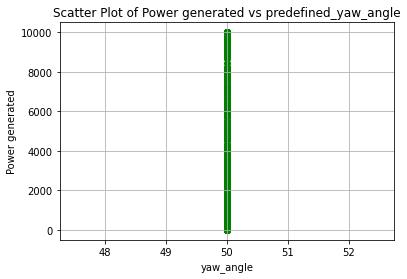

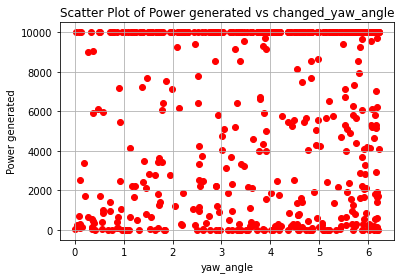

Power_list: [1806.8109857586292, 4175.446057237311]
Predefined Yaw Angle 1: 52.7693412119144
Predefined Yaw Angle 2: 53.20055242162658
Changed Yaw Angle 1: 2.7693412119144045
Changed Yaw Angle 2: 3.20055242162658
farm_power_baseline : [4222.48901059  417.99631387], farm_power_yaw : [9553.25960411 1090.37918598]


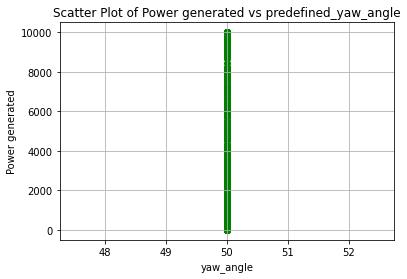

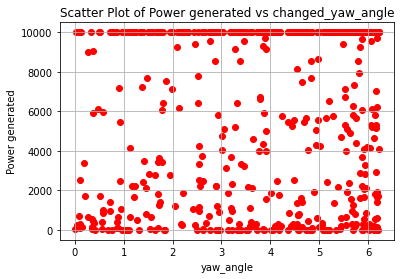

Power_list: [4222.489010592027, 9576.340099100613]
Predefined Yaw Angle 1: 56.0338517993007
Predefined Yaw Angle 2: 56.110373627656195
Changed Yaw Angle 1: 6.033851799300696
Changed Yaw Angle 2: 6.110373627656195
farm_power_baseline : [  40.85368215 3396.71903737], farm_power_yaw : [ 235.40241738 7678.6025611 ]


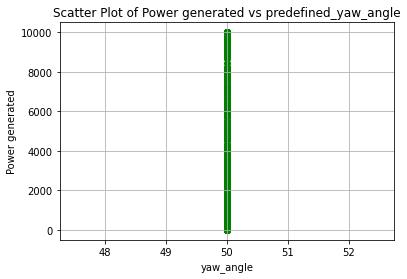

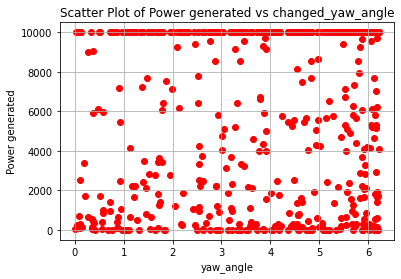

Power_list: [3396.7190373719436, 7761.109463360766]
Predefined Yaw Angle 1: 55.94750306201262
Predefined Yaw Angle 2: 55.004452309158914
Changed Yaw Angle 1: 5.947503062012621
Changed Yaw Angle 2: 5.004452309158914
farm_power_baseline : [1072.56994082 3194.96416399], farm_power_yaw : [2542.73984098 7237.25868026]


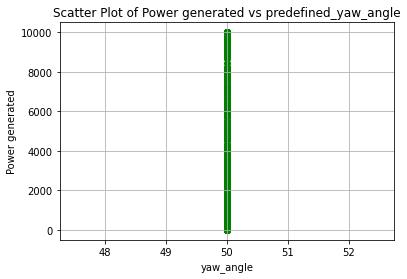

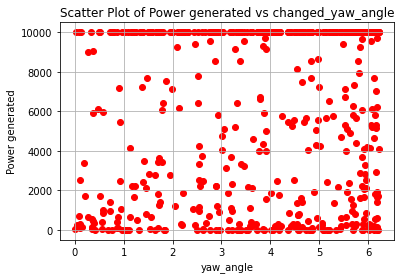

Power_list: [3194.9641639911856, 7298.3769958233615]
Predefined Yaw Angle 1: 56.22616558583415
Predefined Yaw Angle 2: 56.07298124805483
Changed Yaw Angle 1: 6.226165585834152
Changed Yaw Angle 2: 6.072981248054828
farm_power_baseline : [2627.78124861 1070.49473125], farm_power_yaw : [5952.3851953  2532.98358901]


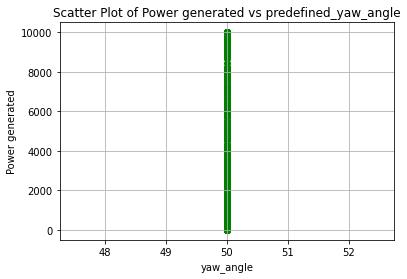

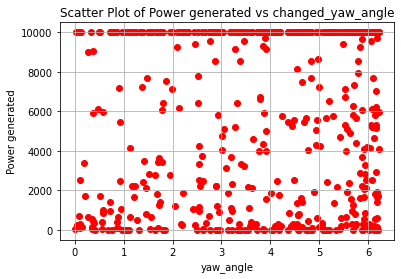

Power_list: [2627.78124860849, 6018.066128399286]
Predefined Yaw Angle 1: 56.21630549821424
Predefined Yaw Angle 2: 56.01880988832153
Changed Yaw Angle 1: 6.2163054982142425
Changed Yaw Angle 2: 6.018809888321527
farm_power_baseline : [ 109.34056803 1524.08823888], farm_power_yaw : [ 398.22430931 3500.74943454]


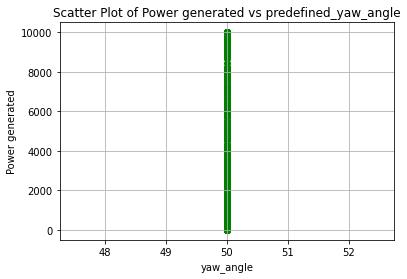

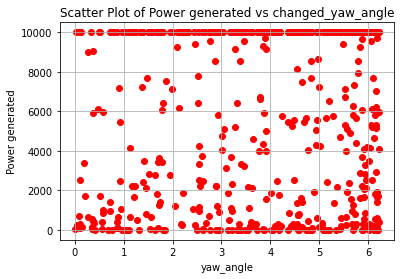

Power_list: [1524.0882388793375, 3540.101467561275]
Predefined Yaw Angle 1: 56.22790090160045
Predefined Yaw Angle 2: 55.95294884929943
Changed Yaw Angle 1: 6.227900901600448
Changed Yaw Angle 2: 5.952948849299431
farm_power_baseline : [ 382.29514648 9999.9940466 ], farm_power_yaw : [ 1007.48400306 10000.01132066]


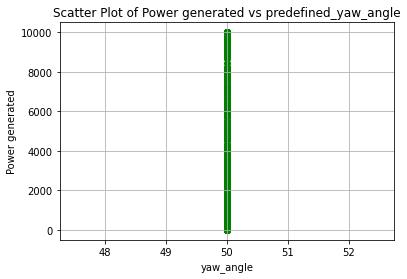

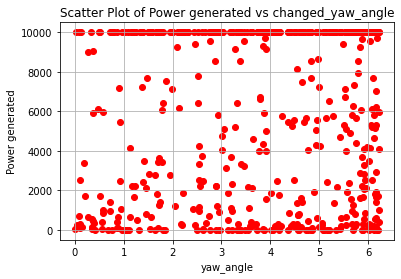

Power_list: [9999.99404659812, 10000.011320660236]
Predefined Yaw Angle 1: 56.201352913957884
Predefined Yaw Angle 2: 54.25552560425788
Changed Yaw Angle 1: 6.201352913957884
Changed Yaw Angle 2: 4.255525604257882
farm_power_baseline : [5143.15386471 3132.66318905], farm_power_yaw : [9999.99686209 7100.59036689]


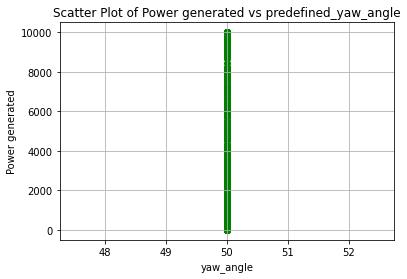

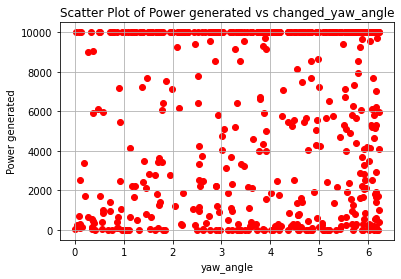

Power_list: [5143.153864708021, 9999.996862086384]
Predefined Yaw Angle 1: 51.36086908093369
Predefined Yaw Angle 2: 56.09926718064613
Changed Yaw Angle 1: 1.3608690809336903
Changed Yaw Angle 2: 6.0992671806461285
farm_power_baseline : [6407.70549876   38.79364322], farm_power_yaw : [10000.00575427   231.63658535]


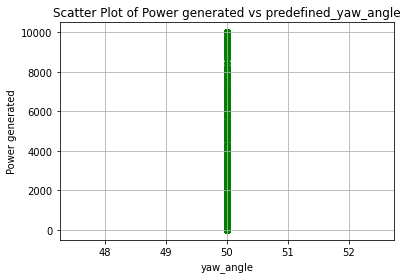

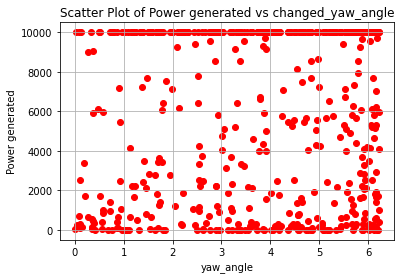

Power_list: [6407.705498757163, 10000.006039668691]
Predefined Yaw Angle 1: 55.57201599043908
Predefined Yaw Angle 2: 55.8870425365388
Changed Yaw Angle 1: 5.572015990439079
Changed Yaw Angle 2: 5.887042536538804
farm_power_baseline : [5668.65896135 1692.09152977], farm_power_yaw : [9999.9958255  3876.55272495]


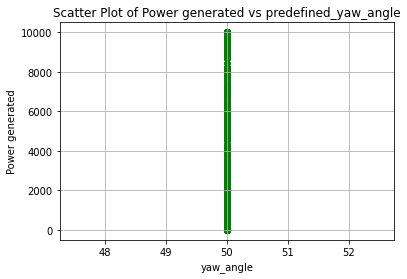

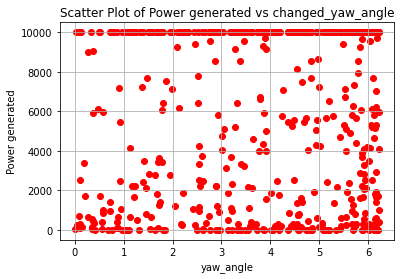

Power_list: [5668.658961346395, 9999.995825495298]
Predefined Yaw Angle 1: 56.05852438890363
Predefined Yaw Angle 2: 54.7100558296172
Changed Yaw Angle 1: 6.058524388903626
Changed Yaw Angle 2: 4.710055829617194
farm_power_baseline : [454.95033558  62.12921375], farm_power_yaw : [1169.64621181  294.06463671]


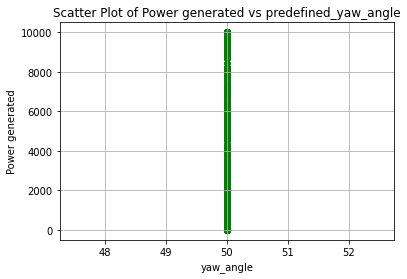

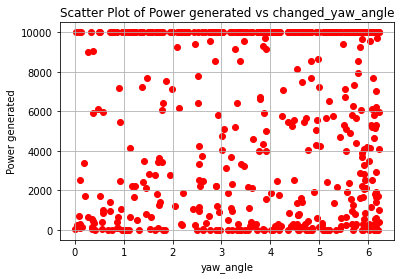

Power_list: [454.9503355772579, 1180.6882377942275]
Predefined Yaw Angle 1: 56.17158516455741
Predefined Yaw Angle 2: 55.89465065514094
Changed Yaw Angle 1: 6.171585164557414
Changed Yaw Angle 2: 5.894650655140942
farm_power_baseline : [ 96.27178941 108.97862023], farm_power_yaw : [369.57293606 397.58340134]


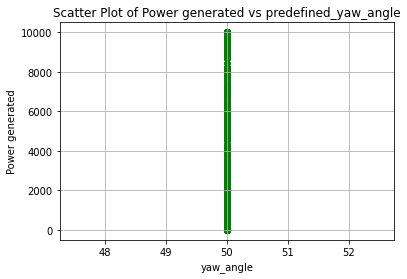

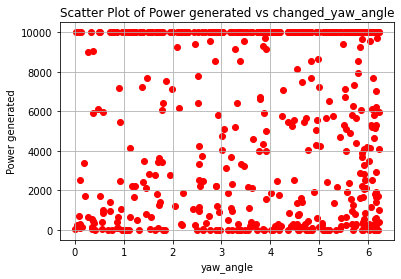

Power_list: [108.97862023422893, 403.2027577947438]
Predefined Yaw Angle 1: 56.22834458423806
Predefined Yaw Angle 2: 56.013712065362895
Changed Yaw Angle 1: 6.228344584238055
Changed Yaw Angle 2: 6.013712065362896
farm_power_baseline : [154.14978904  72.9993657 ], farm_power_yaw : [496.98322029 322.7123305 ]


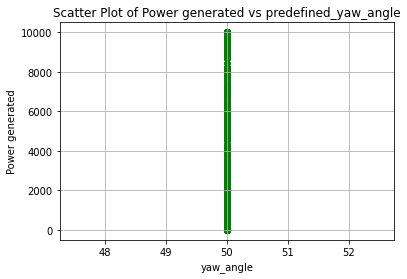

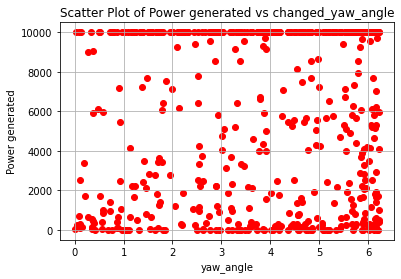

Power_list: [154.14978904098191, 503.12376181594334]
Predefined Yaw Angle 1: 56.222455802435675
Predefined Yaw Angle 2: 55.17676149484813
Changed Yaw Angle 1: 6.222455802435672
Changed Yaw Angle 2: 5.17676149484813
farm_power_baseline : [564.76832266 425.26183278], farm_power_yaw : [1413.23818586 1098.70703679]


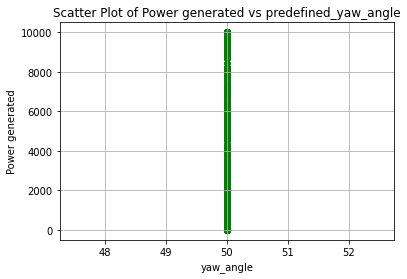

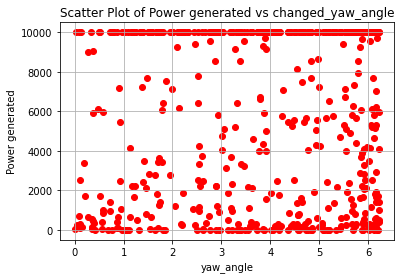

Power_list: [564.7683226581001, 1428.1471308094324]
Predefined Yaw Angle 1: 56.193678748960714
Predefined Yaw Angle 2: 56.11951359651735
Changed Yaw Angle 1: 6.1936787489607115
Changed Yaw Angle 2: 6.119513596517347
farm_power_baseline : [8461.25232617 2623.78823352], farm_power_yaw : [9999.99961773 5942.91145054]


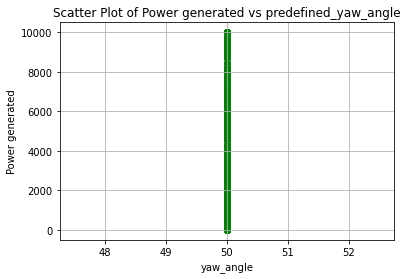

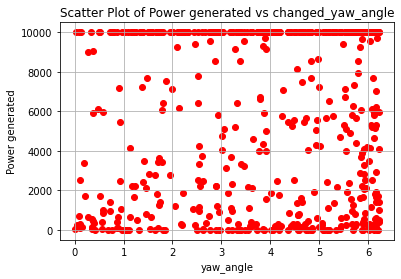

Power_list: [8461.2523261663, 10000.00064483194]
Predefined Yaw Angle 1: 56.06032575106496
Predefined Yaw Angle 2: 56.1547946220065
Changed Yaw Angle 1: 6.060325751064956
Changed Yaw Angle 2: 6.154794622006499
farm_power_baseline : [  0.         625.92357901], farm_power_yaw : [  25.17448842 1546.60767732]


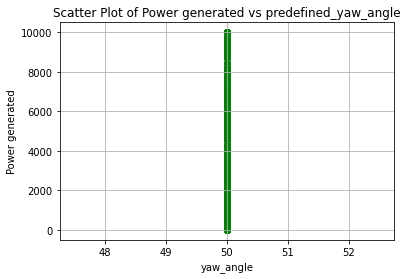

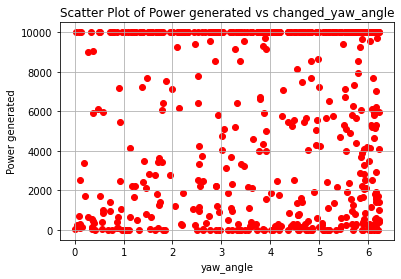

Power_list: [625.923579009173, 1564.4547624696572]
Predefined Yaw Angle 1: 56.22700394894531
Predefined Yaw Angle 2: 56.03723310411048
Changed Yaw Angle 1: 6.227003948945309
Changed Yaw Angle 2: 6.037233104110476
farm_power_baseline : [ 196.62950679 1360.09844982], farm_power_yaw : [ 598.77088188 3153.61140406]


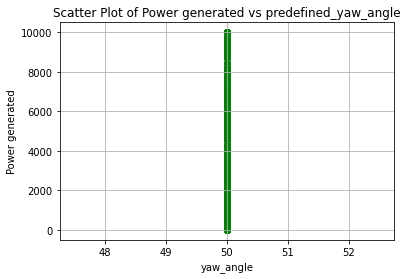

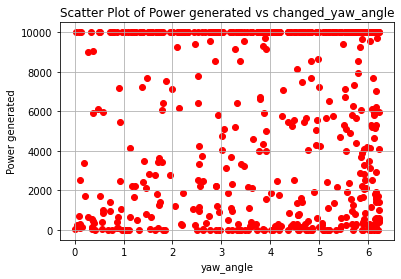

Power_list: [1360.0984498230384, 3187.2208639789023]
Predefined Yaw Angle 1: 56.21708900020694
Predefined Yaw Angle 2: 56.15350778256777
Changed Yaw Angle 1: 6.217089000206943
Changed Yaw Angle 2: 6.153507782567772
farm_power_baseline : [  92.26247652 9999.9888987 ], farm_power_yaw : [  360.4573142  10000.00901845]


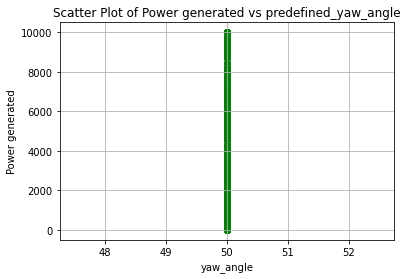

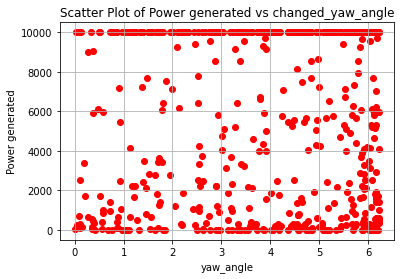

Power_list: [9999.988898697566, 10000.010965360774]
Predefined Yaw Angle 1: 56.08585374801002
Predefined Yaw Angle 2: 56.1035207815392
Changed Yaw Angle 1: 6.085853748010019
Changed Yaw Angle 2: 6.103520781539203
farm_power_baseline : [9409.24176296 1597.26511814], farm_power_yaw : [10000.00230086  3662.57654921]


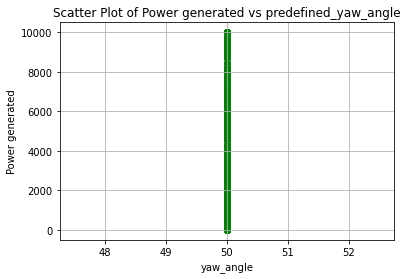

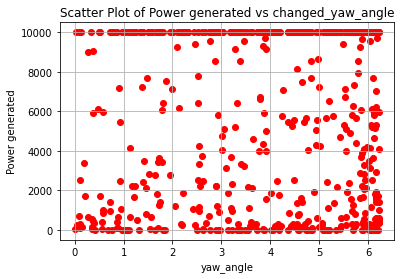

Power_list: [9409.241762964399, 10000.002300859549]
Predefined Yaw Angle 1: 55.78872166939657
Predefined Yaw Angle 2: 56.13856638358799
Changed Yaw Angle 1: 5.788721669396571
Changed Yaw Angle 2: 6.138566383587992
farm_power_baseline : [8069.21962777   48.81601705], farm_power_yaw : [9999.99512242  257.18418216]


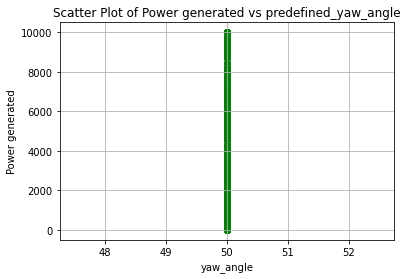

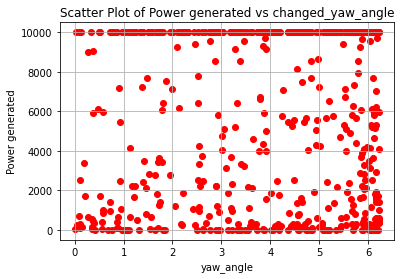

Power_list: [8069.219627772914, 9999.996071404852]
Predefined Yaw Angle 1: 55.660997528780804
Predefined Yaw Angle 2: 55.15468548730803
Changed Yaw Angle 1: 5.660997528780806
Changed Yaw Angle 2: 5.1546854873080274
farm_power_baseline : [9999.99695993   81.54297707], farm_power_yaw : [9999.99110452  338.82308051]


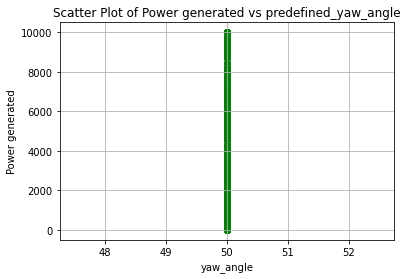

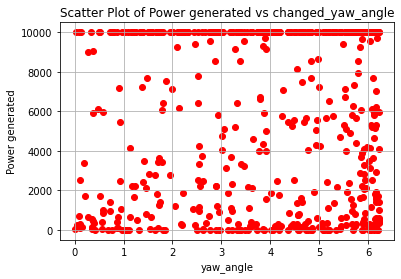

Power_list: [9999.996959928934, 9999.991104521221]
Predefined Yaw Angle 1: 56.22808306181901
Predefined Yaw Angle 2: 55.88670751087367
Changed Yaw Angle 1: 6.228083061819009
Changed Yaw Angle 2: 5.886707510873672
farm_power_baseline : [3448.18023582 9999.99685494], farm_power_yaw : [7794.93973409 9999.98745305]


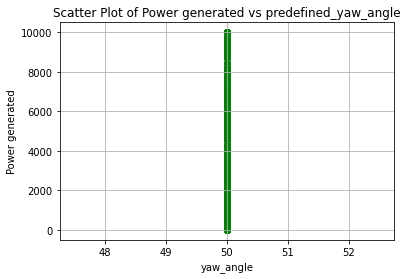

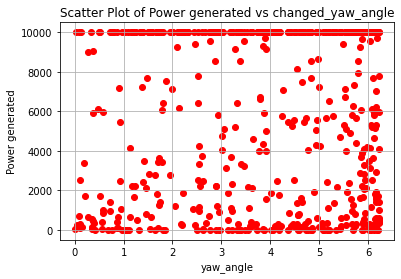

Power_list: [9999.99685493706, 9999.98745304812]
Predefined Yaw Angle 1: 55.82415769086116
Predefined Yaw Angle 2: 54.10477763707006
Changed Yaw Angle 1: 5.824157690861165
Changed Yaw Angle 2: 4.104777637070056
farm_power_baseline : [9999.99150471 1355.1998854 ], farm_power_yaw : [10000.01565418  3153.40220998]


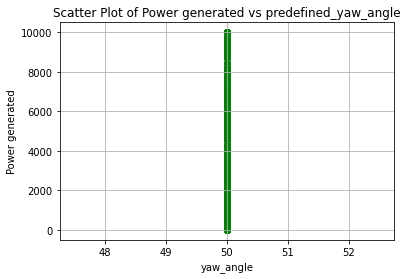

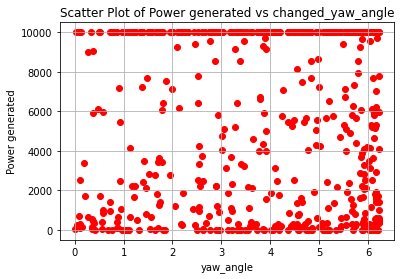

Power_list: [9999.991504707185, 10000.016952933165]
Predefined Yaw Angle 1: 56.22722392605135
Predefined Yaw Angle 2: 55.74845855762992
Changed Yaw Angle 1: 6.22722392605135
Changed Yaw Angle 2: 5.748458557629914
farm_power_baseline : [1573.77968207 9999.99507967], farm_power_yaw : [ 3612.04718499 10000.005236  ]


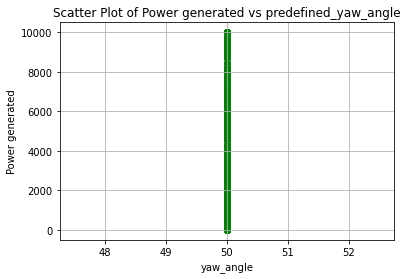

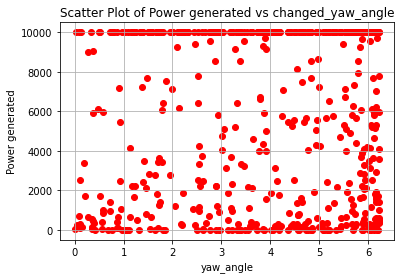

Power_list: [9999.995079669328, 10000.005236004925]
Predefined Yaw Angle 1: 56.222487227736536
Predefined Yaw Angle 2: 56.13682041517733
Changed Yaw Angle 1: 6.222487227736535
Changed Yaw Angle 2: 6.136820415177335
farm_power_baseline : [6431.7595883  1950.30967734], farm_power_yaw : [10000.00578354  4442.47276196]


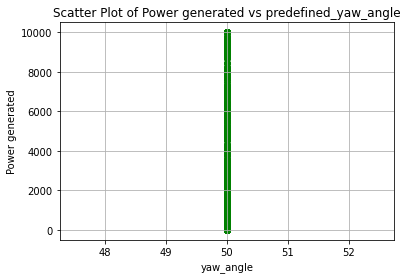

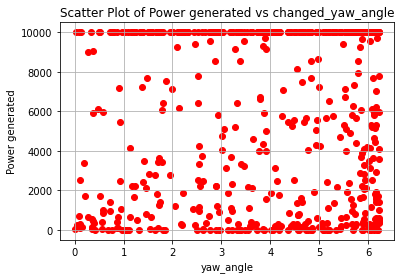

Power_list: [6431.759588300849, 10000.005976615039]
Predefined Yaw Angle 1: 56.22137136323979
Predefined Yaw Angle 2: 56.04683166931134
Changed Yaw Angle 1: 6.221371363239792
Changed Yaw Angle 2: 6.04683166931134
farm_power_baseline : [ 415.84218293 9999.99655432], farm_power_yaw : [1074.80777407 9999.97471664]


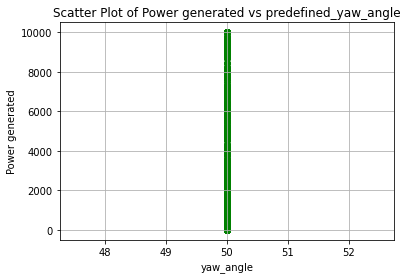

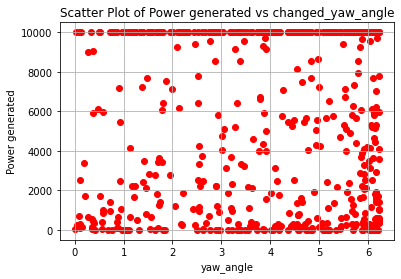

Power_list: [9999.996554322885, 9999.979351534786]
Predefined Yaw Angle 1: 56.17265309215453
Predefined Yaw Angle 2: 54.982936098079946
Changed Yaw Angle 1: 6.172653092154536
Changed Yaw Angle 2: 4.9829360980799455
farm_power_baseline : [   96.64200314 10000.00425137], farm_power_yaw : [  371.14028891 10000.01378814]


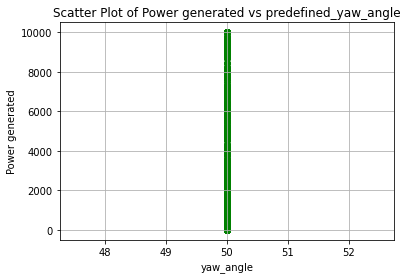

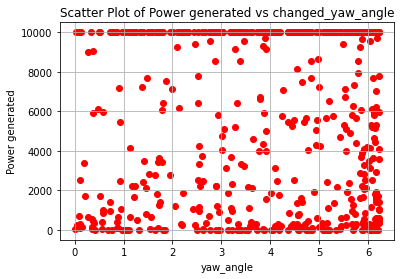

Power_list: [10000.004251374294, 10000.013788136115]
Predefined Yaw Angle 1: 55.99943044221142
Predefined Yaw Angle 2: 56.17048490188481
Changed Yaw Angle 1: 5.9994304422114215
Changed Yaw Angle 2: 6.17048490188481
farm_power_baseline : [7406.17198801 6796.87771395], farm_power_yaw : [10000.00185634 10000.00522569]


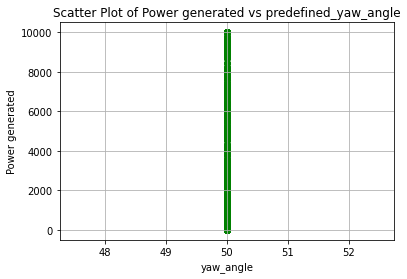

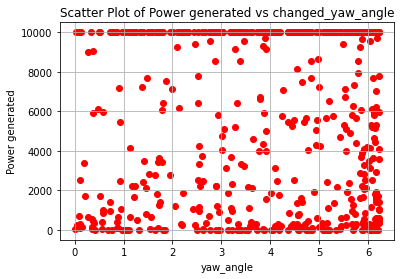

Power_list: [7406.171988005113, 10000.005225685713]
Predefined Yaw Angle 1: 56.22835417161798
Predefined Yaw Angle 2: 56.10874057727576
Changed Yaw Angle 1: 6.228354171617979
Changed Yaw Angle 2: 6.108740577275758
farm_power_baseline : [1478.13692394    0.        ], farm_power_yaw : [3400.53581264    0.        ]


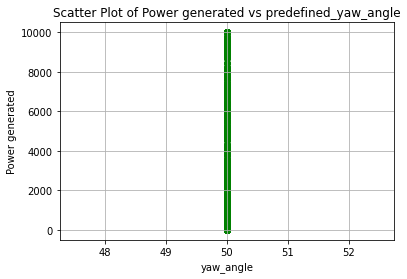

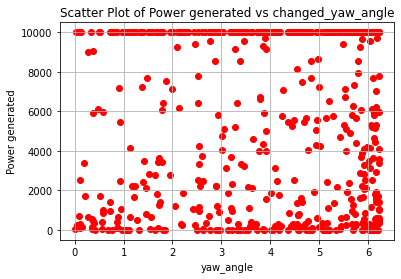

Power_list: [1478.136923940371, 3438.3122224911617]
Predefined Yaw Angle 1: 56.224518687016044
Predefined Yaw Angle 2: 56.127620258875545
Changed Yaw Angle 1: 6.2245186870160465
Changed Yaw Angle 2: 6.127620258875548
farm_power_baseline : [1474.75066263    0.        ], farm_power_yaw : [3393.86946101   19.11264538]


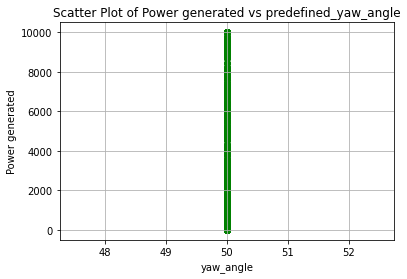

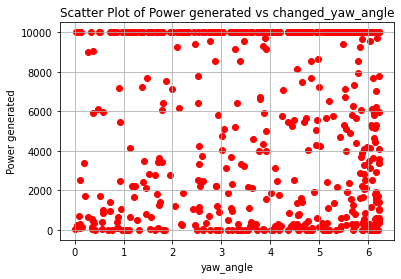

Power_list: [1474.7506626262464, 3430.8111317556154]
Predefined Yaw Angle 1: 56.22240147394943
Predefined Yaw Angle 2: 55.89887336336537
Changed Yaw Angle 1: 6.222401473949434
Changed Yaw Angle 2: 5.898873363365372
farm_power_baseline : [  0.         737.39316826], farm_power_yaw : [   0.         1794.44980768]


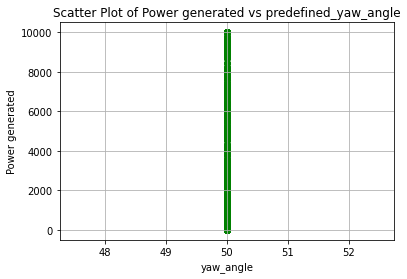

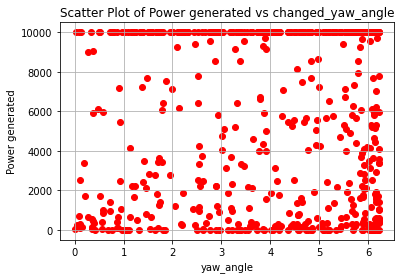

Power_list: [737.393168259099, 1812.9069253642197]
Predefined Yaw Angle 1: 56.22835417161798
Predefined Yaw Angle 2: 55.831504442534076
Changed Yaw Angle 1: 6.228354171617979
Changed Yaw Angle 2: 5.831504442534073
farm_power_baseline : [733.49199787 180.78238401], farm_power_yaw : [1785.96460319  560.63672794]


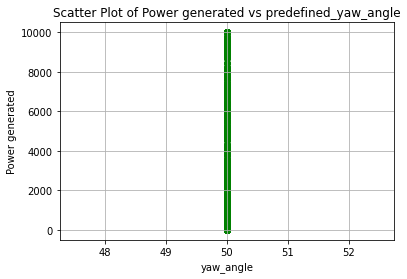

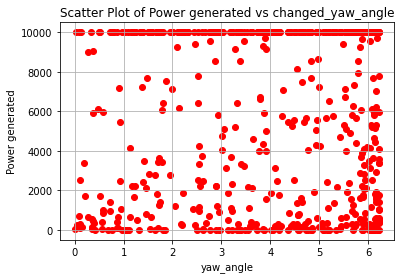

Power_list: [733.4919978741582, 1804.2116908479643]
Predefined Yaw Angle 1: 56.19986260901187
Predefined Yaw Angle 2: 55.047669554696505
Changed Yaw Angle 1: 6.199862609011875
Changed Yaw Angle 2: 5.047669554696502
farm_power_baseline : [ 111.54765641 2139.18812601], farm_power_yaw : [ 403.93700237 4859.90197129]


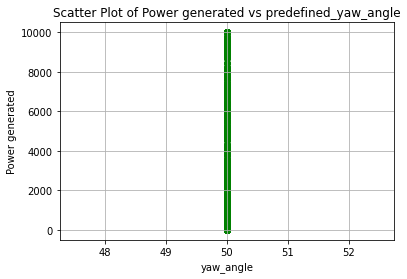

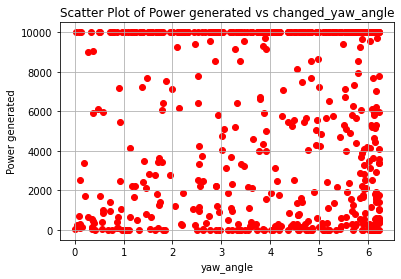

Power_list: [2139.188126005774, 4906.422191792548]
Predefined Yaw Angle 1: 56.22835417161798
Predefined Yaw Angle 2: 56.13051937603821
Changed Yaw Angle 1: 6.228354171617979
Changed Yaw Angle 2: 6.130519376038208
farm_power_baseline : [   0.         2272.37334168], farm_power_yaw : [  67.25715215 5171.8452298 ]


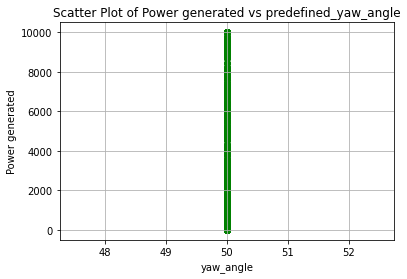

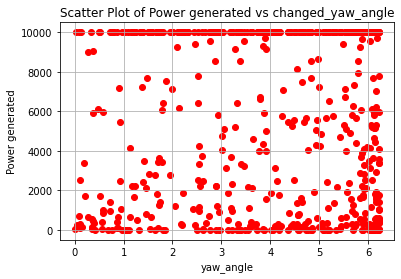

Power_list: [2272.373341682123, 5229.319228770732]
Predefined Yaw Angle 1: 56.2139656448805
Predefined Yaw Angle 2: 55.540763950536814
Changed Yaw Angle 1: 6.213965644880499
Changed Yaw Angle 2: 5.540763950536815
farm_power_baseline : [6589.02849881    0.        ], farm_power_yaw : [10000.00572707     0.        ]


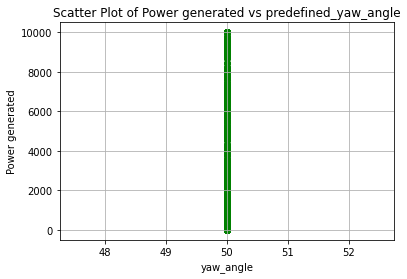

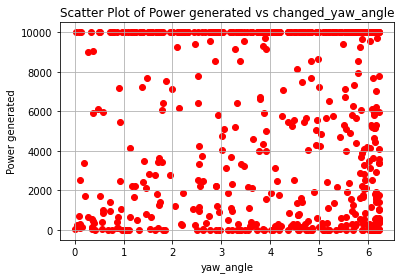

Power_list: [6589.028498808911, 10000.005727069465]
Predefined Yaw Angle 1: 56.2283429863414
Predefined Yaw Angle 2: 55.93313226762815
Changed Yaw Angle 1: 6.228342986341401
Changed Yaw Angle 2: 5.933132267628151
farm_power_baseline : [2755.73631826 3418.18748549], farm_power_yaw : [6252.86955672 7729.31794133]


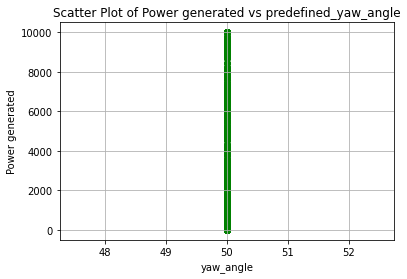

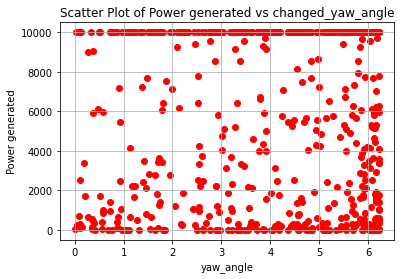

Power_list: [3418.1874854909843, 7812.962603466179]
Predefined Yaw Angle 1: 56.228333398961475
Predefined Yaw Angle 2: 56.153542403661945
Changed Yaw Angle 1: 6.228333398961476
Changed Yaw Angle 2: 6.153542403661943
farm_power_baseline : [ 412.61931742 1870.47461582], farm_power_yaw : [1067.13731382 4269.50656698]


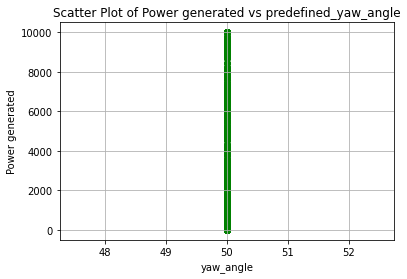

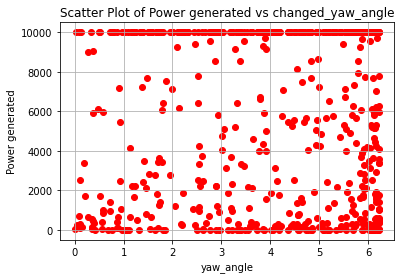

Power_list: [1870.4746158243922, 4317.998998710689]
Predefined Yaw Angle 1: 55.797927152020534
Predefined Yaw Angle 2: 56.02235775152573
Changed Yaw Angle 1: 5.797927152020538
Changed Yaw Angle 2: 6.02235775152573
farm_power_baseline : [ 130.72103743 9999.99663045], farm_power_yaw : [  445.74602079 10000.01405236]


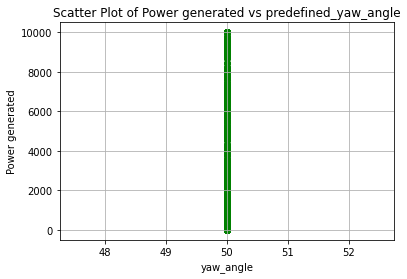

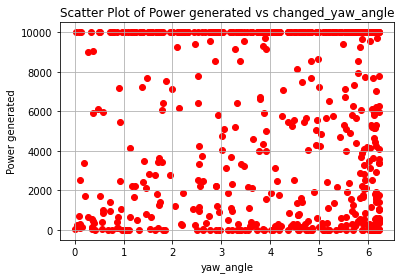

Power_list: [9999.996630451269, 10000.0146026974]
Predefined Yaw Angle 1: 56.22835417161798
Predefined Yaw Angle 2: 56.13995761894145
Changed Yaw Angle 1: 6.228354171617979
Changed Yaw Angle 2: 6.139957618941449
farm_power_baseline : [690.7850941  859.14757506], farm_power_yaw : [1690.19796374 2061.77067163]


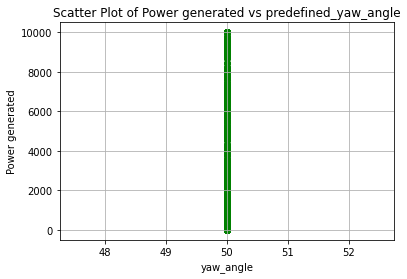

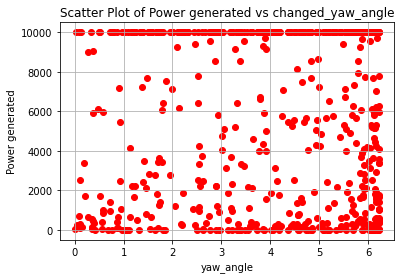

Power_list: [859.1475750629177, 2084.8281991687486]
Predefined Yaw Angle 1: 56.22835204108911
Predefined Yaw Angle 2: 55.317477600525734
Changed Yaw Angle 1: 6.228352041089107
Changed Yaw Angle 2: 5.317477600525737
farm_power_baseline : [9688.04636365  551.49843379], farm_power_yaw : [10000.00110462  1387.62648668]


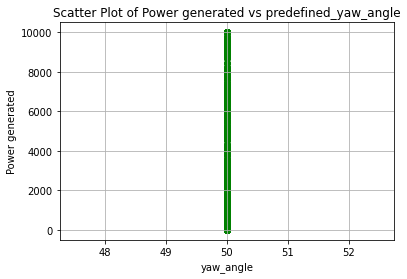

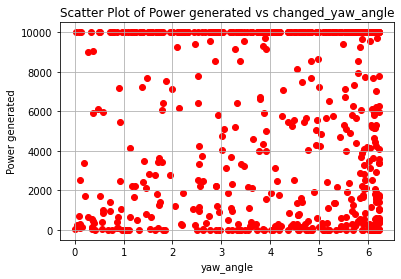

Power_list: [9688.046363654244, 10000.001104623861]
Predefined Yaw Angle 1: 56.22835417161798
Predefined Yaw Angle 2: 55.86900334857904
Changed Yaw Angle 1: 6.228354171617979
Changed Yaw Angle 2: 5.869003348579043
farm_power_baseline : [9999.99546539 1689.02351513], farm_power_yaw : [10000.00311518  3865.68670048]


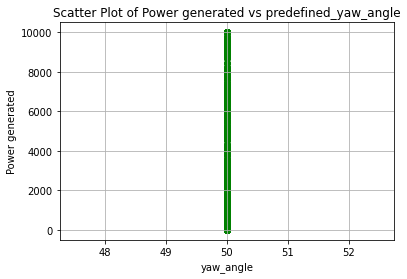

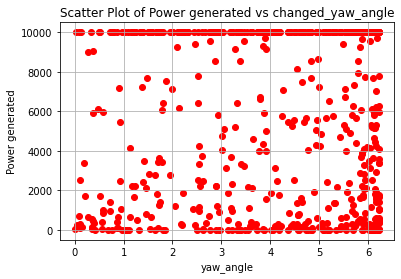

Power_list: [9999.995465389573, 10000.003115184507]
Predefined Yaw Angle 1: 56.22835417161798
Predefined Yaw Angle 2: 56.15889908587853
Changed Yaw Angle 1: 6.228354171617979
Changed Yaw Angle 2: 6.158899085878528
farm_power_baseline : [ 186.9500246  4647.04533439], farm_power_yaw : [ 577.00168036 9999.98991141]


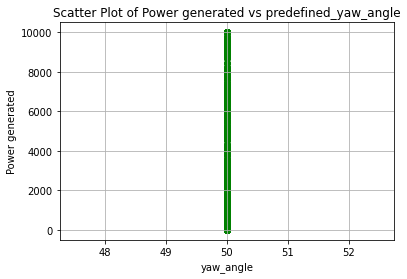

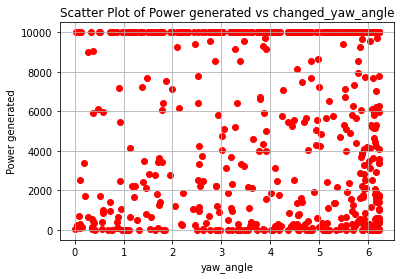

Power_list: [4647.045334390906, 9999.990766842631]
Predefined Yaw Angle 1: 56.17920766422944
Predefined Yaw Angle 2: 55.82901491954707
Changed Yaw Angle 1: 6.1792076642294385
Changed Yaw Angle 2: 5.829014919547068
farm_power_baseline : [   0.         9999.99597502], farm_power_yaw : [   0.        9999.9984326]


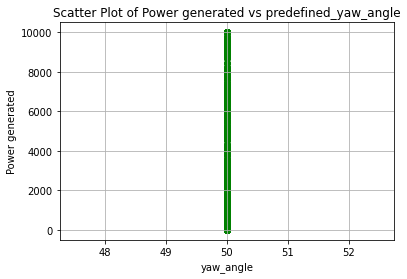

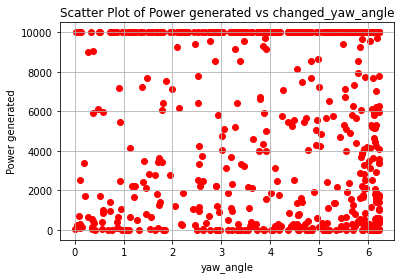

Power_list: [9999.995975022734, 10000.002957297647]
Predefined Yaw Angle 1: 56.22812247660314
Predefined Yaw Angle 2: 55.97235796732393
Changed Yaw Angle 1: 6.228122476603142
Changed Yaw Angle 2: 5.972357967323928
farm_power_baseline : [   0.         5616.91277861], farm_power_yaw : [  73.66571416 9999.99594245]


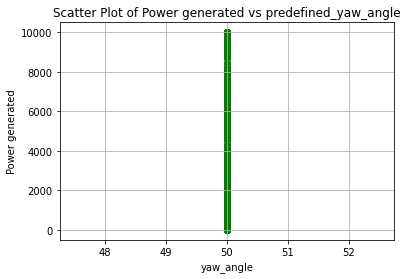

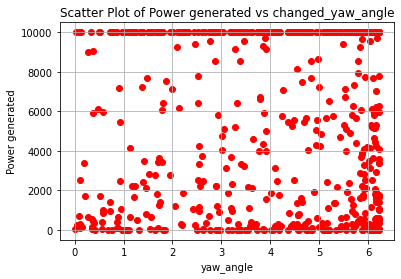

Power_list: [5616.912778605745, 9999.995942451607]
Predefined Yaw Angle 1: 56.19773048224316
Predefined Yaw Angle 2: 52.140529619252376
Changed Yaw Angle 1: 6.197730482243158
Changed Yaw Angle 2: 2.1405296192523786
farm_power_baseline : [ 14.19053352 298.01278436], farm_power_yaw : [170.34719273 821.20372661]


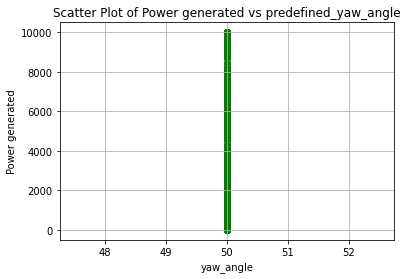

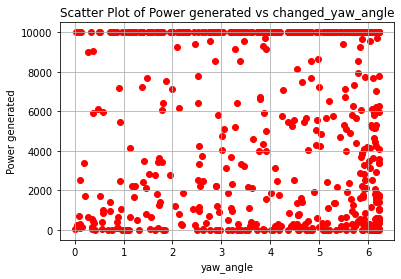

Power_list: [298.01278436290136, 827.3153176482662]
Predefined Yaw Angle 1: 53.51124462838868
Predefined Yaw Angle 2: 55.7205816526034
Changed Yaw Angle 1: 3.5112446283886785
Changed Yaw Angle 2: 5.720581652603401
farm_power_baseline : [4768.19596289 6765.77157783], farm_power_yaw : [ 9999.99234364 10000.0052314 ]


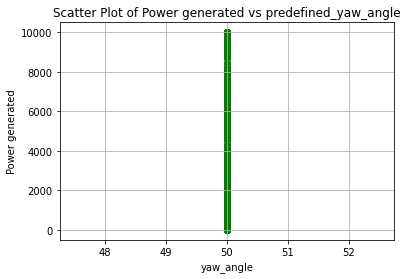

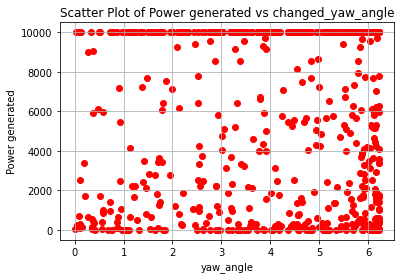

Power_list: [6765.771577831956, 10000.005231403913]
Predefined Yaw Angle 1: 55.770688873023424
Predefined Yaw Angle 2: 56.13541639665065
Changed Yaw Angle 1: 5.770688873023426
Changed Yaw Angle 2: 6.135416396650646
farm_power_baseline : [7456.72445817  337.43559555], farm_power_yaw : [10000.00119223   917.08612761]


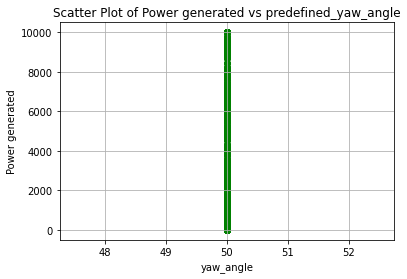

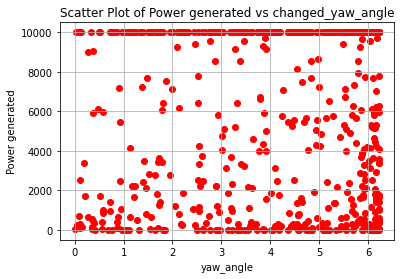

Power_list: [7456.724458167043, 10000.001192231091]
Predefined Yaw Angle 1: 55.92974829965728
Predefined Yaw Angle 2: 54.41686203362376
Changed Yaw Angle 1: 5.92974829965728
Changed Yaw Angle 2: 4.4168620336237545
farm_power_baseline : [0. 0.], farm_power_yaw : [0. 0.]


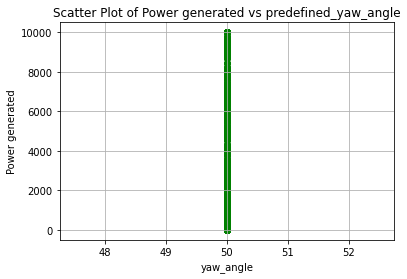

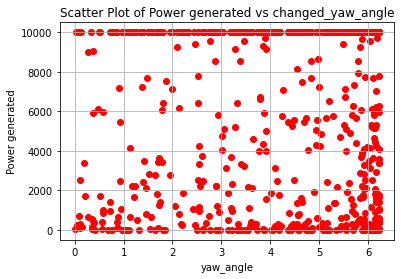

Power_list: [0.0, 0.0]
Predefined Yaw Angle 1: 55.99461544696056
Predefined Yaw Angle 2: 56.1347085284329
Changed Yaw Angle 1: 5.994615446960559
Changed Yaw Angle 2: 6.134708528432903
farm_power_baseline : [5504.3476942   914.33086629], farm_power_yaw : [9999.99616597 2178.02561321]


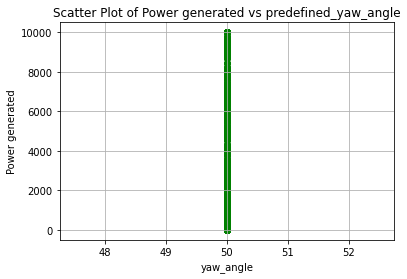

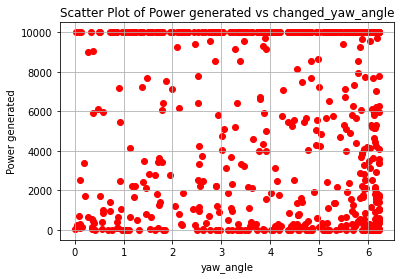

Power_list: [5504.347694197819, 9999.996165971963]
Predefined Yaw Angle 1: 56.225826299111276
Predefined Yaw Angle 2: 56.133530345966655
Changed Yaw Angle 1: 6.225826299111276
Changed Yaw Angle 2: 6.133530345966652
farm_power_baseline : [9999.99363919 4871.27435101], farm_power_yaw : [10000.01379851  9999.9937395 ]


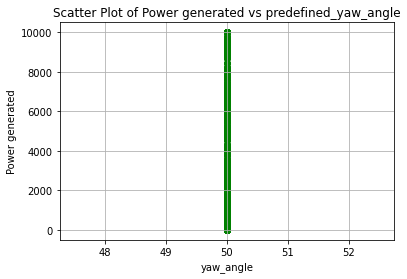

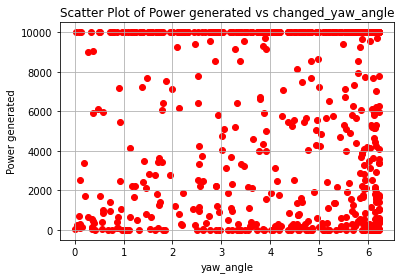

Power_list: [9999.993639188131, 10000.013798510907]
Predefined Yaw Angle 1: 55.74980755954833
Predefined Yaw Angle 2: 52.53916195754369
Changed Yaw Angle 1: 5.749807559548333
Changed Yaw Angle 2: 2.5391619575436906
farm_power_baseline : [9999.99206736  190.72386649], farm_power_yaw : [10000.01723588   590.29521511]


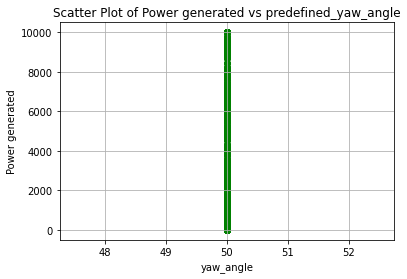

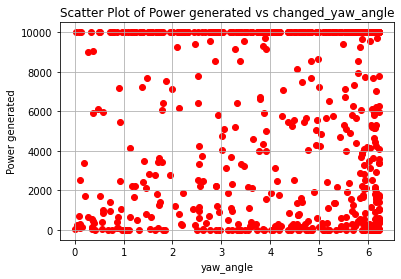

Power_list: [9999.992067358695, 10000.017885478883]
Predefined Yaw Angle 1: 56.094084513675014
Predefined Yaw Angle 2: 56.13741856115817
Changed Yaw Angle 1: 6.094084513675018
Changed Yaw Angle 2: 6.137418561158167
farm_power_baseline : [7512.62692898    0.        ], farm_power_yaw : [10000.00055033     0.        ]


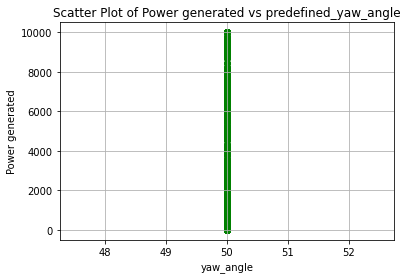

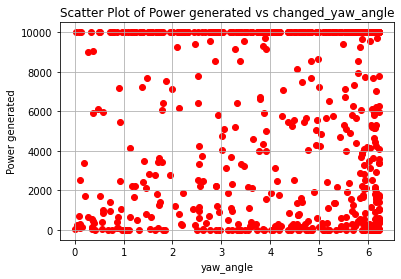

Power_list: [7512.626928980148, 10000.000550328212]
Predefined Yaw Angle 1: 55.82779716680687
Predefined Yaw Angle 2: 55.956525474643406
Changed Yaw Angle 1: 5.827797166806867
Changed Yaw Angle 2: 5.956525474643407
farm_power_baseline : [8070.35130122 5996.85904392], farm_power_yaw : [9999.99515888 9999.99956475]


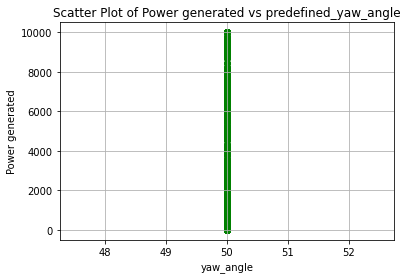

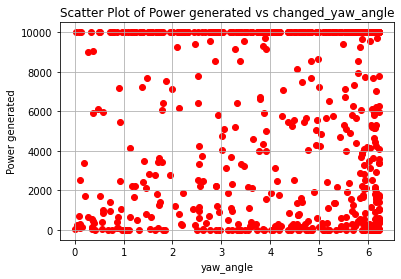

Power_list: [8070.351301218646, 10000.000441239828]
Predefined Yaw Angle 1: 56.185755312085504
Predefined Yaw Angle 2: 56.12732997431673
Changed Yaw Angle 1: 6.185755312085507
Changed Yaw Angle 2: 6.127329974316729
farm_power_baseline : [ 5024.48482169 10000.00178522], farm_power_yaw : [ 9999.99609835 10000.01410153]


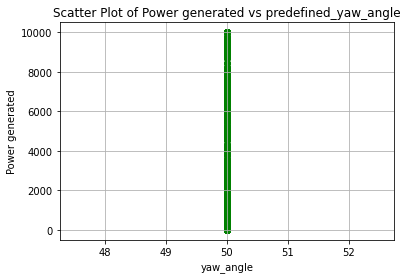

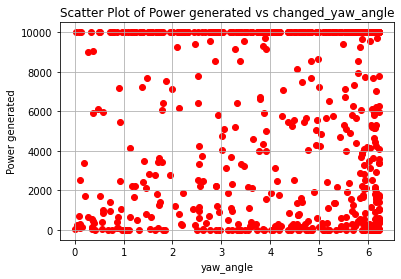

Power_list: [10000.001785217024, 10000.014101534722]
Predefined Yaw Angle 1: 56.21258612743584
Predefined Yaw Angle 2: 56.156747251717746
Changed Yaw Angle 1: 6.212586127435838
Changed Yaw Angle 2: 6.156747251717745
farm_power_baseline : [ 282.90640141 9341.78596074], farm_power_yaw : [  778.18704743 10000.00259263]


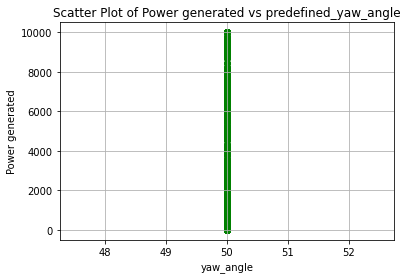

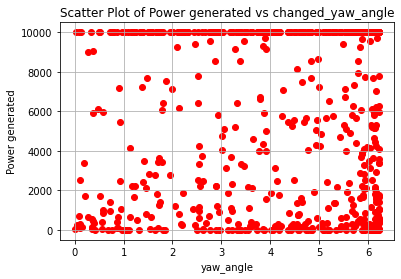

Power_list: [9341.785960735353, 10000.002592632376]
Predefined Yaw Angle 1: 56.22351361002065
Predefined Yaw Angle 2: 56.11422828701797
Changed Yaw Angle 1: 6.223513610020651
Changed Yaw Angle 2: 6.114228287017975
farm_power_baseline : [8250.82734899 9999.987601  ], farm_power_yaw : [ 9999.9971677  10000.00605419]


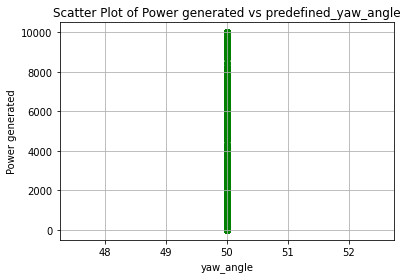

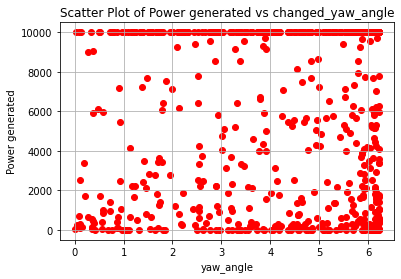

Power_list: [9999.987600999973, 10000.007980025493]
Predefined Yaw Angle 1: 56.19764419582384
Predefined Yaw Angle 2: 56.113438393438656
Changed Yaw Angle 1: 6.197644195823839
Changed Yaw Angle 2: 6.113438393438658
farm_power_baseline : [9999.99571838  131.95032404], farm_power_yaw : [10000.00862521   447.98662858]


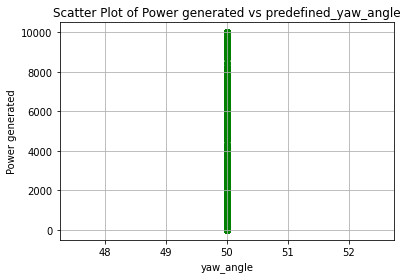

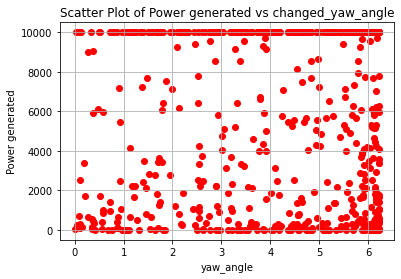

Power_list: [9999.995718383007, 10000.013415048268]
Predefined Yaw Angle 1: 55.65256223234409
Predefined Yaw Angle 2: 55.07706020048661
Changed Yaw Angle 1: 5.652562232344089
Changed Yaw Angle 2: 5.077060200486616
farm_power_baseline : [9747.50018741    0.        ], farm_power_yaw : [10000.00080729     0.        ]


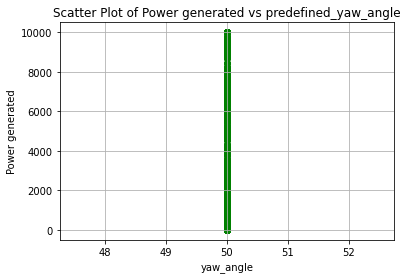

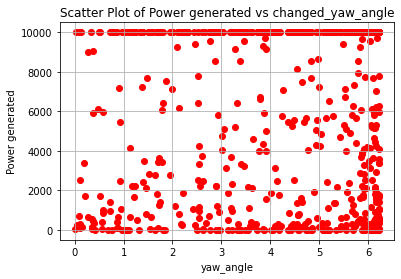

Power_list: [9747.50018740805, 10000.001766032743]
Predefined Yaw Angle 1: 56.023475591061526
Predefined Yaw Angle 2: 56.089059816820075
Changed Yaw Angle 1: 6.023475591061529
Changed Yaw Angle 2: 6.089059816820073
farm_power_baseline : [  50.05000286 2239.66146588], farm_power_yaw : [ 260.42108094 5095.08597184]


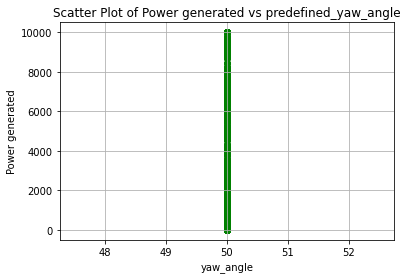

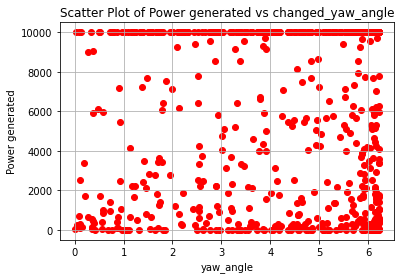

Power_list: [2239.6614658848475, 5150.011869351754]
Predefined Yaw Angle 1: 55.78118811930496
Predefined Yaw Angle 2: 56.13501479195826
Changed Yaw Angle 1: 5.781188119304955
Changed Yaw Angle 2: 6.135014791958262
farm_power_baseline : [   0.         9999.99577745], farm_power_yaw : [    0.         10000.00652518]


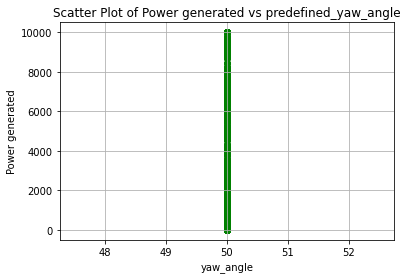

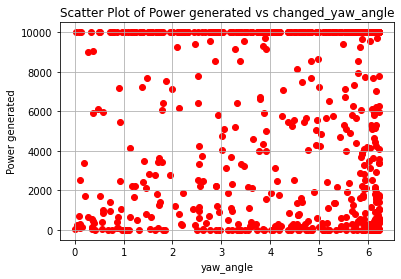

Power_list: [9999.995777447846, 10000.011008229292]
Predefined Yaw Angle 1: 56.21997799735746
Predefined Yaw Angle 2: 55.79923971329555
Changed Yaw Angle 1: 6.219977997357462
Changed Yaw Angle 2: 5.799239713295545
farm_power_baseline : [4262.98412238 6326.48528994], farm_power_yaw : [ 9565.95271715 10000.00430918]


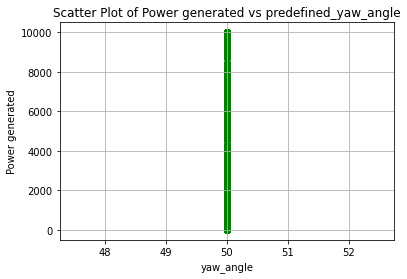

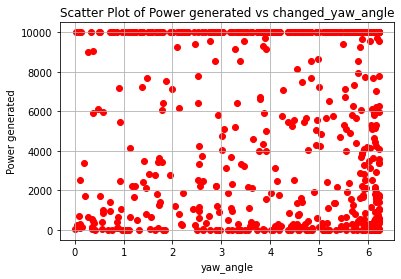

Power_list: [6326.485289941945, 10000.00523852729]
Predefined Yaw Angle 1: 56.22666572748687
Predefined Yaw Angle 2: 56.08388422955761
Changed Yaw Angle 1: 6.226665727486869
Changed Yaw Angle 2: 6.083884229557612
farm_power_baseline : [759.03475416 161.28237328], farm_power_yaw : [1845.20640111  512.63596394]


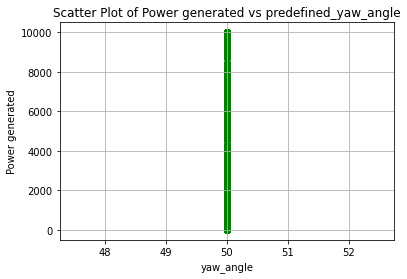

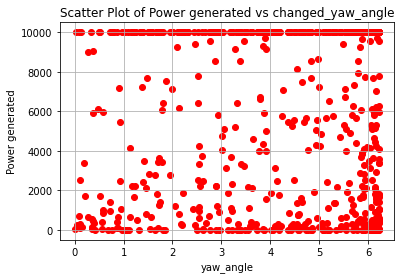

Power_list: [759.0347541589923, 1867.2639889825343]
Predefined Yaw Angle 1: 55.774354447947815
Predefined Yaw Angle 2: 56.119393221636074
Changed Yaw Angle 1: 5.774354447947811
Changed Yaw Angle 2: 6.119393221636075
farm_power_baseline : [ 9999.99674711 10000.00582964], farm_power_yaw : [ 9999.98252148 10000.01026139]


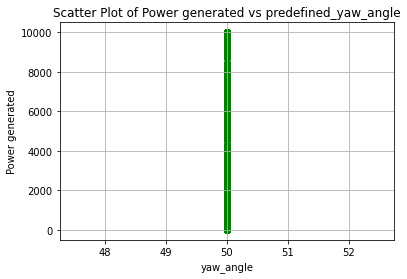

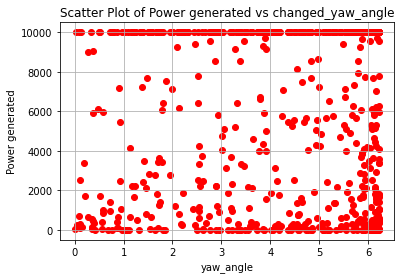

Power_list: [10000.005829643082, 10000.010261394147]
Predefined Yaw Angle 1: 55.34804254486676
Predefined Yaw Angle 2: 56.112437044868784
Changed Yaw Angle 1: 5.348042544866761
Changed Yaw Angle 2: 6.112437044868788
farm_power_baseline : [7634.39720958  492.03737154], farm_power_yaw : [9999.99893309 1255.38318191]


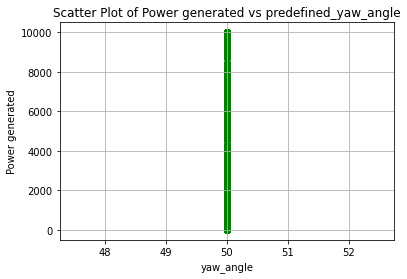

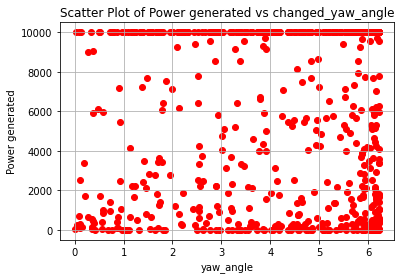

Power_list: [7634.397209582323, 9999.998933094565]
Predefined Yaw Angle 1: 55.73212363727799
Predefined Yaw Angle 2: 55.99690379045897
Changed Yaw Angle 1: 5.732123637277988
Changed Yaw Angle 2: 5.996903790458971
farm_power_baseline : [  101.04565962 10000.00453874], farm_power_yaw : [ 380.4027321  9999.97995986]


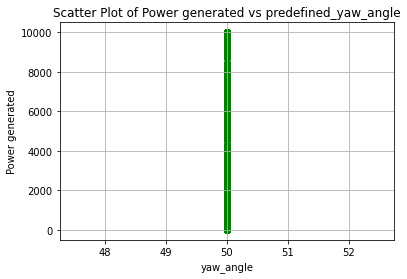

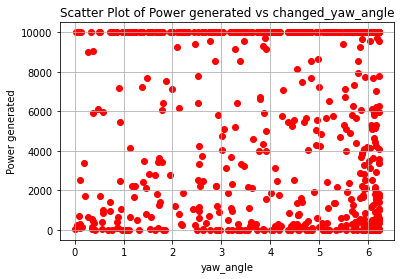

Power_list: [10000.004538739639, 9999.979959857465]
Predefined Yaw Angle 1: 55.80252483332645
Predefined Yaw Angle 2: 56.07551018582597
Changed Yaw Angle 1: 5.802524833326451
Changed Yaw Angle 2: 6.0755101858259675
farm_power_baseline : [493.68492817 400.44851264], farm_power_yaw : [1258.36487987 1043.97721495]


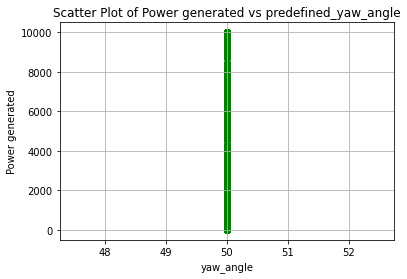

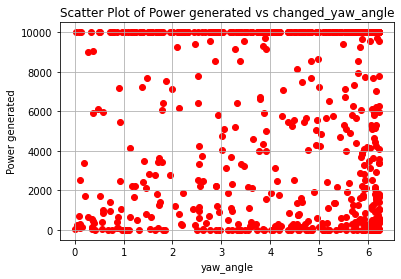

Power_list: [493.6849281715463, 1271.9064021788815]
Predefined Yaw Angle 1: 56.14078943497617
Predefined Yaw Angle 2: 56.15408568852432
Changed Yaw Angle 1: 6.140789434976174
Changed Yaw Angle 2: 6.15408568852432
farm_power_baseline : [8687.28631351  166.31824861], farm_power_yaw : [10000.0022482    523.75218057]


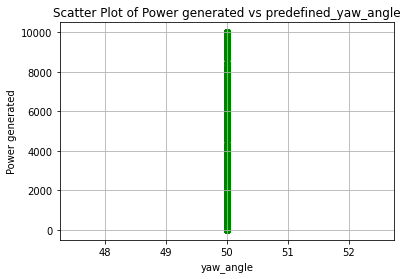

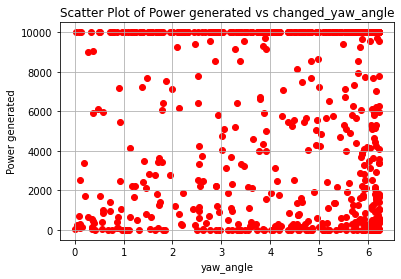

Power_list: [8687.28631351098, 10000.003281729232]
Predefined Yaw Angle 1: 55.90786297445123
Predefined Yaw Angle 2: 56.12534112561466
Changed Yaw Angle 1: 5.907862974451227
Changed Yaw Angle 2: 6.125341125614658
farm_power_baseline : [ 394.73828046 9829.1557642 ], farm_power_yaw : [ 1032.39068459 10000.00152419]


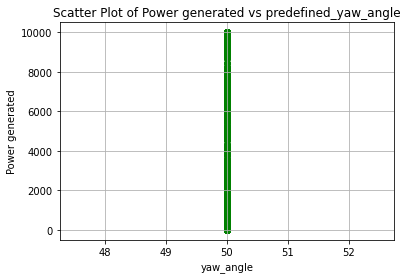

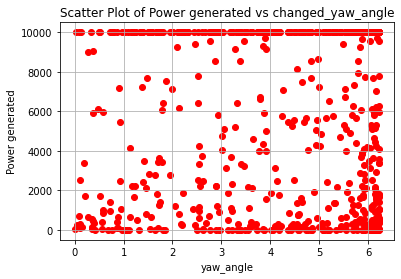

Power_list: [9829.155764195677, 10000.003340536685]
Predefined Yaw Angle 1: 56.02302871263061
Predefined Yaw Angle 2: 56.044895018566635
Changed Yaw Angle 1: 6.023028712630614
Changed Yaw Angle 2: 6.044895018566635
farm_power_baseline : [9999.99692541 1530.73930223], farm_power_yaw : [9999.99051989 3516.50946854]


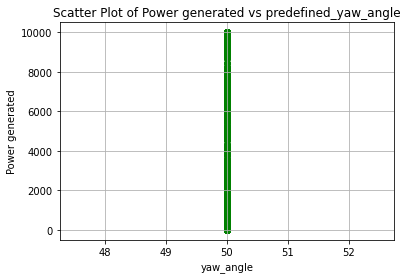

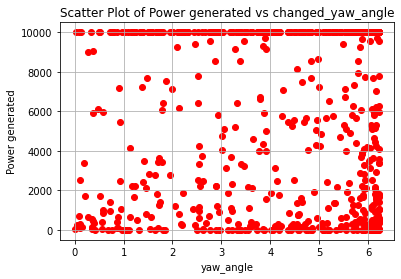

Power_list: [9999.996925413856, 9999.99051988714]
Predefined Yaw Angle 1: 55.973170075966586
Predefined Yaw Angle 2: 55.97111160793377
Changed Yaw Angle 1: 5.9731700759665864
Changed Yaw Angle 2: 5.971111607933771
farm_power_baseline : [   0.         4644.91447783], farm_power_yaw : [   0.         9999.98993501]


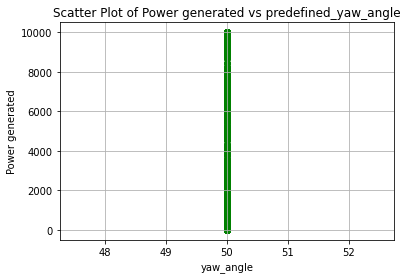

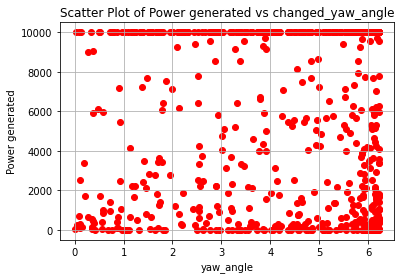

Power_list: [4644.9144778307755, 9999.990730195554]
Predefined Yaw Angle 1: 56.20944466261398
Predefined Yaw Angle 2: 56.00382428086765
Changed Yaw Angle 1: 6.20944466261398
Changed Yaw Angle 2: 6.003824280867651
farm_power_baseline : [3428.45636934 1682.74850839], farm_power_yaw : [7750.88230581 3851.09446831]


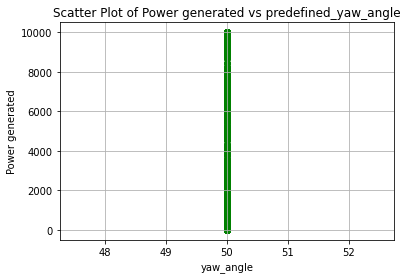

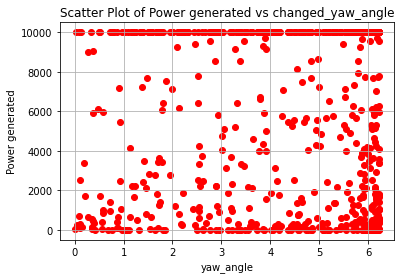

Power_list: [3428.4563693404784, 7835.294747541188]
Predefined Yaw Angle 1: 56.11309522280044
Predefined Yaw Angle 2: 55.94706326329035
Changed Yaw Angle 1: 6.11309522280044
Changed Yaw Angle 2: 5.947063263290356
farm_power_baseline : [ 537.741957   9999.99573294], farm_power_yaw : [ 1360.3445046  10000.00822674]


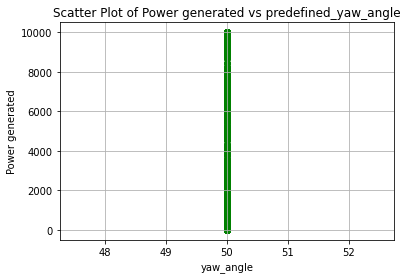

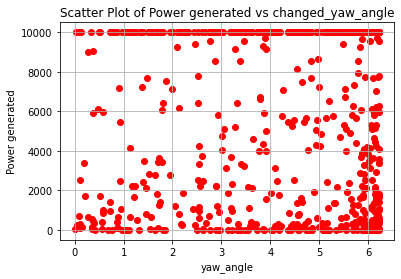

Power_list: [9999.995732939342, 10000.012821895672]
Predefined Yaw Angle 1: 56.19362974679665
Predefined Yaw Angle 2: 55.88173805227959
Changed Yaw Angle 1: 6.1936297467966535
Changed Yaw Angle 2: 5.881738052279584
farm_power_baseline : [ 3423.672003   10000.00272584], farm_power_yaw : [ 7742.37778862 10000.01398518]


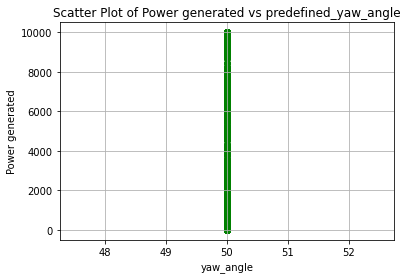

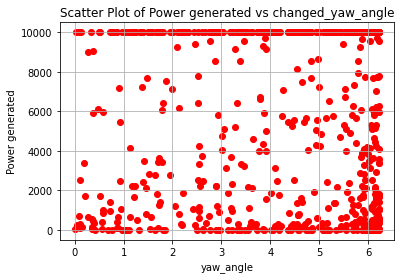

Power_list: [10000.002725836237, 10000.013985177477]
Predefined Yaw Angle 1: 56.12284825134453
Predefined Yaw Angle 2: 56.057331448225085
Changed Yaw Angle 1: 6.122848251344528
Changed Yaw Angle 2: 6.057331448225087
farm_power_baseline : [   0.         8320.95715242], farm_power_yaw : [   0.         9999.99800893]


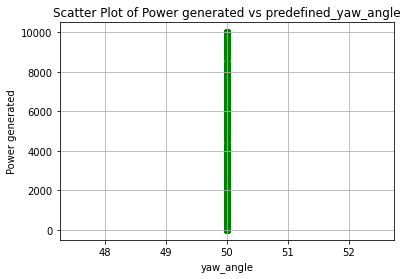

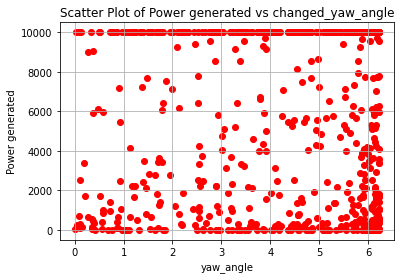

Power_list: [8320.95715242282, 9999.999008157882]
Predefined Yaw Angle 1: 56.21638326251807
Predefined Yaw Angle 2: 56.166340490596426
Changed Yaw Angle 1: 6.216383262518073
Changed Yaw Angle 2: 6.166340490596428
farm_power_baseline : [ 561.30553068 9808.52450898], farm_power_yaw : [ 1404.37112665 10000.00102137]


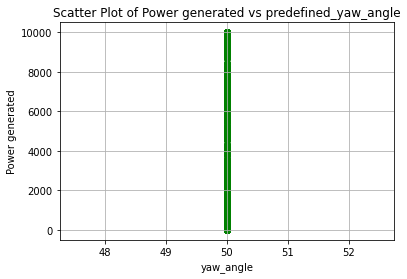

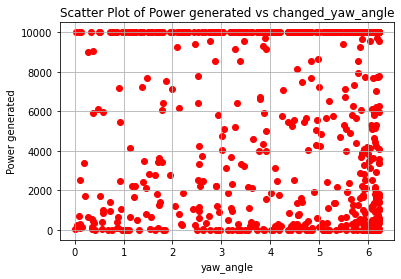

Power_list: [9808.524508977274, 10000.002942719488]
Predefined Yaw Angle 1: 55.618569644190316
Predefined Yaw Angle 2: 56.150721050803114
Changed Yaw Angle 1: 5.618569644190318
Changed Yaw Angle 2: 6.150721050803114
farm_power_baseline : [750.44015285   0.        ], farm_power_yaw : [1825.13235957    0.        ]


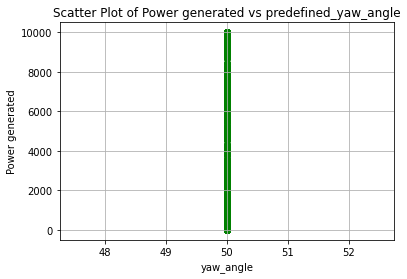

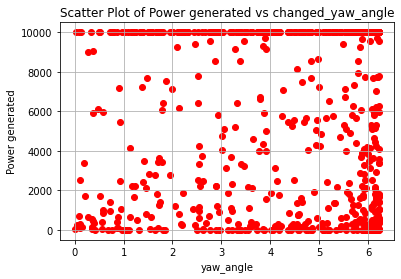

Power_list: [750.4401528489617, 1845.2583962917145]
Predefined Yaw Angle 1: 55.88635954654549
Predefined Yaw Angle 2: 55.408569960347464
Changed Yaw Angle 1: 5.886359546545491
Changed Yaw Angle 2: 5.408569960347462
farm_power_baseline : [   0.         9999.99899708], farm_power_yaw : [   37.60881944 10000.01441571]


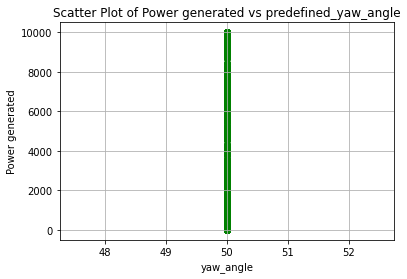

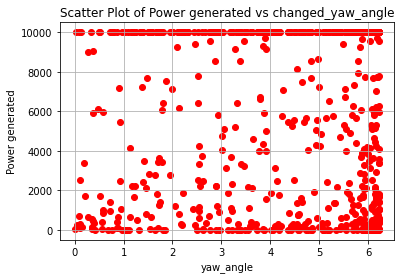

Power_list: [9999.998997075916, 10000.014415707206]
Predefined Yaw Angle 1: 56.22079558781212
Predefined Yaw Angle 2: 56.13610775326963
Changed Yaw Angle 1: 6.220795587812116
Changed Yaw Angle 2: 6.136107753269631
farm_power_baseline : [ 371.4070192  2671.30297619], farm_power_yaw : [ 985.61084294 6053.47920359]


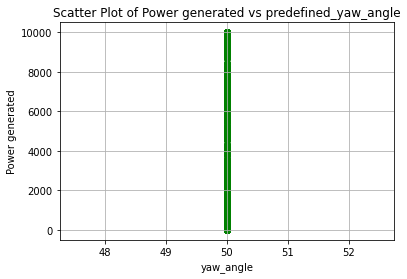

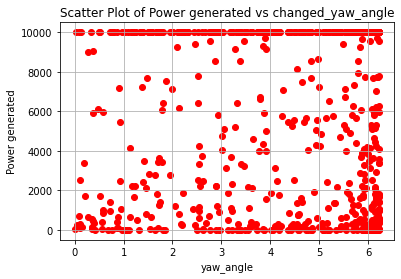

Power_list: [2671.302976185024, 6120.14333813072]
Predefined Yaw Angle 1: 55.49144791061313
Predefined Yaw Angle 2: 55.97714899412498
Changed Yaw Angle 1: 5.49144791061313
Changed Yaw Angle 2: 5.977148994124981
farm_power_baseline : [1483.56521937 5055.63214755], farm_power_yaw : [3416.06037226 9999.99669042]


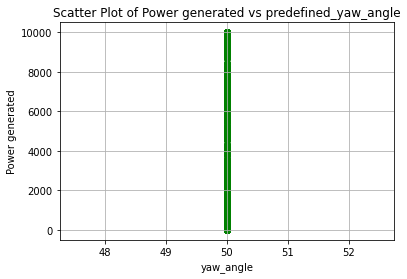

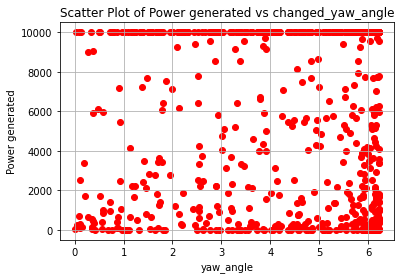

Power_list: [5055.632147545176, 9999.996952685862]
Predefined Yaw Angle 1: 56.08849986486912
Predefined Yaw Angle 2: 56.00918735467085
Changed Yaw Angle 1: 6.088499864869122
Changed Yaw Angle 2: 6.0091873546708525
farm_power_baseline : [8259.25508281  652.88808442], farm_power_yaw : [9999.99730511 1606.84020144]


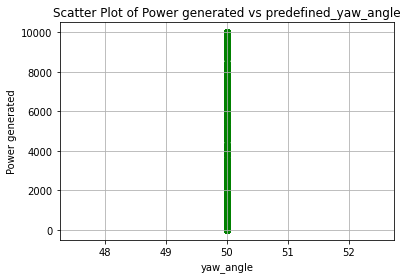

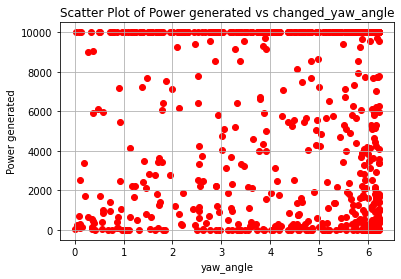

Power_list: [8259.255082808928, 9999.998288345687]
Predefined Yaw Angle 1: 56.18005028839834
Predefined Yaw Angle 2: 55.92255419177836
Changed Yaw Angle 1: 6.1800502883983395
Changed Yaw Angle 2: 5.922554191778357
farm_power_baseline : [   8.60286648 5325.15070775], farm_power_yaw : [ 157.61250277 9999.99652353]


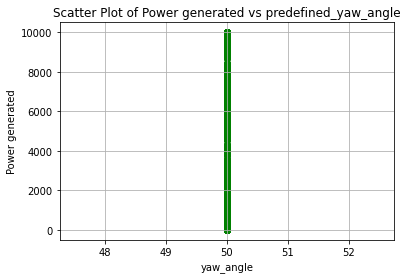

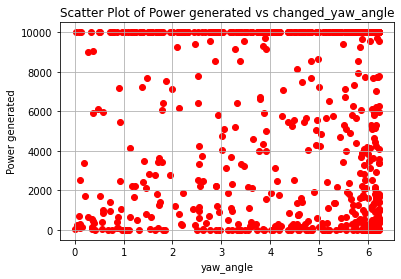

Power_list: [5325.1507077504, 9999.996523533986]
Predefined Yaw Angle 1: 56.04453214053635
Predefined Yaw Angle 2: 56.13067383938143
Changed Yaw Angle 1: 6.04453214053635
Changed Yaw Angle 2: 6.130673839381433
farm_power_baseline : [5326.59810169 6347.42643345], farm_power_yaw : [ 9999.99652194 10000.00458971]


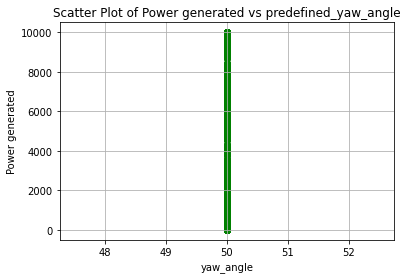

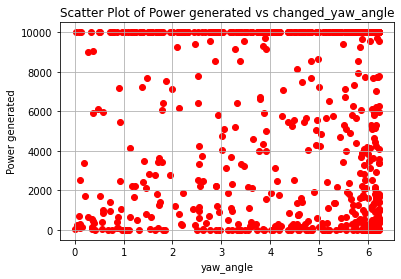

Power_list: [6347.426433450817, 10000.00554329879]
Predefined Yaw Angle 1: 56.09832479876264
Predefined Yaw Angle 2: 56.049939578303466
Changed Yaw Angle 1: 6.0983247987626426
Changed Yaw Angle 2: 6.049939578303462
farm_power_baseline : [9546.28230264    0.        ], farm_power_yaw : [10000.00172934     0.        ]


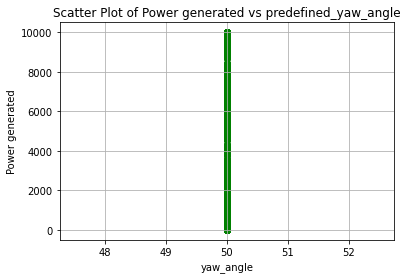

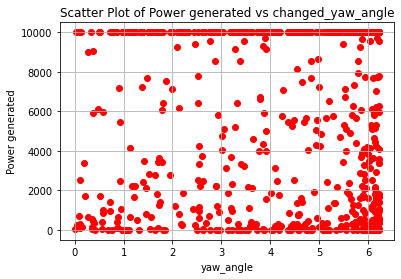

Power_list: [9546.2823026449, 10000.001729335148]
Predefined Yaw Angle 1: 56.22490963906407
Predefined Yaw Angle 2: 56.17086573392069
Changed Yaw Angle 1: 6.22490963906407
Changed Yaw Angle 2: 6.1708657339206905
farm_power_baseline : [1562.42031988 6140.69506306], farm_power_yaw : [ 3584.31891646 10000.00155719]


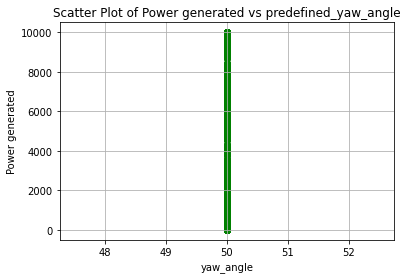

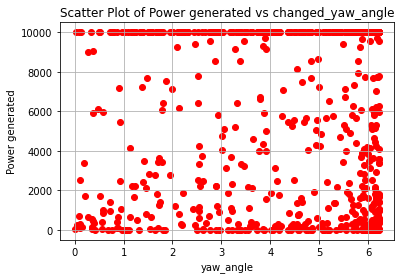

Power_list: [6140.6950630608, 10000.002534588704]
Predefined Yaw Angle 1: 56.22118920302123
Predefined Yaw Angle 2: 56.170005000256374
Changed Yaw Angle 1: 6.22118920302123
Changed Yaw Angle 2: 6.170005000256377
farm_power_baseline : [ 214.2624851  1236.99417886], farm_power_yaw : [ 635.19512011 2873.42193409]


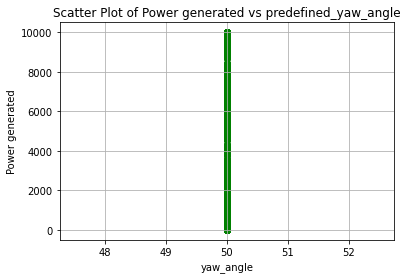

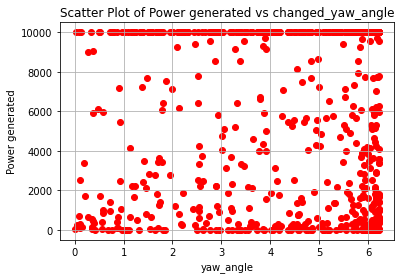

Power_list: [1236.9941788570372, 2906.695366624027]
Predefined Yaw Angle 1: 56.227200490233756
Predefined Yaw Angle 2: 56.14504691978459
Changed Yaw Angle 1: 6.2272004902337565
Changed Yaw Angle 2: 6.1450469197845905
farm_power_baseline : [ 983.91948939 1209.79273583], farm_power_yaw : [2327.70200033 2812.13980117]


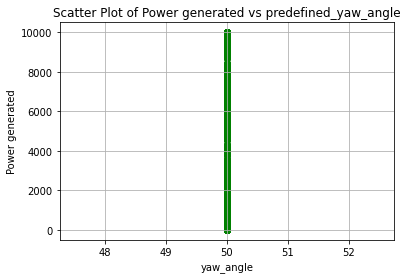

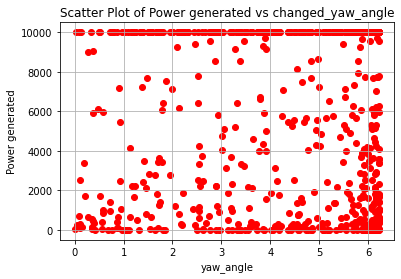

Power_list: [1209.7927358296386, 2844.7097159706973]
Predefined Yaw Angle 1: 56.22590353078289
Predefined Yaw Angle 2: 55.93945194889491
Changed Yaw Angle 1: 6.2259035307828885
Changed Yaw Angle 2: 5.939451948894909
farm_power_baseline : [726.91424826  62.66241586], farm_power_yaw : [1771.04453839  294.66711742]


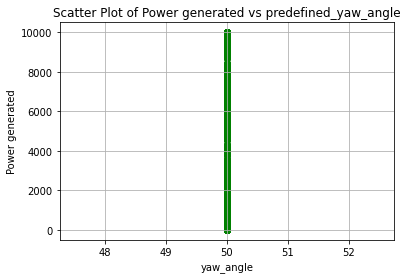

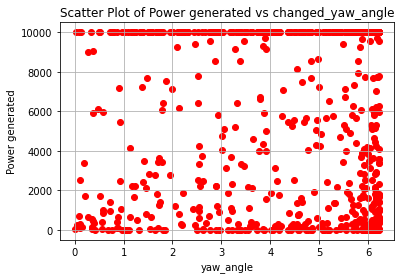

Power_list: [726.9142482597931, 1789.550686625514]
Predefined Yaw Angle 1: 56.22590246551845
Predefined Yaw Angle 2: 55.96318870369078
Changed Yaw Angle 1: 6.225902465518452
Changed Yaw Angle 2: 5.963188703690785
farm_power_baseline : [ 842.94165578 9999.99633925], farm_power_yaw : [2028.54363213 9999.98350776]


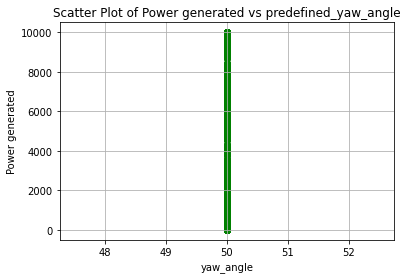

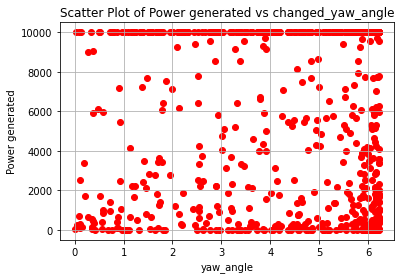

Power_list: [9999.996339253412, 9999.988115349108]
Predefined Yaw Angle 1: 56.197777353878344
Predefined Yaw Angle 2: 56.16710215466819
Changed Yaw Angle 1: 6.197777353878343
Changed Yaw Angle 2: 6.167102154668191
farm_power_baseline : [3443.29290607 1129.41848459], farm_power_yaw : [7780.94519402 2650.91391162]


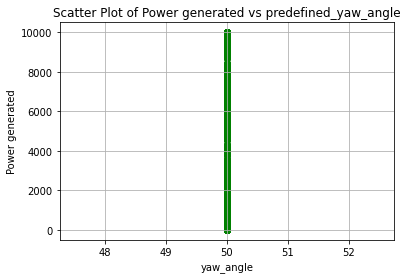

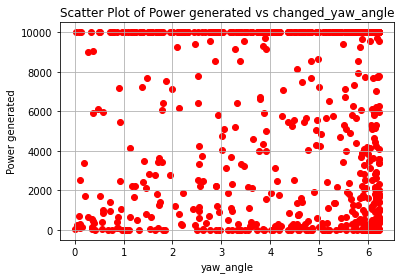

Power_list: [3443.2929060710767, 7867.560345311897]
Predefined Yaw Angle 1: 56.074214668781934
Predefined Yaw Angle 2: 56.01498878478948
Changed Yaw Angle 1: 6.074214668781937
Changed Yaw Angle 2: 6.01498878478948
farm_power_baseline : [ 149.16559669 8977.71226367], farm_power_yaw : [  486.15047664 10000.00408574]


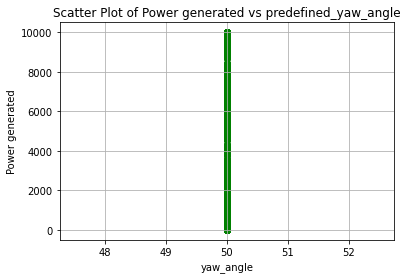

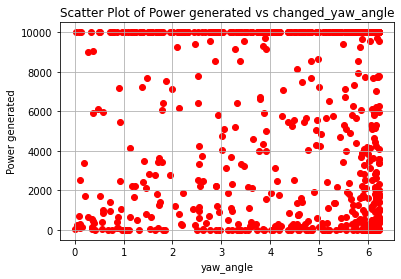

Power_list: [8977.712263667287, 10000.004085737815]
Predefined Yaw Angle 1: 56.16755154077038
Predefined Yaw Angle 2: 56.01312031096868
Changed Yaw Angle 1: 6.16755154077038
Changed Yaw Angle 2: 6.013120310968681
farm_power_baseline : [0. 0.], farm_power_yaw : [35.53543941  0.        ]


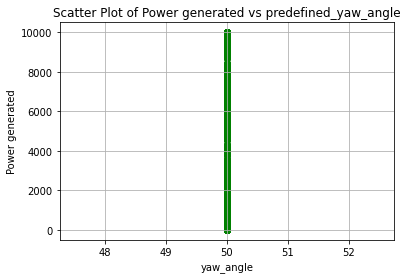

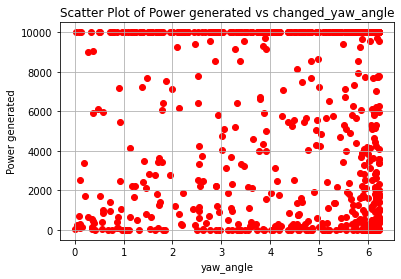

Power_list: [0.0, 36.96679326323577]
Predefined Yaw Angle 1: 56.22427633935685
Predefined Yaw Angle 2: 56.173177890379094
Changed Yaw Angle 1: 6.22427633935685
Changed Yaw Angle 2: 6.1731778903790975
farm_power_baseline : [421.87500969 496.18517621], farm_power_yaw : [1088.67332395 1263.02842796]


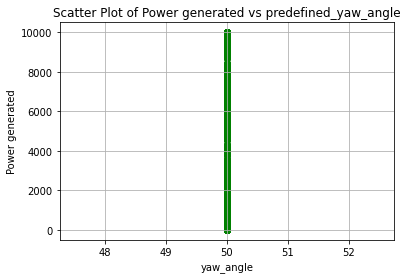

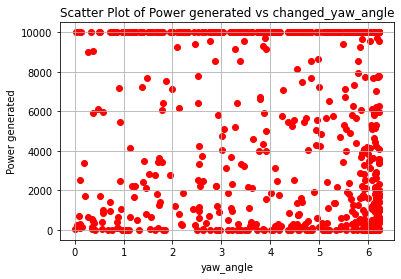

Power_list: [496.1851762140128, 1277.7943700563021]
Predefined Yaw Angle 1: 56.192836657424024
Predefined Yaw Angle 2: 56.063769373844245
Changed Yaw Angle 1: 6.192836657424028
Changed Yaw Angle 2: 6.063769373844244
farm_power_baseline : [  0.         210.78395669], farm_power_yaw : [  0.         628.15514954]


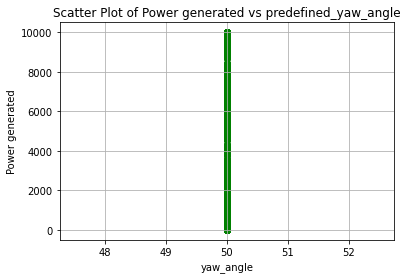

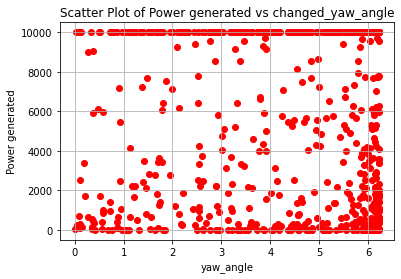

Power_list: [210.78395669079623, 636.25429362297]
Predefined Yaw Angle 1: 56.202127361202876
Predefined Yaw Angle 2: 55.71765963225537
Changed Yaw Angle 1: 6.202127361202879
Changed Yaw Angle 2: 5.7176596322553666
farm_power_baseline : [   0.         9643.84561332], farm_power_yaw : [    0.         10000.00131017]


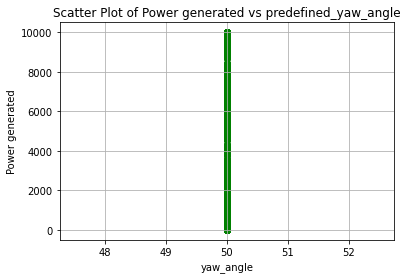

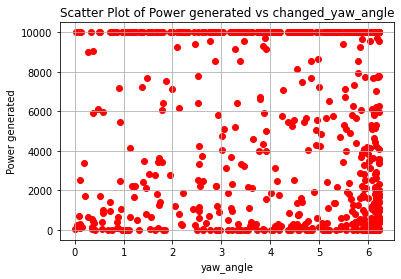

Power_list: [9643.845613322086, 10000.001310173804]
Predefined Yaw Angle 1: 56.1896280809427
Predefined Yaw Angle 2: 56.14488233642922
Changed Yaw Angle 1: 6.1896280809427004
Changed Yaw Angle 2: 6.144882336429223
farm_power_baseline : [9999.99062426    0.        ], farm_power_yaw : [10000.01298503     0.        ]


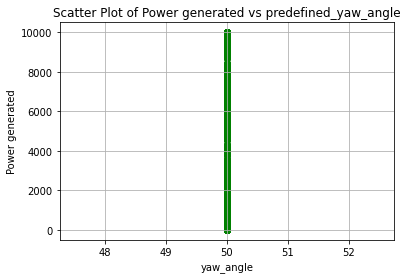

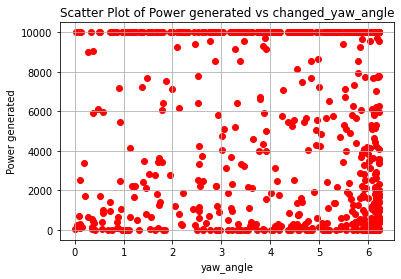

Power_list: [9999.990624256294, 10000.014934984662]
Predefined Yaw Angle 1: 56.22151410867422
Predefined Yaw Angle 2: 56.16774078069759
Changed Yaw Angle 1: 6.22151410867422
Changed Yaw Angle 2: 6.167740780697591
farm_power_baseline : [8367.8682501   817.49915958], farm_power_yaw : [9999.99851959 1974.63027924]


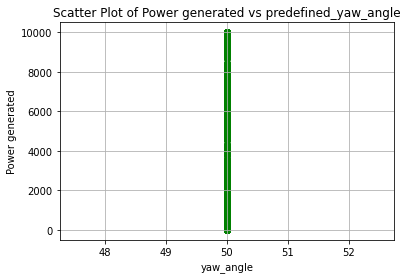

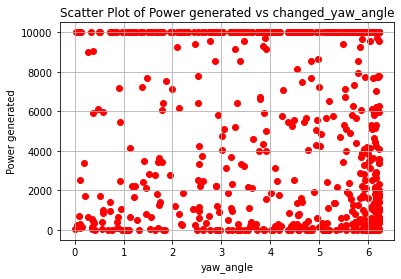

Power_list: [8367.868250101026, 9999.99955541959]
Predefined Yaw Angle 1: 55.928306464243114
Predefined Yaw Angle 2: 56.11710503362748
Changed Yaw Angle 1: 5.928306464243112
Changed Yaw Angle 2: 6.117105033627479
farm_power_baseline : [9999.98921318 1480.53399287], farm_power_yaw : [10000.00984003  3406.82233172]


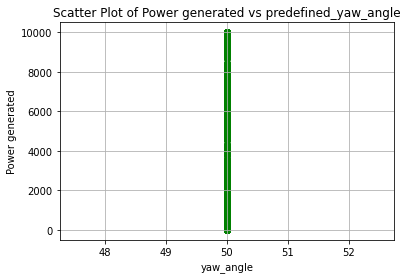

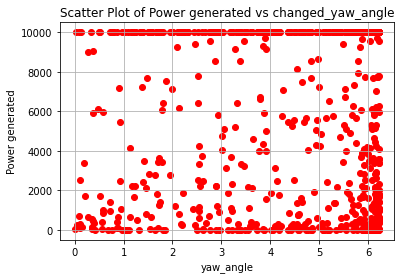

Power_list: [9999.989213184432, 10000.011688833441]
Predefined Yaw Angle 1: 56.11796348127311
Predefined Yaw Angle 2: 56.17128704600514
Changed Yaw Angle 1: 6.1179634812731045
Changed Yaw Angle 2: 6.171287046005141
farm_power_baseline : [2464.55836159    0.        ], farm_power_yaw : [5584.36601035   48.59856838]


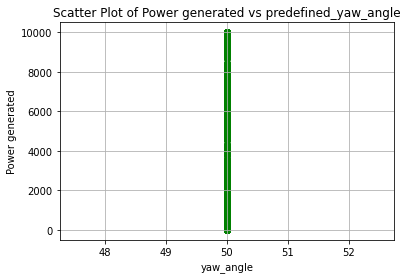

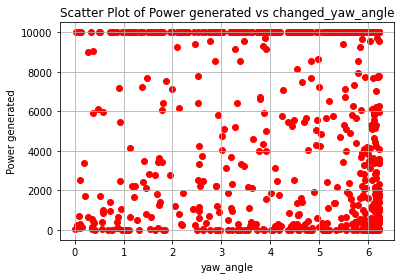

Power_list: [2464.5583615908927, 5642.681558830145]
Predefined Yaw Angle 1: 56.14451679523785
Predefined Yaw Angle 2: 56.015223675597625
Changed Yaw Angle 1: 6.144516795237848
Changed Yaw Angle 2: 6.015223675597626
farm_power_baseline : [0. 0.], farm_power_yaw : [125.39997167   0.        ]


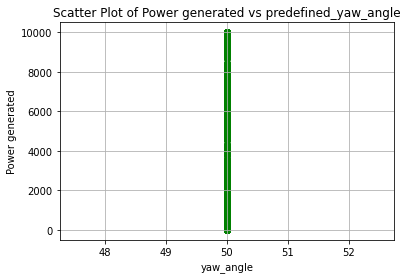

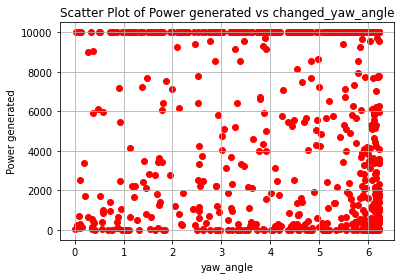

Power_list: [0.0, 128.04605721966368]
Predefined Yaw Angle 1: 56.212984536334915
Predefined Yaw Angle 2: 56.16967902933895
Changed Yaw Angle 1: 6.212984536334914
Changed Yaw Angle 2: 6.169679029338951
farm_power_baseline : [ 9630.02042139 10000.003952  ], farm_power_yaw : [10000.0013972  10000.01384481]


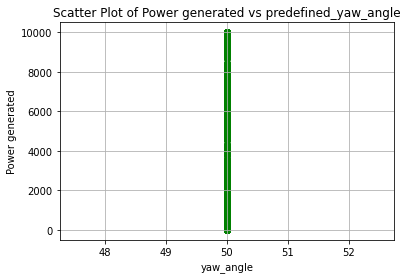

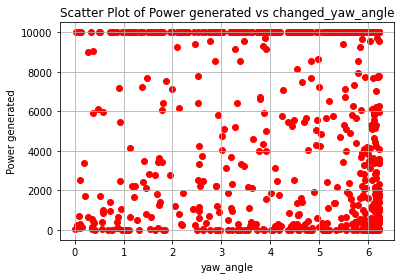

Power_list: [10000.003951997895, 10000.013844807207]
Predefined Yaw Angle 1: 56.222737564879004
Predefined Yaw Angle 2: 56.123244152572326
Changed Yaw Angle 1: 6.222737564879002
Changed Yaw Angle 2: 6.12324415257233
farm_power_baseline : [4083.88808147  362.63255853], farm_power_yaw : [9191.98370358  968.26298179]


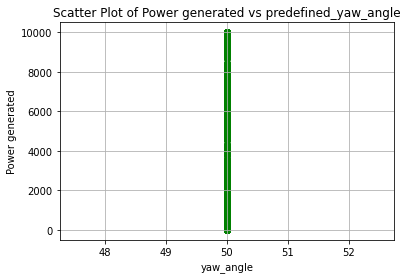

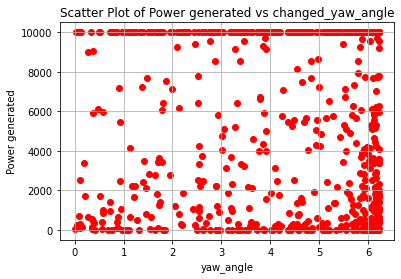

Power_list: [4083.8880814744234, 9289.152274622167]
Predefined Yaw Angle 1: 55.62138513809475
Predefined Yaw Angle 2: 56.08740972220866
Changed Yaw Angle 1: 5.62138513809475
Changed Yaw Angle 2: 6.087409722208659
farm_power_baseline : [610.95909928 298.55189936], farm_power_yaw : [1514.78699909  818.92144472]


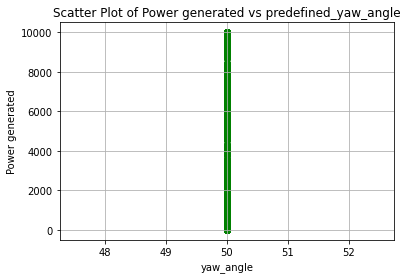

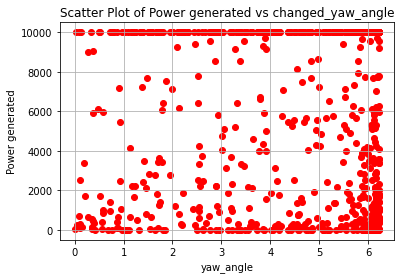

Power_list: [610.9590992799352, 1531.1007564098975]
Predefined Yaw Angle 1: 56.16601276629253
Predefined Yaw Angle 2: 56.157993078475684
Changed Yaw Angle 1: 6.166012766292532
Changed Yaw Angle 2: 6.157993078475684
farm_power_baseline : [9999.98874451   93.54369659], farm_power_yaw : [10000.00867971   363.3246912 ]


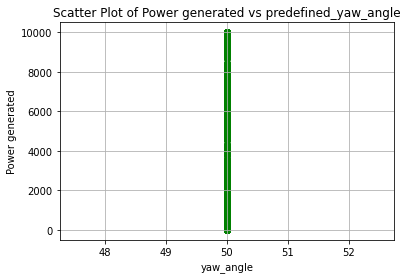

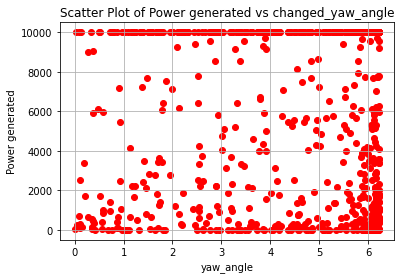

Power_list: [9999.988744507402, 10000.010610648447]
Predefined Yaw Angle 1: 56.224584200778864
Predefined Yaw Angle 2: 56.100406480960466
Changed Yaw Angle 1: 6.224584200778863
Changed Yaw Angle 2: 6.100406480960464
farm_power_baseline : [ 755.51632251 3773.92311687], farm_power_yaw : [1836.17942445 8497.92259081]


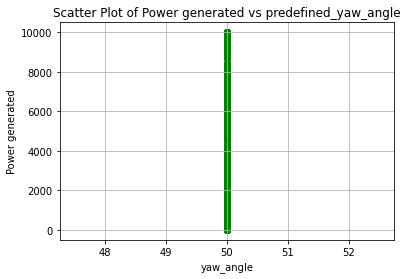

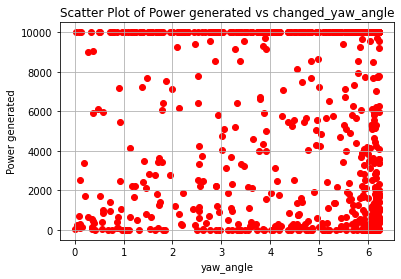

Power_list: [3773.9231168745587, 8586.59481988896]
Predefined Yaw Angle 1: 56.20562409171416
Predefined Yaw Angle 2: 56.09987864243241
Changed Yaw Angle 1: 6.205624091714153
Changed Yaw Angle 2: 6.099878642432411
farm_power_baseline : [5502.93235498 9266.60482133], farm_power_yaw : [ 9999.9961721  10000.00290051]


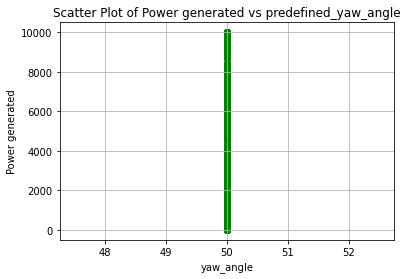

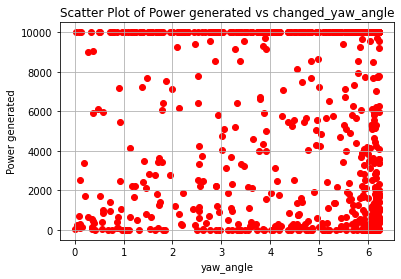

Power_list: [9266.604821331175, 10000.002900513875]
Predefined Yaw Angle 1: 56.09356519726245
Predefined Yaw Angle 2: 55.90144597697839
Changed Yaw Angle 1: 6.0935651972624525
Changed Yaw Angle 2: 5.901445976978389
farm_power_baseline : [6848.75879724 2406.83441348], farm_power_yaw : [10000.00509651  5464.53062824]


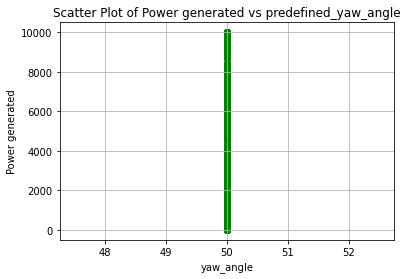

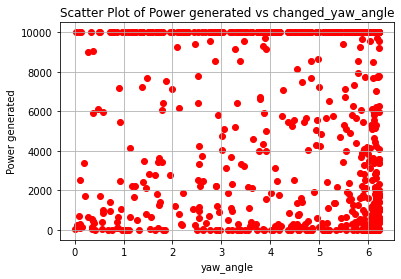

Power_list: [6848.758797235189, 10000.005096513978]
Predefined Yaw Angle 1: 54.45540474332622
Predefined Yaw Angle 2: 55.566098069354524
Changed Yaw Angle 1: 4.45540474332622
Changed Yaw Angle 2: 5.566098069354521
farm_power_baseline : [  29.07737768 4001.33104067], farm_power_yaw : [ 204.57394612 9033.98927716]


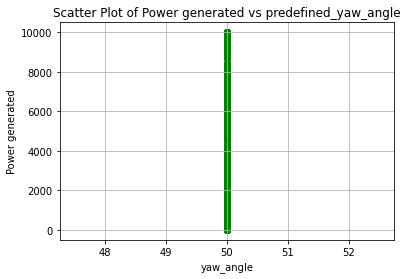

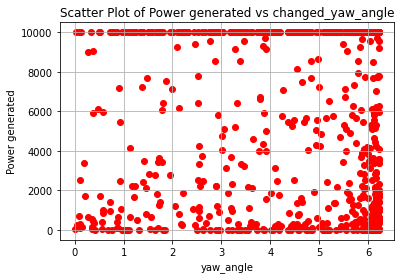

Power_list: [4001.3310406714327, 9098.329875186948]
Predefined Yaw Angle 1: 56.04432760976463
Predefined Yaw Angle 2: 55.6177468829033
Changed Yaw Angle 1: 6.044327609764632
Changed Yaw Angle 2: 5.617746882903299
farm_power_baseline : [7433.30709651 1387.93930336], farm_power_yaw : [10000.00144562  3220.0342417 ]


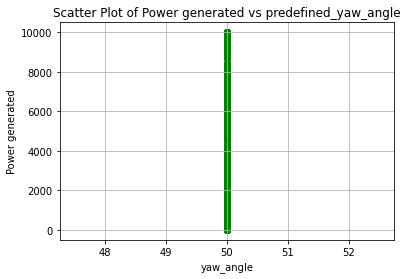

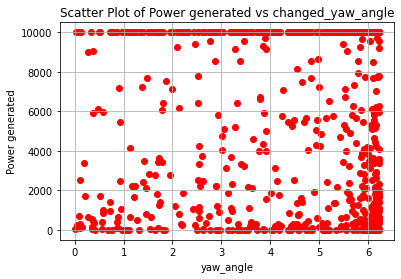

Power_list: [7433.307096512778, 10000.001445623864]
Predefined Yaw Angle 1: 55.53953714304891
Predefined Yaw Angle 2: 55.95380851769931
Changed Yaw Angle 1: 5.539537143048908
Changed Yaw Angle 2: 5.953808517699309
farm_power_baseline : [ 2912.08364143 10000.00384112], farm_power_yaw : [ 6598.95207716 10000.01384192]


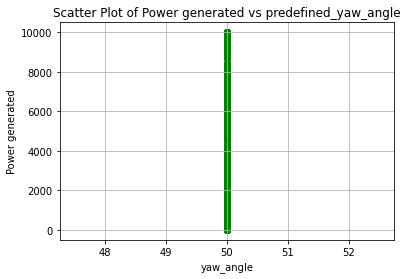

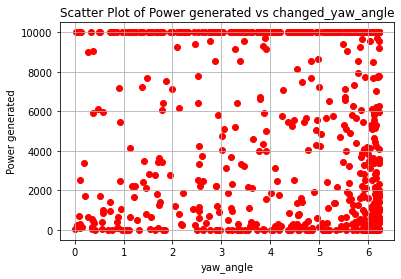

Power_list: [10000.003841116635, 10000.013841917553]
Predefined Yaw Angle 1: 56.16687136942797
Predefined Yaw Angle 2: 56.16408053209538
Changed Yaw Angle 1: 6.166871369427974
Changed Yaw Angle 2: 6.164080532095387
farm_power_baseline : [4422.70667901 9999.99720528], farm_power_yaw : [ 9887.69927055 10000.01464728]


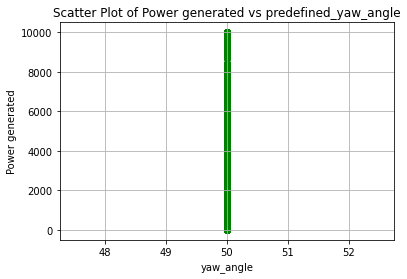

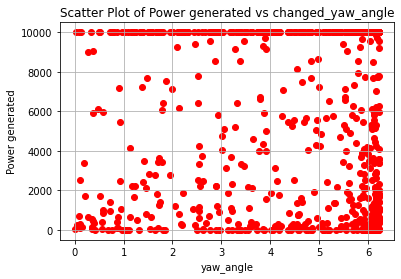

Power_list: [9999.997205279113, 10000.014647280528]
Predefined Yaw Angle 1: 56.01440752754981
Predefined Yaw Angle 2: 55.11276839701462
Changed Yaw Angle 1: 6.0144075275498095
Changed Yaw Angle 2: 5.112768397014617
farm_power_baseline : [ 0.        41.8382405], farm_power_yaw : [123.8906733 238.6874945]


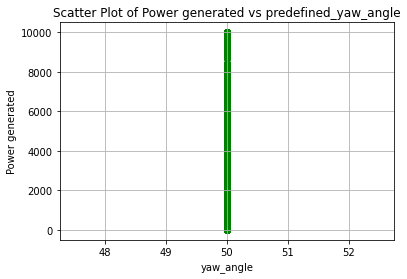

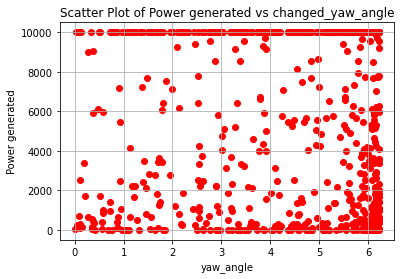

Power_list: [41.83824050455863, 242.00613967795618]
Predefined Yaw Angle 1: 56.054057735123344
Predefined Yaw Angle 2: 56.05346453832229
Changed Yaw Angle 1: 6.054057735123345
Changed Yaw Angle 2: 6.053464538322292
farm_power_baseline : [1020.24184365  494.01046307], farm_power_yaw : [2415.26305247 1258.60788178]


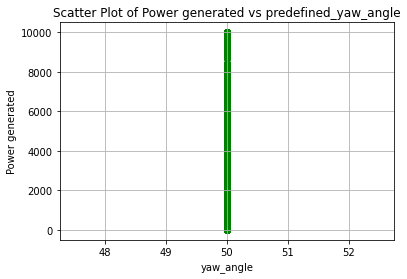

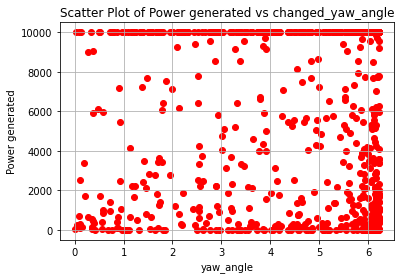

Power_list: [1020.241843650866, 2441.7458912888105]
Predefined Yaw Angle 1: 56.21535048864734
Predefined Yaw Angle 2: 56.138817253362674
Changed Yaw Angle 1: 6.21535048864734
Changed Yaw Angle 2: 6.138817253362677
farm_power_baseline : [10000.00464772     0.        ], farm_power_yaw : [9999.98315931    0.        ]


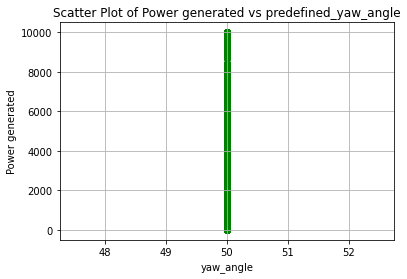

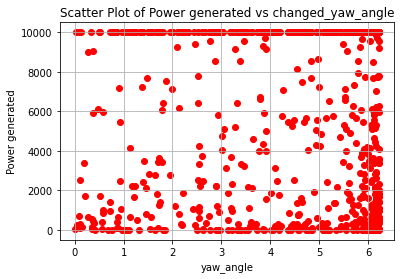

Power_list: [10000.004647721351, 9999.983159306234]
Predefined Yaw Angle 1: 56.20645180218095
Predefined Yaw Angle 2: 56.16477668240434
Changed Yaw Angle 1: 6.20645180218095
Changed Yaw Angle 2: 6.164776682404334
farm_power_baseline : [   0.         2915.43195826], farm_power_yaw : [  71.85793877 6596.52667163]


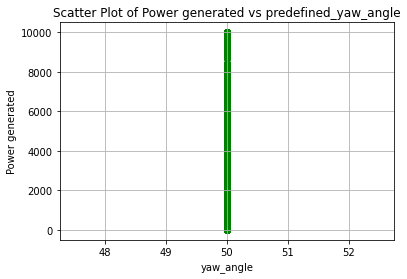

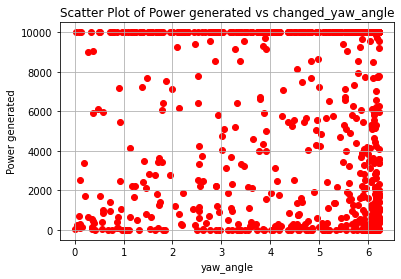

Power_list: [2915.4319582633902, 6665.98713050865]
Predefined Yaw Angle 1: 55.97312480222806
Predefined Yaw Angle 2: 55.92066547793327
Changed Yaw Angle 1: 5.973124802228055
Changed Yaw Angle 2: 5.920665477933272
farm_power_baseline : [  141.27772299 10000.00490931], farm_power_yaw : [ 468.95177263 9999.98941286]


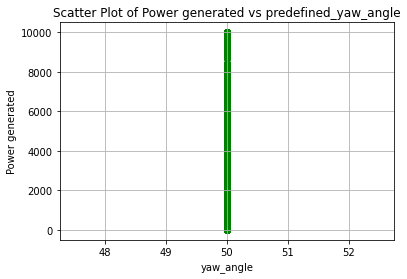

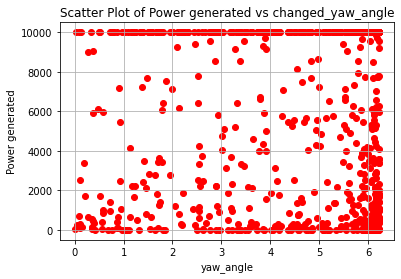

Power_list: [10000.004909305502, 9999.989412862327]
Predefined Yaw Angle 1: 56.16341085790752
Predefined Yaw Angle 2: 56.12146675886081
Changed Yaw Angle 1: 6.163410857907524
Changed Yaw Angle 2: 6.1214667588608105
farm_power_baseline : [1133.62989519 9999.99250799], farm_power_yaw : [ 2659.73135669 10000.0173186 ]


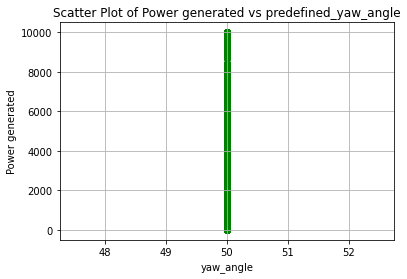

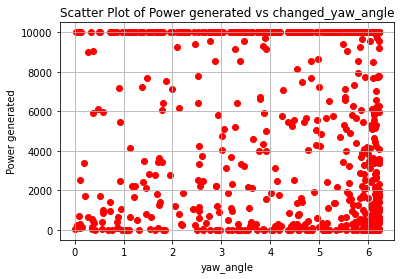

Power_list: [9999.9925079946, 10000.017318602073]
Predefined Yaw Angle 1: 56.186368371768445
Predefined Yaw Angle 2: 56.165508519071885
Changed Yaw Angle 1: 6.1863683717684435
Changed Yaw Angle 2: 6.165508519071887
farm_power_baseline : [6560.02544929 9999.99053911], farm_power_yaw : [10000.00581919 10000.01278439]


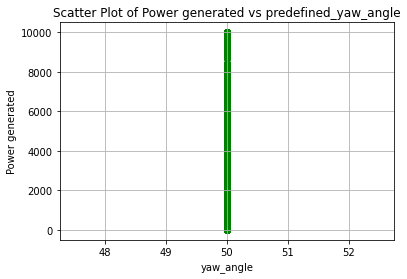

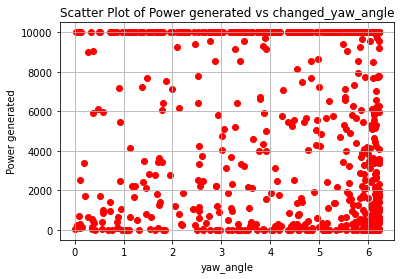

Power_list: [9999.990539110373, 10000.01473910765]
Predefined Yaw Angle 1: 55.56610270755467
Predefined Yaw Angle 2: 55.9781253089806
Changed Yaw Angle 1: 5.566102707554667
Changed Yaw Angle 2: 5.978125308980604
farm_power_baseline : [1124.14197307 4690.77815514], farm_power_yaw : [2643.94714404 9999.99077271]


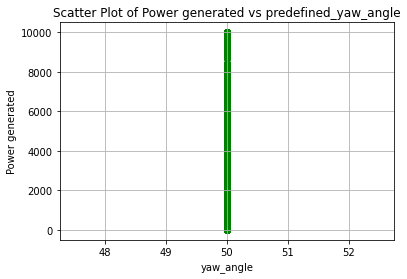

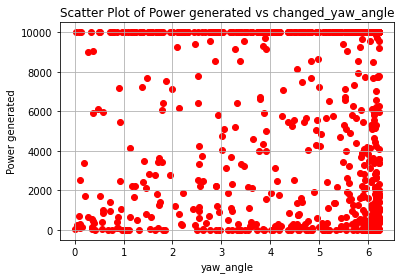

Power_list: [4690.77815513514, 9999.991518972147]
Predefined Yaw Angle 1: 56.225153051987704
Predefined Yaw Angle 2: 55.87819285223647
Changed Yaw Angle 1: 6.225153051987704
Changed Yaw Angle 2: 5.87819285223647
farm_power_baseline : [ 2828.80667493 10000.00032762], farm_power_yaw : [ 6420.50585732 10000.01427135]


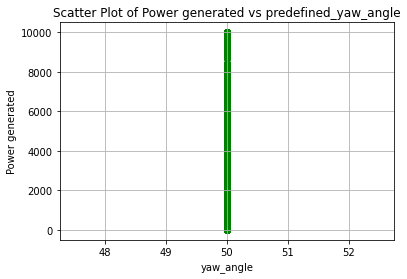

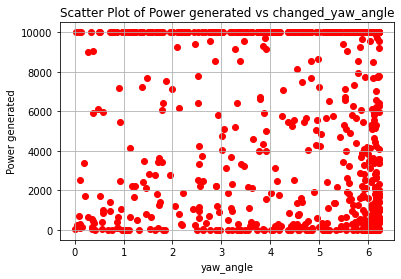

Power_list: [10000.000327621061, 10000.014271345079]
Predefined Yaw Angle 1: 56.22379217667067
Predefined Yaw Angle 2: 56.15168191932442
Changed Yaw Angle 1: 6.223792176670673
Changed Yaw Angle 2: 6.151681919324414
farm_power_baseline : [2179.85627377 6531.04953966], farm_power_yaw : [ 4948.21186403 10000.00589555]


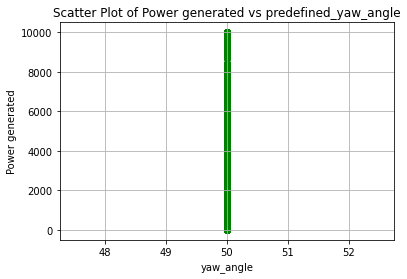

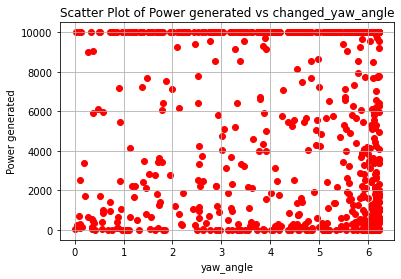

Power_list: [6531.049539661689, 10000.005895552411]
Predefined Yaw Angle 1: 56.215086835699424
Predefined Yaw Angle 2: 56.17129716601728
Changed Yaw Angle 1: 6.215086835699422
Changed Yaw Angle 2: 6.1712971660172835
farm_power_baseline : [4537.68456181  374.36623645], farm_power_yaw : [9999.98803762  991.41368439]


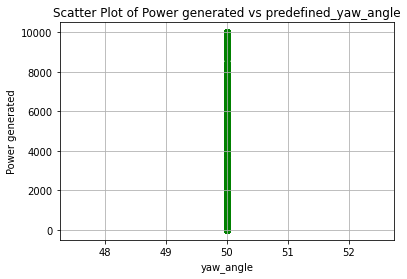

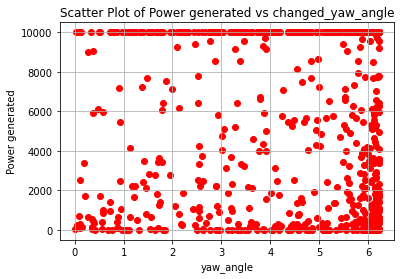

Power_list: [4537.684561809448, 9999.9888860249]
Predefined Yaw Angle 1: 55.954782546536244
Predefined Yaw Angle 2: 56.09870951471387
Changed Yaw Angle 1: 5.954782546536244
Changed Yaw Angle 2: 6.098709514713866
farm_power_baseline : [5957.27822006    0.        ], farm_power_yaw : [9999.99895018    0.        ]


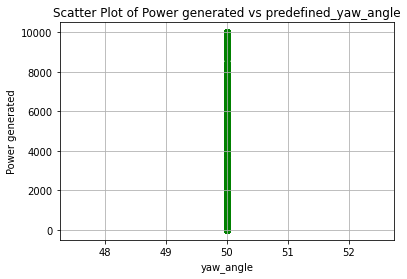

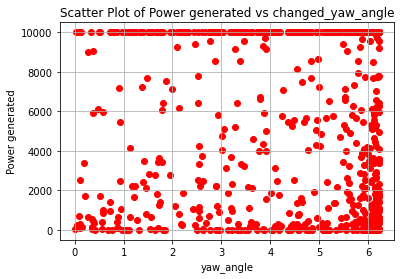

Power_list: [5957.278220057112, 9999.999865191676]
Predefined Yaw Angle 1: 56.16907220575281
Predefined Yaw Angle 2: 55.97379181325483
Changed Yaw Angle 1: 6.169072205752816
Changed Yaw Angle 2: 5.973791813254827
farm_power_baseline : [10000.00431633   675.32452277], farm_power_yaw : [9999.97465501 1656.53585983]


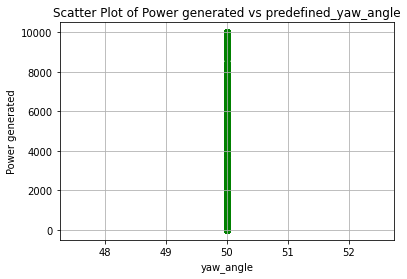

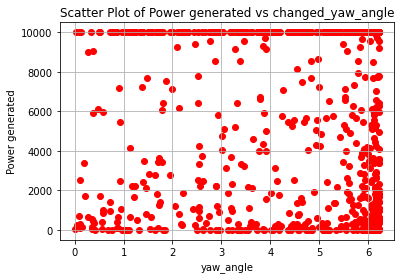

Power_list: [10000.004316332166, 9999.974655006034]
Predefined Yaw Angle 1: 56.1583870708272
Predefined Yaw Angle 2: 56.112531320771375
Changed Yaw Angle 1: 6.1583870708271995
Changed Yaw Angle 2: 6.112531320771377
farm_power_baseline : [9999.9875977  2195.19126521], farm_power_yaw : [10000.00606756  4986.21379696]


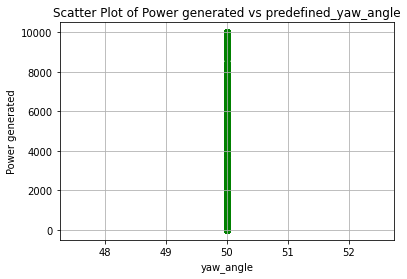

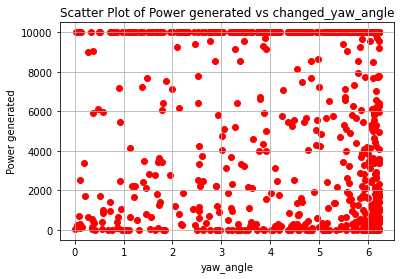

Power_list: [9999.987597701866, 10000.007972438241]
Predefined Yaw Angle 1: 56.15217444863626
Predefined Yaw Angle 2: 56.16706753357402
Changed Yaw Angle 1: 6.152174448636263
Changed Yaw Angle 2: 6.16706753357402
farm_power_baseline : [9999.99600141  104.44813592], farm_power_yaw : [9999.99712796  387.36295144]


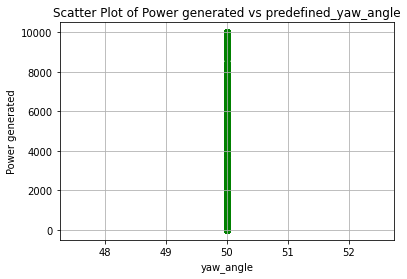

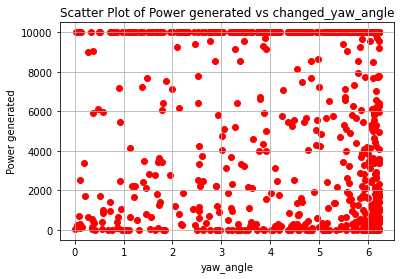

Power_list: [9999.996001407028, 10000.001882170389]
Predefined Yaw Angle 1: 56.227733122451774
Predefined Yaw Angle 2: 56.16091403355928
Changed Yaw Angle 1: 6.227733122451773
Changed Yaw Angle 2: 6.1609140335592825
farm_power_baseline : [2915.42504918    0.        ], farm_power_yaw : [6596.31725719  113.7605576 ]


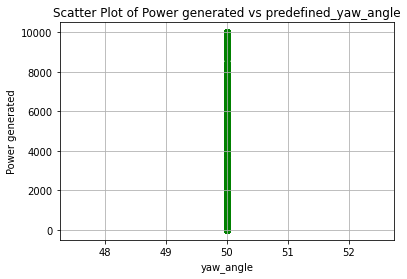

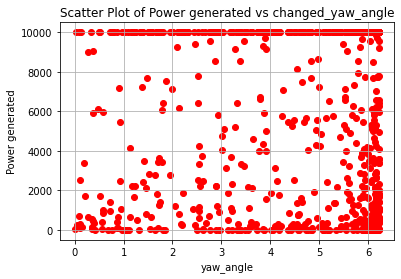

Power_list: [2915.4250491752587, 6665.97149997584]
Predefined Yaw Angle 1: 56.166672164978436
Predefined Yaw Angle 2: 56.12650279648215
Changed Yaw Angle 1: 6.1666721649784355
Changed Yaw Angle 2: 6.126502796482151
farm_power_baseline : [ 8983.35677715 10000.00497775], farm_power_yaw : [10000.00407536 10000.01300872]


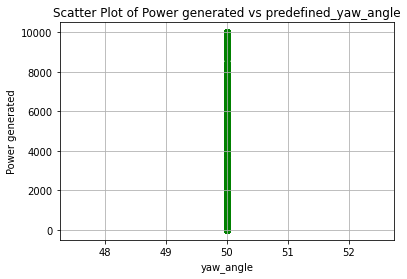

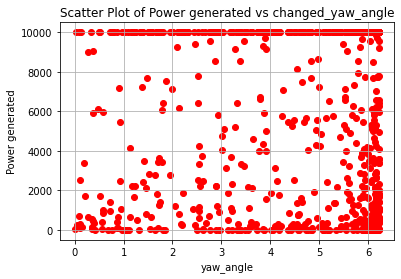

Power_list: [10000.004977746843, 10000.013008724669]
Predefined Yaw Angle 1: 56.20775621848287
Predefined Yaw Angle 2: 55.97585895889294
Changed Yaw Angle 1: 6.20775621848287
Changed Yaw Angle 2: 5.975858958892946
farm_power_baseline : [3889.29116356    0.        ], farm_power_yaw : [8749.92911108  107.56977542]


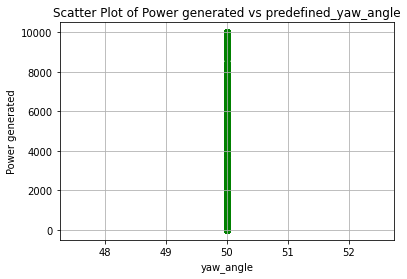

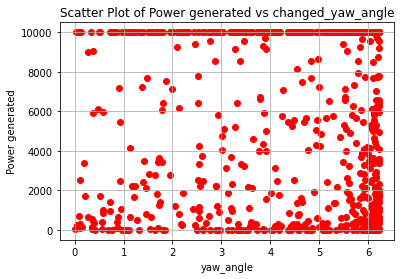

Power_list: [3889.2911635602954, 8839.360828152016]
Predefined Yaw Angle 1: 56.17865692251601
Predefined Yaw Angle 2: 56.15775552450645
Changed Yaw Angle 1: 6.17865692251601
Changed Yaw Angle 2: 6.157755524506449
farm_power_baseline : [  572.53575904 10000.00591161], farm_power_yaw : [ 1427.68969621 10000.00655243]


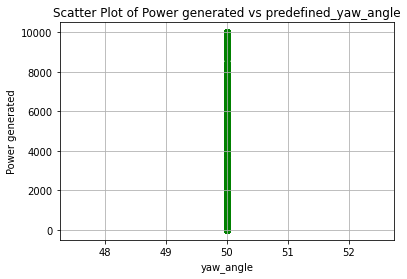

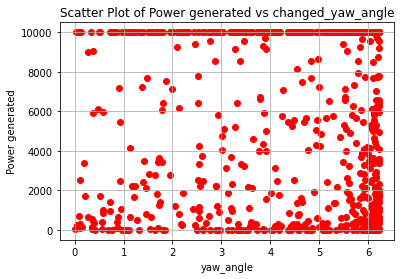

Power_list: [10000.005911606097, 10000.006552427181]
Predefined Yaw Angle 1: 56.214527571870505
Predefined Yaw Angle 2: 56.1719363246789
Changed Yaw Angle 1: 6.214527571870506
Changed Yaw Angle 2: 6.171936324678902
farm_power_baseline : [3097.67556677 8947.73362539], farm_power_yaw : [ 7001.48048302 10000.00422926]


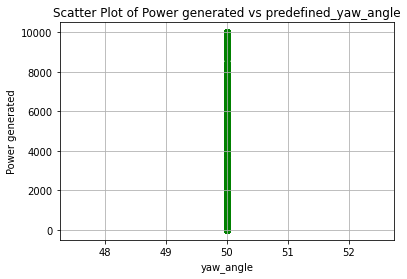

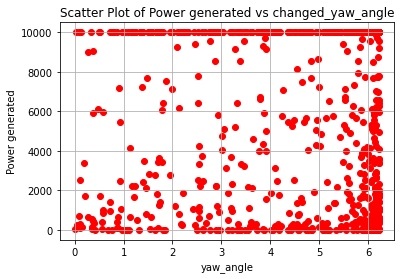

Power_list: [8947.733625389992, 10000.004229255395]
Predefined Yaw Angle 1: 56.168873533935496
Predefined Yaw Angle 2: 56.17325938310845
Changed Yaw Angle 1: 6.168873533935495
Changed Yaw Angle 2: 6.173259383108454
farm_power_baseline : [ 6663.36468552 10000.00589835], farm_power_yaw : [10000.00555013 10000.00633385]


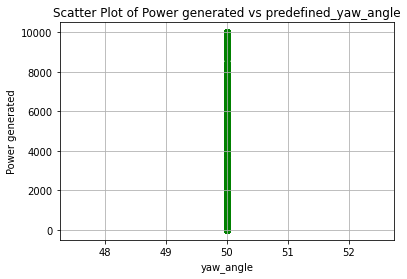

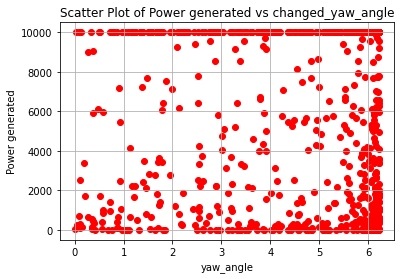

Power_list: [10000.005898349451, 10000.006333847381]
Predefined Yaw Angle 1: 54.77896922839092
Predefined Yaw Angle 2: 55.252071429417825
Changed Yaw Angle 1: 4.778969228390923
Changed Yaw Angle 2: 5.2520714294178275
farm_power_baseline : [9298.64022754 5590.2814698 ], farm_power_yaw : [10000.00263315  9999.99595856]


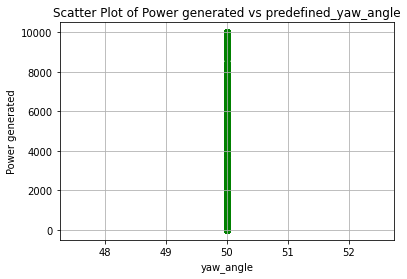

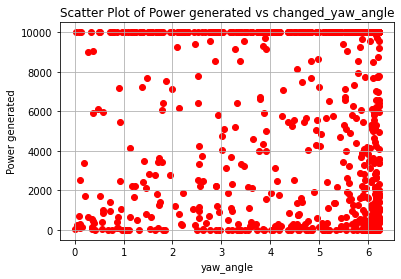

Power_list: [9298.640227535212, 10000.002633146963]
Predefined Yaw Angle 1: 55.725278248012046
Predefined Yaw Angle 2: 56.03231104978379
Changed Yaw Angle 1: 5.7252782480120485
Changed Yaw Angle 2: 6.032311049783792
farm_power_baseline : [9741.58075089 1794.27557075], farm_power_yaw : [10000.00089367  4100.98610403]


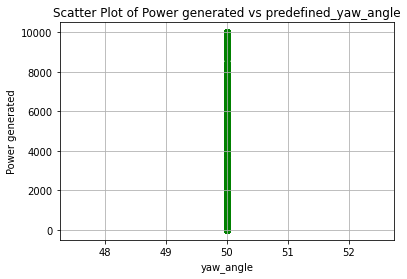

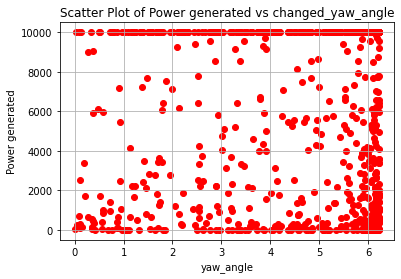

Power_list: [9741.58075089374, 10000.001651892639]
Predefined Yaw Angle 1: 56.130620420669814
Predefined Yaw Angle 2: 56.11001356827681
Changed Yaw Angle 1: 6.130620420669815
Changed Yaw Angle 2: 6.110013568276816
farm_power_baseline : [2201.25254786  627.50671774], farm_power_yaw : [5001.13299731 1550.05006481]


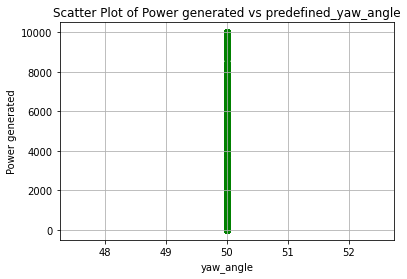

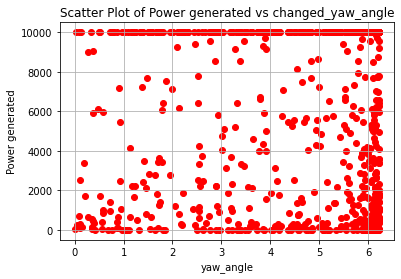

Power_list: [2201.2525478625366, 5056.892480987504]
Predefined Yaw Angle 1: 56.12499955287309
Predefined Yaw Angle 2: 56.16899353167437
Changed Yaw Angle 1: 6.124999552873094
Changed Yaw Angle 2: 6.1689935316743645
farm_power_baseline : [10000.00523623  9999.99581218], farm_power_yaw : [ 9999.99525593 10000.00953324]


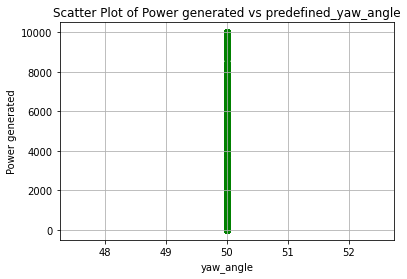

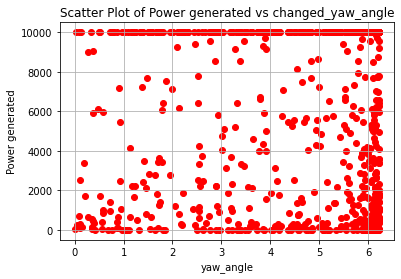

Power_list: [10000.005236234454, 10000.014312871159]
Predefined Yaw Angle 1: 56.21064201984008
Predefined Yaw Angle 2: 56.131873859768625
Changed Yaw Angle 1: 6.21064201984008
Changed Yaw Angle 2: 6.131873859768622
farm_power_baseline : [2775.24424234 7967.11196612], farm_power_yaw : [6296.53553924 9999.99524371]


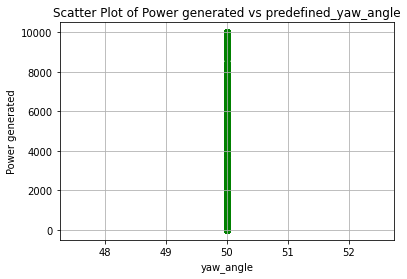

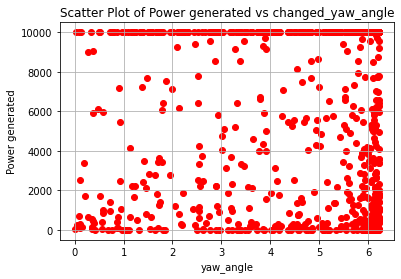

Power_list: [7967.111966117409, 9999.995243713449]
Predefined Yaw Angle 1: 55.982858123380076
Predefined Yaw Angle 2: 56.14500111341384
Changed Yaw Angle 1: 5.982858123380077
Changed Yaw Angle 2: 6.145001113413841
farm_power_baseline : [1916.38634996 5084.63303996], farm_power_yaw : [4370.85141745 9999.9970045 ]


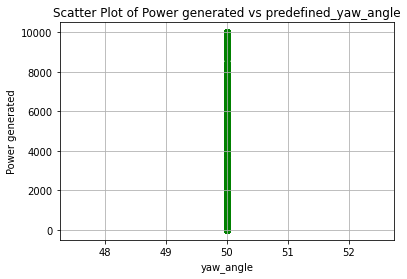

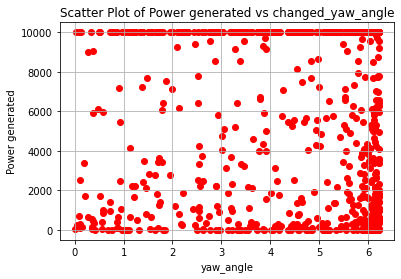

Power_list: [5084.633039964128, 9999.997004499166]
Predefined Yaw Angle 1: 56.19910786915895
Predefined Yaw Angle 2: 56.17141327984081
Changed Yaw Angle 1: 6.199107869158947
Changed Yaw Angle 2: 6.171413279840811
farm_power_baseline : [2069.28347931    0.        ], farm_power_yaw : [4699.88394772  109.70021087]


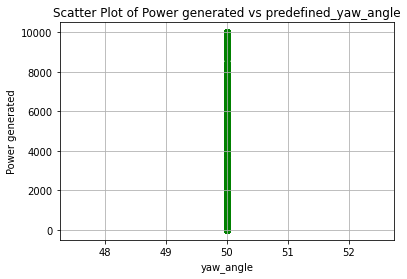

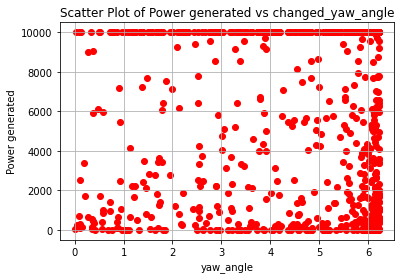

Power_list: [2069.2834793137063, 4749.863113775824]
Predefined Yaw Angle 1: 56.1552621176041
Predefined Yaw Angle 2: 55.94434737161069
Changed Yaw Angle 1: 6.1552621176041
Changed Yaw Angle 2: 5.944347371610693
farm_power_baseline : [10000.00252381  9255.60961835], farm_power_yaw : [10000.01400965 10000.00293291]


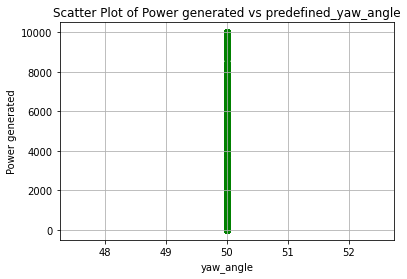

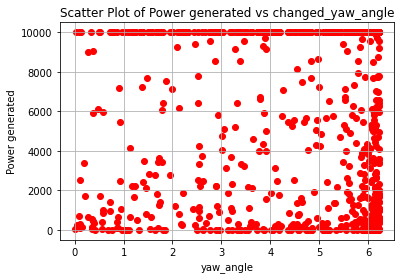

Power_list: [10000.002523806574, 10000.01400964569]
Predefined Yaw Angle 1: 56.12346290892412
Predefined Yaw Angle 2: 56.100141230115895
Changed Yaw Angle 1: 6.123462908924118
Changed Yaw Angle 2: 6.100141230115892
farm_power_baseline : [9139.3326406  1154.55846613], farm_power_yaw : [10000.00342344  2702.00599157]


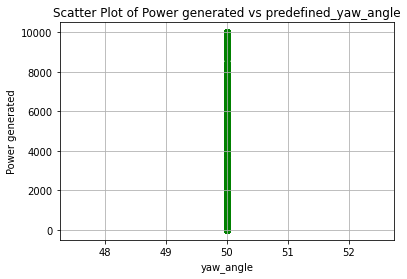

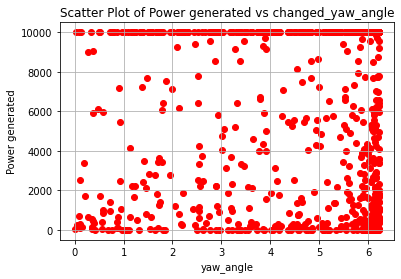

Power_list: [9139.332640601004, 10000.003423443712]
Predefined Yaw Angle 1: 56.220550576991826
Predefined Yaw Angle 2: 56.17055680723424
Changed Yaw Angle 1: 6.220550576991829
Changed Yaw Angle 2: 6.170556807234242
farm_power_baseline : [10000.00137364  6634.42133133], farm_power_yaw : [10000.01415201 10000.00562602]


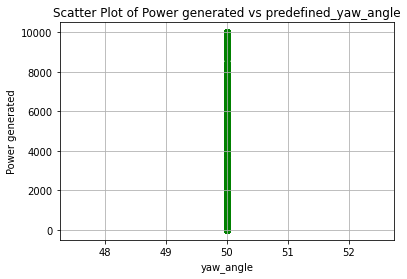

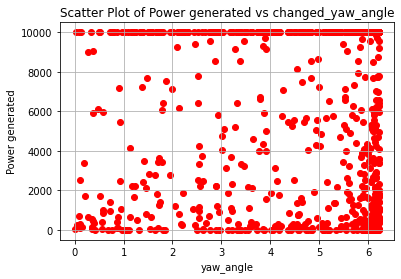

Power_list: [10000.001373641846, 10000.014152007272]
Predefined Yaw Angle 1: 56.08643911081762
Predefined Yaw Angle 2: 56.02433221915791
Changed Yaw Angle 1: 6.086439110817619
Changed Yaw Angle 2: 6.024332219157914
farm_power_baseline : [83.14790454  0.        ], farm_power_yaw : [340.73394599   0.        ]


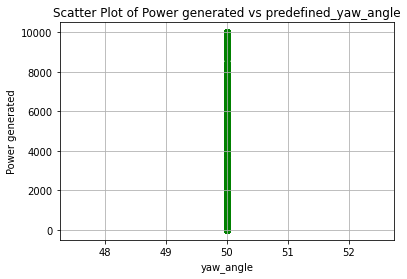

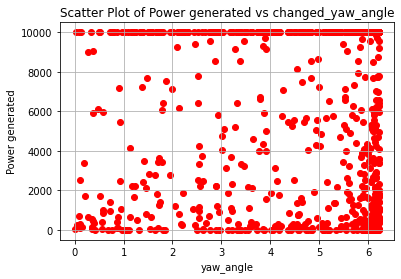

Power_list: [83.14790454389103, 346.0638544954589]
Predefined Yaw Angle 1: 55.6937373659578
Predefined Yaw Angle 2: 55.80113535135946
Changed Yaw Angle 1: 5.693737365957804
Changed Yaw Angle 2: 5.801135351359464
farm_power_baseline : [261.02387052 883.5846607 ], farm_power_yaw : [ 733.43378235 2116.02196288]


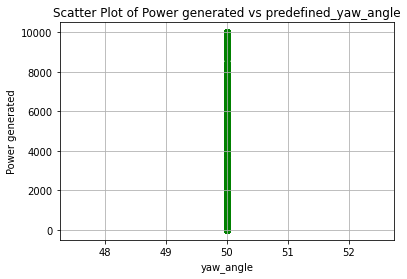

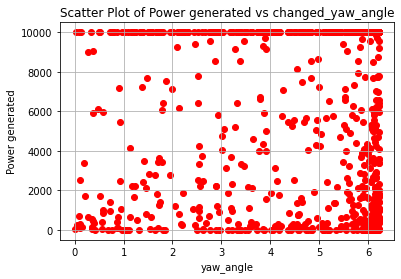

Power_list: [883.5846607009696, 2136.0999603892456]
Predefined Yaw Angle 1: 54.72723253052617
Predefined Yaw Angle 2: 55.29996518582959
Changed Yaw Angle 1: 4.727232530526171
Changed Yaw Angle 2: 5.299965185829595
farm_power_baseline : [    0.         10000.00523348], farm_power_yaw : [   0.         9999.99421456]


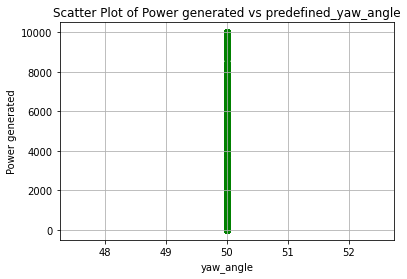

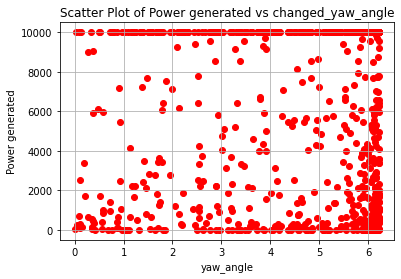

Power_list: [10000.00523348389, 9999.994214563993]
Predefined Yaw Angle 1: 56.132537896654675
Predefined Yaw Angle 2: 56.16876769561392
Changed Yaw Angle 1: 6.132537896654672
Changed Yaw Angle 2: 6.168767695613926
farm_power_baseline : [   0.         2233.39693305], farm_power_yaw : [  47.26510645 5078.22857399]


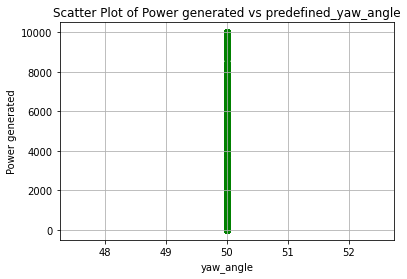

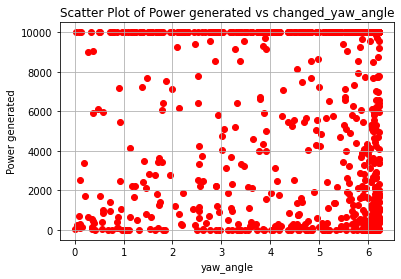

Power_list: [2233.3969330531477, 5134.824004248738]
Predefined Yaw Angle 1: 56.178937087062685
Predefined Yaw Angle 2: 56.17350492656096
Changed Yaw Angle 1: 6.178937087062686
Changed Yaw Angle 2: 6.173504926560959
farm_power_baseline : [10000.00102854  3104.85929115], farm_power_yaw : [10000.01419238  7018.09539859]


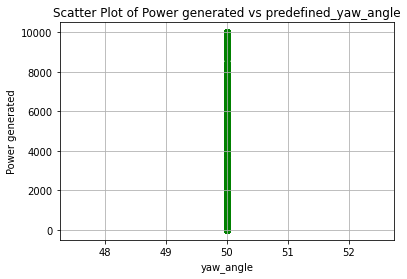

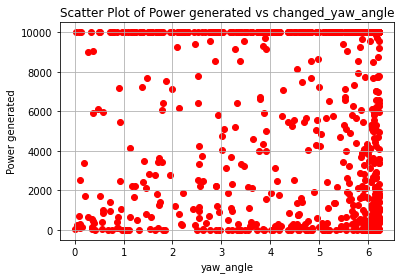

Power_list: [10000.001028541526, 10000.014192377834]
Predefined Yaw Angle 1: 56.13642824237506
Predefined Yaw Angle 2: 56.17351770973419
Changed Yaw Angle 1: 6.13642824237506
Changed Yaw Angle 2: 6.173517709734192
farm_power_baseline : [   0.         9999.99552883], farm_power_yaw : [    0.         10000.00291693]


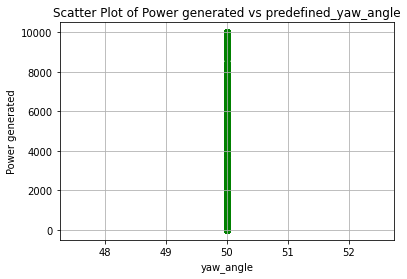

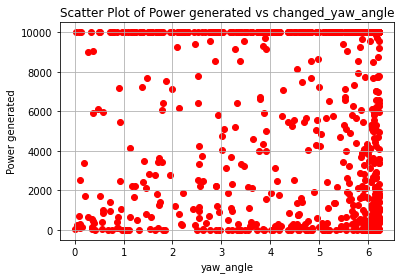

Power_list: [9999.99552883135, 10000.002916934594]
Predefined Yaw Angle 1: 56.148930718428545
Predefined Yaw Angle 2: 56.173050591278994
Changed Yaw Angle 1: 6.148930718428546
Changed Yaw Angle 2: 6.173050591278992
farm_power_baseline : [9999.99690121  164.22304259], farm_power_yaw : [9999.98965717  519.10648746]


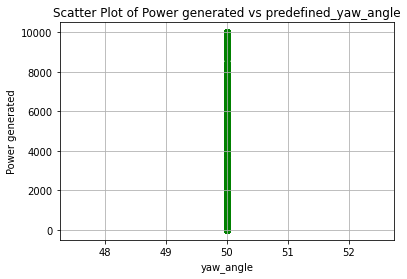

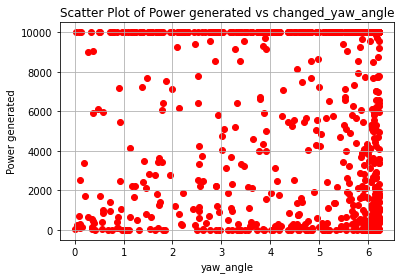

Power_list: [9999.99690120514, 9999.989657173595]
Predefined Yaw Angle 1: 56.023704622915275
Predefined Yaw Angle 2: 56.173397867485136
Changed Yaw Angle 1: 6.023704622915276
Changed Yaw Angle 2: 6.1733978674851375
farm_power_baseline : [  28.27349942 5529.89530686], farm_power_yaw : [ 201.17298729 9999.9961162 ]


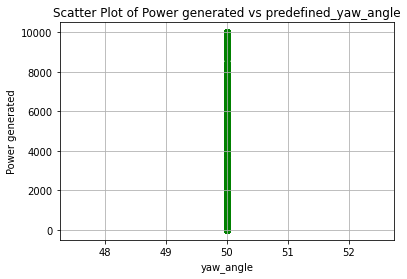

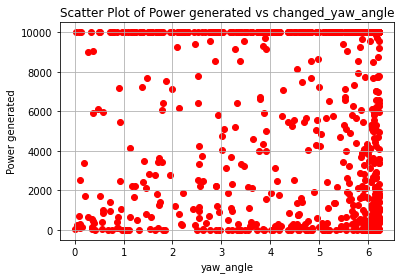

Power_list: [5529.895306862253, 9999.99611620015]
Predefined Yaw Angle 1: 56.174317035203615
Predefined Yaw Angle 2: 56.16881989357129
Changed Yaw Angle 1: 6.174317035203617
Changed Yaw Angle 2: 6.168819893571292
farm_power_baseline : [7483.14860313 9999.99692698], farm_power_yaw : [10000.0009319   9999.99081108]


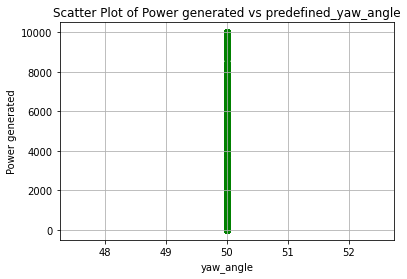

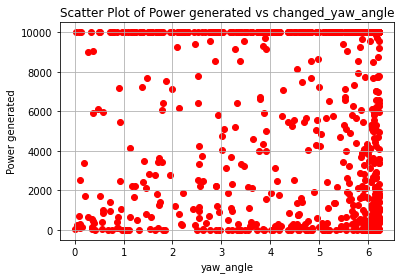

Power_list: [9999.996926982296, 10000.000931897855]
Predefined Yaw Angle 1: 56.2241980424208
Predefined Yaw Angle 2: 56.17352303605637
Changed Yaw Angle 1: 6.224198042420801
Changed Yaw Angle 2: 6.1735230360563715
farm_power_baseline : [  22.46135826 4066.14209303], farm_power_yaw : [ 186.21349244 9150.30457301]


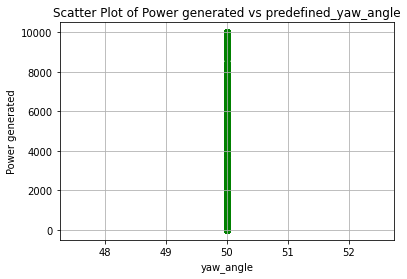

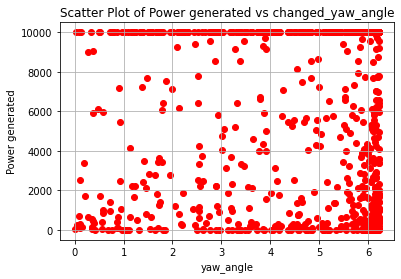

Power_list: [4066.142093026728, 9248.134185032208]
Predefined Yaw Angle 1: 56.17243471294515
Predefined Yaw Angle 2: 56.17352303605637
Changed Yaw Angle 1: 6.172434712945149
Changed Yaw Angle 2: 6.1735230360563715
farm_power_baseline : [9999.99646467  945.4981719 ], farm_power_yaw : [9999.9782988  2242.36939994]


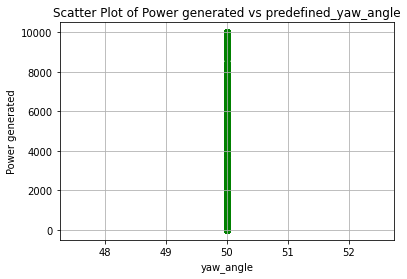

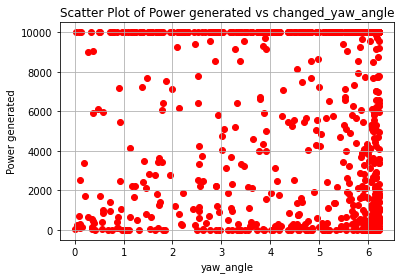

Power_list: [9999.996464665006, 9999.983004982143]
Predefined Yaw Angle 1: 56.101651086964154
Predefined Yaw Angle 2: 56.16206664967907
Changed Yaw Angle 1: 6.101651086964151
Changed Yaw Angle 2: 6.162066649679069
farm_power_baseline : [9415.95332146 2614.06060156], farm_power_yaw : [10000.00227786  5920.70632086]


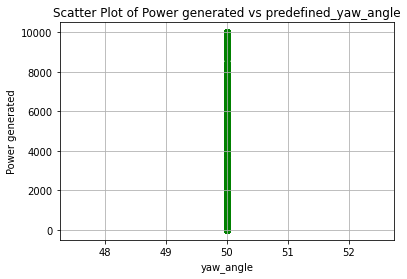

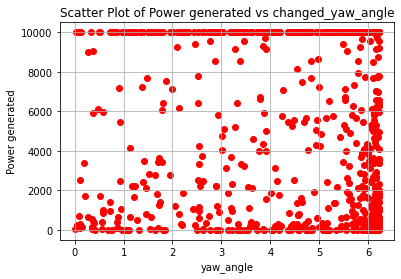

Power_list: [9415.953321462199, 10000.002277860018]
Predefined Yaw Angle 1: 56.219215268021266
Predefined Yaw Angle 2: 56.17352303605637
Changed Yaw Angle 1: 6.219215268021263
Changed Yaw Angle 2: 6.1735230360563715
farm_power_baseline : [1478.38276219    0.        ], farm_power_yaw : [3400.70087573  125.15097744]


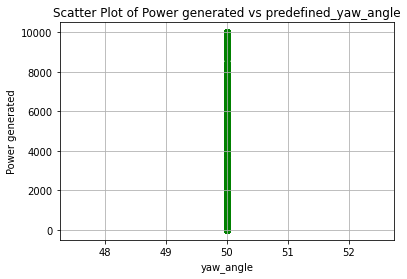

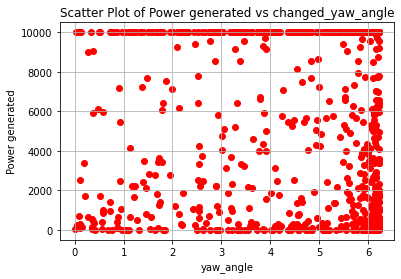

Power_list: [1478.3827621906282, 3438.8567921065533]
Predefined Yaw Angle 1: 56.04704030565099
Predefined Yaw Angle 2: 56.17306976603884
Changed Yaw Angle 1: 6.047040305650986
Changed Yaw Angle 2: 6.17306976603884
farm_power_baseline : [7455.01962684 3337.77069745], farm_power_yaw : [10000.00126043  7544.75754414]


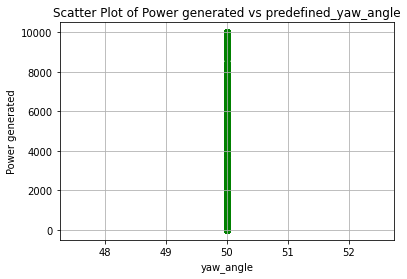

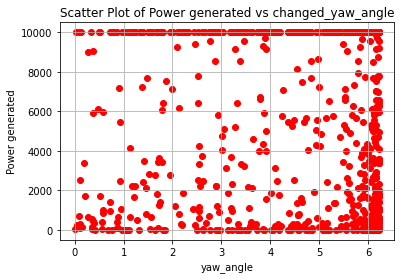

Power_list: [7455.0196268410355, 10000.001260430194]
Predefined Yaw Angle 1: 56.193490729787754
Predefined Yaw Angle 2: 56.1735150465731
Changed Yaw Angle 1: 6.193490729787752
Changed Yaw Angle 2: 6.173515046573101
farm_power_baseline : [1801.99757793 8339.9838164 ], farm_power_yaw : [4115.62466793 9999.99819922]


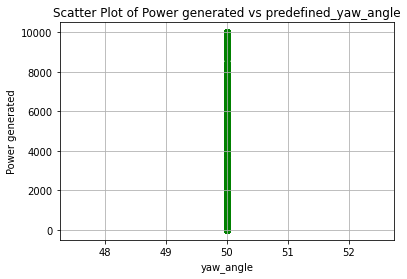

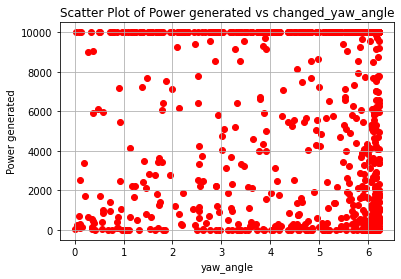

Power_list: [8339.98381639824, 9999.999230121663]
Predefined Yaw Angle 1: 56.17298492202636
Predefined Yaw Angle 2: 56.17352303605637
Changed Yaw Angle 1: 6.17298492202636
Changed Yaw Angle 2: 6.1735230360563715
farm_power_baseline : [ 784.48466511 9270.10665344], farm_power_yaw : [ 1905.77174293 10000.00288863]


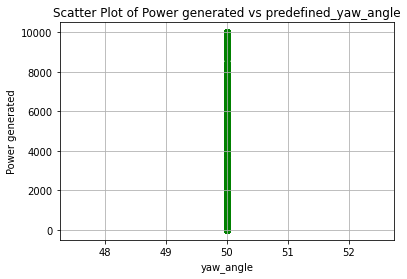

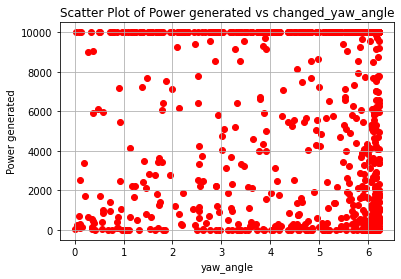

Power_list: [9270.106653440365, 10000.00288863196]
Predefined Yaw Angle 1: 56.221551392929484
Predefined Yaw Angle 2: 56.17352303605637
Changed Yaw Angle 1: 6.221551392929481
Changed Yaw Angle 2: 6.1735230360563715
farm_power_baseline : [   0.         1227.84845884], farm_power_yaw : [  20.25178955 2852.63664083]


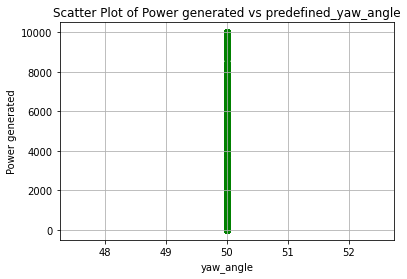

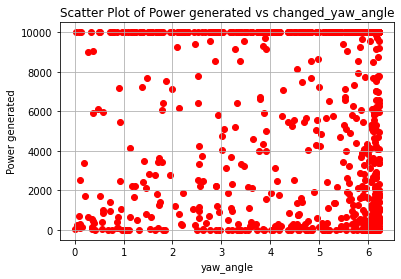

Power_list: [1227.84845884448, 2885.8544353138573]
Predefined Yaw Angle 1: 56.080919975774535
Predefined Yaw Angle 2: 56.17352303605637
Changed Yaw Angle 1: 6.080919975774538
Changed Yaw Angle 2: 6.1735230360563715
farm_power_baseline : [5560.12784029 1280.23537704], farm_power_yaw : [9999.99605687 2972.33439011]


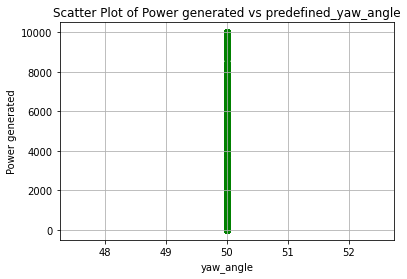

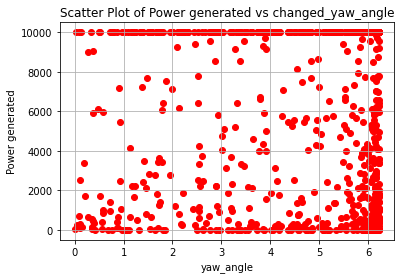

Power_list: [5560.1278402932585, 9999.996056870237]
Predefined Yaw Angle 1: 56.21557738997222
Predefined Yaw Angle 2: 56.17352143815972
Changed Yaw Angle 1: 6.215577389972215
Changed Yaw Angle 2: 6.173521438159717
farm_power_baseline : [5369.30362023    0.        ], farm_power_yaw : [9999.99644061    0.        ]


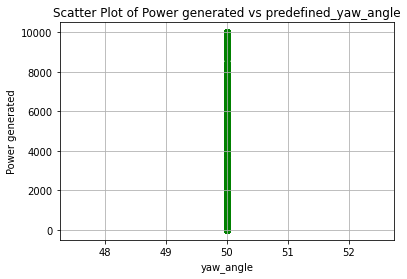

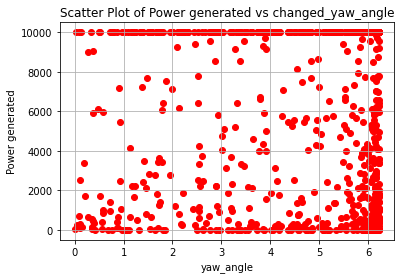

Power_list: [5369.303620227549, 9999.996440611245]
Predefined Yaw Angle 1: 56.00962342496759
Predefined Yaw Angle 2: 56.17352250342415
Changed Yaw Angle 1: 6.009623424967591
Changed Yaw Angle 2: 6.173522503424153
farm_power_baseline : [7823.53170603    0.        ], farm_power_yaw : [9999.99684396    0.        ]


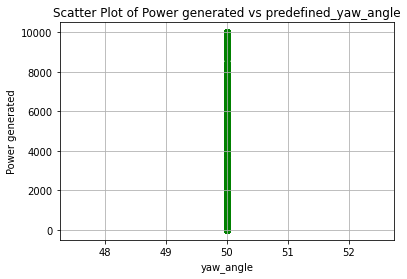

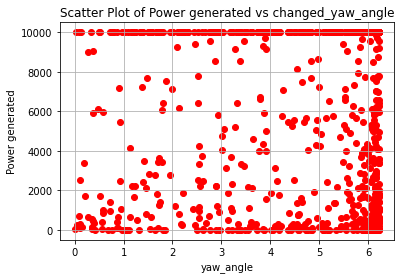

Power_list: [7823.531706028608, 9999.996843960187]
Predefined Yaw Angle 1: 55.831497895457645
Predefined Yaw Angle 2: 56.17352303605637
Changed Yaw Angle 1: 5.831497895457641
Changed Yaw Angle 2: 6.1735230360563715
farm_power_baseline : [1796.30709396 2102.27842962], farm_power_yaw : [4104.19547509 4774.18285746]


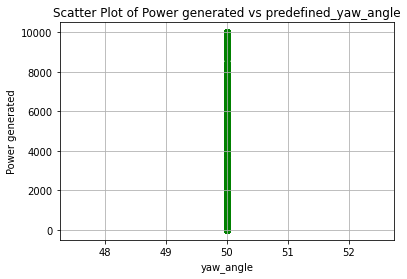

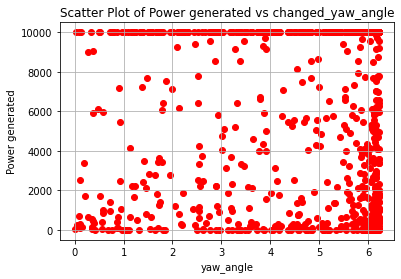

Power_list: [2102.2784296216314, 4821.5366537088985]
Predefined Yaw Angle 1: 56.20405016350992
Predefined Yaw Angle 2: 56.17352303605637
Changed Yaw Angle 1: 6.2040501635099154
Changed Yaw Angle 2: 6.1735230360563715
farm_power_baseline : [   0.         2710.79200274], farm_power_yaw : [   0.         6145.53886144]


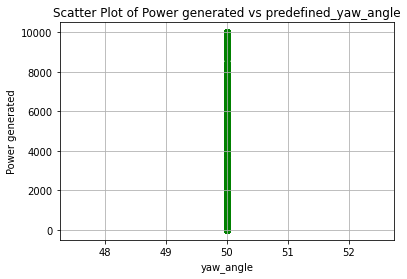

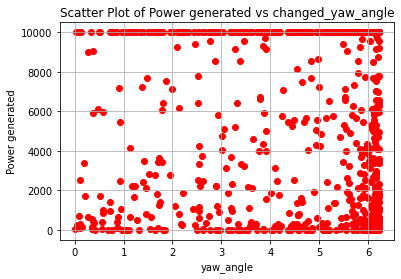

Power_list: [2710.792002738963, 6212.762125805179]
Predefined Yaw Angle 1: 56.21008968023
Predefined Yaw Angle 2: 56.17352303605637
Changed Yaw Angle 1: 6.210089680229998
Changed Yaw Angle 2: 6.1735230360563715
farm_power_baseline : [110.77291278 320.65539516], farm_power_yaw : [401.24147748 873.75203867]


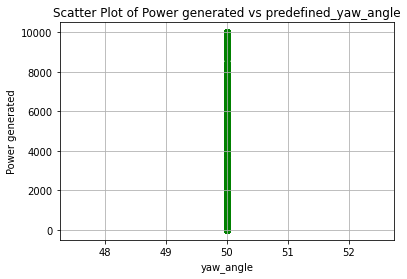

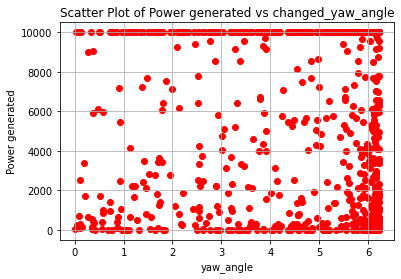

Power_list: [320.6553951616346, 884.8625440808129]
Predefined Yaw Angle 1: 56.2107757105268
Predefined Yaw Angle 2: 56.17352303605637
Changed Yaw Angle 1: 6.210775710526802
Changed Yaw Angle 2: 6.1735230360563715
farm_power_baseline : [0. 0.], farm_power_yaw : [0. 0.]


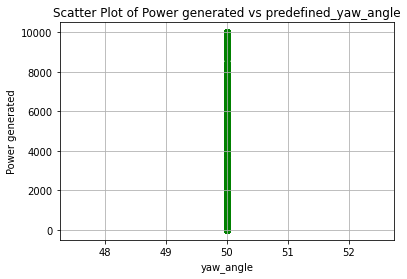

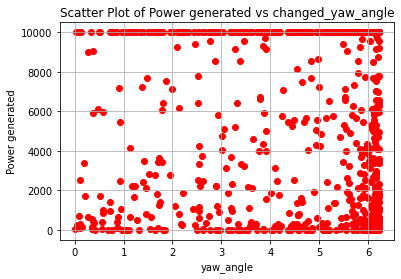

Power_list: [0.0, 0.0]
Predefined Yaw Angle 1: 56.21550548462278
Predefined Yaw Angle 2: 56.17352303605637
Changed Yaw Angle 1: 6.215505484622783
Changed Yaw Angle 2: 6.1735230360563715
farm_power_baseline : [9999.98937537 3005.05751312], farm_power_yaw : [10000.01010523  6792.68500392]


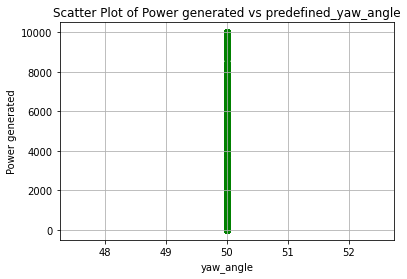

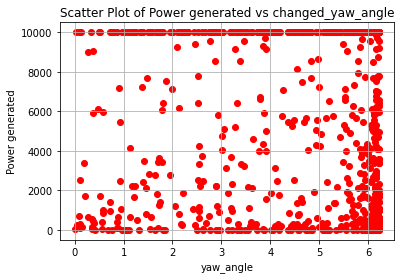

Power_list: [9999.989375367826, 10000.012061934087]
Predefined Yaw Angle 1: 56.189111960323444
Predefined Yaw Angle 2: 56.17352303605637
Changed Yaw Angle 1: 6.1891119603234435
Changed Yaw Angle 2: 6.1735230360563715
farm_power_baseline : [   0.         6341.72569836], farm_power_yaw : [    0.        10000.0044775]


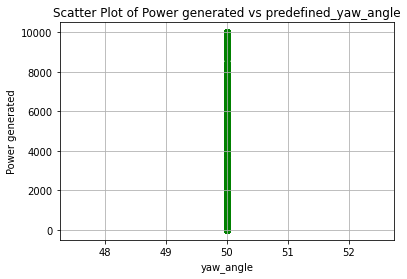

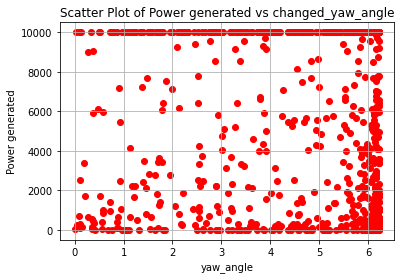

Power_list: [6341.725698362641, 10000.0054603319]
Predefined Yaw Angle 1: 56.18308735730547
Predefined Yaw Angle 2: 56.17352303605637
Changed Yaw Angle 1: 6.1830873573054665
Changed Yaw Angle 2: 6.1735230360563715
farm_power_baseline : [0. 0.], farm_power_yaw : [49.30684124 61.53627044]


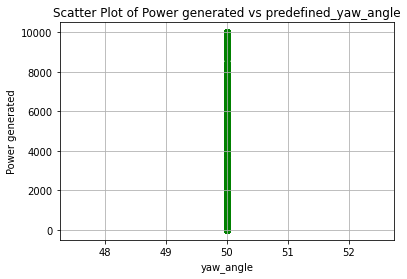

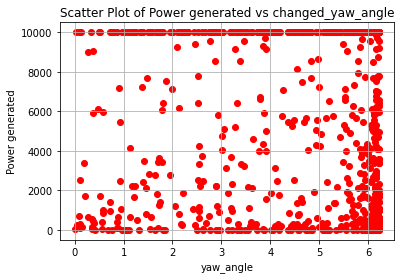

Power_list: [0.0, 63.104280101788135]
Predefined Yaw Angle 1: 56.21844827762732
Predefined Yaw Angle 2: 56.17352303605637
Changed Yaw Angle 1: 6.218448277627321
Changed Yaw Angle 2: 6.1735230360563715
farm_power_baseline : [0. 0.], farm_power_yaw : [ 0.        41.5615621]


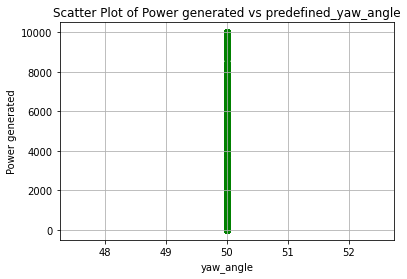

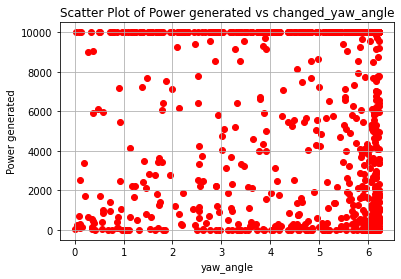

Power_list: [0.0, 43.065142268937464]
Predefined Yaw Angle 1: 56.224967695975835
Predefined Yaw Angle 2: 56.1735033286643
Changed Yaw Angle 1: 6.224967695975835
Changed Yaw Angle 2: 6.173503328664305
farm_power_baseline : [  0.         224.02795234], farm_power_yaw : [ 36.05181348 655.44894505]


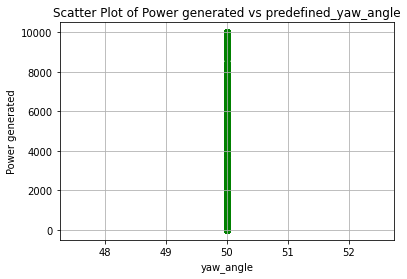

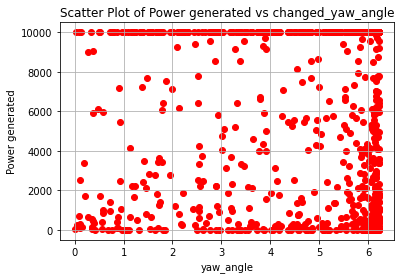

Power_list: [224.02795234349608, 663.8370977431532]
Predefined Yaw Angle 1: 56.14708514779312
Predefined Yaw Angle 2: 56.17315765035481
Changed Yaw Angle 1: 6.1470851477931205
Changed Yaw Angle 2: 6.1731576503548125
farm_power_baseline : [0. 0.], farm_power_yaw : [56.79538548 54.73757502]


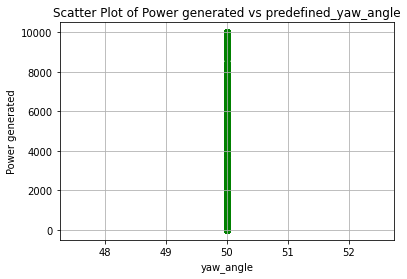

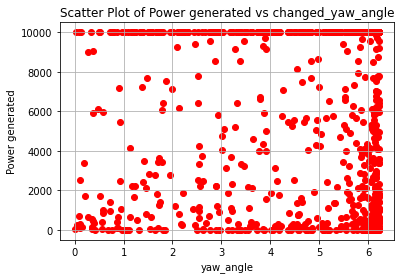

Power_list: [0.0, 58.33691470284283]
Predefined Yaw Angle 1: 55.898311813517765
Predefined Yaw Angle 2: 56.17352303605637
Changed Yaw Angle 1: 5.8983118135177675
Changed Yaw Angle 2: 6.1735230360563715
farm_power_baseline : [7060.51632578 2127.70214296], farm_power_yaw : [10000.00459198  4828.70290834]


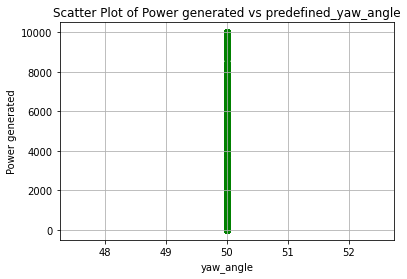

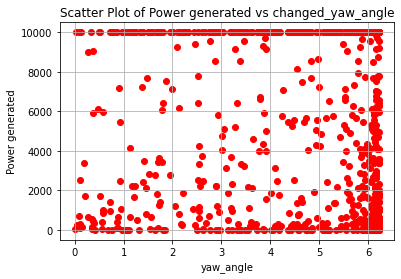

Power_list: [7060.516325778109, 10000.004591979861]
Predefined Yaw Angle 1: 56.22295541145617
Predefined Yaw Angle 2: 56.17352250342415
Changed Yaw Angle 1: 6.22295541145617
Changed Yaw Angle 2: 6.173522503424153
farm_power_baseline : [8168.91035828    0.        ], farm_power_yaw : [9999.99620587    0.        ]


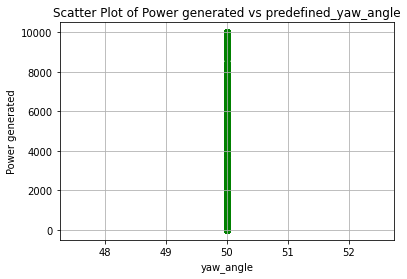

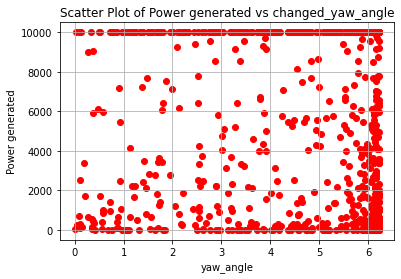

Power_list: [8168.91035828361, 9999.997234390208]
Predefined Yaw Angle 1: 56.16074663155301
Predefined Yaw Angle 2: 56.17352303605637
Changed Yaw Angle 1: 6.1607466315530095
Changed Yaw Angle 2: 6.1735230360563715
farm_power_baseline : [1725.01458533    0.        ], farm_power_yaw : [3.94358624e+03 1.51267691e+00]


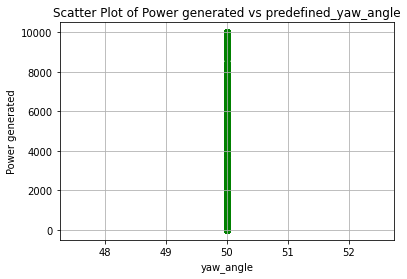

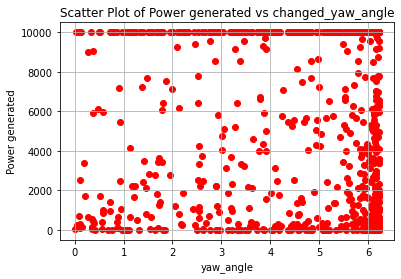

Power_list: [1725.0145853277631, 3985.1842937403767]
Predefined Yaw Angle 1: 56.1902991975374
Predefined Yaw Angle 2: 56.17352303605637
Changed Yaw Angle 1: 6.190299197537401
Changed Yaw Angle 2: 6.1735230360563715
farm_power_baseline : [ 186.39578942 1426.91293328], farm_power_yaw : [ 575.52498188 3300.81789859]


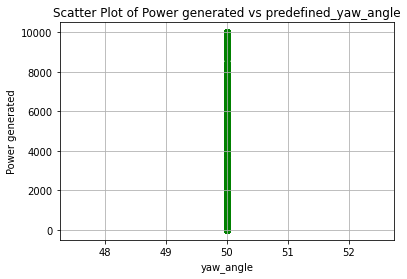

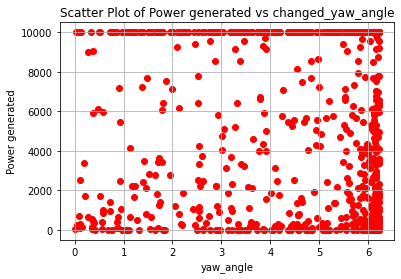

Power_list: [1426.9129332752625, 3335.508293980757]
Predefined Yaw Angle 1: 56.20577376136742
Predefined Yaw Angle 2: 56.17352303605637
Changed Yaw Angle 1: 6.205773761367415
Changed Yaw Angle 2: 6.1735230360563715
farm_power_baseline : [4272.89718965    0.        ], farm_power_yaw : [9.58065379e+03 2.33377471e-01]


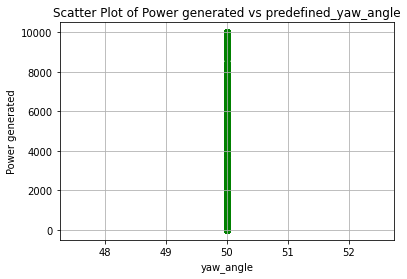

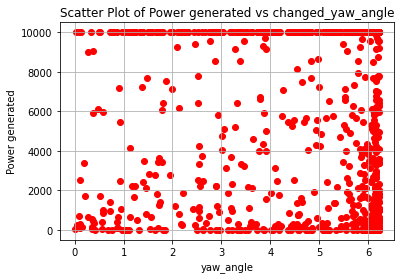

Power_list: [4272.897189652937, 9679.770418062804]
Predefined Yaw Angle 1: 55.45586807844967
Predefined Yaw Angle 2: 56.017740895459966
Changed Yaw Angle 1: 5.4558680784496705
Changed Yaw Angle 2: 6.017740895459968
farm_power_baseline : [1759.52245088    0.        ], farm_power_yaw : [4025.30272377    0.        ]


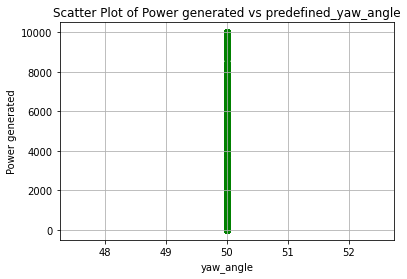

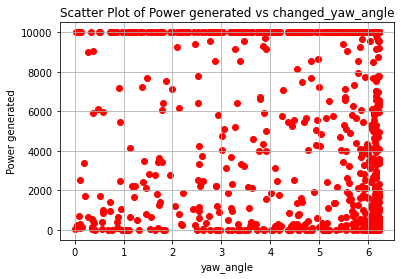

Power_list: [1759.5224508835784, 4061.624534646929]
Predefined Yaw Angle 1: 56.14157400223331
Predefined Yaw Angle 2: 56.17351877499863
Changed Yaw Angle 1: 6.141574002233311
Changed Yaw Angle 2: 6.173518774998628
farm_power_baseline : [1022.8614358    0.       ], farm_power_yaw : [2420.57757723   24.74741373]


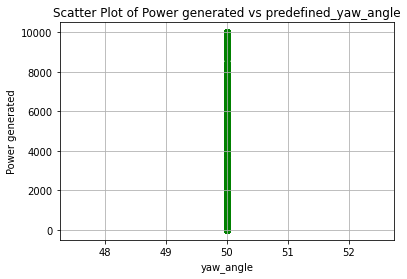

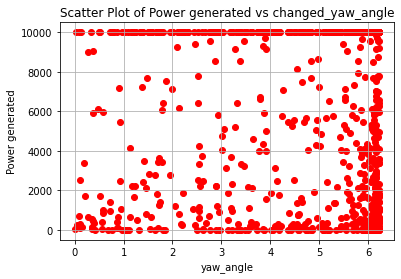

Power_list: [1022.8614358026796, 2447.9991645605037]
Predefined Yaw Angle 1: 56.13937156801182
Predefined Yaw Angle 2: 56.17352303605637
Changed Yaw Angle 1: 6.139371568011815
Changed Yaw Angle 2: 6.1735230360563715
farm_power_baseline : [1406.819411   2798.76197172], farm_power_yaw : [3259.43282249 6351.82053572]


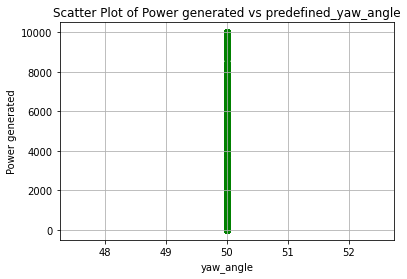

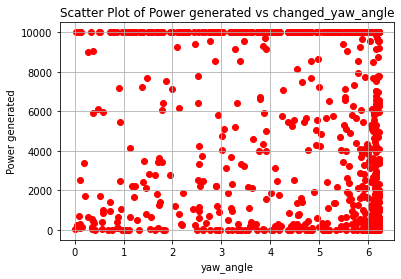

Power_list: [2798.7619717151615, 6419.089619525645]
Predefined Yaw Angle 1: 56.21078423264229
Predefined Yaw Angle 2: 56.110062570440874
Changed Yaw Angle 1: 6.210784232642291
Changed Yaw Angle 2: 6.110062570440873
farm_power_baseline : [1079.30524818  473.32828581], farm_power_yaw : [2550.56573151 1209.5777424 ]


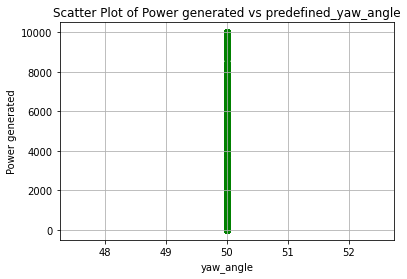

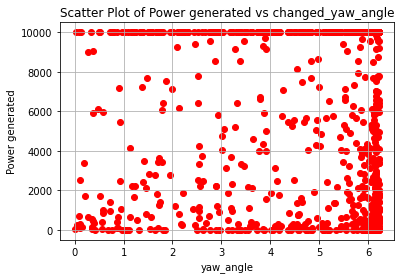

Power_list: [1079.3052481802738, 2578.487355016993]
Predefined Yaw Angle 1: 56.17754691697367
Predefined Yaw Angle 2: 56.1650211605924
Changed Yaw Angle 1: 6.177546916973665
Changed Yaw Angle 2: 6.165021160592403
farm_power_baseline : [1646.1367112  4162.69246974], farm_power_yaw : [3769.43880796 9355.93956957]


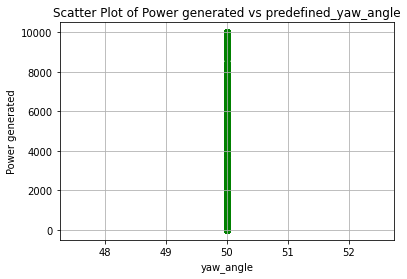

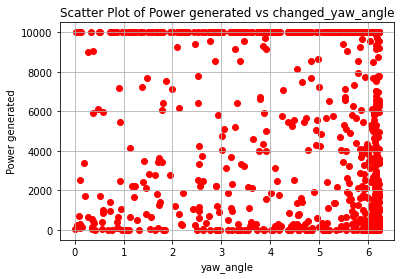

Power_list: [4162.692469735067, 9453.646214717337]
Predefined Yaw Angle 1: 56.0282671504948
Predefined Yaw Angle 2: 56.095947816663454
Changed Yaw Angle 1: 6.028267150494799
Changed Yaw Angle 2: 6.095947816663453
farm_power_baseline : [2791.90317457 6117.32761288], farm_power_yaw : [ 6337.83466865 10000.00126065]


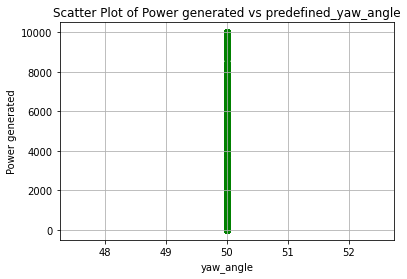

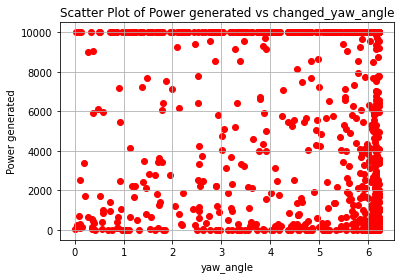

Power_list: [6117.327612877881, 10000.00219450542]
Predefined Yaw Angle 1: 56.20875756705274
Predefined Yaw Angle 2: 56.15575176210227
Changed Yaw Angle 1: 6.20875756705274
Changed Yaw Angle 2: 6.155751762102273
farm_power_baseline : [3041.40968031    0.        ], farm_power_yaw : [6874.92528947  131.7664184 ]


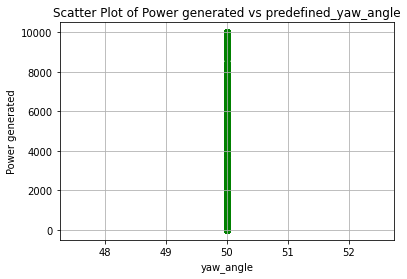

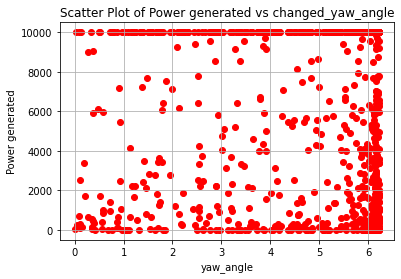

Power_list: [3041.40968031063, 6950.988404228383]
Predefined Yaw Angle 1: 56.174314904674745
Predefined Yaw Angle 2: 55.83715673563166
Changed Yaw Angle 1: 6.174314904674745
Changed Yaw Angle 2: 5.837156735631657
farm_power_baseline : [7717.33061985 6671.15417983], farm_power_yaw : [ 9999.99802018 10000.00552213]


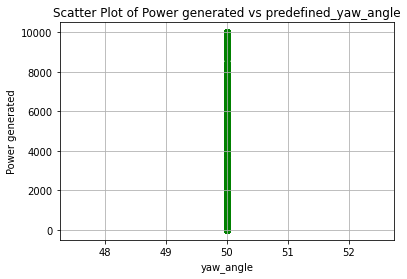

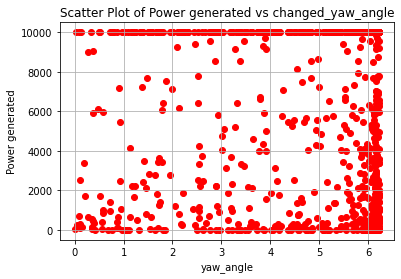

Power_list: [7717.330619852264, 10000.005522133572]
Predefined Yaw Angle 1: 56.2160322578864
Predefined Yaw Angle 2: 56.132568412180916
Changed Yaw Angle 1: 6.2160322578864005
Changed Yaw Angle 2: 6.132568412180915
farm_power_baseline : [10000.00497455     0.        ], farm_power_yaw : [9999.99091375   35.07441912]


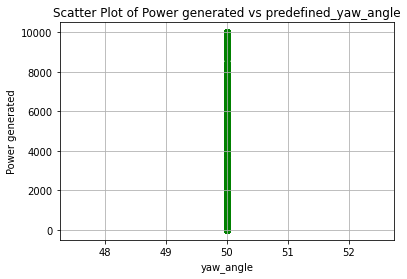

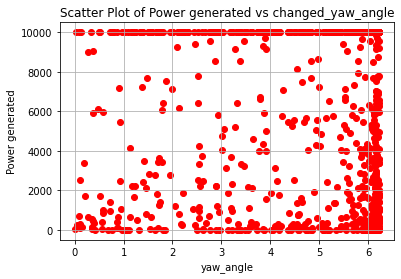

Power_list: [10000.004974553223, 9999.990913746278]
Predefined Yaw Angle 1: 55.88287826236854
Predefined Yaw Angle 2: 55.946429430950914
Changed Yaw Angle 1: 5.88287826236854
Changed Yaw Angle 2: 5.946429430950917
farm_power_baseline : [ 3043.92890657 10000.00583011], farm_power_yaw : [ 6887.04782721 10000.00495218]


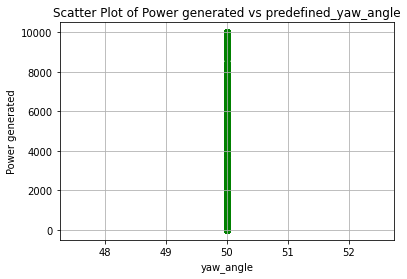

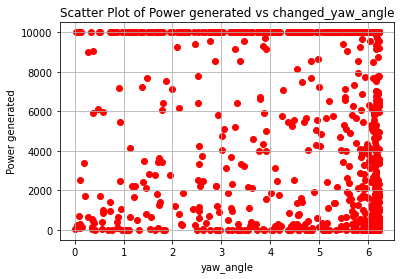

Power_list: [10000.005830113858, 10000.004952182593]
Predefined Yaw Angle 1: 56.2255551893123
Predefined Yaw Angle 2: 56.15584337484377
Changed Yaw Angle 1: 6.225555189312305
Changed Yaw Angle 2: 6.155843374843772
farm_power_baseline : [745.57617424   0.        ], farm_power_yaw : [1811.83433425    0.        ]


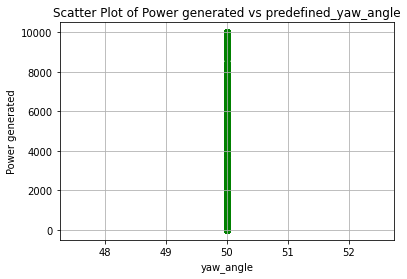

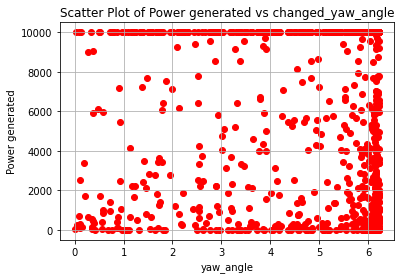

Power_list: [745.5761742350758, 1832.8046793160236]
Predefined Yaw Angle 1: 56.203805152689625
Predefined Yaw Angle 2: 56.07897815419747
Changed Yaw Angle 1: 6.203805152689629
Changed Yaw Angle 2: 6.078978154197468
farm_power_baseline : [   0.         9329.78041562], farm_power_yaw : [    0.         10000.00263682]


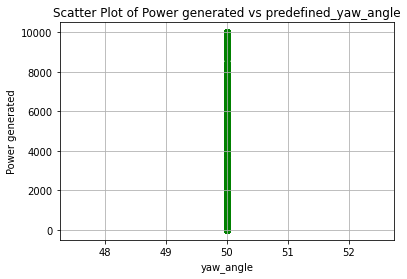

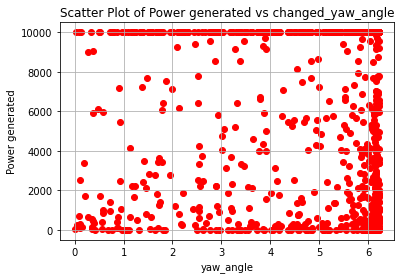

Power_list: [9329.780415619092, 10000.00263681954]
Predefined Yaw Angle 1: 56.07387591469128
Predefined Yaw Angle 2: 56.10486940631522
Changed Yaw Angle 1: 6.073875914691278
Changed Yaw Angle 2: 6.104869406315219
farm_power_baseline : [1182.56329672   65.27039603], farm_power_yaw : [2758.40583707  301.74921996]


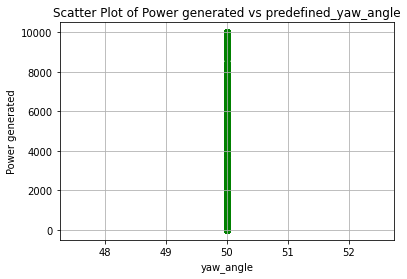

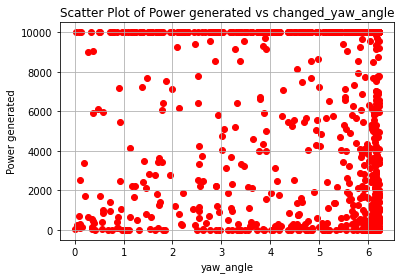

Power_list: [1182.5632967204265, 2786.421401205829]
Predefined Yaw Angle 1: 56.18016267379634
Predefined Yaw Angle 2: 56.070874155000354
Changed Yaw Angle 1: 6.1801626737963415
Changed Yaw Angle 2: 6.070874155000357
farm_power_baseline : [ 6613.8506474  10000.00454722], farm_power_yaw : [10000.0056757  10000.01377145]


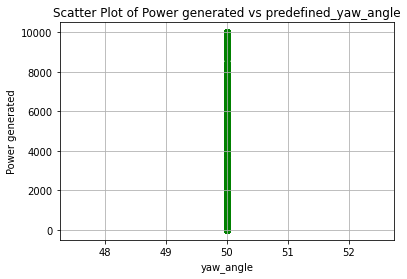

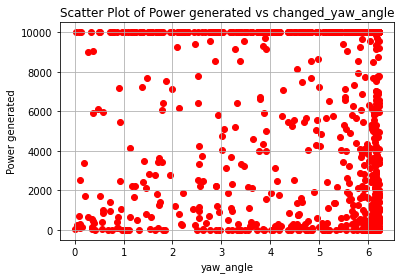

Power_list: [10000.004547217346, 10000.013771449747]
Predefined Yaw Angle 1: 56.22787267209289
Predefined Yaw Angle 2: 56.15821678400725
Changed Yaw Angle 1: 6.227872672092893
Changed Yaw Angle 2: 6.158216784007251
farm_power_baseline : [   0.         3060.36476359], farm_power_yaw : [ 134.13742115 6917.38386582]


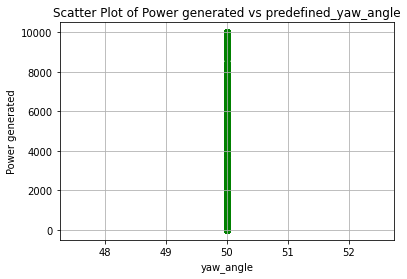

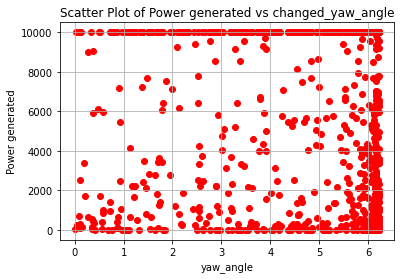

Power_list: [3060.364763594211, 6993.870770979374]
Predefined Yaw Angle 1: 56.20812906103548
Predefined Yaw Angle 2: 55.84104015713321
Changed Yaw Angle 1: 6.208129061035481
Changed Yaw Angle 2: 5.841040157133211
farm_power_baseline : [5339.64930465 9999.9920941 ], farm_power_yaw : [ 9999.99649364 10000.01644215]


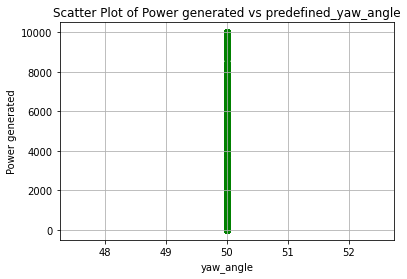

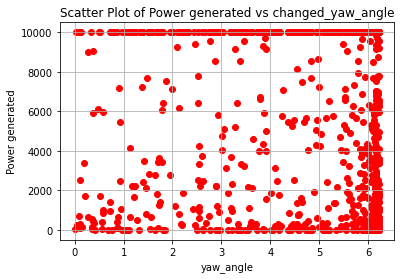

Power_list: [9999.992094103616, 10000.017731474349]
Predefined Yaw Angle 1: 56.2249549128026
Predefined Yaw Angle 2: 56.17346977283457
Changed Yaw Angle 1: 6.224954912802602
Changed Yaw Angle 2: 6.17346977283457
farm_power_baseline : [10000.00115502   207.73345889], farm_power_yaw : [10000.01417818   621.63753444]


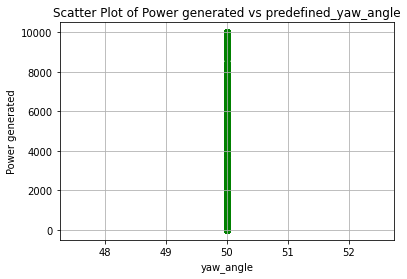

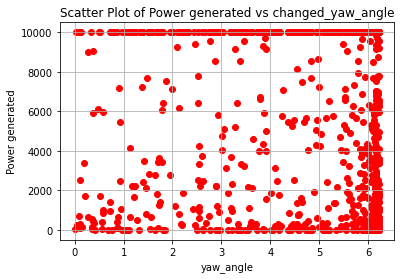

Power_list: [10000.001155023412, 10000.014178178444]
Predefined Yaw Angle 1: 56.075635198907385
Predefined Yaw Angle 2: 56.14176910111492
Changed Yaw Angle 1: 6.075635198907385
Changed Yaw Angle 2: 6.141769101114921
farm_power_baseline : [   0.         6376.91257312], farm_power_yaw : [    0.         10000.00501071]


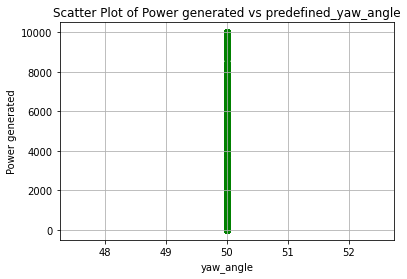

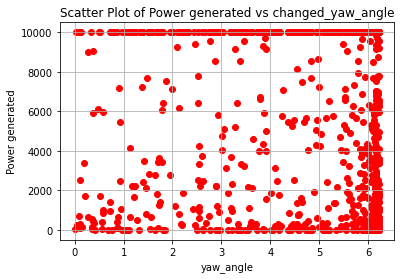

Power_list: [6376.912573115425, 10000.005972431754]
Predefined Yaw Angle 1: 56.217532150212335
Predefined Yaw Angle 2: 56.15727189445249
Changed Yaw Angle 1: 6.217532150212333
Changed Yaw Angle 2: 6.1572718944524905
farm_power_baseline : [  0.         260.14362247], farm_power_yaw : [  0.         730.42283699]


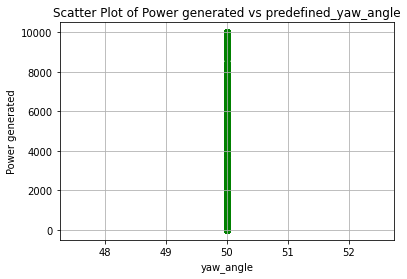

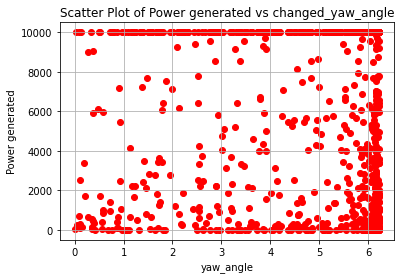

Power_list: [260.14362247322066, 739.0539341858831]
Predefined Yaw Angle 1: 56.18019409909721
Predefined Yaw Angle 2: 55.95413022755899
Changed Yaw Angle 1: 6.180194099097204
Changed Yaw Angle 2: 5.95413022755899
farm_power_baseline : [0. 0.], farm_power_yaw : [32.88933312  0.        ]


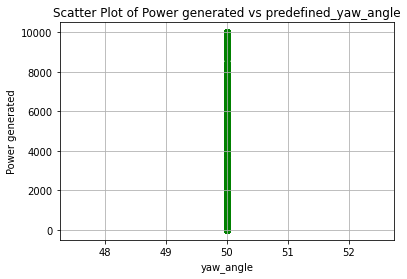

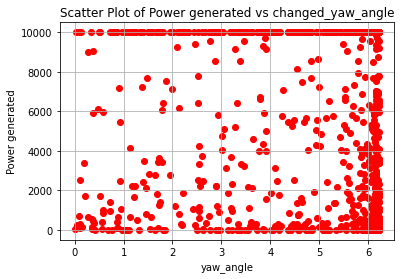

Power_list: [0.0, 34.3007071945763]
Predefined Yaw Angle 1: 56.21342715370808
Predefined Yaw Angle 2: 56.160874618775146
Changed Yaw Angle 1: 6.213427153708085
Changed Yaw Angle 2: 6.160874618775149
farm_power_baseline : [4499.74007096 2533.75459619], farm_power_yaw : [9999.98738907 5731.86193044]


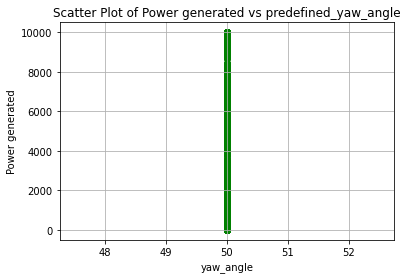

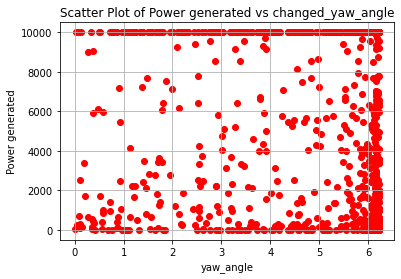

Power_list: [4499.740070964171, 9999.988233444734]
Predefined Yaw Angle 1: 56.22350881633069
Predefined Yaw Angle 2: 56.14379470144004
Changed Yaw Angle 1: 6.223508816330689
Changed Yaw Angle 2: 6.143794701440035
farm_power_baseline : [303.26658363 804.54479878], farm_power_yaw : [ 829.74778764 1947.63005027]


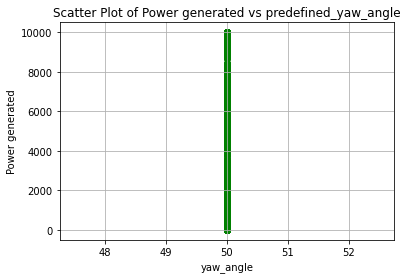

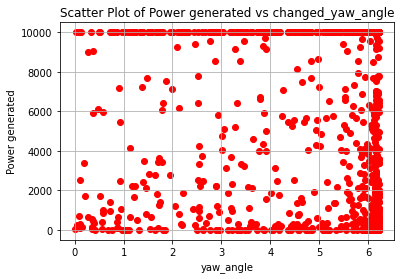

Power_list: [804.5447987809116, 1970.2654174617508]
Predefined Yaw Angle 1: 56.17156066347538
Predefined Yaw Angle 2: 56.162143348718466
Changed Yaw Angle 1: 6.171560663475385
Changed Yaw Angle 2: 6.162143348718463
farm_power_baseline : [2180.75379438 4048.86385263], farm_power_yaw : [4950.76468824 9111.52200037]


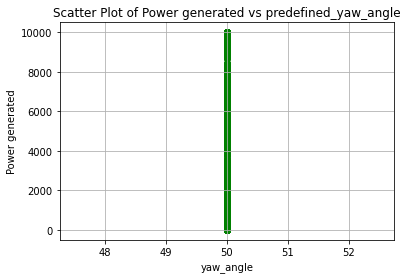

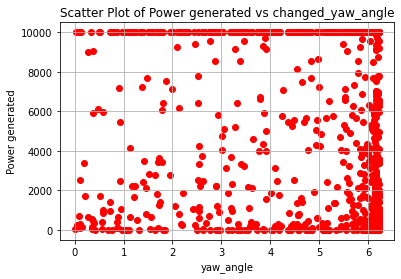

Power_list: [4048.8638526306136, 9208.197248602122]
Predefined Yaw Angle 1: 56.226602344252925
Predefined Yaw Angle 2: 56.16736207919058
Changed Yaw Angle 1: 6.226602344252925
Changed Yaw Angle 2: 6.167362079190583
farm_power_baseline : [4971.14206727  800.05208121], farm_power_yaw : [9999.99526795 1938.14109376]


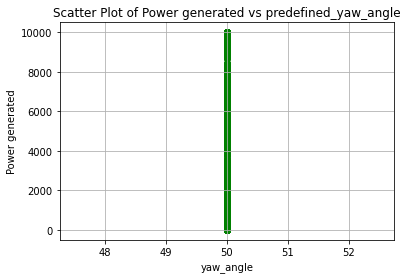

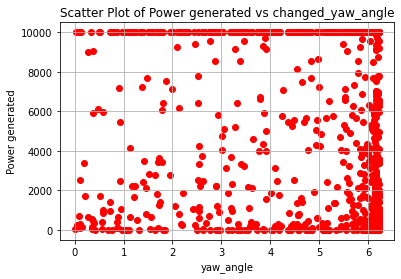

Power_list: [4971.1420672678605, 9999.996144008219]
Predefined Yaw Angle 1: 56.099767699441244
Predefined Yaw Angle 2: 56.08244878573006
Changed Yaw Angle 1: 6.099767699441247
Changed Yaw Angle 2: 6.08244878573006
farm_power_baseline : [    0.         10000.00150596], farm_power_yaw : [    0.         10000.01413236]


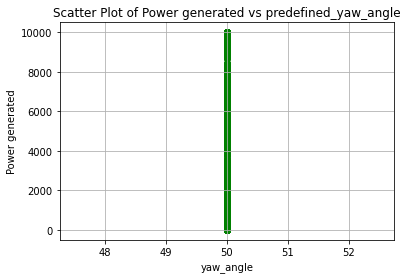

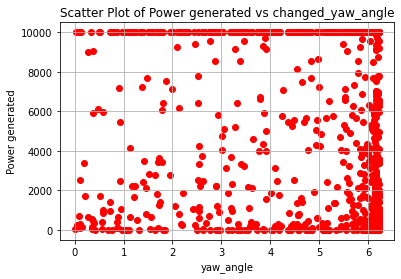

Power_list: [10000.001505962742, 10000.014132360473]
Predefined Yaw Angle 1: 53.66106048919498
Predefined Yaw Angle 2: 56.16947077014171
Changed Yaw Angle 1: 3.6610604891949774
Changed Yaw Angle 2: 6.169470770141707
farm_power_baseline : [2226.91651542 6365.96298092], farm_power_yaw : [ 5080.6429241 10000.0051503]


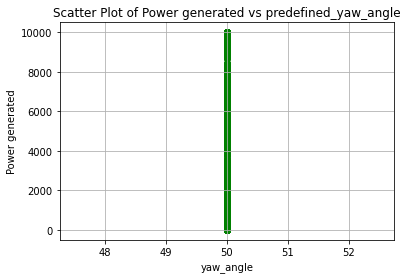

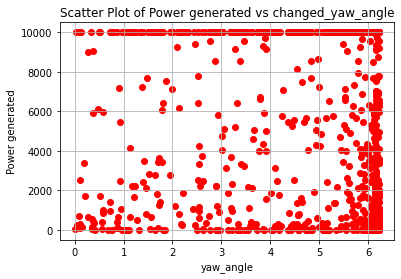

Power_list: [6365.962980919439, 10000.005813074496]
Predefined Yaw Angle 1: 56.22804098387378
Predefined Yaw Angle 2: 56.16089752196052
Changed Yaw Angle 1: 6.228040983873786
Changed Yaw Angle 2: 6.160897521960524
farm_power_baseline : [  20.58422221 1303.41163342], farm_power_yaw : [ 182.3255167  3024.22890877]


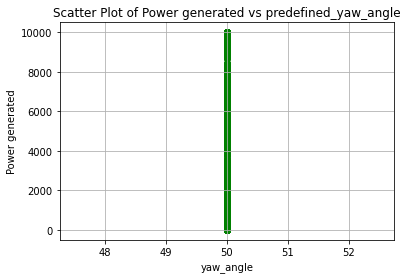

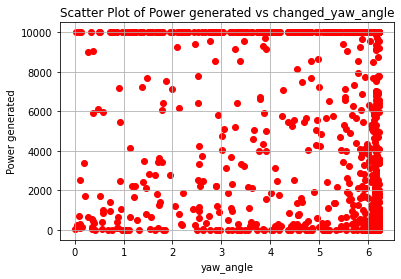

Power_list: [1303.4116334152645, 3058.0450259558083]
Predefined Yaw Angle 1: 56.208484859357114
Predefined Yaw Angle 2: 56.164719690757
Changed Yaw Angle 1: 6.208484859357116
Changed Yaw Angle 2: 6.164719690757006
farm_power_baseline : [ 172.76058545 2276.16868666], farm_power_yaw : [ 538.42568871 5180.88263242]


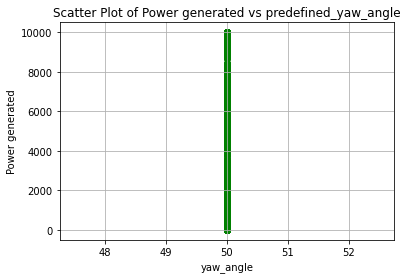

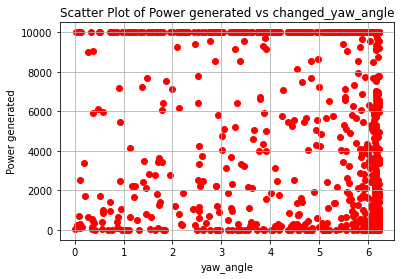

Power_list: [2276.16868666143, 5238.5207429320835]
Predefined Yaw Angle 1: 56.228350443192454
Predefined Yaw Angle 2: 56.10387018827422
Changed Yaw Angle 1: 6.228350443192453
Changed Yaw Angle 2: 6.103870188274222
farm_power_baseline : [   0.        1828.9042519], farm_power_yaw : [   0.         4179.91784885]


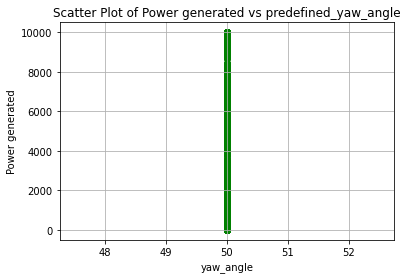

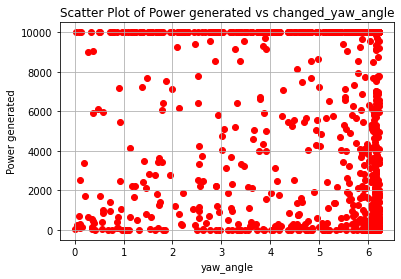

Power_list: [1828.904251904679, 4227.697449212182]
Predefined Yaw Angle 1: 56.2278401815276
Predefined Yaw Angle 2: 55.90661623791867
Changed Yaw Angle 1: 6.227840181527593
Changed Yaw Angle 2: 5.906616237918668
farm_power_baseline : [ 9999.99308526 10000.00304626], farm_power_yaw : [10000.01680099 10000.01394811]


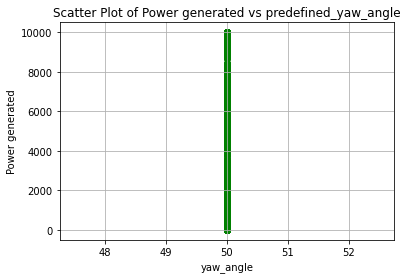

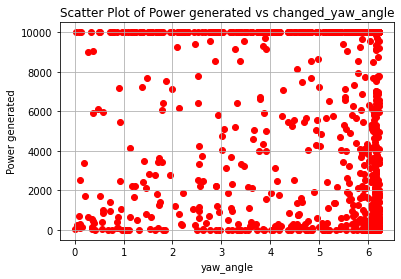

Power_list: [10000.00304626301, 10000.016800990445]
Predefined Yaw Angle 1: 56.228352573721324
Predefined Yaw Angle 2: 56.16955545866437
Changed Yaw Angle 1: 6.228352573721325
Changed Yaw Angle 2: 6.169555458664371
farm_power_baseline : [10000.00422811 10000.00290777], farm_power_yaw : [9999.97262212 9999.96615166]


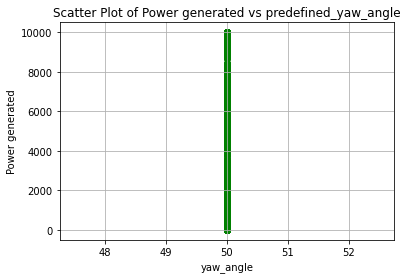

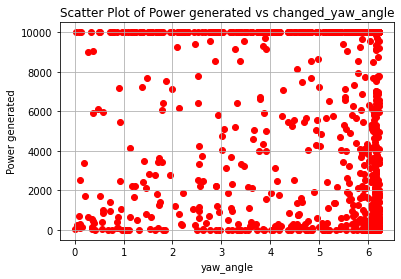

Power_list: [10000.004228109134, 9999.972622117239]
Predefined Yaw Angle 1: 56.22835417161798
Predefined Yaw Angle 2: 56.168351709851656
Changed Yaw Angle 1: 6.228354171617979
Changed Yaw Angle 2: 6.168351709851656
farm_power_baseline : [   0.         1621.28485825], farm_power_yaw : [   0.         3714.22842536]


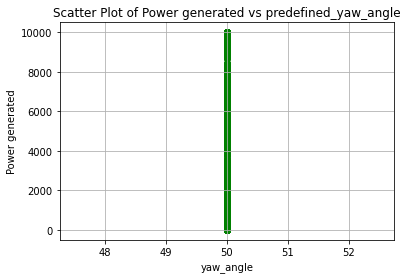

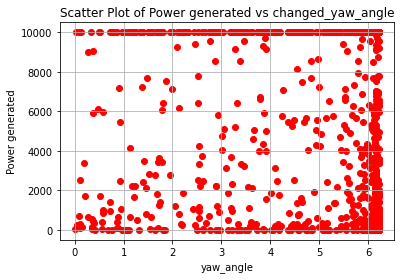

Power_list: [1621.2848582509525, 3755.406960393084]
Predefined Yaw Angle 1: 56.2278700089318
Predefined Yaw Angle 2: 56.169817513715635
Changed Yaw Angle 1: 6.227870008931802
Changed Yaw Angle 2: 6.1698175137156355
farm_power_baseline : [9999.99574965 3111.38060671], farm_power_yaw : [10000.00172117  7032.23183235]


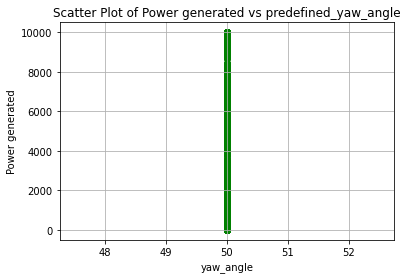

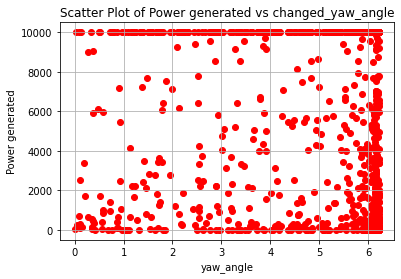

Power_list: [9999.99574964618, 10000.001721169636]
Predefined Yaw Angle 1: 56.22835417161798
Predefined Yaw Angle 2: 56.11395824248344
Changed Yaw Angle 1: 6.228354171617979
Changed Yaw Angle 2: 6.1139582424834416
farm_power_baseline : [10000.00584812   506.79397354], farm_power_yaw : [10000.00549561  1288.05088909]


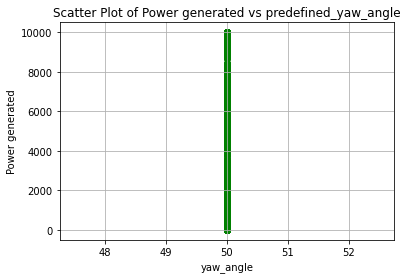

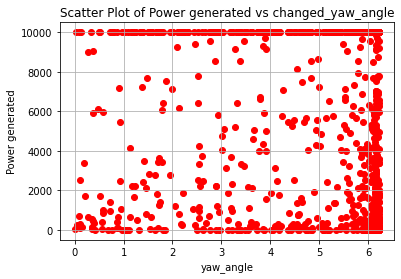

Power_list: [10000.005848121971, 10000.005495607122]
Predefined Yaw Angle 1: 56.2283488452958
Predefined Yaw Angle 2: 56.169005249583165
Changed Yaw Angle 1: 6.228348845295799
Changed Yaw Angle 2: 6.1690052495831615
farm_power_baseline : [4146.43543708 9999.99726717], farm_power_yaw : [ 9321.83324764 10000.01464114]


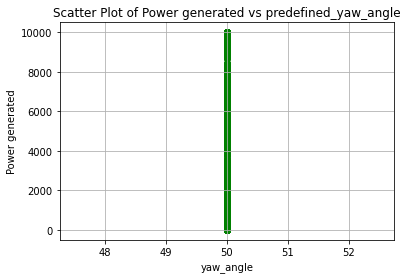

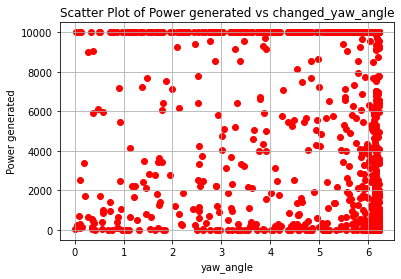

Power_list: [9999.997267172592, 10000.014641136218]
Predefined Yaw Angle 1: 56.11995446050405
Predefined Yaw Angle 2: 56.17275018670803
Changed Yaw Angle 1: 6.119954460504048
Changed Yaw Angle 2: 6.172750186708031
farm_power_baseline : [4052.07533034 1337.31188891], farm_power_yaw : [9119.558264   3101.72471667]


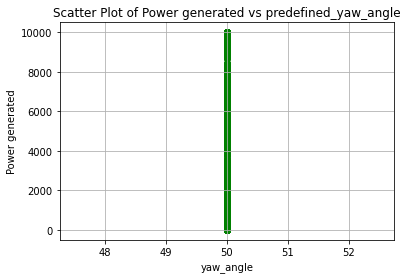

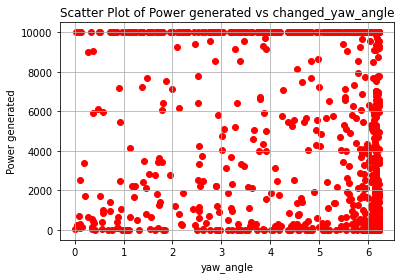

Power_list: [4052.075330343286, 9215.620260339272]
Predefined Yaw Angle 1: 55.878994308234766
Predefined Yaw Angle 2: 56.14375155823038
Changed Yaw Angle 1: 5.878994308234768
Changed Yaw Angle 2: 6.143751558230376
farm_power_baseline : [2162.32644868 1458.43716334], farm_power_yaw : [4909.02712999 3363.97906611]


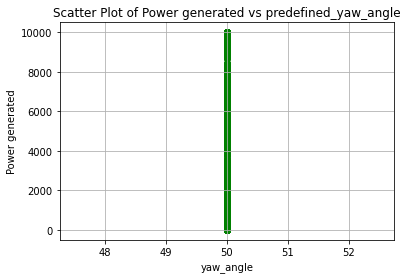

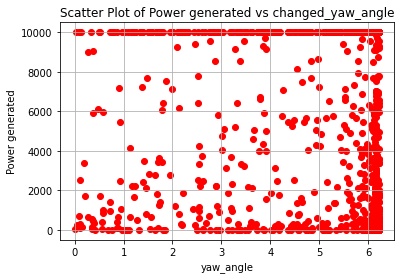

Power_list: [2162.3264486845083, 4962.519227756091]
355.98822 358.17117
Predefined Yaw Angle 1: 56.15833540550205
Predefined Yaw Angle 2: 56.14160398512733
Changed Yaw Angle 1: 6.158335405502052
Changed Yaw Angle 2: 6.141603985127336
farm_power_baseline : [106.3342722  12.5385596], farm_power_yaw : [391.53833874 165.68474697]


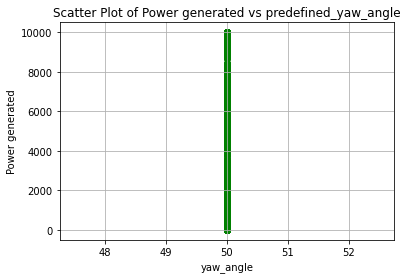

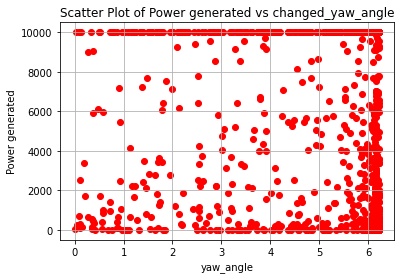

Power_list: [106.33427219698986, 397.3533206904525]
Wind_Direction:  4.307070255279541

Speed1:  2.7418479919433594
 
Speed2:  4.083531856536865
 
Turbulance Intensity:  0.2142377495765686
 
Vear:  1.107823371887207
 
Sheer:  0.17747242748737335
 
Episode:  1 Score:  397.3533206904525
------------------------------------
358.73746 359.49878
Predefined Yaw Angle 1: 56.20631864412645
Predefined Yaw Angle 2: 56.16477508450768
Changed Yaw Angle 1: 6.206318644126445
Changed Yaw Angle 2: 6.16477508450768
farm_power_baseline : [5020.34236543 9999.99570726], farm_power_yaw : [ 9999.99602657 10000.00194269]


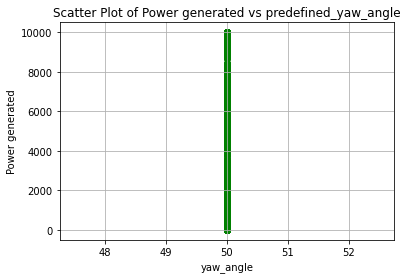

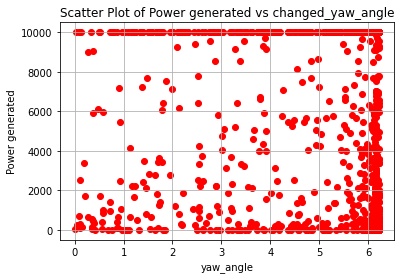

Power_list: [9999.995707260448, 10000.001942694711]
Wind_Direction:  236.2246856689453

Speed1:  7.931939601898193
 
Speed2:  2.315222978591919
 
Turbulance Intensity:  0.08205249160528183
 
Vear:  -0.5357267260551453
 
Sheer:  -0.3996794819831848
 
Episode:  2 Score:  10397.355263385163
------------------------------------
347.4235 347.51416
Predefined Yaw Angle 1: 56.00885270614812
Predefined Yaw Angle 2: 55.955604020906236
Changed Yaw Angle 1: 6.008852706148122
Changed Yaw Angle 2: 5.9556040209062395
farm_power_baseline : [8106.34821685  219.89025025], farm_power_yaw : [9999.99554896  647.43796504]


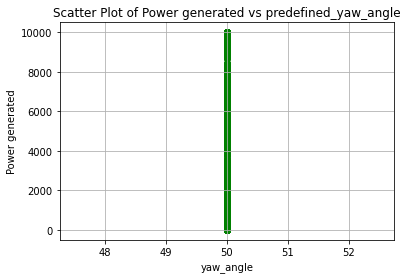

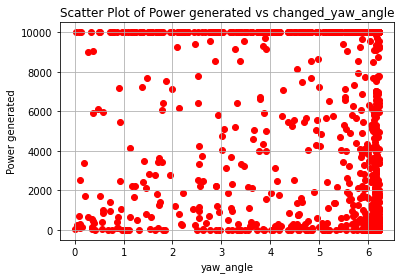

Power_list: [8106.348216850958, 9999.996504544473]
Wind_Direction:  344.11297607421875

Speed1:  16.669776916503906
 
Speed2:  11.417553901672363
 
Turbulance Intensity:  0.3050876259803772
 
Vear:  -0.659418523311615
 
Sheer:  0.06054063141345978
 
Episode:  3 Score:  20397.351767929635
------------------------------------
350.16705 354.27954
Predefined Yaw Angle 1: 56.056736875179965
Predefined Yaw Angle 2: 56.07368219205374
Changed Yaw Angle 1: 6.056736875179965
Changed Yaw Angle 2: 6.073682192053737
farm_power_baseline : [9999.99321775 1315.08175013], farm_power_yaw : [10000.01603426  3052.12656102]


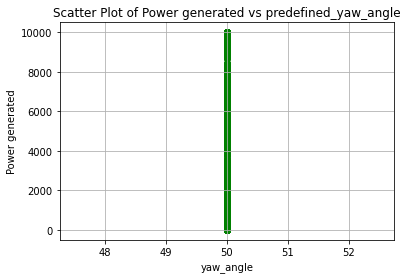

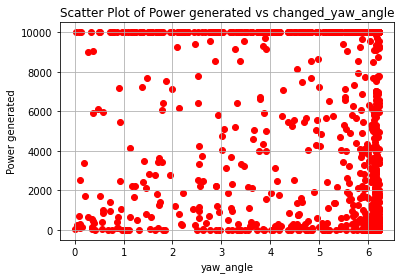

Power_list: [9999.993217750383, 10000.016034264789]
Wind_Direction:  210.69815063476562

Speed1:  1.7442280054092407
 
Speed2:  11.307977676391602
 
Turbulance Intensity:  0.41172879934310913
 
Vear:  0.7409150004386902
 
Sheer:  -0.36108770966529846
 
Episode:  4 Score:  30397.36780219442
------------------------------------
359.98193 358.85074
Predefined Yaw Angle 1: 56.22803885334491
Predefined Yaw Angle 2: 56.15346463935811
Changed Yaw Angle 1: 6.228038853344914
Changed Yaw Angle 2: 6.153464639358113
farm_power_baseline : [2482.50708654    0.        ], farm_power_yaw : [5621.59307332    0.        ]


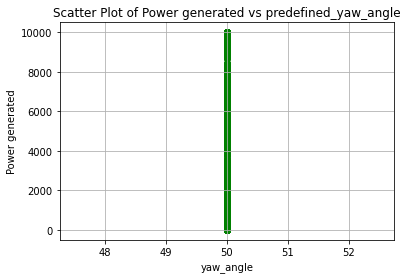

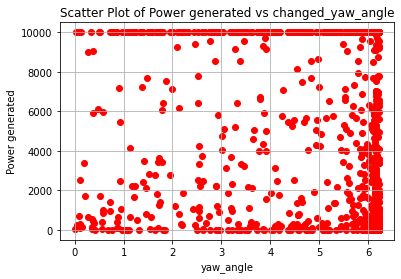

Power_list: [2482.507086543456, 5680.928502988275]
Wind_Direction:  295.3965759277344

Speed1:  2.066542625427246
 
Speed2:  8.714402198791504
 
Turbulance Intensity:  0.47519201040267944
 
Vear:  0.6630463004112244
 
Sheer:  -0.29336419701576233
 
Episode:  5 Score:  36078.296305182696
------------------------------------
65.83792 349.57782
Predefined Yaw Angle 1: 51.09425736104477
Predefined Yaw Angle 2: 55.99162167675291
Changed Yaw Angle 1: 1.0942573610447677
Changed Yaw Angle 2: 5.991621676752907
farm_power_baseline : [6348.04386607    0.        ], farm_power_yaw : [10000.005075      59.01812652]


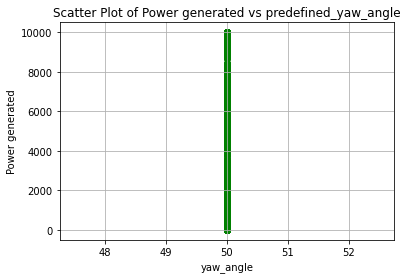

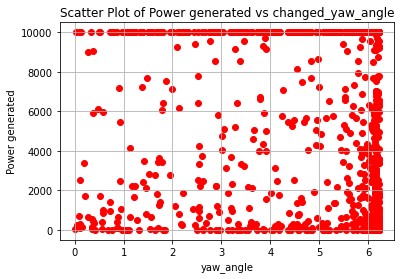

Power_list: [6348.043866074586, 10000.00555228473]
Wind_Direction:  60.38167953491211

Speed1:  17.23579978942871
 
Speed2:  14.022007942199707
 
Turbulance Intensity:  0.719885528087616
 
Vear:  1.2394026517868042
 
Sheer:  0.0640525370836258
 
Episode:  6 Score:  46078.30185746743
------------------------------------
336.36267 354.22742
Predefined Yaw Angle 1: 55.81580495241824
Predefined Yaw Angle 2: 56.072772456225366
Changed Yaw Angle 1: 5.81580495241824
Changed Yaw Angle 2: 6.0727724562253655
farm_power_baseline : [6419.95373368 2793.22044217], farm_power_yaw : [10000.00568568  6343.39524826]


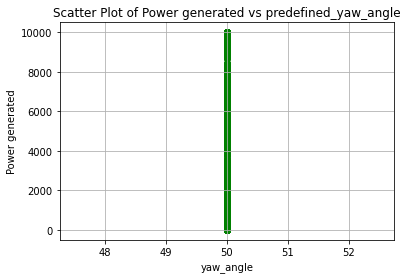

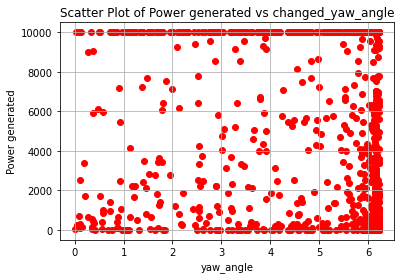

Power_list: [6419.953733678824, 10000.006007562055]
Wind_Direction:  41.7277946472168

Speed1:  2.272167921066284
 
Speed2:  11.25033187866211
 
Turbulance Intensity:  0.11015666276216507
 
Vear:  -0.4844720661640167
 
Sheer:  -0.20300926268100739
 
Episode:  7 Score:  56078.307865029485
------------------------------------
329.76385 356.71622
Predefined Yaw Angle 1: 55.70063388791667
Predefined Yaw Angle 2: 56.11621021150121
Changed Yaw Angle 1: 5.700633887916673
Changed Yaw Angle 2: 6.116210211501213
farm_power_baseline : [9799.00701729 4995.66639461], farm_power_yaw : [10000.00100794  9999.99572332]


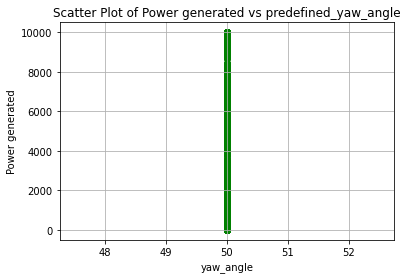

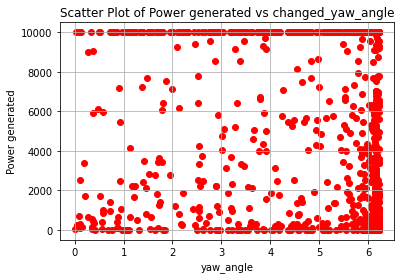

Power_list: [9799.007017292864, 10000.002759200754]
Wind_Direction:  314.303955078125

Speed1:  15.443025588989258
 
Speed2:  9.766681671142578
 
Turbulance Intensity:  0.9206669926643372
 
Vear:  -0.44355306029319763
 
Sheer:  0.4596644639968872
 
Episode:  8 Score:  66078.31062423025
------------------------------------
351.39508 355.54218
Predefined Yaw Angle 1: 56.07816999563292
Predefined Yaw Angle 2: 56.095719317441926
Changed Yaw Angle 1: 6.078169995632923
Changed Yaw Angle 2: 6.095719317441925
farm_power_baseline : [10000.00552862   590.89063006], farm_power_yaw : [10000.01129544  1468.92097819]


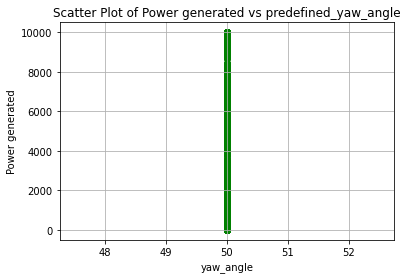

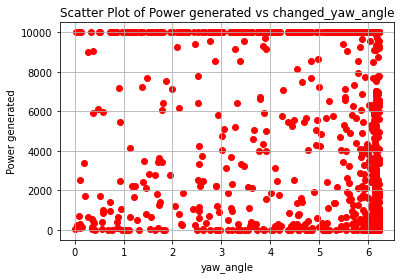

Power_list: [10000.00552861978, 10000.011295441054]
Wind_Direction:  269.2501220703125

Speed1:  12.439261436462402
 
Speed2:  1.4552996158599854
 
Turbulance Intensity:  0.9688297510147095
 
Vear:  1.440003514289856
 
Sheer:  0.3823077976703644
 
Episode:  9 Score:  76078.3219196713
------------------------------------
110.758 357.69543
Predefined Yaw Angle 1: 51.87826069382129
Predefined Yaw Angle 2: 56.133300781480685
Changed Yaw Angle 1: 1.8782606938212871
Changed Yaw Angle 2: 6.133300781480687
farm_power_baseline : [2318.23710153  323.40985032], farm_power_yaw : [5299.72391278  885.88753343]


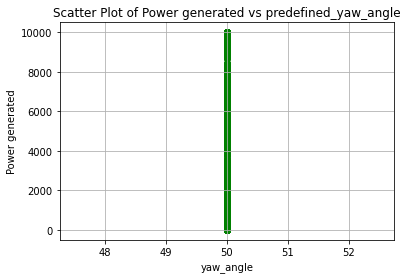

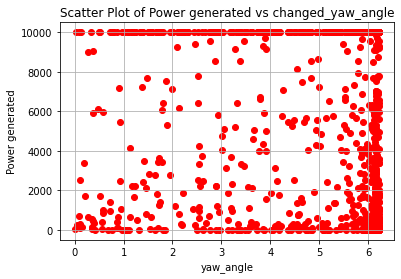

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Power_list: [2318.237101531347, 5330.885535578616]
Wind_Direction:  6.884406089782715

Speed1:  4.6682586669921875
 
Speed2:  15.263489723205566
 
Turbulance Intensity:  0.7599601745605469
 
Vear:  -0.507563054561615
 
Sheer:  0.21905237436294556
 
Episode:  10 Score:  81409.20745524993
------------------------------------
Predefined Yaw max power list: [106.33427219698986, 10106.329979457438, 18212.678196308396, 28212.67141405878, 30695.178500602236, 37043.222366676826, 43463.17610035565, 53262.183117648514, 63262.188646268296, 65580.42574779964]
Changed Yaw max Power list: [397.3533206904525, 10397.355263385163, 20397.351767929635, 30397.36780219442, 36078.296305182696, 46078.30185746743, 56078.307865029485, 66078.31062423025, 76078.3219196713, 81409.20745524993]


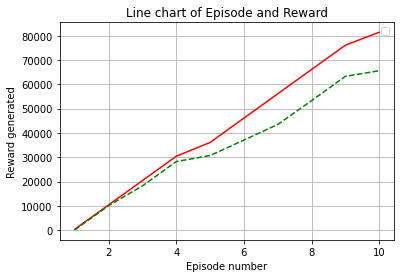

Mean of Predefined Yaw Power:  34994.438834137276
Mean of Changed Yaw Power:  34994.438834137276
StdDev of Predefined Yaw Power 27635.99523606746
StdDev of Changed Yaw Power 27635.99523606746


In [6]:
model = SAC(MlpPolicy, env, verbose=1)
model.learn(total_timesteps=500)
model.save("sac_wind_farm")

#del model remove to demonstrate saving and loading

#model = SAC.load("sac_wind_farm")

obs = env.reset()

episodes = 10
#done = False
ep_list = [i for i in range(1,11)]
score1 = 0
score2 = 0
rew = []
base_power = []
for episode in range(1, episodes+1):
    obs = env.reset() 
    #done = False
    #score = 0
    action, _states = model.predict(obs)
    print(action[0],action[1])
    obs, reward, done, info = env.step(action)
    #wind_direction - obs[0]
    #speed1 - obs[1]
    #speed2 - obs[2]
    #TI - obs[3]
    #vear - obs[4]
    #sheer - obs[5]
    print('Wind_Direction:  {}\n'.format(obs[0]))
    print('Speed1:  {}\n '.format(obs[1]))
    print('Speed2:  {}\n '.format(obs[2]))
    print('Turbulance Intensity:  {}\n '.format(obs[3]))
    print('Vear:  {}\n '.format(obs[4]))
    print('Sheer:  {}\n '.format(obs[5]))
    if done==True:
        break
    else:
        score1+=reward
        rew.append(score1)
        score2+=info.get('power')
        base_power.append(score2)
        
    print('Episode:  {} Score:  {}'.format(episode, score1))
    print("------------------------------------")

print('Predefined Yaw max power list:',base_power)
print('Changed Yaw max Power list:',rew)
plt.plot(ep_list, rew, color ="red")
plt.plot(ep_list,base_power,'--',color = "green")
plt.title('Line chart of Episode and Reward')
plt.xlabel('Episode number')
plt.ylabel('Reward generated')
plt.legend()
plt.grid()
plt.show()
print("Mean of Predefined Yaw Power: ",statistics.mean(base_power))
print("Mean of Changed Yaw Power: ",statistics.mean(base_power))
print("StdDev of Predefined Yaw Power",statistics.stdev(rew))
print("StdDev of Changed Yaw Power",statistics.stdev(rew))